1. 간단한 전처리만 수행한 데이터(결측치, categorical feature encoding)를 바로 Random Forest에 돌린 결과를 baseline으로 선정.
(Linear Regression은 사용하지 않았습니다. 왜냐면 categorical feature와 binary feature가 많은 경우에 동작하지 않을 것을 어느정도 예상했기 때문입니다)


2. 3가지 feature engineering 방법을 사용합니다.
- 우선 categorical feature는 모두 one-hot encoding을 합니다.


> 2-1. Correlation check (threshold는 0.9로 세팅)

> 2-2. feature importance가 0.1을 넘는 feature만 선택

> 2-3. PCA로 90%를 보존하는 차원으로 차원감소



3. 해당 모델마다 동일한 범위 내에서 optuna로 hyper-parameter tuning을 수행하여 성능을 비교합니다. 비교하여 성능이 높은 feature engineering 기법을 고릅니다.

> train-validation split은 9:1로 합니다.


4. LightGBM으로 모델을 변경 후, optuna로 hyper-parameter tuning을 열심히 돌립니다.


5. 최종 모델 선정

## 1. 라이브러리, 데이터 불러오기

In [1]:
# 데이터분석 4종 세트
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# 모델들, 성능 평가
# (일반적으로 정형데이터로 머신러닝 분석할 때는 이 2개 모델은 그냥 돌려봅니다. 특히 RF가 테스트하기 좋습니다.)
from sklearn.ensemble import RandomForestRegressor
from lightgbm.sklearn import LGBMRegressor

# KFold(CV), partial : optuna를 사용하기 위함
from sklearn.model_selection import KFold
from functools import partial

# hyper-parameter tuning을 위한 라이브러리, optuna
import optuna

In [2]:
# 데이터를 불러옵니다.
train = pd.read_csv('./train.csv')
test = pd.read_csv("./test.csv")
submission = pd.read_csv("./sample_submission.csv")

## 2. EDA

#### 찾은 특징들


1. 결측치 : 없음


2. dtype이 object인 column : X0 ~ X8까지 8개. (categorical feature)

> -> 어떻게 처리할지 고민해야함. (Ordinal Encoding VS One-Hot Encoding)

> -> categorical feature들은 종류 정보들이 알파벳으로 되어있으며(anomynized) 이 정보들 대비 target값의 차이가 있는지 확인.
(특별하게 관련 없음)

> -> binary feature들중에서 0만 가지고 있는 column들이 있음.

> -> 정보가 충분하지 않다고 판단(target value와의 관련성 0) 삭제.


3. target distribution
> -> train data에 180을 넘는 데이터가 하나 있음. 이 데이터를 outlier라고 생각하고 제거.

### 3. 전처리

#### 결측치 처리

In [3]:
# 결측치가 있는 column
train[train.isnull().any(axis=1)]

,ID,y,X0,X1,X2,X3,X4,X5,X6,X8,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385


In [4]:
test[test.isnull().any(axis=1)]

,ID,X0,X1,X2,X3,X4,X5,X6,X8,X10,...,X375,X376,X377,X378,X379,X380,X382,X383,X384,X385


#### Feature 구분

- X0 ~ X8 : categorical feature

- other features : binary feature(0 / 1)

In [5]:
categorical_features = train.columns[2:10]
categorical_features

Index(['X0', 'X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X8'], dtype='object')

In [6]:
temp = train.columns[10:]
temp

Index(['X10', 'X11', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19',
       ...
       'X375', 'X376', 'X377', 'X378', 'X379', 'X380', 'X382', 'X383', 'X384',
       'X385'],
      dtype='object', length=368)

In [7]:
card1 = train.columns[train.nunique() == 1]
card1

Index(['X11', 'X93', 'X107', 'X233', 'X235', 'X268', 'X289', 'X290', 'X293',
       'X297', 'X330', 'X347'],
      dtype='object')

In [8]:
binary_features = np.setdiff1d(temp, card1) # np.setdiffld: 첫번째 배열 x로 부터 두번째 배열 y를 뺀 차집합을 반환
print("%d features - %d features = %d binary features" % (len(temp), len(card1), len(binary_features)))

368 features - 12 features = 356 binary features


### Feature Engineering

1. Correlation


2. feature importance


3. PCA

In [9]:
# y outlier 제거
train = train.drop(index=883)

In [10]:
# feature engineering을 위해 tempX, y 생성
total = pd.concat([train, test])
split_point = len(train)
total_OHE = pd.get_dummies(data=total, columns=categorical_features)

y = train.y
tempX = total_OHE.drop(columns=["ID", "y"])
tempX = tempX.drop(columns=card1) # 값이 1개인 컬럼들 제거

trainX = tempX[:split_point]
testX = tempX[split_point:]

print(trainX.shape, testX.shape, y.shape)

(4208, 567) (4209, 567) (4208,)


In [11]:
trainX # sponge

,X10,X12,X13,X14,X15,X16,X17,X18,X19,X20,...,X8_p,X8_q,X8_r,X8_s,X8_t,X8_u,X8_v,X8_w,X8_x,X8_y
0,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4205,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4206,0,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4207,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [12]:
testX

,X10,X12,X13,X14,X15,X16,X17,X18,X19,X20,...,X8_p,X8_q,X8_r,X8_s,X8_t,X8_u,X8_v,X8_w,X8_x,X8_y
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4205,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4206,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4207,0,0,1,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [13]:
# flag setting
feature_reducing = 'feature_importance' # "correlation" / "feature_importance" / "PCA"

In [14]:
# 1. correlation

# 중복정보가 있는 column 제거하기 위해 상관계수를 확인해봅니다.
def remove_collinearity(X, threshold):
    """
    X : feature matrix
    threshold : 다중공선성을 제거할 column을 고르는 기준 값. [0, 1]
    """
    
    corr = X.corr()
    candidate_cols = []
    
    for x in corr.iterrows():
        idx, row = x[0], x[1] # decoupling tuple / x[0]: index, x[1]: value(row단위)
        # 해당 row는 이미 처리가 되어서 볼 필요가 없다.
        if idx in candidate_cols:
            continue
        #print(row[row > 0.7].index[1:])
        candidates = row[row > threshold].index[1:] # 인덱스 1부터인 이유는, 자기자신의 상관계수는 1이므로 자기 자신을 제외하고
                                                    # threshold를 넘은 column들 저장

        # 자기 자신을 제외하고 threshold를 넘는 column이 있다면,
        if len(candidates) != 0:
            for col in candidates:
                candidate_cols.append(col)           
    
    return candidate_cols

def find_feature_importance(X, model, show_plot): # feature selection

    feat_names = X.columns.values # X.columns(index) => .values(array)로 반환   
    importances = model.feature_importances_
    # feature_importances_ : 트리기반모델들(RF, XGBoost, LGBM)은 기본적으로 feature importances API 또는 모델 내장 함수로 제공
    # API(plot_importance)를 Import 또는, feature_importances_ 내장 함수로 손쉽게 구현 가능
    std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
    # model.estimators_: 만든 모델 확인
    indices = np.argsort(importances)[::-1][:20] # 내림차순 정렬 후, 20개만

    # 시각화
    plt.figure(figsize=(12,12))
    plt.title("Feature importances")
    plt.bar(x=range(len(indices)), height=importances[indices], color="r", align="center") # align: bar x축 좌표 정렬
    plt.xticks(ticks=range(len(indices)), labels=feat_names[indices], rotation='vertical')
    plt.xlim([-1, len(indices)])
    plt.show()
    
    important_features = X.columns[importances >= 0.005]
    
    return important_features
    
def apply_PCA(X, show_plot):
    from sklearn.decomposition import PCA
    # training data와 test data를 모두 PCA를 이용하여 차원 감소를 수행합니다.
    pca = PCA(n_components=0.90) # 원래 데이터의 90%를 보존하는 차원.
    pca_090 = pca.fit(X) # 학습 및 변환
    reduced_X = pca_090.transform(X)
    print(reduced_X.shape)
    
    # 시각화
    if show_plot:
        labels = [f"PC{x}" for x in range(1, reduced_X.shape[1]+1)] # columns: PC1, PC2, PC3 ...
        pca_090_variance = np.round(pca_090.explained_variance_ratio_.cumsum()*100, decimals=1)
        # explained_variance_ratio : 전체 변동성에서 개별 PCA 컴포넌트별로 차지하는 변동성 비율을 제공
        # 보는법: 첫 번째 PCA 변환 요소인 pca_component_1이 전체 변동성의 약 11%를 차지한다. 나머지 동일..
        #        따라서 PCA 94개 요소로만 변환해도 원본 데이터의 변동성을 90% 설명할 수 있다.
        plt.figure(figsize=(25,5))
        plt.bar(x=range(1, len(pca_090_variance)+1), height=pca_090_variance, tick_label=labels)

        plt.xticks(rotation=90, color='indigo', size=15)
        plt.yticks(rotation=0, color='indigo', size=15)
        plt.title('Scree Plot',color='tab:orange', fontsize=25)
        plt.xlabel('Principal Components', {'color': 'tab:orange', 'fontsize':15})
        plt.ylabel('Cumulative percentage of explained variance ', {'color': 'tab:orange', 'fontsize':15})
        plt.show()
        
        X_train_pca_df = pd.DataFrame(reduced_X, columns=labels)
        display(X_train_pca_df)

    return pca_090, X_train_pca_df

**NOTE**
2. Feature Importances : `model.feature_importances_ 출력결과` (누적합: 1)

```python
array([0.03376146, 0.05980539, 0.02316556, 0.0444254 , 0.03319047,
       0.07201118, 0.03041295, 0.01208898, 0.02708669, 0.07801414,
       0.02853478, 0.02179914, 0.0119075 , 0.00755064, 0.01271272,
       0.01031112, 0.00727763, 0.00991736, 0.008586  , 0.00766405,
       0.0089146 , 0.00735255, 0.00774387, 0.00863038, 0.00667299,
       0.00896238, 0.00680751, 0.00594923, 0.00603242, 0.00702162,
       0.00677032, 0.00620064, 0.00646667, 0.00532524, 0.00573297,
       0.00668435, 0.00561413, 0.00692137, 0.00462844, 0.0067264 ,
       0.0060339 , 0.00748552, 0.00839616, 0.00612733, 0.00643881,
       0.00559364, 0.00620398, 0.00652821, 0.00940592, 0.00758071,
       0.00807918, 0.00529444, 0.00681246, 0.0063817 , 0.00677963,
       0.00603562, 0.00527889, 0.00922767, 0.00495276, 0.00566734,
       0.00533199, 0.00654172, 0.00642131, 0.00615731, 0.00569789,
       0.00593668, 0.00514523, 0.0052845 , 0.0046824 , 0.00525316,
       0.0053766 , 0.00521536, 0.00531534, 0.00680748, 0.00613122,
       0.00405442, 0.00467457, 0.00627924, 0.00457839, 0.00698843,
       0.00558075, 0.00519645, 0.00536374, 0.00505546, 0.00653748,
       0.0056171 , 0.00565339, 0.00577011, 0.00590172, 0.00470645,
       0.00549827, 0.00484434, 0.00523735, 0.0074791 ])
```

3. PCA : `pca_explained_variance_ratio_ 출력결과` (누적합: 0.90)

```python
array([0.11328208, 0.0779667 , 0.07354223, 0.05849422, 0.04943917,
       0.04192677, 0.03308888, 0.0282747 , 0.02516056, 0.02153985,
       0.02078039, 0.0172548 , 0.01505628, 0.01435528, 0.01384807,
       0.01296733, 0.01205478, 0.01092871, 0.00984417, 0.00913376,
       0.00883606, 0.00843798, 0.00823099, 0.00772777, 0.00743596,
       0.0069747 , 0.00693508, 0.00657415, 0.00638814, 0.00629498,
       0.00575854, 0.00554743, 0.0052078 , 0.00481621, 0.00473962,
       0.00442459, 0.0043696 , 0.00420031, 0.00410042, 0.00404234,
       0.00378966, 0.00377379, 0.00371971, 0.00351056, 0.00347117,
       0.0033459 , 0.00321963, 0.00313253, 0.0030156 , 0.00291736,
       0.00275462, 0.0027185 , 0.002675  , 0.00258212, 0.00252493,
       0.00244316, 0.0024081 , 0.002387  , 0.00228955, 0.00225431,
       0.00221949, 0.00217433, 0.00213484, 0.00208827, 0.00205413,
       0.0020435 , 0.00202034, 0.00198682, 0.00196984, 0.00195906,
       0.00194498, 0.00192634, 0.00189764, 0.0018804 , 0.00185157,
       0.00182334, 0.0018116 , 0.00177331, 0.00176385, 0.00175567,
       0.00173714, 0.00171794, 0.00171128, 0.0016914 , 0.00168083,
       0.00165291, 0.0016363 , 0.00162308, 0.0016152 , 0.00159058,
       0.00157904, 0.00157399, 0.00153946, 0.00152511])
```

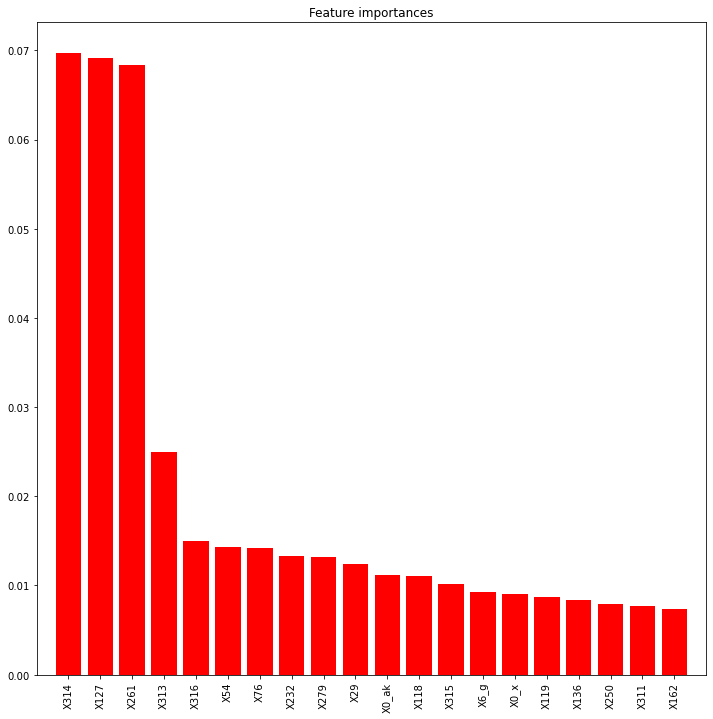

(4208, 38)


In [15]:
# PCA 적용
if feature_reducing == "correlation":
    threshold = 0.7
    correlated_features = remove_collinearity(trainX, threshold)
    correlated_features = set(correlated_features) # 중복 제거
    print("%d Correlation features over %.1f" % (len(correlated_features), threshold))
    
    X = trainX.drop(columns=correlated_features)
    print(X.shape)
    
elif feature_reducing == "feature_importance":
    show_plot = True
    model = RandomForestRegressor(max_features="sqrt", n_jobs=-1, random_state=0xC0FFEE)
    model.fit(trainX, y)
    important_features = find_feature_importance(trainX, model, show_plot)
    X = trainX[important_features]
    print(X.shape)
    
elif feature_reducing == "PCA":
    show_plot = True
    pca_model, X = apply_PCA(trainX, show_plot) # pca_model변수 =>pca_090, X변수 => X_train_pca_df
    print(X.shape)

In [16]:
# X 확인
X

,X29,X51,X54,X76,X115,X118,X119,X127,X136,X162,...,X3_c,X5_ab,X5_ag,X5_m,X5_n,X5_q,X6_d,X6_g,X6_i,X6_j
0,0,0,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1
1,0,1,0,0,0,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
2,1,1,1,1,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,1
3,1,0,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,1,1,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,0,1,0,0,0,1,1,0,1,0,...,1,0,0,0,0,0,1,0,0,0
4205,0,1,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4206,0,1,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,0,1,0,0
4207,0,1,0,0,1,0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0


### 4. 학습 데이터 분할

In [17]:
# 첫번째 테스트용으로 사용하고, 실제 학습시에는 K-Fold CV를 사용합니다.
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=0xC0FFEE)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(3787, 38) (421, 38) (3787,) (421,)


### 5. 학습 및 평가 (debugging 용도)

`RandomForest Parameter`
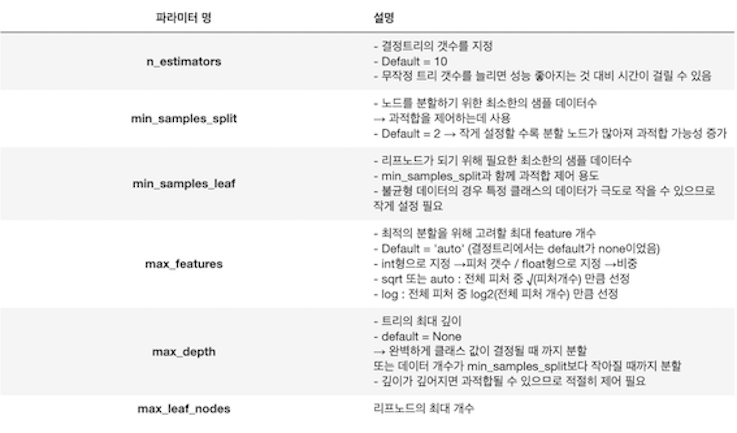

In [18]:
print("\nFitting Random Forest...")
model = RandomForestRegressor(max_features='sqrt', n_jobs=-1) # n_jobs: 학습을 수행하기 위해 컴퓨터 CPU 코어를 모두 사용
model.fit(X_train, y_train)


Fitting Random Forest...


RandomForestRegressor(max_features='sqrt', n_jobs=-1)

In [19]:
# metric은 그때마다 맞게 바꿔줘야 합니다.
from sklearn.metrics import r2_score
evaluation_metric = r2_score

In [20]:
print("Prediction")
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)

train_score = evaluation_metric(y_train, pred_train)
test_score = evaluation_metric(y_test, pred_test)

print("Train Score : %.4f" % train_score)
print("Test Score : %.4f" % test_score)

Prediction
Train Score : 0.7244
Test Score : 0.5548


### 6. Hyper-parameter Tuning

- optuna를 갈아넣습니다!

In [21]:
# For Regression

def optimizer(trial, X, y, K):
    # 조절할 hyper-parameter 조합을 적어줍니다.
    n_estimators = trial.suggest_int("n_estimators", 50, 200)
    # n_estimators: 앙상블 트리의 개수
    # trial.suggest_int: 범위 내 정수형 값을 선택한다.
    max_depth = trial.suggest_int("max_depth", 8, 30)
    # max_depth: 각 트리에서 허용되는 최대 level 개수
    max_features = trial.suggest_categorical("max_features", ['auto', 'sqrt', 'log2']) # auto: 버전 1.3이후 삭제됨(대체: max_features=1.0)
    # max_features: 최상의 분할을 찾을 때 고려해야 할 level 개수:
    # trial.suggest_categorical: 리스트 범위 내에서 값을 선택
    
    # 원하는 모델을 지정합니다, optuna는 시간이 오래걸리기 때문에 저는 보통 RF로 일단 테스트를 해본 뒤에 LGBM을 사용합니다.
    model = RandomForestRegressor(n_estimators=n_estimators,
                                  max_depth=max_depth,
                                  max_features=max_features,
                                  n_jobs=-1,
                                  random_state=0xC0FFEE)
    
    
    # K-Fold Cross validation을 구현합니다.
    folds = KFold(n_splits=K)
    scores = []
    
    for train_idx, val_idx in folds.split(X, y):
        X_train = X.iloc[train_idx, :]
        y_train = y.iloc[train_idx]
        
        X_val = X.iloc[val_idx, :]
        y_val = y.iloc[val_idx]
        
        model.fit(X_train, y_train)
        preds = model.predict(X_val)
        score = evaluation_metric(y_val, preds)
        scores.append(score)
    
    
    # K-Fold의 평균 loss값을 돌려줍니다.
    return np.mean(scores)

`**partial의 간단한 사용법**`

아래 두 수를 곱하는 함수 mul이 있다. 이 mul을 partial을 이용해서 새로운 함수를 만들어보자.
```python
def mul(a, b):
    return a*b

mul5 = partial(mul, b=5)
# 이렇게 만들어진 mul5는 평소 쓰는 함수처럼 사용하면 된다.
print(mul5(5), mul5(7))
# ==> 25 35
```

`**partial 작동하는 방법**`

우리가 partial(~)로 코드를 작성하면 partial 객체(object)가 만들어진다. 위 코드에서는 mul5와 mul3가 partial 객체이다. 우리는 이 객체들을 만들 때 함수와 설정해줄 인자들을 넘겨주었다. partial 객체들은 넘겨받은 함수와 인자들을 기억하고 있다. 우리가 이 객체를 함수처럼 사용하면 `__call__`이 호출이 된다. 이 `__call__`에서 새로운 인자들과 기억하고 있던 인자를 합쳐서 함수에 넘겨진 결과물을 반환하는 것이다. 간단히 말하자면 아래와 같다.
- partial로 생성 시에 본래의 함수와 인자들을 기억한다.
- partial로 만들었던 것을 사용할 때 본래의 함수에 기억하고 있던 인자와 새로 입력된 인자를 전달한다.
- 함수의 결과물을 반환한다.

In [22]:
K = 5 # Kfold 수
opt_func = partial(optimizer, X=X_train, y=y_train, K=K)
# partial(): 인자가 여러 개인 함수에 몇 개의 인자가 이미 설정되어있는 새로운 함수를 생성

rf_study = optuna.create_study(study_name="RF", direction="maximize") # regression task에서 R^2를 최대화!
rf_study.optimize(opt_func, n_trials=30) # optimization, 학습 횟수

[I 2022-08-20 14:05:35,375] A new study created in memory with name: RF
[I 2022-08-20 14:05:36,467] Trial 0 finished with value: 0.5318216707470577 and parameters: {'n_estimators': 200, 'max_depth': 15, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.5318216707470577.
/Users/yunjihyeon/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
/Users/yunjihyeon/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  

/Users/yunjihyeon/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:416: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features=1.0` or remove this parameter as it is also the default value for RandomForestRegressors and ExtraTreesRegressors.
  warn(
[I 2022-08-20 14:05:47,955] Trial 16 finished with value: 0.5416128874020163 and parameters: {'n_estimators': 151, 'max_depth': 11, 'max_features': 'auto'}. Best is trial 10 with value: 0.5805121826515751.
[I 2022-08-20 14:05:48,944] Trial 17 finished with value: 0.5098893831727278 and parameters: {'n_estimators': 178, 'max_depth': 22, 'max_features': 'sqrt'}. Best is trial 10 with value: 0.5805121826515751.
[I 2022-08-20 14:05:49,597] Trial 18 finished with value: 0.5482838617317934 and parameters: {'n_estimators': 120, 'max_depth': 13, 'max_features': 'sqrt'}. Best is trial 10 with value: 0.5805121826515751.
/Users/yunjihyeon

In [23]:
# optuna가 시도했던 모든 실험 관련 데이터
rf_study.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_max_depth,params_max_features,params_n_estimators,state
0,0,0.531822,2022-08-20 14:05:35.376589,2022-08-20 14:05:36.466858,0 days 00:00:01.090269,15,sqrt,200,COMPLETE
1,1,0.509831,2022-08-20 14:05:36.467613,2022-08-20 14:05:37.604107,0 days 00:00:01.136494,15,auto,168,COMPLETE
2,2,0.510392,2022-08-20 14:05:37.604694,2022-08-20 14:05:38.666228,0 days 00:00:01.061534,28,sqrt,195,COMPLETE
3,3,0.513770,2022-08-20 14:05:38.666877,2022-08-20 14:05:38.969822,0 days 00:00:00.302945,18,sqrt,51,COMPLETE
4,4,0.513493,2022-08-20 14:05:38.970464,2022-08-20 14:05:39.372965,0 days 00:00:00.402501,18,sqrt,69,COMPLETE
5,5,0.510714,2022-08-20 14:05:39.373563,2022-08-20 14:05:39.842274,0 days 00:00:00.468711,28,log2,82,COMPLETE
6,6,0.511340,2022-08-20 14:05:39.842887,2022-08-20 14:05:40.455078,0 days 00:00:00.612191,27,log2,110,COMPLETE
7,7,0.525433,2022-08-20 14:05:40.455722,2022-08-20 14:05:41.046372,0 days 00:00:00.590650,16,log2,107,COMPLETE
8,8,0.510812,2022-08-20 14:05:41.047090,2022-08-20 14:05:41.994346,0 days 00:00:00.947256,21,log2,173,COMPLETE
9,9,0.499207,2022-08-20 14:05:41.994943,2022-08-20 14:05:42.667213,0 days 00:00:00.672270,27,auto,96,COMPLETE


In [24]:
print("Best Score: %.4f" % rf_study.best_value) # best score 출력
print("Best params: ", rf_study.best_trial.params) # best score일 때의 하이퍼파라미터들

Best Score: 0.5805
Best params:  {'n_estimators': 145, 'max_depth': 8, 'max_features': 'sqrt'}


In [25]:
# 실험 기록 시각화
optuna.visualization.plot_optimization_history(rf_study)

In [26]:
# hyper-parameter들의 중요도
optuna.visualization.plot_param_importances(rf_study)

### 7. 테스트 및 제출 파일 생성

In [27]:
# final_rf_model = RandomForestRegressor(n_estimators=rf_study.best_trial.params["n_estimators"],
#                                  max_depth=rf_study.best_trial.params["max_depth"],
#                                  max_features=rf_study.best_trial.params["max_features"])

# final_rf_model.fit(X, y) # finalize model

In [28]:
# 테스트 데이터셋 확인
# testX

In [29]:
# 테스트 데이터셋 PCA 적용
if feature_reducing == "correlation":
    test = testX.drop(columns=correlated_features)
    print(X.shape)
    
elif feature_reducing == "feature_importance":
    test = testX[important_features]
    print(X.shape)
    
elif feature_reducing == "PCA":
    test = pca_model.transform(testX)
    print(X.shape)

(4208, 38)


In [30]:
# prediction = final_rf_model.predict(test)
# prediction

In [31]:
# submission["y"] = prediction
# submission

In [32]:
# submission.reset_index(drop=True).to_csv(f"rf_submission_{feature_reducing}.csv", index=False)

### 9. LightGBM으로 변경!

Reference : https://lightgbm.readthedocs.io/en/latest/Parameters-Tuning.html

optimizer : 학습 데이터셋을 이용하여 모델을 학습 할 때 데이터의 실제 결과와 모델이 예측한 결과를 기반으로 잘 줄일 수 있게 만들어주는 역할을 한다.

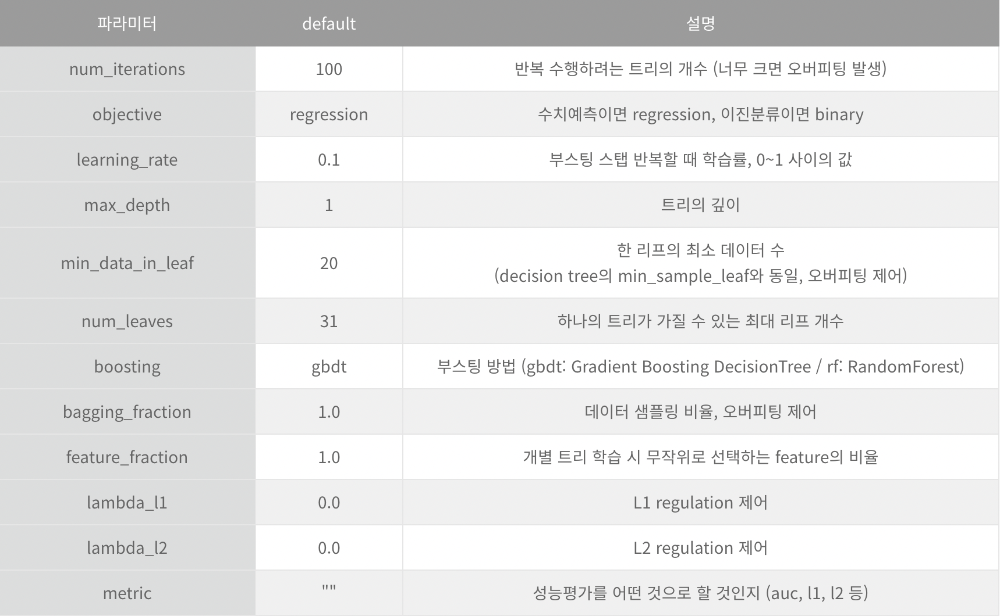

In [33]:
# For Regression

def optimizer(trial, X, y, K):
    
    import os
    
    param = {
        'objective': 'regression', # 회귀
        # objective: 수치예측이면 regression, 이진분류이면 binary
        'verbose': 0,
        # verbose: 출력에 대한 자세한 표시도 훈련 중 평가 인쇄를 비활성화, (0은 출력하지 않고, 1은 자세히, 2는 함축적인 정보만 출력)
        'max_depth': trial.suggest_int('max_depth', 8, 20),
        'learning_rate': trial.suggest_loguniform("learning_rate", 1e-8, 1e-2),
        # learning_rate: 부스팅 스탭 반복할 때 학습률, 0~1 사이의 값
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        # min_child_samples: 한 leaf가 가질수 있는 최소 데이터 수
        'subsample': trial.suggest_loguniform('subsample', 0.4, 1) 
        # subsample: 트리가 커져서 과적합되는 것을 제어하기 위해서 데이터를 샘플링하는 비율(ratio)을 지정
        # trial.suggest_loguniform: 범위 내에서 로그 함수 값을 선택
        #"device" : 'gpu'
    }

    model = LGBMRegressor(**param, n_jobs=os.cpu_count()) # os.cpu_count(): cpu 개수 확인
    
    # K-Fold Cross validation을 구현합니다.
    folds = KFold(n_splits=K)
    scores = []
    
    for train_idx, val_idx in folds.split(X, y):
        X_train = X.iloc[train_idx, :]
        y_train = y.iloc[train_idx]
        
        X_val = X.iloc[val_idx, :]
        y_val = y.iloc[val_idx]
        
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)], early_stopping_rounds=25)
        # early_stopping_rounds: # early_stopping_rounds를 조정해서 validation error가 최소가 되는 지점에 학습을 멈추도록 범위설정
        preds = model.predict(X_val)
        score = evaluation_metric(y_val, preds)
        scores.append(score)
    
    
    # K-Fold의 평균 loss값을 돌려줍니다.
    return np.mean(scores)

In [34]:
K = 5 # Kfold 수
opt_func = partial(optimizer, X=X_train, y=y_train, K=K)

lgbm_study = optuna.create_study(study_name="LGBM", direction="maximize") # regression task에서 R^2를 최대화!
lgbm_study.optimize(opt_func, n_trials=50)

[I 2022-08-20 14:05:58,688] A new study created in memory with name: LGBM


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000929 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 143.906
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 143.889
[3]	valid_0's l2: 143.872
[4]	valid_0's l2: 143.855
[5]	valid_0's l2: 143.838
[6]	valid_0's l2: 143.82
[7]	valid_0's l2: 143.803
[8]	valid_0's l2: 143.786
[9]	valid_0's l2: 143.769
[10]	valid_0's l2: 143.752
[11]	valid_0's l2: 143.735
[12]	valid_0's l2: 143.718
[13]	v

[407]	valid_0's l2: 137.197
[408]	valid_0's l2: 137.181
[409]	valid_0's l2: 137.165
[410]	valid_0's l2: 137.149
[411]	valid_0's l2: 137.133
[412]	valid_0's l2: 137.117
[413]	valid_0's l2: 137.101
[414]	valid_0's l2: 137.085
[415]	valid_0's l2: 137.069
[416]	valid_0's l2: 137.054
[417]	valid_0's l2: 137.038
[418]	valid_0's l2: 137.022
[419]	valid_0's l2: 137.006
[420]	valid_0's l2: 136.99
[421]	valid_0's l2: 136.974
[422]	valid_0's l2: 136.958
[423]	valid_0's l2: 136.943
[424]	valid_0's l2: 136.927
[425]	valid_0's l2: 136.911
[426]	valid_0's l2: 136.895
[427]	valid_0's l2: 136.879
[428]	valid_0's l2: 136.863
[429]	valid_0's l2: 136.847
[430]	valid_0's l2: 136.832
[431]	valid_0's l2: 136.816
[432]	valid_0's l2: 136.8
[433]	valid_0's l2: 136.784
[434]	valid_0's l2: 136.768
[435]	valid_0's l2: 136.753
[436]	valid_0's l2: 136.737
[437]	valid_0's l2: 136.721
[438]	valid_0's l2: 136.705
[439]	valid_0's l2: 136.689
[440]	valid_0's l2: 136.673
[441]	valid_0's l2: 136.658
[442]	valid_0's l2: 136

[721]	valid_0's l2: 132.346
[722]	valid_0's l2: 132.331
[723]	valid_0's l2: 132.316
[724]	valid_0's l2: 132.301
[725]	valid_0's l2: 132.286
[726]	valid_0's l2: 132.271
[727]	valid_0's l2: 132.256
[728]	valid_0's l2: 132.241
[729]	valid_0's l2: 132.226
[730]	valid_0's l2: 132.211
[731]	valid_0's l2: 132.196
[732]	valid_0's l2: 132.181
[733]	valid_0's l2: 132.166
[734]	valid_0's l2: 132.151
[735]	valid_0's l2: 132.136
[736]	valid_0's l2: 132.121
[737]	valid_0's l2: 132.106
[738]	valid_0's l2: 132.091
[739]	valid_0's l2: 132.076
[740]	valid_0's l2: 132.061
[741]	valid_0's l2: 132.046
[742]	valid_0's l2: 132.031
[743]	valid_0's l2: 132.016
[744]	valid_0's l2: 132.001
[745]	valid_0's l2: 131.986
[746]	valid_0's l2: 131.972
[747]	valid_0's l2: 131.957
[748]	valid_0's l2: 131.942
[749]	valid_0's l2: 131.927
[750]	valid_0's l2: 131.912
[751]	valid_0's l2: 131.897
[752]	valid_0's l2: 131.882
[753]	valid_0's l2: 131.867
[754]	valid_0's l2: 131.852
[755]	valid_0's l2: 131.837
[756]	valid_0's l2: 

[145]	valid_0's l2: 134.381
[146]	valid_0's l2: 134.366
[147]	valid_0's l2: 134.35
[148]	valid_0's l2: 134.335
[149]	valid_0's l2: 134.319
[150]	valid_0's l2: 134.304
[151]	valid_0's l2: 134.288
[152]	valid_0's l2: 134.273
[153]	valid_0's l2: 134.257
[154]	valid_0's l2: 134.242
[155]	valid_0's l2: 134.227
[156]	valid_0's l2: 134.211
[157]	valid_0's l2: 134.196
[158]	valid_0's l2: 134.18
[159]	valid_0's l2: 134.165
[160]	valid_0's l2: 134.149
[161]	valid_0's l2: 134.134
[162]	valid_0's l2: 134.119
[163]	valid_0's l2: 134.103
[164]	valid_0's l2: 134.088
[165]	valid_0's l2: 134.072
[166]	valid_0's l2: 134.057
[167]	valid_0's l2: 134.042
[168]	valid_0's l2: 134.026
[169]	valid_0's l2: 134.011
[170]	valid_0's l2: 133.995
[171]	valid_0's l2: 133.98
[172]	valid_0's l2: 133.965
[173]	valid_0's l2: 133.949
[174]	valid_0's l2: 133.934
[175]	valid_0's l2: 133.919
[176]	valid_0's l2: 133.903
[177]	valid_0's l2: 133.888
[178]	valid_0's l2: 133.872
[179]	valid_0's l2: 133.857
[180]	valid_0's l2: 133

[450]	valid_0's l2: 129.801
[451]	valid_0's l2: 129.786
[452]	valid_0's l2: 129.771
[453]	valid_0's l2: 129.757
[454]	valid_0's l2: 129.742
[455]	valid_0's l2: 129.728
[456]	valid_0's l2: 129.713
[457]	valid_0's l2: 129.699
[458]	valid_0's l2: 129.684
[459]	valid_0's l2: 129.67
[460]	valid_0's l2: 129.655
[461]	valid_0's l2: 129.64
[462]	valid_0's l2: 129.626
[463]	valid_0's l2: 129.611
[464]	valid_0's l2: 129.597
[465]	valid_0's l2: 129.582
[466]	valid_0's l2: 129.568
[467]	valid_0's l2: 129.553
[468]	valid_0's l2: 129.539
[469]	valid_0's l2: 129.524
[470]	valid_0's l2: 129.51
[471]	valid_0's l2: 129.495
[472]	valid_0's l2: 129.481
[473]	valid_0's l2: 129.466
[474]	valid_0's l2: 129.452
[475]	valid_0's l2: 129.437
[476]	valid_0's l2: 129.423
[477]	valid_0's l2: 129.408
[478]	valid_0's l2: 129.394
[479]	valid_0's l2: 129.379
[480]	valid_0's l2: 129.365
[481]	valid_0's l2: 129.35
[482]	valid_0's l2: 129.336
[483]	valid_0's l2: 129.321
[484]	valid_0's l2: 129.307
[485]	valid_0's l2: 129.

[749]	valid_0's l2: 125.565
[750]	valid_0's l2: 125.551
[751]	valid_0's l2: 125.537
[752]	valid_0's l2: 125.524
[753]	valid_0's l2: 125.51
[754]	valid_0's l2: 125.496
[755]	valid_0's l2: 125.482
[756]	valid_0's l2: 125.469
[757]	valid_0's l2: 125.455
[758]	valid_0's l2: 125.441
[759]	valid_0's l2: 125.427
[760]	valid_0's l2: 125.414
[761]	valid_0's l2: 125.4
[762]	valid_0's l2: 125.386
[763]	valid_0's l2: 125.373
[764]	valid_0's l2: 125.359
[765]	valid_0's l2: 125.345
[766]	valid_0's l2: 125.331
[767]	valid_0's l2: 125.318
[768]	valid_0's l2: 125.304
[769]	valid_0's l2: 125.29
[770]	valid_0's l2: 125.277
[771]	valid_0's l2: 125.263
[772]	valid_0's l2: 125.249
[773]	valid_0's l2: 125.235
[774]	valid_0's l2: 125.222
[775]	valid_0's l2: 125.208
[776]	valid_0's l2: 125.194
[777]	valid_0's l2: 125.181
[778]	valid_0's l2: 125.167
[779]	valid_0's l2: 125.153
[780]	valid_0's l2: 125.14
[781]	valid_0's l2: 125.126
[782]	valid_0's l2: 125.112
[783]	valid_0's l2: 125.099
[784]	valid_0's l2: 125.0

[157]	valid_0's l2: 142.604
[158]	valid_0's l2: 142.588
[159]	valid_0's l2: 142.572
[160]	valid_0's l2: 142.556
[161]	valid_0's l2: 142.54
[162]	valid_0's l2: 142.524
[163]	valid_0's l2: 142.508
[164]	valid_0's l2: 142.492
[165]	valid_0's l2: 142.476
[166]	valid_0's l2: 142.461
[167]	valid_0's l2: 142.445
[168]	valid_0's l2: 142.429
[169]	valid_0's l2: 142.413
[170]	valid_0's l2: 142.397
[171]	valid_0's l2: 142.381
[172]	valid_0's l2: 142.365
[173]	valid_0's l2: 142.349
[174]	valid_0's l2: 142.334
[175]	valid_0's l2: 142.318
[176]	valid_0's l2: 142.302
[177]	valid_0's l2: 142.286
[178]	valid_0's l2: 142.27
[179]	valid_0's l2: 142.254
[180]	valid_0's l2: 142.238
[181]	valid_0's l2: 142.223
[182]	valid_0's l2: 142.207
[183]	valid_0's l2: 142.191
[184]	valid_0's l2: 142.175
[185]	valid_0's l2: 142.159
[186]	valid_0's l2: 142.143
[187]	valid_0's l2: 142.128
[188]	valid_0's l2: 142.112
[189]	valid_0's l2: 142.096
[190]	valid_0's l2: 142.08
[191]	valid_0's l2: 142.064
[192]	valid_0's l2: 142

[455]	valid_0's l2: 137.99
[456]	valid_0's l2: 137.975
[457]	valid_0's l2: 137.96
[458]	valid_0's l2: 137.944
[459]	valid_0's l2: 137.929
[460]	valid_0's l2: 137.914
[461]	valid_0's l2: 137.899
[462]	valid_0's l2: 137.884
[463]	valid_0's l2: 137.869
[464]	valid_0's l2: 137.854
[465]	valid_0's l2: 137.839
[466]	valid_0's l2: 137.824
[467]	valid_0's l2: 137.809
[468]	valid_0's l2: 137.794
[469]	valid_0's l2: 137.779
[470]	valid_0's l2: 137.764
[471]	valid_0's l2: 137.749
[472]	valid_0's l2: 137.734
[473]	valid_0's l2: 137.719
[474]	valid_0's l2: 137.704
[475]	valid_0's l2: 137.689
[476]	valid_0's l2: 137.674
[477]	valid_0's l2: 137.659
[478]	valid_0's l2: 137.644
[479]	valid_0's l2: 137.629
[480]	valid_0's l2: 137.614
[481]	valid_0's l2: 137.599
[482]	valid_0's l2: 137.584
[483]	valid_0's l2: 137.569
[484]	valid_0's l2: 137.554
[485]	valid_0's l2: 137.539
[486]	valid_0's l2: 137.524
[487]	valid_0's l2: 137.508
[488]	valid_0's l2: 137.494
[489]	valid_0's l2: 137.479
[490]	valid_0's l2: 13

[755]	valid_0's l2: 133.597
[756]	valid_0's l2: 133.583
[757]	valid_0's l2: 133.569
[758]	valid_0's l2: 133.554
[759]	valid_0's l2: 133.54
[760]	valid_0's l2: 133.526
[761]	valid_0's l2: 133.512
[762]	valid_0's l2: 133.497
[763]	valid_0's l2: 133.483
[764]	valid_0's l2: 133.469
[765]	valid_0's l2: 133.455
[766]	valid_0's l2: 133.44
[767]	valid_0's l2: 133.426
[768]	valid_0's l2: 133.412
[769]	valid_0's l2: 133.398
[770]	valid_0's l2: 133.383
[771]	valid_0's l2: 133.369
[772]	valid_0's l2: 133.355
[773]	valid_0's l2: 133.341
[774]	valid_0's l2: 133.327
[775]	valid_0's l2: 133.312
[776]	valid_0's l2: 133.298
[777]	valid_0's l2: 133.284
[778]	valid_0's l2: 133.27
[779]	valid_0's l2: 133.256
[780]	valid_0's l2: 133.241
[781]	valid_0's l2: 133.227
[782]	valid_0's l2: 133.213
[783]	valid_0's l2: 133.199
[784]	valid_0's l2: 133.185
[785]	valid_0's l2: 133.171
[786]	valid_0's l2: 133.156
[787]	valid_0's l2: 133.142
[788]	valid_0's l2: 133.128
[789]	valid_0's l2: 133.114
[790]	valid_0's l2: 133

[164]	valid_0's l2: 175.221
[165]	valid_0's l2: 175.204
[166]	valid_0's l2: 175.187
[167]	valid_0's l2: 175.17
[168]	valid_0's l2: 175.154
[169]	valid_0's l2: 175.137
[170]	valid_0's l2: 175.12
[171]	valid_0's l2: 175.103
[172]	valid_0's l2: 175.087
[173]	valid_0's l2: 175.07
[174]	valid_0's l2: 175.053
[175]	valid_0's l2: 175.037
[176]	valid_0's l2: 175.02
[177]	valid_0's l2: 175.003
[178]	valid_0's l2: 174.986
[179]	valid_0's l2: 174.97
[180]	valid_0's l2: 174.953
[181]	valid_0's l2: 174.936
[182]	valid_0's l2: 174.92
[183]	valid_0's l2: 174.903
[184]	valid_0's l2: 174.886
[185]	valid_0's l2: 174.869
[186]	valid_0's l2: 174.853
[187]	valid_0's l2: 174.836
[188]	valid_0's l2: 174.819
[189]	valid_0's l2: 174.803
[190]	valid_0's l2: 174.786
[191]	valid_0's l2: 174.769
[192]	valid_0's l2: 174.753
[193]	valid_0's l2: 174.736
[194]	valid_0's l2: 174.719
[195]	valid_0's l2: 174.703
[196]	valid_0's l2: 174.686
[197]	valid_0's l2: 174.669
[198]	valid_0's l2: 174.653
[199]	valid_0's l2: 174.63

[463]	valid_0's l2: 170.346
[464]	valid_0's l2: 170.33
[465]	valid_0's l2: 170.314
[466]	valid_0's l2: 170.299
[467]	valid_0's l2: 170.283
[468]	valid_0's l2: 170.267
[469]	valid_0's l2: 170.251
[470]	valid_0's l2: 170.235
[471]	valid_0's l2: 170.219
[472]	valid_0's l2: 170.204
[473]	valid_0's l2: 170.188
[474]	valid_0's l2: 170.172
[475]	valid_0's l2: 170.156
[476]	valid_0's l2: 170.14
[477]	valid_0's l2: 170.124
[478]	valid_0's l2: 170.109
[479]	valid_0's l2: 170.093
[480]	valid_0's l2: 170.077
[481]	valid_0's l2: 170.061
[482]	valid_0's l2: 170.045
[483]	valid_0's l2: 170.03
[484]	valid_0's l2: 170.014
[485]	valid_0's l2: 169.998
[486]	valid_0's l2: 169.982
[487]	valid_0's l2: 169.966
[488]	valid_0's l2: 169.951
[489]	valid_0's l2: 169.935
[490]	valid_0's l2: 169.919
[491]	valid_0's l2: 169.903
[492]	valid_0's l2: 169.887
[493]	valid_0's l2: 169.872
[494]	valid_0's l2: 169.856
[495]	valid_0's l2: 169.84
[496]	valid_0's l2: 169.824
[497]	valid_0's l2: 169.809
[498]	valid_0's l2: 169.

[765]	valid_0's l2: 165.679
[766]	valid_0's l2: 165.664
[767]	valid_0's l2: 165.649
[768]	valid_0's l2: 165.634
[769]	valid_0's l2: 165.619
[770]	valid_0's l2: 165.604
[771]	valid_0's l2: 165.589
[772]	valid_0's l2: 165.574
[773]	valid_0's l2: 165.558
[774]	valid_0's l2: 165.543
[775]	valid_0's l2: 165.528
[776]	valid_0's l2: 165.513
[777]	valid_0's l2: 165.498
[778]	valid_0's l2: 165.483
[779]	valid_0's l2: 165.468
[780]	valid_0's l2: 165.453
[781]	valid_0's l2: 165.438
[782]	valid_0's l2: 165.423
[783]	valid_0's l2: 165.408
[784]	valid_0's l2: 165.393
[785]	valid_0's l2: 165.378
[786]	valid_0's l2: 165.363
[787]	valid_0's l2: 165.348
[788]	valid_0's l2: 165.334
[789]	valid_0's l2: 165.319
[790]	valid_0's l2: 165.304
[791]	valid_0's l2: 165.289
[792]	valid_0's l2: 165.274
[793]	valid_0's l2: 165.259
[794]	valid_0's l2: 165.244
[795]	valid_0's l2: 165.229
[796]	valid_0's l2: 165.214
[797]	valid_0's l2: 165.199
[798]	valid_0's l2: 165.184
[799]	valid_0's l2: 165.169
[800]	valid_0's l2: 

[155]	valid_0's l2: 162.876
[156]	valid_0's l2: 162.859
[157]	valid_0's l2: 162.842
[158]	valid_0's l2: 162.825
[159]	valid_0's l2: 162.808
[160]	valid_0's l2: 162.79
[161]	valid_0's l2: 162.773
[162]	valid_0's l2: 162.756
[163]	valid_0's l2: 162.739
[164]	valid_0's l2: 162.722
[165]	valid_0's l2: 162.705
[166]	valid_0's l2: 162.687
[167]	valid_0's l2: 162.67
[168]	valid_0's l2: 162.653
[169]	valid_0's l2: 162.636
[170]	valid_0's l2: 162.619
[171]	valid_0's l2: 162.602
[172]	valid_0's l2: 162.585
[173]	valid_0's l2: 162.568
[174]	valid_0's l2: 162.55
[175]	valid_0's l2: 162.533
[176]	valid_0's l2: 162.516
[177]	valid_0's l2: 162.499
[178]	valid_0's l2: 162.482
[179]	valid_0's l2: 162.465
[180]	valid_0's l2: 162.448
[181]	valid_0's l2: 162.431
[182]	valid_0's l2: 162.414
[183]	valid_0's l2: 162.397
[184]	valid_0's l2: 162.38
[185]	valid_0's l2: 162.362
[186]	valid_0's l2: 162.345
[187]	valid_0's l2: 162.328
[188]	valid_0's l2: 162.311
[189]	valid_0's l2: 162.294
[190]	valid_0's l2: 162.

[490]	valid_0's l2: 157.299
[491]	valid_0's l2: 157.283
[492]	valid_0's l2: 157.267
[493]	valid_0's l2: 157.251
[494]	valid_0's l2: 157.235
[495]	valid_0's l2: 157.219
[496]	valid_0's l2: 157.202
[497]	valid_0's l2: 157.186
[498]	valid_0's l2: 157.17
[499]	valid_0's l2: 157.154
[500]	valid_0's l2: 157.138
[501]	valid_0's l2: 157.122
[502]	valid_0's l2: 157.106
[503]	valid_0's l2: 157.09
[504]	valid_0's l2: 157.074
[505]	valid_0's l2: 157.058
[506]	valid_0's l2: 157.041
[507]	valid_0's l2: 157.025
[508]	valid_0's l2: 157.009
[509]	valid_0's l2: 156.993
[510]	valid_0's l2: 156.977
[511]	valid_0's l2: 156.961
[512]	valid_0's l2: 156.945
[513]	valid_0's l2: 156.929
[514]	valid_0's l2: 156.913
[515]	valid_0's l2: 156.897
[516]	valid_0's l2: 156.881
[517]	valid_0's l2: 156.865
[518]	valid_0's l2: 156.849
[519]	valid_0's l2: 156.833
[520]	valid_0's l2: 156.817
[521]	valid_0's l2: 156.801
[522]	valid_0's l2: 156.784
[523]	valid_0's l2: 156.768
[524]	valid_0's l2: 156.752
[525]	valid_0's l2: 15

[816]	valid_0's l2: 152.194
[817]	valid_0's l2: 152.178
[818]	valid_0's l2: 152.163
[819]	valid_0's l2: 152.148
[820]	valid_0's l2: 152.133
[821]	valid_0's l2: 152.118
[822]	valid_0's l2: 152.102
[823]	valid_0's l2: 152.087
[824]	valid_0's l2: 152.072
[825]	valid_0's l2: 152.057
[826]	valid_0's l2: 152.042
[827]	valid_0's l2: 152.027
[828]	valid_0's l2: 152.011
[829]	valid_0's l2: 151.996
[830]	valid_0's l2: 151.981
[831]	valid_0's l2: 151.966
[832]	valid_0's l2: 151.951
[833]	valid_0's l2: 151.936
[834]	valid_0's l2: 151.921
[835]	valid_0's l2: 151.905
[836]	valid_0's l2: 151.89
[837]	valid_0's l2: 151.875
[838]	valid_0's l2: 151.86
[839]	valid_0's l2: 151.845
[840]	valid_0's l2: 151.83
[841]	valid_0's l2: 151.815
[842]	valid_0's l2: 151.799
[843]	valid_0's l2: 151.784
[844]	valid_0's l2: 151.769
[845]	valid_0's l2: 151.754
[846]	valid_0's l2: 151.739
[847]	valid_0's l2: 151.724
[848]	valid_0's l2: 151.709
[849]	valid_0's l2: 151.694


[I 2022-08-20 14:06:04,852] Trial 0 finished with value: 0.08914686236835585 and parameters: {'max_depth': 17, 'learning_rate': 9.251742744971603e-05, 'n_estimators': 881, 'min_child_samples': 27, 'subsample': 0.4608461160873559}. Best is trial 0 with value: 0.08914686236835585.


[850]	valid_0's l2: 151.679
[851]	valid_0's l2: 151.664
[852]	valid_0's l2: 151.648
[853]	valid_0's l2: 151.633
[854]	valid_0's l2: 151.618
[855]	valid_0's l2: 151.603
[856]	valid_0's l2: 151.588
[857]	valid_0's l2: 151.573
[858]	valid_0's l2: 151.558
[859]	valid_0's l2: 151.543
[860]	valid_0's l2: 151.528
[861]	valid_0's l2: 151.513
[862]	valid_0's l2: 151.498
[863]	valid_0's l2: 151.483
[864]	valid_0's l2: 151.468
[865]	valid_0's l2: 151.453
[866]	valid_0's l2: 151.437
[867]	valid_0's l2: 151.422
[868]	valid_0's l2: 151.407
[869]	valid_0's l2: 151.392
[870]	valid_0's l2: 151.377
[871]	valid_0's l2: 151.362
[872]	valid_0's l2: 151.347
[873]	valid_0's l2: 151.332
[874]	valid_0's l2: 151.317
[875]	valid_0's l2: 151.302
[876]	valid_0's l2: 151.287
[877]	valid_0's l2: 151.272
[878]	valid_0's l2: 151.257
[879]	valid_0's l2: 151.242
[880]	valid_0's l2: 151.227
[881]	valid_0's l2: 151.212
Did not meet early stopping. Best iteration is:
[881]	valid_0's l2: 151.212
[LightGBM] [Warning] Accurac

[372]	valid_0's l2: 143.917
[373]	valid_0's l2: 143.917
[374]	valid_0's l2: 143.917
[375]	valid_0's l2: 143.917
[376]	valid_0's l2: 143.917
[377]	valid_0's l2: 143.917
[378]	valid_0's l2: 143.917
[379]	valid_0's l2: 143.917
[380]	valid_0's l2: 143.917
[381]	valid_0's l2: 143.917
[382]	valid_0's l2: 143.917
[383]	valid_0's l2: 143.917
[384]	valid_0's l2: 143.917
[385]	valid_0's l2: 143.917
[386]	valid_0's l2: 143.917
[387]	valid_0's l2: 143.917
[388]	valid_0's l2: 143.917
[389]	valid_0's l2: 143.917
[390]	valid_0's l2: 143.917
[391]	valid_0's l2: 143.917
[392]	valid_0's l2: 143.917
[393]	valid_0's l2: 143.917
[394]	valid_0's l2: 143.917
[395]	valid_0's l2: 143.917
[396]	valid_0's l2: 143.917
[397]	valid_0's l2: 143.917
[398]	valid_0's l2: 143.917
[399]	valid_0's l2: 143.917
[400]	valid_0's l2: 143.917
[401]	valid_0's l2: 143.916
[402]	valid_0's l2: 143.916
[403]	valid_0's l2: 143.916
[404]	valid_0's l2: 143.916
[405]	valid_0's l2: 143.916
[406]	valid_0's l2: 143.916
[407]	valid_0's l2: 

[19]	valid_0's l2: 136.654
[20]	valid_0's l2: 136.654
[21]	valid_0's l2: 136.654
[22]	valid_0's l2: 136.654
[23]	valid_0's l2: 136.654
[24]	valid_0's l2: 136.654
[25]	valid_0's l2: 136.654
[26]	valid_0's l2: 136.654
[27]	valid_0's l2: 136.654
[28]	valid_0's l2: 136.654
[29]	valid_0's l2: 136.654
[30]	valid_0's l2: 136.654
[31]	valid_0's l2: 136.654
[32]	valid_0's l2: 136.654
[33]	valid_0's l2: 136.654
[34]	valid_0's l2: 136.654
[35]	valid_0's l2: 136.654
[36]	valid_0's l2: 136.654
[37]	valid_0's l2: 136.654
[38]	valid_0's l2: 136.654
[39]	valid_0's l2: 136.654
[40]	valid_0's l2: 136.654
[41]	valid_0's l2: 136.654
[42]	valid_0's l2: 136.654
[43]	valid_0's l2: 136.654
[44]	valid_0's l2: 136.654
[45]	valid_0's l2: 136.654
[46]	valid_0's l2: 136.654
[47]	valid_0's l2: 136.654
[48]	valid_0's l2: 136.654
[49]	valid_0's l2: 136.654
[50]	valid_0's l2: 136.654
[51]	valid_0's l2: 136.654
[52]	valid_0's l2: 136.654
[53]	valid_0's l2: 136.654
[54]	valid_0's l2: 136.654
[55]	valid_0's l2: 136.654
[

[320]	valid_0's l2: 136.649
[321]	valid_0's l2: 136.649
[322]	valid_0's l2: 136.649
[323]	valid_0's l2: 136.649
[324]	valid_0's l2: 136.649
[325]	valid_0's l2: 136.649
[326]	valid_0's l2: 136.649
[327]	valid_0's l2: 136.649
[328]	valid_0's l2: 136.649
[329]	valid_0's l2: 136.649
[330]	valid_0's l2: 136.649
[331]	valid_0's l2: 136.649
[332]	valid_0's l2: 136.649
[333]	valid_0's l2: 136.649
[334]	valid_0's l2: 136.649
[335]	valid_0's l2: 136.649
[336]	valid_0's l2: 136.649
[337]	valid_0's l2: 136.649
[338]	valid_0's l2: 136.649
[339]	valid_0's l2: 136.649
[340]	valid_0's l2: 136.649
[341]	valid_0's l2: 136.649
[342]	valid_0's l2: 136.649
[343]	valid_0's l2: 136.649
[344]	valid_0's l2: 136.649
[345]	valid_0's l2: 136.649
[346]	valid_0's l2: 136.649
[347]	valid_0's l2: 136.649
[348]	valid_0's l2: 136.649
[349]	valid_0's l2: 136.649
[350]	valid_0's l2: 136.649
[351]	valid_0's l2: 136.649
[352]	valid_0's l2: 136.649
[353]	valid_0's l2: 136.649
[354]	valid_0's l2: 136.649
[355]	valid_0's l2: 

[640]	valid_0's l2: 136.644
[641]	valid_0's l2: 136.644
[642]	valid_0's l2: 136.644
[643]	valid_0's l2: 136.644
[644]	valid_0's l2: 136.644
[645]	valid_0's l2: 136.644
[646]	valid_0's l2: 136.644
Did not meet early stopping. Best iteration is:
[646]	valid_0's l2: 136.644
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 145.136
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 145.

[272]	valid_0's l2: 145.132
[273]	valid_0's l2: 145.132
[274]	valid_0's l2: 145.131
[275]	valid_0's l2: 145.131
[276]	valid_0's l2: 145.131
[277]	valid_0's l2: 145.131
[278]	valid_0's l2: 145.131
[279]	valid_0's l2: 145.131
[280]	valid_0's l2: 145.131
[281]	valid_0's l2: 145.131
[282]	valid_0's l2: 145.131
[283]	valid_0's l2: 145.131
[284]	valid_0's l2: 145.131
[285]	valid_0's l2: 145.131
[286]	valid_0's l2: 145.131
[287]	valid_0's l2: 145.131
[288]	valid_0's l2: 145.131
[289]	valid_0's l2: 145.131
[290]	valid_0's l2: 145.131
[291]	valid_0's l2: 145.131
[292]	valid_0's l2: 145.131
[293]	valid_0's l2: 145.131
[294]	valid_0's l2: 145.131
[295]	valid_0's l2: 145.131
[296]	valid_0's l2: 145.131
[297]	valid_0's l2: 145.131
[298]	valid_0's l2: 145.131
[299]	valid_0's l2: 145.131
[300]	valid_0's l2: 145.131
[301]	valid_0's l2: 145.131
[302]	valid_0's l2: 145.131
[303]	valid_0's l2: 145.131
[304]	valid_0's l2: 145.131
[305]	valid_0's l2: 145.131
[306]	valid_0's l2: 145.131
[307]	valid_0's l2: 

[595]	valid_0's l2: 145.126
[596]	valid_0's l2: 145.126
[597]	valid_0's l2: 145.126
[598]	valid_0's l2: 145.126
[599]	valid_0's l2: 145.126
[600]	valid_0's l2: 145.126
[601]	valid_0's l2: 145.126
[602]	valid_0's l2: 145.126
[603]	valid_0's l2: 145.126
[604]	valid_0's l2: 145.126
[605]	valid_0's l2: 145.126
[606]	valid_0's l2: 145.126
[607]	valid_0's l2: 145.126
[608]	valid_0's l2: 145.126
[609]	valid_0's l2: 145.126
[610]	valid_0's l2: 145.126
[611]	valid_0's l2: 145.126
[612]	valid_0's l2: 145.126
[613]	valid_0's l2: 145.126
[614]	valid_0's l2: 145.126
[615]	valid_0's l2: 145.126
[616]	valid_0's l2: 145.126
[617]	valid_0's l2: 145.126
[618]	valid_0's l2: 145.126
[619]	valid_0's l2: 145.126
[620]	valid_0's l2: 145.126
[621]	valid_0's l2: 145.126
[622]	valid_0's l2: 145.126
[623]	valid_0's l2: 145.126
[624]	valid_0's l2: 145.126
[625]	valid_0's l2: 145.126
[626]	valid_0's l2: 145.126
[627]	valid_0's l2: 145.126
[628]	valid_0's l2: 145.126
[629]	valid_0's l2: 145.126
[630]	valid_0's l2: 

[233]	valid_0's l2: 178.006
[234]	valid_0's l2: 178.006
[235]	valid_0's l2: 178.006
[236]	valid_0's l2: 178.006
[237]	valid_0's l2: 178.006
[238]	valid_0's l2: 178.006
[239]	valid_0's l2: 178.006
[240]	valid_0's l2: 178.006
[241]	valid_0's l2: 178.006
[242]	valid_0's l2: 178.006
[243]	valid_0's l2: 178.006
[244]	valid_0's l2: 178.006
[245]	valid_0's l2: 178.006
[246]	valid_0's l2: 178.006
[247]	valid_0's l2: 178.006
[248]	valid_0's l2: 178.006
[249]	valid_0's l2: 178.006
[250]	valid_0's l2: 178.005
[251]	valid_0's l2: 178.005
[252]	valid_0's l2: 178.005
[253]	valid_0's l2: 178.005
[254]	valid_0's l2: 178.005
[255]	valid_0's l2: 178.005
[256]	valid_0's l2: 178.005
[257]	valid_0's l2: 178.005
[258]	valid_0's l2: 178.005
[259]	valid_0's l2: 178.005
[260]	valid_0's l2: 178.005
[261]	valid_0's l2: 178.005
[262]	valid_0's l2: 178.005
[263]	valid_0's l2: 178.005
[264]	valid_0's l2: 178.005
[265]	valid_0's l2: 178.005
[266]	valid_0's l2: 178.005
[267]	valid_0's l2: 178.005
[268]	valid_0's l2: 

[532]	valid_0's l2: 178.001
[533]	valid_0's l2: 178.001
[534]	valid_0's l2: 178.001
[535]	valid_0's l2: 178.001
[536]	valid_0's l2: 178.001
[537]	valid_0's l2: 178.001
[538]	valid_0's l2: 178.001
[539]	valid_0's l2: 178
[540]	valid_0's l2: 178
[541]	valid_0's l2: 178
[542]	valid_0's l2: 178
[543]	valid_0's l2: 178
[544]	valid_0's l2: 178
[545]	valid_0's l2: 178
[546]	valid_0's l2: 178
[547]	valid_0's l2: 178
[548]	valid_0's l2: 178
[549]	valid_0's l2: 178
[550]	valid_0's l2: 178
[551]	valid_0's l2: 178
[552]	valid_0's l2: 178
[553]	valid_0's l2: 178
[554]	valid_0's l2: 178
[555]	valid_0's l2: 178
[556]	valid_0's l2: 178
[557]	valid_0's l2: 178
[558]	valid_0's l2: 178
[559]	valid_0's l2: 178
[560]	valid_0's l2: 178
[561]	valid_0's l2: 178
[562]	valid_0's l2: 178
[563]	valid_0's l2: 178
[564]	valid_0's l2: 178
[565]	valid_0's l2: 178
[566]	valid_0's l2: 178
[567]	valid_0's l2: 178
[568]	valid_0's l2: 178
[569]	valid_0's l2: 178
[570]	valid_0's l2: 178
[571]	valid_0's l2: 178
[572]	valid_

[178]	valid_0's l2: 165.573
[179]	valid_0's l2: 165.573
[180]	valid_0's l2: 165.573
[181]	valid_0's l2: 165.573
[182]	valid_0's l2: 165.573
[183]	valid_0's l2: 165.573
[184]	valid_0's l2: 165.573
[185]	valid_0's l2: 165.573
[186]	valid_0's l2: 165.573
[187]	valid_0's l2: 165.573
[188]	valid_0's l2: 165.573
[189]	valid_0's l2: 165.573
[190]	valid_0's l2: 165.573
[191]	valid_0's l2: 165.573
[192]	valid_0's l2: 165.573
[193]	valid_0's l2: 165.573
[194]	valid_0's l2: 165.573
[195]	valid_0's l2: 165.573
[196]	valid_0's l2: 165.573
[197]	valid_0's l2: 165.573
[198]	valid_0's l2: 165.573
[199]	valid_0's l2: 165.573
[200]	valid_0's l2: 165.573
[201]	valid_0's l2: 165.573
[202]	valid_0's l2: 165.573
[203]	valid_0's l2: 165.573
[204]	valid_0's l2: 165.573
[205]	valid_0's l2: 165.573
[206]	valid_0's l2: 165.573
[207]	valid_0's l2: 165.573
[208]	valid_0's l2: 165.573
[209]	valid_0's l2: 165.573
[210]	valid_0's l2: 165.573
[211]	valid_0's l2: 165.573
[212]	valid_0's l2: 165.573
[213]	valid_0's l2: 

[473]	valid_0's l2: 165.568
[474]	valid_0's l2: 165.568
[475]	valid_0's l2: 165.568
[476]	valid_0's l2: 165.568
[477]	valid_0's l2: 165.568
[478]	valid_0's l2: 165.568
[479]	valid_0's l2: 165.568
[480]	valid_0's l2: 165.568
[481]	valid_0's l2: 165.568
[482]	valid_0's l2: 165.568
[483]	valid_0's l2: 165.568
[484]	valid_0's l2: 165.568
[485]	valid_0's l2: 165.568
[486]	valid_0's l2: 165.568
[487]	valid_0's l2: 165.568
[488]	valid_0's l2: 165.568
[489]	valid_0's l2: 165.568
[490]	valid_0's l2: 165.568
[491]	valid_0's l2: 165.568
[492]	valid_0's l2: 165.568
[493]	valid_0's l2: 165.568
[494]	valid_0's l2: 165.568
[495]	valid_0's l2: 165.568
[496]	valid_0's l2: 165.568
[497]	valid_0's l2: 165.568
[498]	valid_0's l2: 165.568
[499]	valid_0's l2: 165.568
[500]	valid_0's l2: 165.568
[501]	valid_0's l2: 165.568
[502]	valid_0's l2: 165.568
[503]	valid_0's l2: 165.568
[504]	valid_0's l2: 165.568
[505]	valid_0's l2: 165.568
[506]	valid_0's l2: 165.568
[507]	valid_0's l2: 165.568
[508]	valid_0's l2: 

[I 2022-08-20 14:06:09,311] Trial 1 finished with value: -0.0005569560649324012 and parameters: {'max_depth': 9, 'learning_rate': 9.340674535451718e-08, 'n_estimators': 646, 'min_child_samples': 10, 'subsample': 0.40682144690546296}. Best is trial 0 with value: 0.08914686236835585.


[610]	valid_0's l2: 165.566
[611]	valid_0's l2: 165.566
[612]	valid_0's l2: 165.566
[613]	valid_0's l2: 165.566
[614]	valid_0's l2: 165.566
[615]	valid_0's l2: 165.566
[616]	valid_0's l2: 165.566
[617]	valid_0's l2: 165.566
[618]	valid_0's l2: 165.566
[619]	valid_0's l2: 165.566
[620]	valid_0's l2: 165.566
[621]	valid_0's l2: 165.566
[622]	valid_0's l2: 165.566
[623]	valid_0's l2: 165.566
[624]	valid_0's l2: 165.566
[625]	valid_0's l2: 165.566
[626]	valid_0's l2: 165.566
[627]	valid_0's l2: 165.565
[628]	valid_0's l2: 165.565
[629]	valid_0's l2: 165.565
[630]	valid_0's l2: 165.565
[631]	valid_0's l2: 165.565
[632]	valid_0's l2: 165.565
[633]	valid_0's l2: 165.565
[634]	valid_0's l2: 165.565
[635]	valid_0's l2: 165.565
[636]	valid_0's l2: 165.565
[637]	valid_0's l2: 165.565
[638]	valid_0's l2: 165.565
[639]	valid_0's l2: 165.565
[640]	valid_0's l2: 165.565
[641]	valid_0's l2: 165.565
[642]	valid_0's l2: 165.565
[643]	valid_0's l2: 165.565
[644]	valid_0's l2: 165.565
[645]	valid_0's l2: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's l2: 143.832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's l2: 143.83
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's l2: 143.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's l2: 143.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 143.826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 143.825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's l2: 143.824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's l2: 143.822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	valid_0's l2: 143.821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	val

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[179]	valid_0's l2: 143.689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	valid_0's l2: 143.687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[181]	valid_0's l2: 143.686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's l2: 143.685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's l2: 143.683
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 143.682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 143.681
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 143.68
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 143.678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[325]	valid_0's l2: 143.498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's l2: 143.496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's l2: 143.495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's l2: 143.494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's l2: 143.492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's l2: 143.491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 143.49
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[332]	valid_0's l2: 143.489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 143.487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's l2: 143.486
[LightGBM] [Warning] No further splits with po

[136]	valid_0's l2: 136.491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's l2: 136.489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's l2: 136.488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's l2: 136.487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's l2: 136.486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's l2: 136.484
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's l2: 136.483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's l2: 136.482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's l2: 136.481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's l2: 136.48
[LightGBM] [Warning] No further splits with po

[289]	valid_0's l2: 136.307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 136.305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 136.304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 136.303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[293]	valid_0's l2: 136.302
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[294]	valid_0's l2: 136.301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[295]	valid_0's l2: 136.299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[296]	valid_0's l2: 136.298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[297]	valid_0's l2: 136.297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[298]	valid_0's l2: 136.296
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's l2: 145.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[101]	valid_0's l2: 145.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	valid_0's l2: 145.008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[103]	valid_0's l2: 145.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[104]	valid_0's l2: 145.005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[105]	valid_0's l2: 145.004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's l2: 145.003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's l2: 145.002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's l2: 145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 144.83
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 144.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 144.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 144.826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's l2: 144.825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 144.824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 144.823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's l2: 144.821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's l2: 144.82
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 177.949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 177.947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 177.946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 177.945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 177.943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 177.942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 177.941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	valid_0's l2: 177.939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 177.938
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 177.754
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 177.753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 177.752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 177.75
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 177.749
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 177.748
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 177.746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 177.745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 177.744
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 165.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 165.573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's l2: 165.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	valid_0's l2: 165.569
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	valid_0's l2: 165.567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	valid_0's l2: 165.566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	valid_0's l2: 165.564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	valid_0's l2: 165.563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	valid_0's l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 165.355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 165.353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 165.352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 165.35
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 165.349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 165.348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 165.346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 165.345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[172]	valid_0's l2: 165.344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2022-08-20 14:06:11,643] Trial 2 finished with value: 0.002207249735626959 and parameters: {'max_depth': 18, 'learning_rate': 7.131317036914405e-06, 'n_estimators': 336, 'min_child_samples': 82, 'subsample': 0.6262149936245095}. Best is trial 0 with value: 0.08914686236835585.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 165.165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 165.164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 165.163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 165.161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 165.16
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[309]	valid_0's l2: 165.159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[310]	valid_0's l2: 165.157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[311]	valid_0's l2: 165.156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[312]	valid_0's l2: 165.155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[151]	valid_0's l2: 136.271
[152]	valid_0's l2: 136.223
[153]	valid_0's l2: 136.175
[154]	valid_0's l2: 136.126
[155]	valid_0's l2: 136.078
[156]	valid_0's l2: 136.03
[157]	valid_0's l2: 135.981
[158]	valid_0's l2: 135.933
[159]	valid_0's l2: 135.885
[160]	valid_0's l2: 135.837
[161]	valid_0's l2: 135.788
[162]	valid_0's l2: 135.74
[163]	valid_0's l2: 135.692
[164]	valid_0's l2: 135.644
[165]	valid_0's l2: 135.596
[166]	valid_0's l2: 135.548
[167]	valid_0's l2: 135.5
[168]	valid_0's l2: 135.452
[169]	valid_0's l2: 135.404
[170]	valid_0's l2: 135.356
[171]	valid_0's l2: 135.308
[172]	valid_0's l2: 135.26
[173]	valid_0's l2: 135.212
[174]	valid_0's l2: 135.165
[175]	valid_0's l2: 135.117
[176]	valid_0's l2: 135.069
[177]	valid_0's l2: 135.021
[178]	valid_0's l2: 134.974
[179]	valid_0's l2: 134.926
[180]	valid_0's l2: 134.878
[181]	valid_0's l2: 134.831
[182]	valid_0's l2: 134.783
[183]	valid_0's l2: 134.735
[184]	valid_0's l2: 134.688
[185]	valid_0's l2: 134.64
[186]	valid_0's l2: 134.59

[472]	valid_0's l2: 122.093
[473]	valid_0's l2: 122.053
[474]	valid_0's l2: 122.013
[475]	valid_0's l2: 121.972
[476]	valid_0's l2: 121.932
[477]	valid_0's l2: 121.892
[478]	valid_0's l2: 121.852
[479]	valid_0's l2: 121.812
[480]	valid_0's l2: 121.772
[481]	valid_0's l2: 121.732
[482]	valid_0's l2: 121.692
[483]	valid_0's l2: 121.652
[484]	valid_0's l2: 121.612
[485]	valid_0's l2: 121.572
[486]	valid_0's l2: 121.532
[487]	valid_0's l2: 121.493
[488]	valid_0's l2: 121.453
[489]	valid_0's l2: 121.413
[490]	valid_0's l2: 121.373
[491]	valid_0's l2: 121.333
[492]	valid_0's l2: 121.294
[493]	valid_0's l2: 121.254
[494]	valid_0's l2: 121.214
[495]	valid_0's l2: 121.175
[496]	valid_0's l2: 121.135
[497]	valid_0's l2: 121.095
[498]	valid_0's l2: 121.056
[499]	valid_0's l2: 121.016
[500]	valid_0's l2: 120.977
[501]	valid_0's l2: 120.937
[502]	valid_0's l2: 120.897
[503]	valid_0's l2: 120.858
[504]	valid_0's l2: 120.818
[505]	valid_0's l2: 120.779
[506]	valid_0's l2: 120.739
[507]	valid_0's l2: 

[793]	valid_0's l2: 110.302
[794]	valid_0's l2: 110.269
[795]	valid_0's l2: 110.236
[796]	valid_0's l2: 110.203
[797]	valid_0's l2: 110.169
[798]	valid_0's l2: 110.136
[799]	valid_0's l2: 110.103
[800]	valid_0's l2: 110.07
[801]	valid_0's l2: 110.036
[802]	valid_0's l2: 110.003
[803]	valid_0's l2: 109.97
[804]	valid_0's l2: 109.937
[805]	valid_0's l2: 109.904
[806]	valid_0's l2: 109.871
[807]	valid_0's l2: 109.838
[808]	valid_0's l2: 109.805
[809]	valid_0's l2: 109.772
[810]	valid_0's l2: 109.739
[811]	valid_0's l2: 109.706
[812]	valid_0's l2: 109.673
[813]	valid_0's l2: 109.64
[814]	valid_0's l2: 109.607
[815]	valid_0's l2: 109.574
[816]	valid_0's l2: 109.541
[817]	valid_0's l2: 109.508
[818]	valid_0's l2: 109.475
[819]	valid_0's l2: 109.442
[820]	valid_0's l2: 109.409
[821]	valid_0's l2: 109.377
[822]	valid_0's l2: 109.344
[823]	valid_0's l2: 109.311
[824]	valid_0's l2: 109.278
[825]	valid_0's l2: 109.246
[826]	valid_0's l2: 109.213
[827]	valid_0's l2: 109.18
[828]	valid_0's l2: 109.

[143]	valid_0's l2: 129.916
[144]	valid_0's l2: 129.871
[145]	valid_0's l2: 129.826
[146]	valid_0's l2: 129.781
[147]	valid_0's l2: 129.736
[148]	valid_0's l2: 129.69
[149]	valid_0's l2: 129.645
[150]	valid_0's l2: 129.6
[151]	valid_0's l2: 129.555
[152]	valid_0's l2: 129.51
[153]	valid_0's l2: 129.465
[154]	valid_0's l2: 129.42
[155]	valid_0's l2: 129.375
[156]	valid_0's l2: 129.33
[157]	valid_0's l2: 129.285
[158]	valid_0's l2: 129.24
[159]	valid_0's l2: 129.196
[160]	valid_0's l2: 129.151
[161]	valid_0's l2: 129.106
[162]	valid_0's l2: 129.061
[163]	valid_0's l2: 129.017
[164]	valid_0's l2: 128.972
[165]	valid_0's l2: 128.927
[166]	valid_0's l2: 128.883
[167]	valid_0's l2: 128.838
[168]	valid_0's l2: 128.793
[169]	valid_0's l2: 128.749
[170]	valid_0's l2: 128.704
[171]	valid_0's l2: 128.66
[172]	valid_0's l2: 128.615
[173]	valid_0's l2: 128.571
[174]	valid_0's l2: 128.527
[175]	valid_0's l2: 128.482
[176]	valid_0's l2: 128.438
[177]	valid_0's l2: 128.394
[178]	valid_0's l2: 128.349


[442]	valid_0's l2: 117.546
[443]	valid_0's l2: 117.508
[444]	valid_0's l2: 117.47
[445]	valid_0's l2: 117.433
[446]	valid_0's l2: 117.395
[447]	valid_0's l2: 117.357
[448]	valid_0's l2: 117.32
[449]	valid_0's l2: 117.282
[450]	valid_0's l2: 117.245
[451]	valid_0's l2: 117.207
[452]	valid_0's l2: 117.17
[453]	valid_0's l2: 117.132
[454]	valid_0's l2: 117.095
[455]	valid_0's l2: 117.058
[456]	valid_0's l2: 117.02
[457]	valid_0's l2: 116.983
[458]	valid_0's l2: 116.945
[459]	valid_0's l2: 116.908
[460]	valid_0's l2: 116.871
[461]	valid_0's l2: 116.834
[462]	valid_0's l2: 116.796
[463]	valid_0's l2: 116.759
[464]	valid_0's l2: 116.722
[465]	valid_0's l2: 116.685
[466]	valid_0's l2: 116.648
[467]	valid_0's l2: 116.611
[468]	valid_0's l2: 116.573
[469]	valid_0's l2: 116.536
[470]	valid_0's l2: 116.499
[471]	valid_0's l2: 116.462
[472]	valid_0's l2: 116.425
[473]	valid_0's l2: 116.388
[474]	valid_0's l2: 116.351
[475]	valid_0's l2: 116.314
[476]	valid_0's l2: 116.277
[477]	valid_0's l2: 116.

[745]	valid_0's l2: 107.132
[746]	valid_0's l2: 107.1
[747]	valid_0's l2: 107.069
[748]	valid_0's l2: 107.038
[749]	valid_0's l2: 107.007
[750]	valid_0's l2: 106.976
[751]	valid_0's l2: 106.945
[752]	valid_0's l2: 106.914
[753]	valid_0's l2: 106.883
[754]	valid_0's l2: 106.852
[755]	valid_0's l2: 106.821
[756]	valid_0's l2: 106.789
[757]	valid_0's l2: 106.759
[758]	valid_0's l2: 106.728
[759]	valid_0's l2: 106.697
[760]	valid_0's l2: 106.666
[761]	valid_0's l2: 106.635
[762]	valid_0's l2: 106.604
[763]	valid_0's l2: 106.573
[764]	valid_0's l2: 106.542
[765]	valid_0's l2: 106.511
[766]	valid_0's l2: 106.481
[767]	valid_0's l2: 106.45
[768]	valid_0's l2: 106.419
[769]	valid_0's l2: 106.388
[770]	valid_0's l2: 106.358
[771]	valid_0's l2: 106.327
[772]	valid_0's l2: 106.296
[773]	valid_0's l2: 106.266
[774]	valid_0's l2: 106.235
[775]	valid_0's l2: 106.204
[776]	valid_0's l2: 106.174
[777]	valid_0's l2: 106.143
[778]	valid_0's l2: 106.113
[779]	valid_0's l2: 106.082
[780]	valid_0's l2: 106

[75]	valid_0's l2: 141.394
[76]	valid_0's l2: 141.346
[77]	valid_0's l2: 141.297
[78]	valid_0's l2: 141.248
[79]	valid_0's l2: 141.2
[80]	valid_0's l2: 141.151
[81]	valid_0's l2: 141.102
[82]	valid_0's l2: 141.054
[83]	valid_0's l2: 141.005
[84]	valid_0's l2: 140.957
[85]	valid_0's l2: 140.908
[86]	valid_0's l2: 140.86
[87]	valid_0's l2: 140.811
[88]	valid_0's l2: 140.763
[89]	valid_0's l2: 140.714
[90]	valid_0's l2: 140.666
[91]	valid_0's l2: 140.618
[92]	valid_0's l2: 140.569
[93]	valid_0's l2: 140.521
[94]	valid_0's l2: 140.473
[95]	valid_0's l2: 140.425
[96]	valid_0's l2: 140.376
[97]	valid_0's l2: 140.328
[98]	valid_0's l2: 140.28
[99]	valid_0's l2: 140.232
[100]	valid_0's l2: 140.184
[101]	valid_0's l2: 140.136
[102]	valid_0's l2: 140.088
[103]	valid_0's l2: 140.04
[104]	valid_0's l2: 139.992
[105]	valid_0's l2: 139.944
[106]	valid_0's l2: 139.896
[107]	valid_0's l2: 139.848
[108]	valid_0's l2: 139.8
[109]	valid_0's l2: 139.752
[110]	valid_0's l2: 139.704
[111]	valid_0's l2: 139.

[376]	valid_0's l2: 127.925
[377]	valid_0's l2: 127.884
[378]	valid_0's l2: 127.843
[379]	valid_0's l2: 127.802
[380]	valid_0's l2: 127.761
[381]	valid_0's l2: 127.721
[382]	valid_0's l2: 127.68
[383]	valid_0's l2: 127.639
[384]	valid_0's l2: 127.598
[385]	valid_0's l2: 127.557
[386]	valid_0's l2: 127.517
[387]	valid_0's l2: 127.476
[388]	valid_0's l2: 127.435
[389]	valid_0's l2: 127.395
[390]	valid_0's l2: 127.354
[391]	valid_0's l2: 127.314
[392]	valid_0's l2: 127.273
[393]	valid_0's l2: 127.232
[394]	valid_0's l2: 127.192
[395]	valid_0's l2: 127.152
[396]	valid_0's l2: 127.111
[397]	valid_0's l2: 127.071
[398]	valid_0's l2: 127.031
[399]	valid_0's l2: 126.991
[400]	valid_0's l2: 126.95
[401]	valid_0's l2: 126.91
[402]	valid_0's l2: 126.87
[403]	valid_0's l2: 126.829
[404]	valid_0's l2: 126.789
[405]	valid_0's l2: 126.749
[406]	valid_0's l2: 126.709
[407]	valid_0's l2: 126.669
[408]	valid_0's l2: 126.629
[409]	valid_0's l2: 126.588
[410]	valid_0's l2: 126.548
[411]	valid_0's l2: 126.

[701]	valid_0's l2: 115.858
[702]	valid_0's l2: 115.825
[703]	valid_0's l2: 115.791
[704]	valid_0's l2: 115.757
[705]	valid_0's l2: 115.723
[706]	valid_0's l2: 115.689
[707]	valid_0's l2: 115.656
[708]	valid_0's l2: 115.622
[709]	valid_0's l2: 115.588
[710]	valid_0's l2: 115.554
[711]	valid_0's l2: 115.521
[712]	valid_0's l2: 115.487
[713]	valid_0's l2: 115.453
[714]	valid_0's l2: 115.42
[715]	valid_0's l2: 115.386
[716]	valid_0's l2: 115.353
[717]	valid_0's l2: 115.319
[718]	valid_0's l2: 115.286
[719]	valid_0's l2: 115.252
[720]	valid_0's l2: 115.219
[721]	valid_0's l2: 115.185
[722]	valid_0's l2: 115.152
[723]	valid_0's l2: 115.119
[724]	valid_0's l2: 115.085
[725]	valid_0's l2: 115.052
[726]	valid_0's l2: 115.018
[727]	valid_0's l2: 114.985
[728]	valid_0's l2: 114.952
[729]	valid_0's l2: 114.919
[730]	valid_0's l2: 114.885
[731]	valid_0's l2: 114.852
[732]	valid_0's l2: 114.819
[733]	valid_0's l2: 114.786
[734]	valid_0's l2: 114.752
[735]	valid_0's l2: 114.719
[736]	valid_0's l2: 1

[81]	valid_0's l2: 173.733
[82]	valid_0's l2: 173.681
[83]	valid_0's l2: 173.63
[84]	valid_0's l2: 173.578
[85]	valid_0's l2: 173.527
[86]	valid_0's l2: 173.475
[87]	valid_0's l2: 173.424
[88]	valid_0's l2: 173.372
[89]	valid_0's l2: 173.321
[90]	valid_0's l2: 173.269
[91]	valid_0's l2: 173.217
[92]	valid_0's l2: 173.166
[93]	valid_0's l2: 173.114
[94]	valid_0's l2: 173.063
[95]	valid_0's l2: 173.012
[96]	valid_0's l2: 172.961
[97]	valid_0's l2: 172.909
[98]	valid_0's l2: 172.858
[99]	valid_0's l2: 172.807
[100]	valid_0's l2: 172.756
[101]	valid_0's l2: 172.705
[102]	valid_0's l2: 172.654
[103]	valid_0's l2: 172.602
[104]	valid_0's l2: 172.552
[105]	valid_0's l2: 172.5
[106]	valid_0's l2: 172.45
[107]	valid_0's l2: 172.398
[108]	valid_0's l2: 172.348
[109]	valid_0's l2: 172.297
[110]	valid_0's l2: 172.246
[111]	valid_0's l2: 172.195
[112]	valid_0's l2: 172.144
[113]	valid_0's l2: 172.093
[114]	valid_0's l2: 172.043
[115]	valid_0's l2: 171.992
[116]	valid_0's l2: 171.941
[117]	valid_0's

[416]	valid_0's l2: 157.989
[417]	valid_0's l2: 157.946
[418]	valid_0's l2: 157.904
[419]	valid_0's l2: 157.861
[420]	valid_0's l2: 157.819
[421]	valid_0's l2: 157.776
[422]	valid_0's l2: 157.734
[423]	valid_0's l2: 157.691
[424]	valid_0's l2: 157.649
[425]	valid_0's l2: 157.607
[426]	valid_0's l2: 157.564
[427]	valid_0's l2: 157.522
[428]	valid_0's l2: 157.479
[429]	valid_0's l2: 157.437
[430]	valid_0's l2: 157.394
[431]	valid_0's l2: 157.352
[432]	valid_0's l2: 157.31
[433]	valid_0's l2: 157.268
[434]	valid_0's l2: 157.225
[435]	valid_0's l2: 157.183
[436]	valid_0's l2: 157.141
[437]	valid_0's l2: 157.099
[438]	valid_0's l2: 157.057
[439]	valid_0's l2: 157.015
[440]	valid_0's l2: 156.972
[441]	valid_0's l2: 156.93
[442]	valid_0's l2: 156.888
[443]	valid_0's l2: 156.846
[444]	valid_0's l2: 156.804
[445]	valid_0's l2: 156.762
[446]	valid_0's l2: 156.72
[447]	valid_0's l2: 156.678
[448]	valid_0's l2: 156.636
[449]	valid_0's l2: 156.594
[450]	valid_0's l2: 156.553
[451]	valid_0's l2: 156

[731]	valid_0's l2: 145.696
[732]	valid_0's l2: 145.66
[733]	valid_0's l2: 145.625
[734]	valid_0's l2: 145.589
[735]	valid_0's l2: 145.554
[736]	valid_0's l2: 145.518
[737]	valid_0's l2: 145.483
[738]	valid_0's l2: 145.447
[739]	valid_0's l2: 145.412
[740]	valid_0's l2: 145.376
[741]	valid_0's l2: 145.341
[742]	valid_0's l2: 145.306
[743]	valid_0's l2: 145.271
[744]	valid_0's l2: 145.236
[745]	valid_0's l2: 145.2
[746]	valid_0's l2: 145.165
[747]	valid_0's l2: 145.129
[748]	valid_0's l2: 145.094
[749]	valid_0's l2: 145.058
[750]	valid_0's l2: 145.023
[751]	valid_0's l2: 144.988
[752]	valid_0's l2: 144.953
[753]	valid_0's l2: 144.918
[754]	valid_0's l2: 144.883
[755]	valid_0's l2: 144.847
[756]	valid_0's l2: 144.812
[757]	valid_0's l2: 144.777
[758]	valid_0's l2: 144.742
[759]	valid_0's l2: 144.707
[760]	valid_0's l2: 144.672
[761]	valid_0's l2: 144.637
[762]	valid_0's l2: 144.602
[763]	valid_0's l2: 144.567
[764]	valid_0's l2: 144.532
[765]	valid_0's l2: 144.497
[766]	valid_0's l2: 144

[55]	valid_0's l2: 162.596
[56]	valid_0's l2: 162.543
[57]	valid_0's l2: 162.49
[58]	valid_0's l2: 162.436
[59]	valid_0's l2: 162.383
[60]	valid_0's l2: 162.33
[61]	valid_0's l2: 162.277
[62]	valid_0's l2: 162.224
[63]	valid_0's l2: 162.171
[64]	valid_0's l2: 162.118
[65]	valid_0's l2: 162.065
[66]	valid_0's l2: 162.012
[67]	valid_0's l2: 161.959
[68]	valid_0's l2: 161.906
[69]	valid_0's l2: 161.853
[70]	valid_0's l2: 161.8
[71]	valid_0's l2: 161.747
[72]	valid_0's l2: 161.694
[73]	valid_0's l2: 161.642
[74]	valid_0's l2: 161.589
[75]	valid_0's l2: 161.536
[76]	valid_0's l2: 161.483
[77]	valid_0's l2: 161.431
[78]	valid_0's l2: 161.378
[79]	valid_0's l2: 161.326
[80]	valid_0's l2: 161.273
[81]	valid_0's l2: 161.221
[82]	valid_0's l2: 161.168
[83]	valid_0's l2: 161.116
[84]	valid_0's l2: 161.063
[85]	valid_0's l2: 161.011
[86]	valid_0's l2: 160.958
[87]	valid_0's l2: 160.906
[88]	valid_0's l2: 160.854
[89]	valid_0's l2: 160.801
[90]	valid_0's l2: 160.749
[91]	valid_0's l2: 160.697
[92]	

[371]	valid_0's l2: 147.19
[372]	valid_0's l2: 147.145
[373]	valid_0's l2: 147.101
[374]	valid_0's l2: 147.057
[375]	valid_0's l2: 147.012
[376]	valid_0's l2: 146.968
[377]	valid_0's l2: 146.924
[378]	valid_0's l2: 146.88
[379]	valid_0's l2: 146.836
[380]	valid_0's l2: 146.792
[381]	valid_0's l2: 146.747
[382]	valid_0's l2: 146.703
[383]	valid_0's l2: 146.659
[384]	valid_0's l2: 146.615
[385]	valid_0's l2: 146.571
[386]	valid_0's l2: 146.527
[387]	valid_0's l2: 146.483
[388]	valid_0's l2: 146.44
[389]	valid_0's l2: 146.396
[390]	valid_0's l2: 146.352
[391]	valid_0's l2: 146.308
[392]	valid_0's l2: 146.264
[393]	valid_0's l2: 146.22
[394]	valid_0's l2: 146.176
[395]	valid_0's l2: 146.133
[396]	valid_0's l2: 146.089
[397]	valid_0's l2: 146.045
[398]	valid_0's l2: 146.002
[399]	valid_0's l2: 145.958
[400]	valid_0's l2: 145.914
[401]	valid_0's l2: 145.871
[402]	valid_0's l2: 145.827
[403]	valid_0's l2: 145.784
[404]	valid_0's l2: 145.74
[405]	valid_0's l2: 145.697
[406]	valid_0's l2: 145.6

[755]	valid_0's l2: 131.95
[756]	valid_0's l2: 131.915
[757]	valid_0's l2: 131.88
[758]	valid_0's l2: 131.844
[759]	valid_0's l2: 131.809
[760]	valid_0's l2: 131.774
[761]	valid_0's l2: 131.739
[762]	valid_0's l2: 131.703
[763]	valid_0's l2: 131.668
[764]	valid_0's l2: 131.633
[765]	valid_0's l2: 131.598
[766]	valid_0's l2: 131.563
[767]	valid_0's l2: 131.528
[768]	valid_0's l2: 131.493
[769]	valid_0's l2: 131.457
[770]	valid_0's l2: 131.422
[771]	valid_0's l2: 131.387
[772]	valid_0's l2: 131.352
[773]	valid_0's l2: 131.317
[774]	valid_0's l2: 131.282
[775]	valid_0's l2: 131.247
[776]	valid_0's l2: 131.213
[777]	valid_0's l2: 131.178
[778]	valid_0's l2: 131.143
[779]	valid_0's l2: 131.108
[780]	valid_0's l2: 131.073
[781]	valid_0's l2: 131.038
[782]	valid_0's l2: 131.003
[783]	valid_0's l2: 130.969
[784]	valid_0's l2: 130.934
[785]	valid_0's l2: 130.899
[786]	valid_0's l2: 130.864
[787]	valid_0's l2: 130.83
[788]	valid_0's l2: 130.795
[789]	valid_0's l2: 130.76
[790]	valid_0's l2: 130.

[I 2022-08-20 14:06:18,435] Trial 3 finished with value: 0.25582390409219513 and parameters: {'max_depth': 16, 'learning_rate': 0.0002899928120850789, 'n_estimators': 983, 'min_child_samples': 9, 'subsample': 0.5834622954273367}. Best is trial 3 with value: 0.25582390409219513.


[967]	valid_0's l2: 124.912
[968]	valid_0's l2: 124.881
[969]	valid_0's l2: 124.85
[970]	valid_0's l2: 124.818
[971]	valid_0's l2: 124.787
[972]	valid_0's l2: 124.756
[973]	valid_0's l2: 124.725
[974]	valid_0's l2: 124.694
[975]	valid_0's l2: 124.663
[976]	valid_0's l2: 124.632
[977]	valid_0's l2: 124.601
[978]	valid_0's l2: 124.57
[979]	valid_0's l2: 124.539
[980]	valid_0's l2: 124.508
[981]	valid_0's l2: 124.477
[982]	valid_0's l2: 124.446
[983]	valid_0's l2: 124.416
Did not meet early stopping. Best iteration is:
[983]	valid_0's l2: 124.416
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001731 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enou

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000773 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 136.654
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 136.654
[3]	valid_0's l2: 136.654
[4]	valid_0's l2: 136.654
[5]	valid_0's l2: 136.654
[6]	valid_0's l2: 136.654
[7]	valid_0's l2: 136.654
[8]	valid_0's l2: 136.654
[9]	valid_0's l2: 136.654
[10]	valid_0's l2: 136.654
[11]	valid_0's l2: 136.654
[12]	valid_0's l2: 136.654
[13]	

[314]	valid_0's l2: 136.647
[315]	valid_0's l2: 136.647
[316]	valid_0's l2: 136.647
[317]	valid_0's l2: 136.647
[318]	valid_0's l2: 136.647
[319]	valid_0's l2: 136.647
[320]	valid_0's l2: 136.647
[321]	valid_0's l2: 136.647
[322]	valid_0's l2: 136.647
[323]	valid_0's l2: 136.647
[324]	valid_0's l2: 136.647
[325]	valid_0's l2: 136.647
[326]	valid_0's l2: 136.647
[327]	valid_0's l2: 136.647
[328]	valid_0's l2: 136.647
[329]	valid_0's l2: 136.647
[330]	valid_0's l2: 136.647
[331]	valid_0's l2: 136.647
[332]	valid_0's l2: 136.647
Did not meet early stopping. Best iteration is:
[332]	valid_0's l2: 136.647
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000643 seconds.
You can set `force_row_wi

[276]	valid_0's l2: 145.13
[277]	valid_0's l2: 145.13
[278]	valid_0's l2: 145.129
[279]	valid_0's l2: 145.129
[280]	valid_0's l2: 145.129
[281]	valid_0's l2: 145.129
[282]	valid_0's l2: 145.129
[283]	valid_0's l2: 145.129
[284]	valid_0's l2: 145.129
[285]	valid_0's l2: 145.129
[286]	valid_0's l2: 145.129
[287]	valid_0's l2: 145.129
[288]	valid_0's l2: 145.129
[289]	valid_0's l2: 145.129
[290]	valid_0's l2: 145.129
[291]	valid_0's l2: 145.129
[292]	valid_0's l2: 145.129
[293]	valid_0's l2: 145.129
[294]	valid_0's l2: 145.129
[295]	valid_0's l2: 145.129
[296]	valid_0's l2: 145.129
[297]	valid_0's l2: 145.129
[298]	valid_0's l2: 145.129
[299]	valid_0's l2: 145.129
[300]	valid_0's l2: 145.129
[301]	valid_0's l2: 145.129
[302]	valid_0's l2: 145.129
[303]	valid_0's l2: 145.129
[304]	valid_0's l2: 145.129
[305]	valid_0's l2: 145.129
[306]	valid_0's l2: 145.129
[307]	valid_0's l2: 145.129
[308]	valid_0's l2: 145.129
[309]	valid_0's l2: 145.129
[310]	valid_0's l2: 145.129
[311]	valid_0's l2: 14

[224]	valid_0's l2: 178.004
[225]	valid_0's l2: 178.004
[226]	valid_0's l2: 178.004
[227]	valid_0's l2: 178.004
[228]	valid_0's l2: 178.004
[229]	valid_0's l2: 178.004
[230]	valid_0's l2: 178.004
[231]	valid_0's l2: 178.004
[232]	valid_0's l2: 178.004
[233]	valid_0's l2: 178.004
[234]	valid_0's l2: 178.004
[235]	valid_0's l2: 178.004
[236]	valid_0's l2: 178.004
[237]	valid_0's l2: 178.004
[238]	valid_0's l2: 178.004
[239]	valid_0's l2: 178.004
[240]	valid_0's l2: 178.004
[241]	valid_0's l2: 178.004
[242]	valid_0's l2: 178.004
[243]	valid_0's l2: 178.004
[244]	valid_0's l2: 178.004
[245]	valid_0's l2: 178.004
[246]	valid_0's l2: 178.004
[247]	valid_0's l2: 178.004
[248]	valid_0's l2: 178.004
[249]	valid_0's l2: 178.004
[250]	valid_0's l2: 178.004
[251]	valid_0's l2: 178.004
[252]	valid_0's l2: 178.004
[253]	valid_0's l2: 178.004
[254]	valid_0's l2: 178.004
[255]	valid_0's l2: 178.004
[256]	valid_0's l2: 178.003
[257]	valid_0's l2: 178.003
[258]	valid_0's l2: 178.003
[259]	valid_0's l2: 

[192]	valid_0's l2: 165.572
[193]	valid_0's l2: 165.572
[194]	valid_0's l2: 165.572
[195]	valid_0's l2: 165.572
[196]	valid_0's l2: 165.572
[197]	valid_0's l2: 165.572
[198]	valid_0's l2: 165.572
[199]	valid_0's l2: 165.572
[200]	valid_0's l2: 165.572
[201]	valid_0's l2: 165.572
[202]	valid_0's l2: 165.572
[203]	valid_0's l2: 165.572
[204]	valid_0's l2: 165.571
[205]	valid_0's l2: 165.571
[206]	valid_0's l2: 165.571
[207]	valid_0's l2: 165.571
[208]	valid_0's l2: 165.571
[209]	valid_0's l2: 165.571
[210]	valid_0's l2: 165.571
[211]	valid_0's l2: 165.571
[212]	valid_0's l2: 165.571
[213]	valid_0's l2: 165.571
[214]	valid_0's l2: 165.571
[215]	valid_0's l2: 165.571
[216]	valid_0's l2: 165.571
[217]	valid_0's l2: 165.571
[218]	valid_0's l2: 165.571
[219]	valid_0's l2: 165.571
[220]	valid_0's l2: 165.571
[221]	valid_0's l2: 165.571
[222]	valid_0's l2: 165.571
[223]	valid_0's l2: 165.571
[224]	valid_0's l2: 165.571
[225]	valid_0's l2: 165.571
[226]	valid_0's l2: 165.571
[227]	valid_0's l2: 

[I 2022-08-20 14:06:20,778] Trial 4 finished with value: -0.000575953239970306 and parameters: {'max_depth': 17, 'learning_rate': 1.3272469117594336e-07, 'n_estimators': 332, 'min_child_samples': 24, 'subsample': 0.7410567063202258}. Best is trial 3 with value: 0.25582390409219513.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 143.376
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 142.832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 142.291
[LightGBM] [Warni

[94]	valid_0's l2: 104.526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 104.215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 103.906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's l2: 103.599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's l2: 103.292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	valid_0's l2: 102.989
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's l2: 102.688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[101]	valid_0's l2: 102.387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	valid_0's l2: 102.089
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[103]	valid_0's l2: 101.792
[LightGBM] [Warning] No further splits with positiv

[230]	valid_0's l2: 75.5781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's l2: 75.4427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[232]	valid_0's l2: 75.3071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[233]	valid_0's l2: 75.1722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[234]	valid_0's l2: 75.0381
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 74.905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's l2: 74.7721
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's l2: 74.641
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's l2: 74.511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's l2: 74.3814
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[372]	valid_0's l2: 62.6158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[373]	valid_0's l2: 62.5598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's l2: 62.5027
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[375]	valid_0's l2: 62.4458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[376]	valid_0's l2: 62.3911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	valid_0's l2: 62.3351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[378]	valid_0's l2: 62.2789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[379]	valid_0's l2: 62.2256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[380]	valid_0's l2: 62.1705
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[518]	valid_0's l2: 57.1568
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[519]	valid_0's l2: 57.1349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[520]	valid_0's l2: 57.1122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[521]	valid_0's l2: 57.0894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[522]	valid_0's l2: 57.0683
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[523]	valid_0's l2: 57.0459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[524]	valid_0's l2: 57.0241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[525]	valid_0's l2: 57.0023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[526]	valid_0's l2: 56.9817
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[663]	valid_0's l2: 54.998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[664]	valid_0's l2: 54.9887
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[665]	valid_0's l2: 54.9797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[666]	valid_0's l2: 54.9699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[667]	valid_0's l2: 54.9604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[668]	valid_0's l2: 54.9516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[669]	valid_0's l2: 54.9433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[670]	valid_0's l2: 54.9341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[671]	valid_0's l2: 54.9256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[813]	valid_0's l2: 54.1996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[814]	valid_0's l2: 54.197
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[815]	valid_0's l2: 54.1949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[816]	valid_0's l2: 54.1926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[817]	valid_0's l2: 54.1902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[818]	valid_0's l2: 54.1879
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[819]	valid_0's l2: 54.1857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[820]	valid_0's l2: 54.1831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[821]	valid_0's l2: 54.1808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[969]	valid_0's l2: 54.0044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[970]	valid_0's l2: 54.0044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[971]	valid_0's l2: 54.0038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[972]	valid_0's l2: 54.0038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[973]	valid_0's l2: 54.0029
Did not meet early stopping. Best iteration is:
[973]	valid_0's l2: 54.0029
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000507 seconds.
You can set `force_row_wise=true` to remov

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's l2: 97.4402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's l2: 97.1796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's l2: 96.9206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's l2: 96.6637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's l2: 96.4082
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[111]	valid_0's l2: 96.1544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's l2: 95.9018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[113]	valid_0's l2: 95.6507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[114]	valid_0's l2: 95.4018
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[248]	valid_0's l2: 72.8506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 72.7448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 72.6397
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's l2: 72.534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's l2: 72.4304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's l2: 72.3276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's l2: 72.2253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's l2: 72.1224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's l2: 72.0213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[257]	valid_0's l2: 71.9209
[LightGBM] [Warning] No further splits with po

[396]	valid_0's l2: 62.8346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 62.7951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 62.7544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 62.7154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	valid_0's l2: 62.6775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[401]	valid_0's l2: 62.6376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[402]	valid_0's l2: 62.5978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[403]	valid_0's l2: 62.5601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[404]	valid_0's l2: 62.5206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[405]	valid_0's l2: 62.4832
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[546]	valid_0's l2: 59.1806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[547]	valid_0's l2: 59.1667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[548]	valid_0's l2: 59.1554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[549]	valid_0's l2: 59.1414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[550]	valid_0's l2: 59.1277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[551]	valid_0's l2: 59.1144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[552]	valid_0's l2: 59.101
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[553]	valid_0's l2: 59.09
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[554]	valid_0's l2: 59.077
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[685]	valid_0's l2: 58.0496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[686]	valid_0's l2: 58.0446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[687]	valid_0's l2: 58.0407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[688]	valid_0's l2: 58.0365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[689]	valid_0's l2: 58.0327
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[690]	valid_0's l2: 58.0286
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[691]	valid_0's l2: 58.0244
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[692]	valid_0's l2: 58.0213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[693]	valid_0's l2: 58.0176
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[831]	valid_0's l2: 57.7131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[832]	valid_0's l2: 57.7124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[833]	valid_0's l2: 57.7106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[834]	valid_0's l2: 57.7104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[835]	valid_0's l2: 57.71
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[836]	valid_0's l2: 57.7084
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[837]	valid_0's l2: 57.7081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[838]	valid_0's l2: 57.7076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[839]	valid_0's l2: 57.7071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 144.613
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 144.092
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 143.575
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's l2: 96.9798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's l2: 96.7442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's l2: 96.5099
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's l2: 96.277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's l2: 96.0454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's l2: 95.8154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's l2: 95.5865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's l2: 95.3592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's l2: 95.133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's l2: 73.1064
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's l2: 73.0089
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 72.9112
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 72.8149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 72.7183
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 72.6259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 72.5304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 72.4364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[293]	valid_0's l2: 72.342
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[437]	valid_0's l2: 63.391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[438]	valid_0's l2: 63.3505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[439]	valid_0's l2: 63.3117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[440]	valid_0's l2: 63.2729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[441]	valid_0's l2: 63.2348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[442]	valid_0's l2: 63.1957
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[443]	valid_0's l2: 63.158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[444]	valid_0's l2: 63.1202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	valid_0's l2: 63.0848
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	valid_0's l2: 63.0461
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[579]	valid_0's l2: 59.6202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[580]	valid_0's l2: 59.6045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[581]	valid_0's l2: 59.5891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[582]	valid_0's l2: 59.5716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[583]	valid_0's l2: 59.5562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[584]	valid_0's l2: 59.54
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[585]	valid_0's l2: 59.5229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[586]	valid_0's l2: 59.5078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[587]	valid_0's l2: 59.4913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[731]	valid_0's l2: 57.9903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[732]	valid_0's l2: 57.9836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[733]	valid_0's l2: 57.978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[734]	valid_0's l2: 57.9708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[735]	valid_0's l2: 57.9643
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[736]	valid_0's l2: 57.9574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[737]	valid_0's l2: 57.9518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[738]	valid_0's l2: 57.9449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[739]	valid_0's l2: 57.9384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[869]	valid_0's l2: 57.4267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[870]	valid_0's l2: 57.4233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[871]	valid_0's l2: 57.421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[872]	valid_0's l2: 57.4189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[873]	valid_0's l2: 57.4163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[874]	valid_0's l2: 57.4145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[875]	valid_0's l2: 57.4123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[876]	valid_0's l2: 57.4091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[877]	valid_0's l2: 57.4067
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[878]	valid_0's l2: 57.404
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 177.454
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 176.902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 176.353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 175.807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's l2: 175.264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	valid_0's l2: 174.725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	valid_0's l2: 174.188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	valid_0's l2: 173.655
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's l2: 124.017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's l2: 123.775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's l2: 123.535
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's l2: 123.297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's l2: 123.06
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 122.824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 122.59
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 122.357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 122.126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[283]	valid_0's l2: 100.787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's l2: 100.68
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's l2: 100.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's l2: 100.468
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 100.362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 100.258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 100.152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 100.049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 99.9461
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 99.8423
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[428]	valid_0's l2: 90.1881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[429]	valid_0's l2: 90.1422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[430]	valid_0's l2: 90.0945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[431]	valid_0's l2: 90.0485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[432]	valid_0's l2: 90.0017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	valid_0's l2: 89.9564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's l2: 89.9101
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	valid_0's l2: 89.8654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[436]	valid_0's l2: 89.8198
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[578]	valid_0's l2: 85.405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[579]	valid_0's l2: 85.385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[580]	valid_0's l2: 85.3656
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[581]	valid_0's l2: 85.3457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[582]	valid_0's l2: 85.3261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[583]	valid_0's l2: 85.3059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[584]	valid_0's l2: 85.2866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[585]	valid_0's l2: 85.2672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[586]	valid_0's l2: 85.2482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[715]	valid_0's l2: 83.4562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[716]	valid_0's l2: 83.4479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[717]	valid_0's l2: 83.4387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[718]	valid_0's l2: 83.4311
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[719]	valid_0's l2: 83.4234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[720]	valid_0's l2: 83.4153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[721]	valid_0's l2: 83.405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[722]	valid_0's l2: 83.3973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[723]	valid_0's l2: 83.3883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[859]	valid_0's l2: 82.5795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[860]	valid_0's l2: 82.5764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[861]	valid_0's l2: 82.5733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[862]	valid_0's l2: 82.5698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[863]	valid_0's l2: 82.5653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[864]	valid_0's l2: 82.5615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[865]	valid_0's l2: 82.5593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[866]	valid_0's l2: 82.5564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[867]	valid_0's l2: 82.5525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[868]	valid_0's l2: 82.5514
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 165.011
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 164.449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 163.891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 163.335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's l2: 162.783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	valid_0's l2: 162.234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	valid_0's l2: 161.689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	valid_0's l2: 161.146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	valid_0's l2: 160.607
[LightGBM] [Warning] No furthe

[147]	valid_0's l2: 110.107
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 109.873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 109.638
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 109.407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 109.177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 108.946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's l2: 108.719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[154]	valid_0's l2: 108.492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 108.268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[156]	valid_0's l2: 108.046
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's l2: 87.7413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 87.636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 87.5329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 87.4284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 87.3269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 87.2241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 87.1234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[293]	valid_0's l2: 87.0214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[294]	valid_0's l2: 86.9223
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[433]	valid_0's l2: 77.4976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's l2: 77.456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	valid_0's l2: 77.4112
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[436]	valid_0's l2: 77.3687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[437]	valid_0's l2: 77.3249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[438]	valid_0's l2: 77.2824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[439]	valid_0's l2: 77.2402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[440]	valid_0's l2: 77.199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[441]	valid_0's l2: 77.1573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[442]	valid_0's l2: 77.1152
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[583]	valid_0's l2: 73.1257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[584]	valid_0's l2: 73.1073
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[585]	valid_0's l2: 73.0906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[586]	valid_0's l2: 73.0724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[587]	valid_0's l2: 73.0539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[588]	valid_0's l2: 73.0377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[589]	valid_0's l2: 73.0199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[590]	valid_0's l2: 73.0021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[591]	valid_0's l2: 72.9862
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[736]	valid_0's l2: 71.5189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[737]	valid_0's l2: 71.511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[738]	valid_0's l2: 71.5069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[739]	valid_0's l2: 71.5022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[740]	valid_0's l2: 71.496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[741]	valid_0's l2: 71.4921
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[742]	valid_0's l2: 71.4875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[743]	valid_0's l2: 71.4829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[744]	valid_0's l2: 71.4787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[875]	valid_0's l2: 71.0628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[876]	valid_0's l2: 71.0599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[877]	valid_0's l2: 71.0577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[878]	valid_0's l2: 71.0549
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[879]	valid_0's l2: 71.0544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[880]	valid_0's l2: 71.0516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[881]	valid_0's l2: 71.0512
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[882]	valid_0's l2: 71.048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[883]	valid_0's l2: 71.0453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2022-08-20 14:06:27,802] Trial 5 finished with value: 0.5832813877825797 and parameters: {'max_depth': 14, 'learning_rate': 0.0029769489022746388, 'n_estimators': 973, 'min_child_samples': 79, 'subsample': 0.4659168949256105}. Best is trial 5 with value: 0.5832813877825797.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[891]	valid_0's l2: 71.0298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[892]	valid_0's l2: 71.028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[893]	valid_0's l2: 71.0279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[894]	valid_0's l2: 71.0256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[895]	valid_0's l2: 71.0227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[896]	valid_0's l2: 71.0226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[897]	valid_0's l2: 71.0208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[898]	valid_0's l2: 71.0185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[899]	valid_0's l2: 71.0159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 143.511
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 143.1
[3]	valid_0's l2: 142.691
[4]	valid_0's l2: 142.284
[5]	valid_0's l2: 141.878
[6]	valid_0's l2: 141.475
[7]	valid_0's l2: 141.073
[8]	valid_0's l2: 140.674
[9]	valid_0's l2: 140.276
[10]	valid_0's l2: 139.88
[11]	valid_0's l2: 139.485
[12]	valid_0's l2: 139.093
[13]	valid_0's l2: 138.702
[14]	valid_0's l2: 138.313
[15]	valid_0's l2: 137.926
[16]	valid_0's l2: 137.54
[17]	valid_0's l2: 137.156
[18]	valid_0's l2: 136.774
[19]	valid_0's l2: 136.394
[20]	valid_0's l2: 136.015
[21]	valid_0's l2: 135.638
[22]	valid_0's l2: 135.263

[312]	valid_0's l2: 74.9008
[313]	valid_0's l2: 74.7994
[314]	valid_0's l2: 74.7012
[315]	valid_0's l2: 74.6021
[316]	valid_0's l2: 74.505
[317]	valid_0's l2: 74.4068
[318]	valid_0's l2: 74.3101
[319]	valid_0's l2: 74.2117
[320]	valid_0's l2: 74.1145
[321]	valid_0's l2: 74.0199
[322]	valid_0's l2: 73.9237
[323]	valid_0's l2: 73.8287
[324]	valid_0's l2: 73.7334
[325]	valid_0's l2: 73.6403
[326]	valid_0's l2: 73.5458
[327]	valid_0's l2: 73.4526
[328]	valid_0's l2: 73.3596
[329]	valid_0's l2: 73.2662
[330]	valid_0's l2: 73.1752
[331]	valid_0's l2: 73.083
[332]	valid_0's l2: 72.9926
[333]	valid_0's l2: 72.902
[334]	valid_0's l2: 72.8118
[335]	valid_0's l2: 72.7216
[336]	valid_0's l2: 72.6317
[337]	valid_0's l2: 72.543
[338]	valid_0's l2: 72.4529
[339]	valid_0's l2: 72.3651
[340]	valid_0's l2: 72.2766
[341]	valid_0's l2: 72.19
[342]	valid_0's l2: 72.1018
[343]	valid_0's l2: 72.0147
[344]	valid_0's l2: 71.9291
[345]	valid_0's l2: 71.843
[346]	valid_0's l2: 71.7576
[347]	valid_0's l2: 71.6715

[623]	valid_0's l2: 58.412
[624]	valid_0's l2: 58.3896
[625]	valid_0's l2: 58.3662
[626]	valid_0's l2: 58.3431
[627]	valid_0's l2: 58.3204
[628]	valid_0's l2: 58.2984
[629]	valid_0's l2: 58.2753
[630]	valid_0's l2: 58.2535
[631]	valid_0's l2: 58.2313
[632]	valid_0's l2: 58.209
[633]	valid_0's l2: 58.188
[634]	valid_0's l2: 58.1654
[635]	valid_0's l2: 58.145
[636]	valid_0's l2: 58.1223
[637]	valid_0's l2: 58.101
[638]	valid_0's l2: 58.0783
[639]	valid_0's l2: 58.0575
[640]	valid_0's l2: 58.0357
[641]	valid_0's l2: 58.0148
[642]	valid_0's l2: 57.9935
[643]	valid_0's l2: 57.9734
[644]	valid_0's l2: 57.9525
[645]	valid_0's l2: 57.9317
[646]	valid_0's l2: 57.9118
[647]	valid_0's l2: 57.8903
[648]	valid_0's l2: 57.8707
[649]	valid_0's l2: 57.8502
[650]	valid_0's l2: 57.8294
[651]	valid_0's l2: 57.8098
[652]	valid_0's l2: 57.7901
[653]	valid_0's l2: 57.7699
[654]	valid_0's l2: 57.7505
[655]	valid_0's l2: 57.7305
[656]	valid_0's l2: 57.7109
[657]	valid_0's l2: 57.6915
[658]	valid_0's l2: 57.67

[219]	valid_0's l2: 84.5034
[220]	valid_0's l2: 84.3687
[221]	valid_0's l2: 84.2349
[222]	valid_0's l2: 84.1028
[223]	valid_0's l2: 83.9707
[224]	valid_0's l2: 83.8393
[225]	valid_0's l2: 83.7089
[226]	valid_0's l2: 83.5784
[227]	valid_0's l2: 83.4485
[228]	valid_0's l2: 83.3194
[229]	valid_0's l2: 83.192
[230]	valid_0's l2: 83.064
[231]	valid_0's l2: 82.9371
[232]	valid_0's l2: 82.8105
[233]	valid_0's l2: 82.6846
[234]	valid_0's l2: 82.5595
[235]	valid_0's l2: 82.4355
[236]	valid_0's l2: 82.311
[237]	valid_0's l2: 82.1879
[238]	valid_0's l2: 82.0651
[239]	valid_0's l2: 81.9423
[240]	valid_0's l2: 81.8203
[241]	valid_0's l2: 81.6992
[242]	valid_0's l2: 81.5785
[243]	valid_0's l2: 81.4592
[244]	valid_0's l2: 81.3388
[245]	valid_0's l2: 81.2202
[246]	valid_0's l2: 81.1027
[247]	valid_0's l2: 80.9839
[248]	valid_0's l2: 80.8661
[249]	valid_0's l2: 80.7501
[250]	valid_0's l2: 80.6337
[251]	valid_0's l2: 80.5191
[252]	valid_0's l2: 80.4038
[253]	valid_0's l2: 80.2888
[254]	valid_0's l2: 80.

[513]	valid_0's l2: 63.4533
[514]	valid_0's l2: 63.4228
[515]	valid_0's l2: 63.3917
[516]	valid_0's l2: 63.3615
[517]	valid_0's l2: 63.3302
[518]	valid_0's l2: 63.3008
[519]	valid_0's l2: 63.2705
[520]	valid_0's l2: 63.2419
[521]	valid_0's l2: 63.2119
[522]	valid_0's l2: 63.1818
[523]	valid_0's l2: 63.1528
[524]	valid_0's l2: 63.1239
[525]	valid_0's l2: 63.0946
[526]	valid_0's l2: 63.0648
[527]	valid_0's l2: 63.0358
[528]	valid_0's l2: 63.0069
[529]	valid_0's l2: 62.9781
[530]	valid_0's l2: 62.9495
[531]	valid_0's l2: 62.9211
[532]	valid_0's l2: 62.8938
[533]	valid_0's l2: 62.8656
[534]	valid_0's l2: 62.8379
[535]	valid_0's l2: 62.8099
[536]	valid_0's l2: 62.7828
[537]	valid_0's l2: 62.7558
[538]	valid_0's l2: 62.729
[539]	valid_0's l2: 62.7015
[540]	valid_0's l2: 62.6747
[541]	valid_0's l2: 62.6496
[542]	valid_0's l2: 62.6233
[543]	valid_0's l2: 62.5963
[544]	valid_0's l2: 62.5704
[545]	valid_0's l2: 62.5438
[546]	valid_0's l2: 62.5179
[547]	valid_0's l2: 62.4922
[548]	valid_0's l2: 6

[214]	valid_0's l2: 90.5045
[215]	valid_0's l2: 90.3524
[216]	valid_0's l2: 90.2015
[217]	valid_0's l2: 90.053
[218]	valid_0's l2: 89.9035
[219]	valid_0's l2: 89.7559
[220]	valid_0's l2: 89.607
[221]	valid_0's l2: 89.4602
[222]	valid_0's l2: 89.3145
[223]	valid_0's l2: 89.1696
[224]	valid_0's l2: 89.0241
[225]	valid_0's l2: 88.8803
[226]	valid_0's l2: 88.7356
[227]	valid_0's l2: 88.5941
[228]	valid_0's l2: 88.4505
[229]	valid_0's l2: 88.3089
[230]	valid_0's l2: 88.1692
[231]	valid_0's l2: 88.0282
[232]	valid_0's l2: 87.8885
[233]	valid_0's l2: 87.7494
[234]	valid_0's l2: 87.6124
[235]	valid_0's l2: 87.4734
[236]	valid_0's l2: 87.3365
[237]	valid_0's l2: 87.2006
[238]	valid_0's l2: 87.0642
[239]	valid_0's l2: 86.9312
[240]	valid_0's l2: 86.7969
[241]	valid_0's l2: 86.6629
[242]	valid_0's l2: 86.5288
[243]	valid_0's l2: 86.3945
[244]	valid_0's l2: 86.2628
[245]	valid_0's l2: 86.1309
[246]	valid_0's l2: 86.0013
[247]	valid_0's l2: 85.8709
[248]	valid_0's l2: 85.7393
[249]	valid_0's l2: 85

[509]	valid_0's l2: 65.9702
[510]	valid_0's l2: 65.931
[511]	valid_0's l2: 65.892
[512]	valid_0's l2: 65.8526
[513]	valid_0's l2: 65.814
[514]	valid_0's l2: 65.7751
[515]	valid_0's l2: 65.7378
[516]	valid_0's l2: 65.6981
[517]	valid_0's l2: 65.6602
[518]	valid_0's l2: 65.6214
[519]	valid_0's l2: 65.5829
[520]	valid_0's l2: 65.5463
[521]	valid_0's l2: 65.5094
[522]	valid_0's l2: 65.4721
[523]	valid_0's l2: 65.4335
[524]	valid_0's l2: 65.3964
[525]	valid_0's l2: 65.3596
[526]	valid_0's l2: 65.3228
[527]	valid_0's l2: 65.2869
[528]	valid_0's l2: 65.2518
[529]	valid_0's l2: 65.216
[530]	valid_0's l2: 65.1805
[531]	valid_0's l2: 65.1446
[532]	valid_0's l2: 65.1096
[533]	valid_0's l2: 65.0733
[534]	valid_0's l2: 65.0382
[535]	valid_0's l2: 65.0037
[536]	valid_0's l2: 64.9701
[537]	valid_0's l2: 64.9352
[538]	valid_0's l2: 64.9007
[539]	valid_0's l2: 64.8664
[540]	valid_0's l2: 64.833
[541]	valid_0's l2: 64.7984
[542]	valid_0's l2: 64.764
[543]	valid_0's l2: 64.7308
[544]	valid_0's l2: 64.697

[190]	valid_0's l2: 123.921
[191]	valid_0's l2: 123.74
[192]	valid_0's l2: 123.558
[193]	valid_0's l2: 123.378
[194]	valid_0's l2: 123.2
[195]	valid_0's l2: 123.021
[196]	valid_0's l2: 122.844
[197]	valid_0's l2: 122.666
[198]	valid_0's l2: 122.49
[199]	valid_0's l2: 122.315
[200]	valid_0's l2: 122.139
[201]	valid_0's l2: 121.967
[202]	valid_0's l2: 121.792
[203]	valid_0's l2: 121.62
[204]	valid_0's l2: 121.448
[205]	valid_0's l2: 121.277
[206]	valid_0's l2: 121.108
[207]	valid_0's l2: 120.937
[208]	valid_0's l2: 120.769
[209]	valid_0's l2: 120.6
[210]	valid_0's l2: 120.432
[211]	valid_0's l2: 120.266
[212]	valid_0's l2: 120.1
[213]	valid_0's l2: 119.936
[214]	valid_0's l2: 119.771
[215]	valid_0's l2: 119.608
[216]	valid_0's l2: 119.444
[217]	valid_0's l2: 119.281
[218]	valid_0's l2: 119.12
[219]	valid_0's l2: 118.96
[220]	valid_0's l2: 118.801
[221]	valid_0's l2: 118.641
[222]	valid_0's l2: 118.482
[223]	valid_0's l2: 118.324
[224]	valid_0's l2: 118.166
[225]	valid_0's l2: 118.01
[226

[520]	valid_0's l2: 92.1319
[521]	valid_0's l2: 92.0879
[522]	valid_0's l2: 92.0465
[523]	valid_0's l2: 92.0033
[524]	valid_0's l2: 91.9607
[525]	valid_0's l2: 91.9185
[526]	valid_0's l2: 91.8765
[527]	valid_0's l2: 91.8345
[528]	valid_0's l2: 91.7924
[529]	valid_0's l2: 91.7517
[530]	valid_0's l2: 91.7101
[531]	valid_0's l2: 91.6694
[532]	valid_0's l2: 91.6255
[533]	valid_0's l2: 91.5847
[534]	valid_0's l2: 91.5441
[535]	valid_0's l2: 91.5015
[536]	valid_0's l2: 91.4601
[537]	valid_0's l2: 91.4195
[538]	valid_0's l2: 91.3795
[539]	valid_0's l2: 91.3392
[540]	valid_0's l2: 91.2996
[541]	valid_0's l2: 91.2615
[542]	valid_0's l2: 91.2223
[543]	valid_0's l2: 91.184
[544]	valid_0's l2: 91.1452
[545]	valid_0's l2: 91.1078
[546]	valid_0's l2: 91.0695
[547]	valid_0's l2: 91.0311
[548]	valid_0's l2: 90.9901
[549]	valid_0's l2: 90.9523
[550]	valid_0's l2: 90.9145
[551]	valid_0's l2: 90.8752
[552]	valid_0's l2: 90.8386
[553]	valid_0's l2: 90.8007
[554]	valid_0's l2: 90.7632
[555]	valid_0's l2: 9

[113]	valid_0's l2: 127.578
[114]	valid_0's l2: 127.322
[115]	valid_0's l2: 127.066
[116]	valid_0's l2: 126.813
[117]	valid_0's l2: 126.559
[118]	valid_0's l2: 126.306
[119]	valid_0's l2: 126.055
[120]	valid_0's l2: 125.804
[121]	valid_0's l2: 125.556
[122]	valid_0's l2: 125.308
[123]	valid_0's l2: 125.062
[124]	valid_0's l2: 124.817
[125]	valid_0's l2: 124.573
[126]	valid_0's l2: 124.33
[127]	valid_0's l2: 124.088
[128]	valid_0's l2: 123.848
[129]	valid_0's l2: 123.609
[130]	valid_0's l2: 123.369
[131]	valid_0's l2: 123.132
[132]	valid_0's l2: 122.896
[133]	valid_0's l2: 122.66
[134]	valid_0's l2: 122.426
[135]	valid_0's l2: 122.193
[136]	valid_0's l2: 121.961
[137]	valid_0's l2: 121.73
[138]	valid_0's l2: 121.5
[139]	valid_0's l2: 121.27
[140]	valid_0's l2: 121.042
[141]	valid_0's l2: 120.815
[142]	valid_0's l2: 120.589
[143]	valid_0's l2: 120.364
[144]	valid_0's l2: 120.14
[145]	valid_0's l2: 119.917
[146]	valid_0's l2: 119.694
[147]	valid_0's l2: 119.474
[148]	valid_0's l2: 119.254

[438]	valid_0's l2: 83.9008
[439]	valid_0's l2: 83.8425
[440]	valid_0's l2: 83.7856
[441]	valid_0's l2: 83.7278
[442]	valid_0's l2: 83.6708
[443]	valid_0's l2: 83.6131
[444]	valid_0's l2: 83.5576
[445]	valid_0's l2: 83.5002
[446]	valid_0's l2: 83.4449
[447]	valid_0's l2: 83.3881
[448]	valid_0's l2: 83.3333
[449]	valid_0's l2: 83.277
[450]	valid_0's l2: 83.2227
[451]	valid_0's l2: 83.1676
[452]	valid_0's l2: 83.114
[453]	valid_0's l2: 83.0595
[454]	valid_0's l2: 83.006
[455]	valid_0's l2: 82.9524
[456]	valid_0's l2: 82.8989
[457]	valid_0's l2: 82.8454
[458]	valid_0's l2: 82.7925
[459]	valid_0's l2: 82.7396
[460]	valid_0's l2: 82.6873
[461]	valid_0's l2: 82.634
[462]	valid_0's l2: 82.5811
[463]	valid_0's l2: 82.5291
[464]	valid_0's l2: 82.4766
[465]	valid_0's l2: 82.4251
[466]	valid_0's l2: 82.3735
[467]	valid_0's l2: 82.3224
[468]	valid_0's l2: 82.271
[469]	valid_0's l2: 82.2205
[470]	valid_0's l2: 82.1698
[471]	valid_0's l2: 82.1196
[472]	valid_0's l2: 82.0688
[473]	valid_0's l2: 82.01

[I 2022-08-20 14:06:32,642] Trial 6 finished with value: 0.5587199141054152 and parameters: {'max_depth': 20, 'learning_rate': 0.002254986160732341, 'n_estimators': 679, 'min_child_samples': 15, 'subsample': 0.7177019798652906}. Best is trial 5 with value: 0.5832813877825797.


[649]	valid_0's l2: 75.9911
[650]	valid_0's l2: 75.9693
[651]	valid_0's l2: 75.9459
[652]	valid_0's l2: 75.9246
[653]	valid_0's l2: 75.9017
[654]	valid_0's l2: 75.8797
[655]	valid_0's l2: 75.8575
[656]	valid_0's l2: 75.8369
[657]	valid_0's l2: 75.8143
[658]	valid_0's l2: 75.7943
[659]	valid_0's l2: 75.7744
[660]	valid_0's l2: 75.7522
[661]	valid_0's l2: 75.732
[662]	valid_0's l2: 75.7087
[663]	valid_0's l2: 75.6889
[664]	valid_0's l2: 75.6669
[665]	valid_0's l2: 75.6465
[666]	valid_0's l2: 75.6247
[667]	valid_0's l2: 75.6055
[668]	valid_0's l2: 75.5839
[669]	valid_0's l2: 75.5635
[670]	valid_0's l2: 75.5435
[671]	valid_0's l2: 75.5232
[672]	valid_0's l2: 75.5023
[673]	valid_0's l2: 75.4823
[674]	valid_0's l2: 75.4613
[675]	valid_0's l2: 75.4428
[676]	valid_0's l2: 75.422
[677]	valid_0's l2: 75.4023
[678]	valid_0's l2: 75.3825
[679]	valid_0's l2: 75.3643
Did not meet early stopping. Best iteration is:
[679]	valid_0's l2: 75.3643
[LightGBM] [Warning] Accuracy may be bad since you didn't 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[154]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[297]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[298]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[299]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[303]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[84]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[87]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[88]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[240]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[241]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[39]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 145.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[332]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 145.135
Did not meet early stopping. Best iteration is:
[333]	valid_0's l2: 145.135
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remov

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[123]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[124]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[125]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[126]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[127]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[128]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's l2: 178.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	v

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[268]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[269]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[270]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[271]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[272]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[273]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[274]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[275]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[276]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	valid_0's l2: 165.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2022-08-20 14:06:35,105] Trial 7 finished with value: -0.0006234536393326495 and parameters: {'max_depth': 15, 'learning_rate': 1.2907681805306853e-08, 'n_estimators': 333, 'min_child_samples': 75, 'subsample': 0.9347617831598382}. Best is trial 5 with value: 0.5832813877825797.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[332]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 165.576
Did not meet early stopping. Best iteration is:
[333]	valid_0's l2: 165.576
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001019 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Ac

[129]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's l2: 143.917
[LightGBM] [Warning] No further splits with p

[106]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[111]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[113]	valid_0's l2: 136.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[114]	valid_0's l2: 136.648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[115]	valid_0's l2: 136.648
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's l2: 145.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	valid_0's l2: 145.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	valid_0's l2: 145.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	valid_0's l2: 145.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	valid_0's l2: 145.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	valid_0's l2: 145.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	valid_0's l2: 145.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[84]	valid_0's l2: 145.131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	valid_0's l2: 145.131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's l2: 178.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	valid_0's l2: 178.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	valid_0's l2: 178.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	valid_0's l2: 178.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	valid_0's l2: 178.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	valid_0's l2: 178.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[66]	valid_0's l2: 178.006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	valid_0's l2: 178.006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	valid_0's l2: 178.006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	valid_0's l2: 165.575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	valid_0's l2: 165.575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	valid_0's l2: 165.575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	valid_0's l2: 165.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	valid_0's l2: 165.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	valid_0's l2: 165.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	valid_0's l2: 165.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's l2: 165.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's l2: 165.574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	va

[I 2022-08-20 14:06:36,264] Trial 8 finished with value: -0.0005720449784215598 and parameters: {'max_depth': 11, 'learning_rate': 3.070608759110178e-07, 'n_estimators': 163, 'min_child_samples': 86, 'subsample': 0.4479728829726574}. Best is trial 5 with value: 0.5832813877825797.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[101]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[103]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[104]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[105]	valid_0's l2: 165.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's l2: 165.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[85]	valid_0's l2: 143.922
[86]	valid_0's l2: 143.922
[87]	valid_0's l2: 143.922
[88]	valid_0's l2: 143.922
[89]	valid_0's l2: 143.922
[90]	valid_0's l2: 143.922
[91]	valid_0's l2: 143.922
[92]	valid_0's l2: 143.922
[93]	valid_0's l2: 143.922
[94]	valid_0's l2: 143.922
[95]	valid_0's l2: 143.922
[96]	valid_0's l2: 143.922
[97]	valid_0's l2: 143.922
[98]	valid_0's l2: 143.922
[99]	valid_0's l2: 143.922
[100]	valid_0's l2: 143.922
[101]	valid_0's l2: 143.922
[102]	valid_0's l2: 143.922
[103]	valid_0's l2: 143.921
[104]	valid_0's l2: 143.921
[105]	valid_0's l2: 143.921
[106]	valid_0's l2: 143.921
[107]	valid_0's l2: 143.921
[108]	valid_0's l2: 143.921
[109]	valid_0's l2: 143.921
[110]	valid_0's l2: 143.921
[111]	valid_0's l2: 143.921
[112]	valid_0's l2: 143.921
[113]	valid_0's l2: 143.921
[114]	valid_0's l2: 143.921
[115]	valid_0's l2: 143.921
[116]	valid_0's l2: 143.921
[117]	valid_0's l2: 143.921
[118]	valid_0's l2: 143.921
[119]	valid_0's l2: 143.921
[120]	valid_0's l2: 143.921
[121]	v

[397]	valid_0's l2: 143.916
[398]	valid_0's l2: 143.916
[399]	valid_0's l2: 143.916
[400]	valid_0's l2: 143.916
[401]	valid_0's l2: 143.916
[402]	valid_0's l2: 143.916
[403]	valid_0's l2: 143.916
[404]	valid_0's l2: 143.916
[405]	valid_0's l2: 143.916
[406]	valid_0's l2: 143.916
[407]	valid_0's l2: 143.916
[408]	valid_0's l2: 143.916
[409]	valid_0's l2: 143.916
[410]	valid_0's l2: 143.916
[411]	valid_0's l2: 143.916
[412]	valid_0's l2: 143.916
[413]	valid_0's l2: 143.916
[414]	valid_0's l2: 143.916
[415]	valid_0's l2: 143.916
[416]	valid_0's l2: 143.916
[417]	valid_0's l2: 143.916
[418]	valid_0's l2: 143.916
[419]	valid_0's l2: 143.916
[420]	valid_0's l2: 143.916
[421]	valid_0's l2: 143.916
[422]	valid_0's l2: 143.916
[423]	valid_0's l2: 143.916
[424]	valid_0's l2: 143.916
[425]	valid_0's l2: 143.916
[426]	valid_0's l2: 143.916
[427]	valid_0's l2: 143.916
[428]	valid_0's l2: 143.916
[429]	valid_0's l2: 143.916
[430]	valid_0's l2: 143.916
[431]	valid_0's l2: 143.916
[432]	valid_0's l2: 

[191]	valid_0's l2: 136.651
[192]	valid_0's l2: 136.651
[193]	valid_0's l2: 136.651
[194]	valid_0's l2: 136.651
[195]	valid_0's l2: 136.651
[196]	valid_0's l2: 136.651
[197]	valid_0's l2: 136.651
[198]	valid_0's l2: 136.651
[199]	valid_0's l2: 136.651
[200]	valid_0's l2: 136.651
[201]	valid_0's l2: 136.651
[202]	valid_0's l2: 136.651
[203]	valid_0's l2: 136.651
[204]	valid_0's l2: 136.651
[205]	valid_0's l2: 136.651
[206]	valid_0's l2: 136.651
[207]	valid_0's l2: 136.651
[208]	valid_0's l2: 136.651
[209]	valid_0's l2: 136.651
[210]	valid_0's l2: 136.651
[211]	valid_0's l2: 136.651
[212]	valid_0's l2: 136.651
[213]	valid_0's l2: 136.651
[214]	valid_0's l2: 136.651
[215]	valid_0's l2: 136.651
[216]	valid_0's l2: 136.651
[217]	valid_0's l2: 136.651
[218]	valid_0's l2: 136.651
[219]	valid_0's l2: 136.651
[220]	valid_0's l2: 136.651
[221]	valid_0's l2: 136.651
[222]	valid_0's l2: 136.651
[223]	valid_0's l2: 136.651
[224]	valid_0's l2: 136.651
[225]	valid_0's l2: 136.651
[226]	valid_0's l2: 

[551]	valid_0's l2: 136.645
[552]	valid_0's l2: 136.645
[553]	valid_0's l2: 136.645
[554]	valid_0's l2: 136.645
[555]	valid_0's l2: 136.645
[556]	valid_0's l2: 136.645
[557]	valid_0's l2: 136.645
[558]	valid_0's l2: 136.645
[559]	valid_0's l2: 136.645
[560]	valid_0's l2: 136.645
[561]	valid_0's l2: 136.645
[562]	valid_0's l2: 136.645
[563]	valid_0's l2: 136.645
[564]	valid_0's l2: 136.645
[565]	valid_0's l2: 136.645
[566]	valid_0's l2: 136.645
[567]	valid_0's l2: 136.645
[568]	valid_0's l2: 136.645
Did not meet early stopping. Best iteration is:
[568]	valid_0's l2: 136.645
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000579 seconds.
You can set `force_row_wise=true` to remove the overh

[316]	valid_0's l2: 145.131
[317]	valid_0's l2: 145.131
[318]	valid_0's l2: 145.131
[319]	valid_0's l2: 145.131
[320]	valid_0's l2: 145.131
[321]	valid_0's l2: 145.131
[322]	valid_0's l2: 145.13
[323]	valid_0's l2: 145.13
[324]	valid_0's l2: 145.13
[325]	valid_0's l2: 145.13
[326]	valid_0's l2: 145.13
[327]	valid_0's l2: 145.13
[328]	valid_0's l2: 145.13
[329]	valid_0's l2: 145.13
[330]	valid_0's l2: 145.13
[331]	valid_0's l2: 145.13
[332]	valid_0's l2: 145.13
[333]	valid_0's l2: 145.13
[334]	valid_0's l2: 145.13
[335]	valid_0's l2: 145.13
[336]	valid_0's l2: 145.13
[337]	valid_0's l2: 145.13
[338]	valid_0's l2: 145.13
[339]	valid_0's l2: 145.13
[340]	valid_0's l2: 145.13
[341]	valid_0's l2: 145.13
[342]	valid_0's l2: 145.13
[343]	valid_0's l2: 145.13
[344]	valid_0's l2: 145.13
[345]	valid_0's l2: 145.13
[346]	valid_0's l2: 145.13
[347]	valid_0's l2: 145.13
[348]	valid_0's l2: 145.13
[349]	valid_0's l2: 145.13
[350]	valid_0's l2: 145.13
[351]	valid_0's l2: 145.13
[352]	valid_0's l2: 14

[61]	valid_0's l2: 178.009
[62]	valid_0's l2: 178.009
[63]	valid_0's l2: 178.009
[64]	valid_0's l2: 178.009
[65]	valid_0's l2: 178.009
[66]	valid_0's l2: 178.009
[67]	valid_0's l2: 178.009
[68]	valid_0's l2: 178.009
[69]	valid_0's l2: 178.009
[70]	valid_0's l2: 178.009
[71]	valid_0's l2: 178.009
[72]	valid_0's l2: 178.009
[73]	valid_0's l2: 178.008
[74]	valid_0's l2: 178.008
[75]	valid_0's l2: 178.008
[76]	valid_0's l2: 178.008
[77]	valid_0's l2: 178.008
[78]	valid_0's l2: 178.008
[79]	valid_0's l2: 178.008
[80]	valid_0's l2: 178.008
[81]	valid_0's l2: 178.008
[82]	valid_0's l2: 178.008
[83]	valid_0's l2: 178.008
[84]	valid_0's l2: 178.008
[85]	valid_0's l2: 178.008
[86]	valid_0's l2: 178.008
[87]	valid_0's l2: 178.008
[88]	valid_0's l2: 178.008
[89]	valid_0's l2: 178.008
[90]	valid_0's l2: 178.008
[91]	valid_0's l2: 178.008
[92]	valid_0's l2: 178.008
[93]	valid_0's l2: 178.008
[94]	valid_0's l2: 178.008
[95]	valid_0's l2: 178.008
[96]	valid_0's l2: 178.008
[97]	valid_0's l2: 178.008
[

[393]	valid_0's l2: 178.003
[394]	valid_0's l2: 178.003
[395]	valid_0's l2: 178.003
[396]	valid_0's l2: 178.003
[397]	valid_0's l2: 178.003
[398]	valid_0's l2: 178.003
[399]	valid_0's l2: 178.003
[400]	valid_0's l2: 178.002
[401]	valid_0's l2: 178.002
[402]	valid_0's l2: 178.002
[403]	valid_0's l2: 178.002
[404]	valid_0's l2: 178.002
[405]	valid_0's l2: 178.002
[406]	valid_0's l2: 178.002
[407]	valid_0's l2: 178.002
[408]	valid_0's l2: 178.002
[409]	valid_0's l2: 178.002
[410]	valid_0's l2: 178.002
[411]	valid_0's l2: 178.002
[412]	valid_0's l2: 178.002
[413]	valid_0's l2: 178.002
[414]	valid_0's l2: 178.002
[415]	valid_0's l2: 178.002
[416]	valid_0's l2: 178.002
[417]	valid_0's l2: 178.002
[418]	valid_0's l2: 178.002
[419]	valid_0's l2: 178.002
[420]	valid_0's l2: 178.002
[421]	valid_0's l2: 178.002
[422]	valid_0's l2: 178.002
[423]	valid_0's l2: 178.002
[424]	valid_0's l2: 178.002
[425]	valid_0's l2: 178.002
[426]	valid_0's l2: 178.002
[427]	valid_0's l2: 178.002
[428]	valid_0's l2: 

[148]	valid_0's l2: 165.574
[149]	valid_0's l2: 165.574
[150]	valid_0's l2: 165.574
[151]	valid_0's l2: 165.574
[152]	valid_0's l2: 165.574
[153]	valid_0's l2: 165.574
[154]	valid_0's l2: 165.574
[155]	valid_0's l2: 165.574
[156]	valid_0's l2: 165.574
[157]	valid_0's l2: 165.574
[158]	valid_0's l2: 165.574
[159]	valid_0's l2: 165.574
[160]	valid_0's l2: 165.574
[161]	valid_0's l2: 165.574
[162]	valid_0's l2: 165.574
[163]	valid_0's l2: 165.574
[164]	valid_0's l2: 165.574
[165]	valid_0's l2: 165.574
[166]	valid_0's l2: 165.574
[167]	valid_0's l2: 165.574
[168]	valid_0's l2: 165.574
[169]	valid_0's l2: 165.574
[170]	valid_0's l2: 165.574
[171]	valid_0's l2: 165.573
[172]	valid_0's l2: 165.573
[173]	valid_0's l2: 165.573
[174]	valid_0's l2: 165.573
[175]	valid_0's l2: 165.573
[176]	valid_0's l2: 165.573
[177]	valid_0's l2: 165.573
[178]	valid_0's l2: 165.573
[179]	valid_0's l2: 165.573
[180]	valid_0's l2: 165.573
[181]	valid_0's l2: 165.573
[182]	valid_0's l2: 165.573
[183]	valid_0's l2: 

[471]	valid_0's l2: 165.568
[472]	valid_0's l2: 165.568
[473]	valid_0's l2: 165.568
[474]	valid_0's l2: 165.568
[475]	valid_0's l2: 165.568
[476]	valid_0's l2: 165.568
[477]	valid_0's l2: 165.568
[478]	valid_0's l2: 165.568
[479]	valid_0's l2: 165.568
[480]	valid_0's l2: 165.568
[481]	valid_0's l2: 165.568
[482]	valid_0's l2: 165.568
[483]	valid_0's l2: 165.568
[484]	valid_0's l2: 165.568
[485]	valid_0's l2: 165.568
[486]	valid_0's l2: 165.568
[487]	valid_0's l2: 165.568
[488]	valid_0's l2: 165.568
[489]	valid_0's l2: 165.568
[490]	valid_0's l2: 165.568
[491]	valid_0's l2: 165.568
[492]	valid_0's l2: 165.568
[493]	valid_0's l2: 165.567
[494]	valid_0's l2: 165.567
[495]	valid_0's l2: 165.567
[496]	valid_0's l2: 165.567
[497]	valid_0's l2: 165.567
[498]	valid_0's l2: 165.567
[499]	valid_0's l2: 165.567
[500]	valid_0's l2: 165.567
[501]	valid_0's l2: 165.567
[502]	valid_0's l2: 165.567
[503]	valid_0's l2: 165.567
[504]	valid_0's l2: 165.567
[505]	valid_0's l2: 165.567
[506]	valid_0's l2: 

[I 2022-08-20 14:06:40,615] Trial 9 finished with value: -0.0005627135743730971 and parameters: {'max_depth': 15, 'learning_rate': 9.740458696203906e-08, 'n_estimators': 568, 'min_child_samples': 49, 'subsample': 0.6986301412647096}. Best is trial 5 with value: 0.5832813877825797.


[544]	valid_0's l2: 165.567
[545]	valid_0's l2: 165.567
[546]	valid_0's l2: 165.567
[547]	valid_0's l2: 165.566
[548]	valid_0's l2: 165.566
[549]	valid_0's l2: 165.566
[550]	valid_0's l2: 165.566
[551]	valid_0's l2: 165.566
[552]	valid_0's l2: 165.566
[553]	valid_0's l2: 165.566
[554]	valid_0's l2: 165.566
[555]	valid_0's l2: 165.566
[556]	valid_0's l2: 165.566
[557]	valid_0's l2: 165.566
[558]	valid_0's l2: 165.566
[559]	valid_0's l2: 165.566
[560]	valid_0's l2: 165.566
[561]	valid_0's l2: 165.566
[562]	valid_0's l2: 165.566
[563]	valid_0's l2: 165.566
[564]	valid_0's l2: 165.566
[565]	valid_0's l2: 165.566
[566]	valid_0's l2: 165.566
[567]	valid_0's l2: 165.566
[568]	valid_0's l2: 165.566
Did not meet early stopping. Best iteration is:
[568]	valid_0's l2: 165.566
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_d

[249]	valid_0's l2: 53.8958
[250]	valid_0's l2: 53.8751
[251]	valid_0's l2: 53.8591
[252]	valid_0's l2: 53.8434
[253]	valid_0's l2: 53.8219
[254]	valid_0's l2: 53.8089
[255]	valid_0's l2: 53.7963
[256]	valid_0's l2: 53.784
[257]	valid_0's l2: 53.772
[258]	valid_0's l2: 53.7603
[259]	valid_0's l2: 53.7494
[260]	valid_0's l2: 53.7374
[261]	valid_0's l2: 53.7237
[262]	valid_0's l2: 53.7104
[263]	valid_0's l2: 53.702
[264]	valid_0's l2: 53.6916
[265]	valid_0's l2: 53.6819
[266]	valid_0's l2: 53.6736
[267]	valid_0's l2: 53.6607
[268]	valid_0's l2: 53.65
[269]	valid_0's l2: 53.6425
[270]	valid_0's l2: 53.6349
[271]	valid_0's l2: 53.6276
[272]	valid_0's l2: 53.6228
[273]	valid_0's l2: 53.6121
[274]	valid_0's l2: 53.6059
[275]	valid_0's l2: 53.5999
[276]	valid_0's l2: 53.5936
[277]	valid_0's l2: 53.5877
[278]	valid_0's l2: 53.5746
[279]	valid_0's l2: 53.5691
[280]	valid_0's l2: 53.5638
[281]	valid_0's l2: 53.5515
[282]	valid_0's l2: 53.5455
[283]	valid_0's l2: 53.5391
[284]	valid_0's l2: 53.52

[217]	valid_0's l2: 57.9546
[218]	valid_0's l2: 57.9425
[219]	valid_0's l2: 57.9268
[220]	valid_0's l2: 57.9114
[221]	valid_0's l2: 57.8964
[222]	valid_0's l2: 57.8841
[223]	valid_0's l2: 57.8703
[224]	valid_0's l2: 57.8565
[225]	valid_0's l2: 57.8434
[226]	valid_0's l2: 57.8329
[227]	valid_0's l2: 57.8233
[228]	valid_0's l2: 57.8114
[229]	valid_0's l2: 57.8009
[230]	valid_0's l2: 57.793
[231]	valid_0's l2: 57.7832
[232]	valid_0's l2: 57.7737
[233]	valid_0's l2: 57.7617
[234]	valid_0's l2: 57.7553
[235]	valid_0's l2: 57.7432
[236]	valid_0's l2: 57.7375
[237]	valid_0's l2: 57.7321
[238]	valid_0's l2: 57.7244
[239]	valid_0's l2: 57.7174
[240]	valid_0's l2: 57.708
[241]	valid_0's l2: 57.699
[242]	valid_0's l2: 57.6951
[243]	valid_0's l2: 57.6872
[244]	valid_0's l2: 57.6791
[245]	valid_0's l2: 57.6761
[246]	valid_0's l2: 57.6739
[247]	valid_0's l2: 57.6719
[248]	valid_0's l2: 57.6702
[249]	valid_0's l2: 57.6687
[250]	valid_0's l2: 57.6682
[251]	valid_0's l2: 57.6683
[252]	valid_0's l2: 57.

[208]	valid_0's l2: 59.0896
[209]	valid_0's l2: 59.0578
[210]	valid_0's l2: 59.0198
[211]	valid_0's l2: 58.9854
[212]	valid_0's l2: 58.9533
[213]	valid_0's l2: 58.921
[214]	valid_0's l2: 58.8923
[215]	valid_0's l2: 58.8608
[216]	valid_0's l2: 58.8288
[217]	valid_0's l2: 58.7985
[218]	valid_0's l2: 58.7702
[219]	valid_0's l2: 58.7424
[220]	valid_0's l2: 58.7137
[221]	valid_0's l2: 58.6871
[222]	valid_0's l2: 58.6609
[223]	valid_0's l2: 58.6357
[224]	valid_0's l2: 58.6107
[225]	valid_0's l2: 58.5908
[226]	valid_0's l2: 58.5714
[227]	valid_0's l2: 58.5469
[228]	valid_0's l2: 58.5268
[229]	valid_0's l2: 58.5044
[230]	valid_0's l2: 58.4852
[231]	valid_0's l2: 58.4665
[232]	valid_0's l2: 58.4455
[233]	valid_0's l2: 58.4277
[234]	valid_0's l2: 58.4065
[235]	valid_0's l2: 58.3922
[236]	valid_0's l2: 58.3719
[237]	valid_0's l2: 58.3573
[238]	valid_0's l2: 58.3431
[239]	valid_0's l2: 58.322
[240]	valid_0's l2: 58.3085
[241]	valid_0's l2: 58.2888
[242]	valid_0's l2: 58.2764
[243]	valid_0's l2: 58

[159]	valid_0's l2: 87.5442
[160]	valid_0's l2: 87.4372
[161]	valid_0's l2: 87.3334
[162]	valid_0's l2: 87.2289
[163]	valid_0's l2: 87.1265
[164]	valid_0's l2: 87.0256
[165]	valid_0's l2: 86.9303
[166]	valid_0's l2: 86.8351
[167]	valid_0's l2: 86.7395
[168]	valid_0's l2: 86.6461
[169]	valid_0's l2: 86.5584
[170]	valid_0's l2: 86.4675
[171]	valid_0's l2: 86.3809
[172]	valid_0's l2: 86.2936
[173]	valid_0's l2: 86.2105
[174]	valid_0's l2: 86.1264
[175]	valid_0's l2: 86.0435
[176]	valid_0's l2: 85.9629
[177]	valid_0's l2: 85.8847
[178]	valid_0's l2: 85.8093
[179]	valid_0's l2: 85.7308
[180]	valid_0's l2: 85.6573
[181]	valid_0's l2: 85.5807
[182]	valid_0's l2: 85.5112
[183]	valid_0's l2: 85.4448
[184]	valid_0's l2: 85.3722
[185]	valid_0's l2: 85.2999
[186]	valid_0's l2: 85.2359
[187]	valid_0's l2: 85.1667
[188]	valid_0's l2: 85.0979
[189]	valid_0's l2: 85.031
[190]	valid_0's l2: 84.9728
[191]	valid_0's l2: 84.9066
[192]	valid_0's l2: 84.8433
[193]	valid_0's l2: 84.786
[194]	valid_0's l2: 84

[465]	valid_0's l2: 80.9555
[466]	valid_0's l2: 80.9506
[467]	valid_0's l2: 80.9465
[468]	valid_0's l2: 80.9418
[469]	valid_0's l2: 80.9373
[470]	valid_0's l2: 80.9396
[471]	valid_0's l2: 80.9355
[472]	valid_0's l2: 80.9291
[473]	valid_0's l2: 80.9245
[474]	valid_0's l2: 80.924
[475]	valid_0's l2: 80.9259
[476]	valid_0's l2: 80.9214
[477]	valid_0's l2: 80.9153
[478]	valid_0's l2: 80.911
[479]	valid_0's l2: 80.9106
[480]	valid_0's l2: 80.9126
[481]	valid_0's l2: 80.909
[482]	valid_0's l2: 80.9035
[483]	valid_0's l2: 80.9047
[484]	valid_0's l2: 80.9078
[485]	valid_0's l2: 80.9047
[486]	valid_0's l2: 80.9078
[487]	valid_0's l2: 80.9027
[488]	valid_0's l2: 80.904
[489]	valid_0's l2: 80.9072
[490]	valid_0's l2: 80.902
[491]	valid_0's l2: 80.9052
[492]	valid_0's l2: 80.9081
[493]	valid_0's l2: 80.9087
[494]	valid_0's l2: 80.9085
[495]	valid_0's l2: 80.9091
[496]	valid_0's l2: 80.9111
[497]	valid_0's l2: 80.9111
[498]	valid_0's l2: 80.9116
[499]	valid_0's l2: 80.9137
[500]	valid_0's l2: 80.91

[268]	valid_0's l2: 71.47
[269]	valid_0's l2: 71.4556
[270]	valid_0's l2: 71.4434
[271]	valid_0's l2: 71.428
[272]	valid_0's l2: 71.4165
[273]	valid_0's l2: 71.4016
[274]	valid_0's l2: 71.3906
[275]	valid_0's l2: 71.376
[276]	valid_0's l2: 71.3654
[277]	valid_0's l2: 71.3551
[278]	valid_0's l2: 71.3395
[279]	valid_0's l2: 71.3296
[280]	valid_0's l2: 71.3168
[281]	valid_0's l2: 71.3081
[282]	valid_0's l2: 71.2957
[283]	valid_0's l2: 71.2873
[284]	valid_0's l2: 71.2788
[285]	valid_0's l2: 71.2593
[286]	valid_0's l2: 71.2519
[287]	valid_0's l2: 71.2441
[288]	valid_0's l2: 71.2369
[289]	valid_0's l2: 71.2273
[290]	valid_0's l2: 71.2193
[291]	valid_0's l2: 71.2047
[292]	valid_0's l2: 71.1974
[293]	valid_0's l2: 71.1837
[294]	valid_0's l2: 71.1784
[295]	valid_0's l2: 71.1651
[296]	valid_0's l2: 71.1582
[297]	valid_0's l2: 71.1454
[298]	valid_0's l2: 71.1407
[299]	valid_0's l2: 71.1348
[300]	valid_0's l2: 71.1227
[301]	valid_0's l2: 71.1151
[302]	valid_0's l2: 71.1025
[303]	valid_0's l2: 71.0

[I 2022-08-20 14:06:43,910] Trial 10 finished with value: 0.5857167795815944 and parameters: {'max_depth': 13, 'learning_rate': 0.009023048251871526, 'n_estimators': 843, 'min_child_samples': 60, 'subsample': 0.5205197548735789}. Best is trial 10 with value: 0.5857167795815944.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000530 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 142.479
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 141.057
[3]	valid_0's l2: 139.658
[4]	valid_0's l2: 138.28
[5]	valid_0's l2: 136.924
[6]	valid_0's l2: 135.59
[7]	valid_0's l2: 134.276
[8]	valid_0's l2: 132.983
[9]	valid_0's l2: 131.711
[10]	valid_0's l2: 130.458
[11]	valid_0's l2: 129.226
[12]	valid_0's l2: 128.012
[13]	va

[305]	valid_0's l2: 53.7534
[306]	valid_0's l2: 53.7435
[307]	valid_0's l2: 53.7324
[308]	valid_0's l2: 53.7251
[309]	valid_0's l2: 53.7158
[310]	valid_0's l2: 53.7045
[311]	valid_0's l2: 53.6978
[312]	valid_0's l2: 53.6877
[313]	valid_0's l2: 53.68
[314]	valid_0's l2: 53.6734
[315]	valid_0's l2: 53.6675
[316]	valid_0's l2: 53.6603
[317]	valid_0's l2: 53.6523
[318]	valid_0's l2: 53.6454
[319]	valid_0's l2: 53.6401
[320]	valid_0's l2: 53.6325
[321]	valid_0's l2: 53.621
[322]	valid_0's l2: 53.6162
[323]	valid_0's l2: 53.6111
[324]	valid_0's l2: 53.6062
[325]	valid_0's l2: 53.5978
[326]	valid_0's l2: 53.5926
[327]	valid_0's l2: 53.5821
[328]	valid_0's l2: 53.577
[329]	valid_0's l2: 53.5734
[330]	valid_0's l2: 53.5686
[331]	valid_0's l2: 53.5611
[332]	valid_0's l2: 53.5576
[333]	valid_0's l2: 53.5518
[334]	valid_0's l2: 53.5447
[335]	valid_0's l2: 53.5416
[336]	valid_0's l2: 53.5372
[337]	valid_0's l2: 53.5298
[338]	valid_0's l2: 53.5204
[339]	valid_0's l2: 53.5144
[340]	valid_0's l2: 53.5

[154]	valid_0's l2: 62.2682
[155]	valid_0's l2: 62.1721
[156]	valid_0's l2: 62.0753
[157]	valid_0's l2: 61.9827
[158]	valid_0's l2: 61.8895
[159]	valid_0's l2: 61.8
[160]	valid_0's l2: 61.7124
[161]	valid_0's l2: 61.6241
[162]	valid_0's l2: 61.5398
[163]	valid_0's l2: 61.4545
[164]	valid_0's l2: 61.371
[165]	valid_0's l2: 61.291
[166]	valid_0's l2: 61.21
[167]	valid_0's l2: 61.133
[168]	valid_0's l2: 61.0552
[169]	valid_0's l2: 60.9807
[170]	valid_0's l2: 60.906
[171]	valid_0's l2: 60.8348
[172]	valid_0's l2: 60.7626
[173]	valid_0's l2: 60.6943
[174]	valid_0's l2: 60.625
[175]	valid_0's l2: 60.5571
[176]	valid_0's l2: 60.4922
[177]	valid_0's l2: 60.4282
[178]	valid_0's l2: 60.3643
[179]	valid_0's l2: 60.3034
[180]	valid_0's l2: 60.2393
[181]	valid_0's l2: 60.1753
[182]	valid_0's l2: 60.1177
[183]	valid_0's l2: 60.0566
[184]	valid_0's l2: 60.0013
[185]	valid_0's l2: 59.9429
[186]	valid_0's l2: 59.8857
[187]	valid_0's l2: 59.8333
[188]	valid_0's l2: 59.7777
[189]	valid_0's l2: 59.7261
[1

[97]	valid_0's l2: 76.2614
[98]	valid_0's l2: 75.9662
[99]	valid_0's l2: 75.674
[100]	valid_0's l2: 75.3826
[101]	valid_0's l2: 75.0995
[102]	valid_0's l2: 74.8226
[103]	valid_0's l2: 74.5511
[104]	valid_0's l2: 74.28
[105]	valid_0's l2: 74.0135
[106]	valid_0's l2: 73.7504
[107]	valid_0's l2: 73.4876
[108]	valid_0's l2: 73.2302
[109]	valid_0's l2: 72.9752
[110]	valid_0's l2: 72.7258
[111]	valid_0's l2: 72.4787
[112]	valid_0's l2: 72.2372
[113]	valid_0's l2: 71.9977
[114]	valid_0's l2: 71.7637
[115]	valid_0's l2: 71.5317
[116]	valid_0's l2: 71.303
[117]	valid_0's l2: 71.0807
[118]	valid_0's l2: 70.861
[119]	valid_0's l2: 70.6433
[120]	valid_0's l2: 70.4285
[121]	valid_0's l2: 70.2198
[122]	valid_0's l2: 70.0137
[123]	valid_0's l2: 69.8095
[124]	valid_0's l2: 69.6093
[125]	valid_0's l2: 69.4136
[126]	valid_0's l2: 69.2173
[127]	valid_0's l2: 69.0278
[128]	valid_0's l2: 68.8405
[129]	valid_0's l2: 68.6539
[130]	valid_0's l2: 68.4725
[131]	valid_0's l2: 68.2946
[132]	valid_0's l2: 68.1182


[407]	valid_0's l2: 57.5939
[408]	valid_0's l2: 57.5972
[409]	valid_0's l2: 57.5988
[410]	valid_0's l2: 57.5979
[411]	valid_0's l2: 57.5988
[412]	valid_0's l2: 57.5989
[413]	valid_0's l2: 57.5981
[414]	valid_0's l2: 57.5976
[415]	valid_0's l2: 57.5974
[416]	valid_0's l2: 57.5996
[417]	valid_0's l2: 57.5981
[418]	valid_0's l2: 57.5992
[419]	valid_0's l2: 57.5995
[420]	valid_0's l2: 57.6022
[421]	valid_0's l2: 57.6039
[422]	valid_0's l2: 57.6085
[423]	valid_0's l2: 57.6089
[424]	valid_0's l2: 57.6088
[425]	valid_0's l2: 57.6081
[426]	valid_0's l2: 57.6126
[427]	valid_0's l2: 57.6157
Early stopping, best iteration is:
[402]	valid_0's l2: 57.5872
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 

[268]	valid_0's l2: 82.9875
[269]	valid_0's l2: 82.9537
[270]	valid_0's l2: 82.9258
[271]	valid_0's l2: 82.8936
[272]	valid_0's l2: 82.8653
[273]	valid_0's l2: 82.8333
[274]	valid_0's l2: 82.8056
[275]	valid_0's l2: 82.7782
[276]	valid_0's l2: 82.75
[277]	valid_0's l2: 82.7235
[278]	valid_0's l2: 82.6936
[279]	valid_0's l2: 82.6764
[280]	valid_0's l2: 82.6474
[281]	valid_0's l2: 82.6225
[282]	valid_0's l2: 82.5943
[283]	valid_0's l2: 82.5785
[284]	valid_0's l2: 82.5538
[285]	valid_0's l2: 82.5304
[286]	valid_0's l2: 82.5074
[287]	valid_0's l2: 82.489
[288]	valid_0's l2: 82.4668
[289]	valid_0's l2: 82.4412
[290]	valid_0's l2: 82.421
[291]	valid_0's l2: 82.3962
[292]	valid_0's l2: 82.3816
[293]	valid_0's l2: 82.3624
[294]	valid_0's l2: 82.3386
[295]	valid_0's l2: 82.315
[296]	valid_0's l2: 82.3042
[297]	valid_0's l2: 82.2813
[298]	valid_0's l2: 82.2642
[299]	valid_0's l2: 82.2501
[300]	valid_0's l2: 82.2325
[301]	valid_0's l2: 82.2201
[302]	valid_0's l2: 82.2068
[303]	valid_0's l2: 82.18

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000601 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 164.093
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 162.633
[3]	valid_0's l2: 161.196
[4]	valid_0's l2: 159.781
[5]	valid_0's l2: 158.388
[6]	valid_0's l2: 157.017
[7]	valid_0's l2: 155.667
[8]	valid_0's l2: 154.338
[9]	valid_0's l2: 153.03
[10]	valid_0's l2: 151.742
[11]	valid_0's l2: 150.475
[12]	valid_0's l2: 149.227
[13]	v

[307]	valid_0's l2: 71.4995
[308]	valid_0's l2: 71.4852
[309]	valid_0's l2: 71.4742
[310]	valid_0's l2: 71.4633
[311]	valid_0's l2: 71.4497
[312]	valid_0's l2: 71.4393
[313]	valid_0's l2: 71.4262
[314]	valid_0's l2: 71.4167
[315]	valid_0's l2: 71.4029
[316]	valid_0's l2: 71.3939
[317]	valid_0's l2: 71.3852
[318]	valid_0's l2: 71.3713
[319]	valid_0's l2: 71.3622
[320]	valid_0's l2: 71.3487
[321]	valid_0's l2: 71.3407
[322]	valid_0's l2: 71.3241
[323]	valid_0's l2: 71.3165
[324]	valid_0's l2: 71.3042
[325]	valid_0's l2: 71.2969
[326]	valid_0's l2: 71.289
[327]	valid_0's l2: 71.2767
[328]	valid_0's l2: 71.2701
[329]	valid_0's l2: 71.2561
[330]	valid_0's l2: 71.2491
[331]	valid_0's l2: 71.244
[332]	valid_0's l2: 71.2329
[333]	valid_0's l2: 71.2265
[334]	valid_0's l2: 71.2216
[335]	valid_0's l2: 71.2148
[336]	valid_0's l2: 71.2026
[337]	valid_0's l2: 71.1961
[338]	valid_0's l2: 71.1842
[339]	valid_0's l2: 71.1789
[340]	valid_0's l2: 71.1673
[341]	valid_0's l2: 71.1626
[342]	valid_0's l2: 71

[I 2022-08-20 14:06:47,054] Trial 11 finished with value: 0.5856449275276154 and parameters: {'max_depth': 12, 'learning_rate': 0.007828230674407312, 'n_estimators': 823, 'min_child_samples': 60, 'subsample': 0.5259877076538537}. Best is trial 10 with value: 0.5857167795815944.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 142.217
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 140.543
[3]	valid_0's l2: 138.899
[4]	valid_0's l2: 137.286
[5]	valid_0's l2: 135.703
[6]	valid_0's l2: 134.15
[7]	valid_0's l2: 132.625
[8]	valid_0's l2: 131.128
[9]	valid_0's l2: 129.659
[10]	valid_0's l2: 128.218
[11]	valid_0's l2: 126.803
[12]	valid_0's l2: 125.432
[13]	v

[280]	valid_0's l2: 53.5051
[281]	valid_0's l2: 53.4987
[282]	valid_0's l2: 53.4926
[283]	valid_0's l2: 53.4853
[284]	valid_0's l2: 53.4754
[285]	valid_0's l2: 53.4667
[286]	valid_0's l2: 53.4614
[287]	valid_0's l2: 53.4512
[288]	valid_0's l2: 53.4431
[289]	valid_0's l2: 53.4333
[290]	valid_0's l2: 53.4255
[291]	valid_0's l2: 53.4211
[292]	valid_0's l2: 53.4128
[293]	valid_0's l2: 53.4054
[294]	valid_0's l2: 53.3966
[295]	valid_0's l2: 53.388
[296]	valid_0's l2: 53.3765
[297]	valid_0's l2: 53.3731
[298]	valid_0's l2: 53.3703
[299]	valid_0's l2: 53.3616
[300]	valid_0's l2: 53.3587
[301]	valid_0's l2: 53.3563
[302]	valid_0's l2: 53.3538
[303]	valid_0's l2: 53.3432
[304]	valid_0's l2: 53.3413
[305]	valid_0's l2: 53.3378
[306]	valid_0's l2: 53.3277
[307]	valid_0's l2: 53.3241
[308]	valid_0's l2: 53.3175
[309]	valid_0's l2: 53.3164
[310]	valid_0's l2: 53.31
[311]	valid_0's l2: 53.3073
[312]	valid_0's l2: 53.3012
[313]	valid_0's l2: 53.2987
[314]	valid_0's l2: 53.2991
[315]	valid_0's l2: 53.

[203]	valid_0's l2: 58.1095
[204]	valid_0's l2: 58.0873
[205]	valid_0's l2: 58.0669
[206]	valid_0's l2: 58.0465
[207]	valid_0's l2: 58.0329
[208]	valid_0's l2: 58.0094
[209]	valid_0's l2: 57.9916
[210]	valid_0's l2: 57.9796
[211]	valid_0's l2: 57.9592
[212]	valid_0's l2: 57.9485
[213]	valid_0's l2: 57.9322
[214]	valid_0's l2: 57.9121
[215]	valid_0's l2: 57.8991
[216]	valid_0's l2: 57.8829
[217]	valid_0's l2: 57.8706
[218]	valid_0's l2: 57.8628
[219]	valid_0's l2: 57.8454
[220]	valid_0's l2: 57.8321
[221]	valid_0's l2: 57.8219
[222]	valid_0's l2: 57.8057
[223]	valid_0's l2: 57.793
[224]	valid_0's l2: 57.7876
[225]	valid_0's l2: 57.7767
[226]	valid_0's l2: 57.7683
[227]	valid_0's l2: 57.7582
[228]	valid_0's l2: 57.7482
[229]	valid_0's l2: 57.7359
[230]	valid_0's l2: 57.7301
[231]	valid_0's l2: 57.7198
[232]	valid_0's l2: 57.7123
[233]	valid_0's l2: 57.7027
[234]	valid_0's l2: 57.6958
[235]	valid_0's l2: 57.6936
[236]	valid_0's l2: 57.6898
[237]	valid_0's l2: 57.6815
[238]	valid_0's l2: 5

[244]	valid_0's l2: 58.1218
[245]	valid_0's l2: 58.1038
[246]	valid_0's l2: 58.0914
[247]	valid_0's l2: 58.0785
[248]	valid_0's l2: 58.0668
[249]	valid_0's l2: 58.0502
[250]	valid_0's l2: 58.0391
[251]	valid_0's l2: 58.0265
[252]	valid_0's l2: 58.016
[253]	valid_0's l2: 58.0041
[254]	valid_0's l2: 57.9889
[255]	valid_0's l2: 57.9753
[256]	valid_0's l2: 57.9659
[257]	valid_0's l2: 57.9517
[258]	valid_0's l2: 57.9438
[259]	valid_0's l2: 57.9352
[260]	valid_0's l2: 57.9257
[261]	valid_0's l2: 57.9127
[262]	valid_0's l2: 57.9058
[263]	valid_0's l2: 57.8958
[264]	valid_0's l2: 57.8874
[265]	valid_0's l2: 57.8755
[266]	valid_0's l2: 57.8737
[267]	valid_0's l2: 57.866
[268]	valid_0's l2: 57.8605
[269]	valid_0's l2: 57.8483
[270]	valid_0's l2: 57.8435
[271]	valid_0's l2: 57.8428
[272]	valid_0's l2: 57.8313
[273]	valid_0's l2: 57.8221
[274]	valid_0's l2: 57.8168
[275]	valid_0's l2: 57.8074
[276]	valid_0's l2: 57.7988
[277]	valid_0's l2: 57.79
[278]	valid_0's l2: 57.7852
[279]	valid_0's l2: 57.7

[167]	valid_0's l2: 86.3524
[168]	valid_0's l2: 86.2625
[169]	valid_0's l2: 86.1783
[170]	valid_0's l2: 86.0954
[171]	valid_0's l2: 86.0142
[172]	valid_0's l2: 85.93
[173]	valid_0's l2: 85.8516
[174]	valid_0's l2: 85.7749
[175]	valid_0's l2: 85.6992
[176]	valid_0's l2: 85.6201
[177]	valid_0's l2: 85.5455
[178]	valid_0's l2: 85.4724
[179]	valid_0's l2: 85.3977
[180]	valid_0's l2: 85.3234
[181]	valid_0's l2: 85.2601
[182]	valid_0's l2: 85.1929
[183]	valid_0's l2: 85.1248
[184]	valid_0's l2: 85.0576
[185]	valid_0's l2: 84.994
[186]	valid_0's l2: 84.9289
[187]	valid_0's l2: 84.8673
[188]	valid_0's l2: 84.8052
[189]	valid_0's l2: 84.7459
[190]	valid_0's l2: 84.6853
[191]	valid_0's l2: 84.6307
[192]	valid_0's l2: 84.572
[193]	valid_0's l2: 84.5169
[194]	valid_0's l2: 84.4611
[195]	valid_0's l2: 84.404
[196]	valid_0's l2: 84.354
[197]	valid_0's l2: 84.3005
[198]	valid_0's l2: 84.2498
[199]	valid_0's l2: 84.1983
[200]	valid_0's l2: 84.146
[201]	valid_0's l2: 84.0961
[202]	valid_0's l2: 84.0514

[100]	valid_0's l2: 85.2649
[101]	valid_0's l2: 84.9922
[102]	valid_0's l2: 84.7267
[103]	valid_0's l2: 84.4599
[104]	valid_0's l2: 84.1988
[105]	valid_0's l2: 83.9449
[106]	valid_0's l2: 83.6934
[107]	valid_0's l2: 83.451
[108]	valid_0's l2: 83.2109
[109]	valid_0's l2: 82.976
[110]	valid_0's l2: 82.7438
[111]	valid_0's l2: 82.5179
[112]	valid_0's l2: 82.2959
[113]	valid_0's l2: 82.0752
[114]	valid_0's l2: 81.8604
[115]	valid_0's l2: 81.6513
[116]	valid_0's l2: 81.4443
[117]	valid_0's l2: 81.24
[118]	valid_0's l2: 81.0386
[119]	valid_0's l2: 80.843
[120]	valid_0's l2: 80.6525
[121]	valid_0's l2: 80.4651
[122]	valid_0's l2: 80.2805
[123]	valid_0's l2: 80.1027
[124]	valid_0's l2: 79.9214
[125]	valid_0's l2: 79.7408
[126]	valid_0's l2: 79.5682
[127]	valid_0's l2: 79.4026
[128]	valid_0's l2: 79.2362
[129]	valid_0's l2: 79.0683
[130]	valid_0's l2: 78.9023
[131]	valid_0's l2: 78.7406
[132]	valid_0's l2: 78.5885
[133]	valid_0's l2: 78.4407
[134]	valid_0's l2: 78.2877
[135]	valid_0's l2: 78.14

[418]	valid_0's l2: 70.5898
[419]	valid_0's l2: 70.5884
[420]	valid_0's l2: 70.5891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[421]	valid_0's l2: 70.5886
[422]	valid_0's l2: 70.5894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[423]	valid_0's l2: 70.5895
[424]	valid_0's l2: 70.5822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[425]	valid_0's l2: 70.5819
[426]	valid_0's l2: 70.5748
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[427]	valid_0's l2: 70.5751
[428]	valid_0's l2: 70.5681
[429]	valid_0's l2: 70.5655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[430]	valid_0's l2: 70.5658
[431]	valid_0's l2: 70.5642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[432]	valid_0's l2: 70.5637
[433]	valid_0's l2: 70.5627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's l2: 70.5622

[I 2022-08-20 14:06:49,955] Trial 12 finished with value: 0.5856437967532712 and parameters: {'max_depth': 12, 'learning_rate': 0.009252484174804227, 'n_estimators': 777, 'min_child_samples': 59, 'subsample': 0.5451456550603659}. Best is trial 10 with value: 0.5857167795815944.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's l2: 70.5489
[478]	valid_0's l2: 70.5481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's l2: 70.5499
[480]	valid_0's l2: 70.5507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[481]	valid_0's l2: 70.5518
Early stopping, best iteration is:
[456]	valid_0's l2: 70.5335
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001304 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves

[269]	valid_0's l2: 137.165
[270]	valid_0's l2: 137.141
[271]	valid_0's l2: 137.117
[272]	valid_0's l2: 137.093
[273]	valid_0's l2: 137.069
[274]	valid_0's l2: 137.045
[275]	valid_0's l2: 137.02
[276]	valid_0's l2: 136.996
[277]	valid_0's l2: 136.972
[278]	valid_0's l2: 136.948
[279]	valid_0's l2: 136.924
[280]	valid_0's l2: 136.9
[281]	valid_0's l2: 136.876
[282]	valid_0's l2: 136.852
[283]	valid_0's l2: 136.828
[284]	valid_0's l2: 136.804
[285]	valid_0's l2: 136.78
[286]	valid_0's l2: 136.756
[287]	valid_0's l2: 136.731
[288]	valid_0's l2: 136.707
[289]	valid_0's l2: 136.683
[290]	valid_0's l2: 136.659
[291]	valid_0's l2: 136.635
[292]	valid_0's l2: 136.611
[293]	valid_0's l2: 136.587
[294]	valid_0's l2: 136.563
[295]	valid_0's l2: 136.539
[296]	valid_0's l2: 136.515
[297]	valid_0's l2: 136.491
[298]	valid_0's l2: 136.467
[299]	valid_0's l2: 136.443
[300]	valid_0's l2: 136.419
[301]	valid_0's l2: 136.396
[302]	valid_0's l2: 136.372
[303]	valid_0's l2: 136.348
[304]	valid_0's l2: 136.

[585]	valid_0's l2: 129.861
[586]	valid_0's l2: 129.839
[587]	valid_0's l2: 129.817
[588]	valid_0's l2: 129.795
[589]	valid_0's l2: 129.773
[590]	valid_0's l2: 129.751
[591]	valid_0's l2: 129.728
[592]	valid_0's l2: 129.706
[593]	valid_0's l2: 129.684
[594]	valid_0's l2: 129.662
[595]	valid_0's l2: 129.64
[596]	valid_0's l2: 129.618
[597]	valid_0's l2: 129.596
[598]	valid_0's l2: 129.574
[599]	valid_0's l2: 129.552
[600]	valid_0's l2: 129.53
[601]	valid_0's l2: 129.508
[602]	valid_0's l2: 129.486
[603]	valid_0's l2: 129.464
[604]	valid_0's l2: 129.442
[605]	valid_0's l2: 129.42
[606]	valid_0's l2: 129.398
[607]	valid_0's l2: 129.376
[608]	valid_0's l2: 129.355
[609]	valid_0's l2: 129.333
[610]	valid_0's l2: 129.311
[611]	valid_0's l2: 129.289
[612]	valid_0's l2: 129.267
[613]	valid_0's l2: 129.245
[614]	valid_0's l2: 129.223
[615]	valid_0's l2: 129.201
[616]	valid_0's l2: 129.179
[617]	valid_0's l2: 129.157
[618]	valid_0's l2: 129.135
[619]	valid_0's l2: 129.114
[620]	valid_0's l2: 129

[162]	valid_0's l2: 132.858
[163]	valid_0's l2: 132.835
[164]	valid_0's l2: 132.812
[165]	valid_0's l2: 132.789
[166]	valid_0's l2: 132.766
[167]	valid_0's l2: 132.743
[168]	valid_0's l2: 132.721
[169]	valid_0's l2: 132.698
[170]	valid_0's l2: 132.675
[171]	valid_0's l2: 132.652
[172]	valid_0's l2: 132.629
[173]	valid_0's l2: 132.606
[174]	valid_0's l2: 132.583
[175]	valid_0's l2: 132.561
[176]	valid_0's l2: 132.538
[177]	valid_0's l2: 132.515
[178]	valid_0's l2: 132.492
[179]	valid_0's l2: 132.469
[180]	valid_0's l2: 132.446
[181]	valid_0's l2: 132.424
[182]	valid_0's l2: 132.401
[183]	valid_0's l2: 132.378
[184]	valid_0's l2: 132.355
[185]	valid_0's l2: 132.332
[186]	valid_0's l2: 132.31
[187]	valid_0's l2: 132.287
[188]	valid_0's l2: 132.264
[189]	valid_0's l2: 132.241
[190]	valid_0's l2: 132.219
[191]	valid_0's l2: 132.196
[192]	valid_0's l2: 132.173
[193]	valid_0's l2: 132.15
[194]	valid_0's l2: 132.128
[195]	valid_0's l2: 132.105
[196]	valid_0's l2: 132.082
[197]	valid_0's l2: 13

[467]	valid_0's l2: 126.168
[468]	valid_0's l2: 126.147
[469]	valid_0's l2: 126.126
[470]	valid_0's l2: 126.105
[471]	valid_0's l2: 126.084
[472]	valid_0's l2: 126.063
[473]	valid_0's l2: 126.042
[474]	valid_0's l2: 126.021
[475]	valid_0's l2: 126
[476]	valid_0's l2: 125.979
[477]	valid_0's l2: 125.958
[478]	valid_0's l2: 125.937
[479]	valid_0's l2: 125.917
[480]	valid_0's l2: 125.896
[481]	valid_0's l2: 125.875
[482]	valid_0's l2: 125.854
[483]	valid_0's l2: 125.833
[484]	valid_0's l2: 125.812
[485]	valid_0's l2: 125.791
[486]	valid_0's l2: 125.771
[487]	valid_0's l2: 125.75
[488]	valid_0's l2: 125.729
[489]	valid_0's l2: 125.708
[490]	valid_0's l2: 125.687
[491]	valid_0's l2: 125.666
[492]	valid_0's l2: 125.646
[493]	valid_0's l2: 125.625
[494]	valid_0's l2: 125.604
[495]	valid_0's l2: 125.583
[496]	valid_0's l2: 125.562
[497]	valid_0's l2: 125.542
[498]	valid_0's l2: 125.521
[499]	valid_0's l2: 125.5
[500]	valid_0's l2: 125.479
[501]	valid_0's l2: 125.458
[502]	valid_0's l2: 125.438

[779]	valid_0's l2: 119.917
[780]	valid_0's l2: 119.898
[781]	valid_0's l2: 119.879
[782]	valid_0's l2: 119.86
[783]	valid_0's l2: 119.84
[784]	valid_0's l2: 119.821
[785]	valid_0's l2: 119.802
[786]	valid_0's l2: 119.783
[787]	valid_0's l2: 119.764
[788]	valid_0's l2: 119.745
[789]	valid_0's l2: 119.726
[790]	valid_0's l2: 119.707
[791]	valid_0's l2: 119.688
[792]	valid_0's l2: 119.669
[793]	valid_0's l2: 119.65
[794]	valid_0's l2: 119.631
[795]	valid_0's l2: 119.612
[796]	valid_0's l2: 119.593
Did not meet early stopping. Best iteration is:
[796]	valid_0's l2: 119.593
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000640 seconds.
You can set `force_row_wise=true` to remove the overhead

[367]	valid_0's l2: 136.451
[368]	valid_0's l2: 136.429
[369]	valid_0's l2: 136.406
[370]	valid_0's l2: 136.384
[371]	valid_0's l2: 136.361
[372]	valid_0's l2: 136.339
[373]	valid_0's l2: 136.317
[374]	valid_0's l2: 136.294
[375]	valid_0's l2: 136.272
[376]	valid_0's l2: 136.249
[377]	valid_0's l2: 136.227
[378]	valid_0's l2: 136.205
[379]	valid_0's l2: 136.182
[380]	valid_0's l2: 136.16
[381]	valid_0's l2: 136.138
[382]	valid_0's l2: 136.115
[383]	valid_0's l2: 136.093
[384]	valid_0's l2: 136.071
[385]	valid_0's l2: 136.048
[386]	valid_0's l2: 136.026
[387]	valid_0's l2: 136.003
[388]	valid_0's l2: 135.981
[389]	valid_0's l2: 135.959
[390]	valid_0's l2: 135.936
[391]	valid_0's l2: 135.914
[392]	valid_0's l2: 135.892
[393]	valid_0's l2: 135.869
[394]	valid_0's l2: 135.847
[395]	valid_0's l2: 135.825
[396]	valid_0's l2: 135.802
[397]	valid_0's l2: 135.78
[398]	valid_0's l2: 135.758
[399]	valid_0's l2: 135.736
[400]	valid_0's l2: 135.713
[401]	valid_0's l2: 135.691
[402]	valid_0's l2: 13

[666]	valid_0's l2: 130.006
[667]	valid_0's l2: 129.985
[668]	valid_0's l2: 129.964
[669]	valid_0's l2: 129.944
[670]	valid_0's l2: 129.923
[671]	valid_0's l2: 129.903
[672]	valid_0's l2: 129.882
[673]	valid_0's l2: 129.861
[674]	valid_0's l2: 129.841
[675]	valid_0's l2: 129.82
[676]	valid_0's l2: 129.799
[677]	valid_0's l2: 129.779
[678]	valid_0's l2: 129.758
[679]	valid_0's l2: 129.738
[680]	valid_0's l2: 129.717
[681]	valid_0's l2: 129.697
[682]	valid_0's l2: 129.676
[683]	valid_0's l2: 129.655
[684]	valid_0's l2: 129.635
[685]	valid_0's l2: 129.614
[686]	valid_0's l2: 129.594
[687]	valid_0's l2: 129.573
[688]	valid_0's l2: 129.553
[689]	valid_0's l2: 129.532
[690]	valid_0's l2: 129.512
[691]	valid_0's l2: 129.491
[692]	valid_0's l2: 129.471
[693]	valid_0's l2: 129.45
[694]	valid_0's l2: 129.43
[695]	valid_0's l2: 129.409
[696]	valid_0's l2: 129.389
[697]	valid_0's l2: 129.368
[698]	valid_0's l2: 129.348
[699]	valid_0's l2: 129.327
[700]	valid_0's l2: 129.307
[701]	valid_0's l2: 129

[187]	valid_0's l2: 173.153
[188]	valid_0's l2: 173.127
[189]	valid_0's l2: 173.102
[190]	valid_0's l2: 173.077
[191]	valid_0's l2: 173.052
[192]	valid_0's l2: 173.026
[193]	valid_0's l2: 173.001
[194]	valid_0's l2: 172.976
[195]	valid_0's l2: 172.951
[196]	valid_0's l2: 172.925
[197]	valid_0's l2: 172.9
[198]	valid_0's l2: 172.875
[199]	valid_0's l2: 172.85
[200]	valid_0's l2: 172.824
[201]	valid_0's l2: 172.799
[202]	valid_0's l2: 172.774
[203]	valid_0's l2: 172.749
[204]	valid_0's l2: 172.724
[205]	valid_0's l2: 172.698
[206]	valid_0's l2: 172.673
[207]	valid_0's l2: 172.648
[208]	valid_0's l2: 172.623
[209]	valid_0's l2: 172.598
[210]	valid_0's l2: 172.573
[211]	valid_0's l2: 172.547
[212]	valid_0's l2: 172.522
[213]	valid_0's l2: 172.497
[214]	valid_0's l2: 172.472
[215]	valid_0's l2: 172.447
[216]	valid_0's l2: 172.422
[217]	valid_0's l2: 172.397
[218]	valid_0's l2: 172.372
[219]	valid_0's l2: 172.347
[220]	valid_0's l2: 172.321
[221]	valid_0's l2: 172.296
[222]	valid_0's l2: 172

[504]	valid_0's l2: 165.477
[505]	valid_0's l2: 165.453
[506]	valid_0's l2: 165.43
[507]	valid_0's l2: 165.407
[508]	valid_0's l2: 165.384
[509]	valid_0's l2: 165.361
[510]	valid_0's l2: 165.338
[511]	valid_0's l2: 165.315
[512]	valid_0's l2: 165.291
[513]	valid_0's l2: 165.268
[514]	valid_0's l2: 165.245
[515]	valid_0's l2: 165.222
[516]	valid_0's l2: 165.199
[517]	valid_0's l2: 165.176
[518]	valid_0's l2: 165.153
[519]	valid_0's l2: 165.13
[520]	valid_0's l2: 165.107
[521]	valid_0's l2: 165.084
[522]	valid_0's l2: 165.061
[523]	valid_0's l2: 165.038
[524]	valid_0's l2: 165.014
[525]	valid_0's l2: 164.992
[526]	valid_0's l2: 164.968
[527]	valid_0's l2: 164.945
[528]	valid_0's l2: 164.922
[529]	valid_0's l2: 164.899
[530]	valid_0's l2: 164.876
[531]	valid_0's l2: 164.853
[532]	valid_0's l2: 164.83
[533]	valid_0's l2: 164.807
[534]	valid_0's l2: 164.784
[535]	valid_0's l2: 164.761
[536]	valid_0's l2: 164.738
[537]	valid_0's l2: 164.715
[538]	valid_0's l2: 164.693
[539]	valid_0's l2: 164

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 165.55
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 165.523
[3]	valid_0's l2: 165.496
[4]	valid_0's l2: 165.469
[5]	valid_0's l2: 165.442
[6]	valid_0's l2: 165.414
[7]	valid_0's l2: 165.387
[8]	valid_0's l2: 165.36
[9]	valid_0's l2: 165.334
[10]	valid_0's l2: 165.307
[11]	valid_0's l2: 165.28
[12]	valid_0's l2: 165.253
[13]	valid_0's l2: 165.226
[14]	valid_0's l2: 165.199
[15]	valid_0's l2: 165.172
[16]	valid_0's l2: 165.145
[17]	valid_0's l2: 165.118
[18

[337]	valid_0's l2: 156.884
[338]	valid_0's l2: 156.859
[339]	valid_0's l2: 156.834
[340]	valid_0's l2: 156.81
[341]	valid_0's l2: 156.785
[342]	valid_0's l2: 156.761
[343]	valid_0's l2: 156.736
[344]	valid_0's l2: 156.712
[345]	valid_0's l2: 156.687
[346]	valid_0's l2: 156.663
[347]	valid_0's l2: 156.638
[348]	valid_0's l2: 156.614
[349]	valid_0's l2: 156.589
[350]	valid_0's l2: 156.565
[351]	valid_0's l2: 156.54
[352]	valid_0's l2: 156.516
[353]	valid_0's l2: 156.491
[354]	valid_0's l2: 156.467
[355]	valid_0's l2: 156.442
[356]	valid_0's l2: 156.418
[357]	valid_0's l2: 156.393
[358]	valid_0's l2: 156.369
[359]	valid_0's l2: 156.344
[360]	valid_0's l2: 156.32
[361]	valid_0's l2: 156.296
[362]	valid_0's l2: 156.271
[363]	valid_0's l2: 156.247
[364]	valid_0's l2: 156.222
[365]	valid_0's l2: 156.198
[366]	valid_0's l2: 156.174
[367]	valid_0's l2: 156.149
[368]	valid_0's l2: 156.125
[369]	valid_0's l2: 156.1
[370]	valid_0's l2: 156.076
[371]	valid_0's l2: 156.052
[372]	valid_0's l2: 156.0

[672]	valid_0's l2: 149.028
[673]	valid_0's l2: 149.006
[674]	valid_0's l2: 148.983
[675]	valid_0's l2: 148.961
[676]	valid_0's l2: 148.939
[677]	valid_0's l2: 148.916
[678]	valid_0's l2: 148.894
[679]	valid_0's l2: 148.872
[680]	valid_0's l2: 148.849
[681]	valid_0's l2: 148.827
[682]	valid_0's l2: 148.805
[683]	valid_0's l2: 148.783
[684]	valid_0's l2: 148.76
[685]	valid_0's l2: 148.738
[686]	valid_0's l2: 148.716
[687]	valid_0's l2: 148.694
[688]	valid_0's l2: 148.671
[689]	valid_0's l2: 148.649
[690]	valid_0's l2: 148.627
[691]	valid_0's l2: 148.605
[692]	valid_0's l2: 148.582
[693]	valid_0's l2: 148.56
[694]	valid_0's l2: 148.538
[695]	valid_0's l2: 148.516
[696]	valid_0's l2: 148.493
[697]	valid_0's l2: 148.471
[698]	valid_0's l2: 148.449
[699]	valid_0's l2: 148.427
[700]	valid_0's l2: 148.405
[701]	valid_0's l2: 148.383
[702]	valid_0's l2: 148.36
[703]	valid_0's l2: 148.338
[704]	valid_0's l2: 148.316
[705]	valid_0's l2: 148.294
[706]	valid_0's l2: 148.272
[707]	valid_0's l2: 148

[I 2022-08-20 14:06:55,386] Trial 13 finished with value: 0.11938123235767113 and parameters: {'max_depth': 12, 'learning_rate': 0.00014152114073861028, 'n_estimators': 796, 'min_child_samples': 52, 'subsample': 0.5156892244033037}. Best is trial 10 with value: 0.5857167795815944.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 143.922
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 143.92
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 143.918
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[177]	valid_0's l2: 143.624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[178]	valid_0's l2: 143.622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[179]	valid_0's l2: 143.621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	valid_0's l2: 143.619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[181]	valid_0's l2: 143.617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's l2: 143.616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's l2: 143.614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 143.612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 143.611
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's l2: 143.326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's l2: 143.324
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's l2: 143.323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's l2: 143.321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's l2: 143.319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's l2: 143.318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's l2: 143.316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[361]	valid_0's l2: 143.314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[362]	valid_0's l2: 143.313
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[522]	valid_0's l2: 143.044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[523]	valid_0's l2: 143.043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[524]	valid_0's l2: 143.041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[525]	valid_0's l2: 143.039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[526]	valid_0's l2: 143.038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[527]	valid_0's l2: 143.036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[528]	valid_0's l2: 143.034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[529]	valid_0's l2: 143.032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[530]	valid_0's l2: 143.031
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[700]	valid_0's l2: 142.747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[701]	valid_0's l2: 142.745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[702]	valid_0's l2: 142.743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[703]	valid_0's l2: 142.742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[704]	valid_0's l2: 142.74
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[705]	valid_0's l2: 142.738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[706]	valid_0's l2: 142.737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[707]	valid_0's l2: 142.735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[708]	valid_0's l2: 142.733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	valid_0's l2: 136.628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	valid_0's l2: 136.626
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	valid_0's l2: 136.625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	valid_0's l2: 136.623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	valid_0's l2: 136.621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	valid_0's l2: 136.62
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	valid_0's l2: 136.618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	valid_0's l2: 136.616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	valid_0's l2: 136.615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	val

[199]	valid_0's l2: 136.326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 136.324
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 136.323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's l2: 136.321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[203]	valid_0's l2: 136.319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[204]	valid_0's l2: 136.318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[205]	valid_0's l2: 136.316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[206]	valid_0's l2: 136.314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[207]	valid_0's l2: 136.313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[208]	valid_0's l2: 136.311
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	valid_0's l2: 136.033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[378]	valid_0's l2: 136.032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[379]	valid_0's l2: 136.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[380]	valid_0's l2: 136.028
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[381]	valid_0's l2: 136.027
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[382]	valid_0's l2: 136.025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[383]	valid_0's l2: 136.023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[384]	valid_0's l2: 136.022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[385]	valid_0's l2: 136.02
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 135.735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 135.734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 135.732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[562]	valid_0's l2: 135.73
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[563]	valid_0's l2: 135.729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[564]	valid_0's l2: 135.727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[565]	valid_0's l2: 135.725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 135.724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[567]	valid_0's l2: 135.722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[742]	valid_0's l2: 135.437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[743]	valid_0's l2: 135.435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[744]	valid_0's l2: 135.433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[745]	valid_0's l2: 135.432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[746]	valid_0's l2: 135.43
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[747]	valid_0's l2: 135.428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[748]	valid_0's l2: 135.427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[749]	valid_0's l2: 135.425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[750]	valid_0's l2: 135.424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[751]	valid_0's l2: 135.422
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 145.052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 145.05
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 145.048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	valid_0's l2: 145.046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 145.045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	valid_0's l2: 145.043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	valid_0's l2: 145.041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	valid_0's l2: 145.04
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	valid_0's l2: 145.038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	vali

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's l2: 144.737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's l2: 144.735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's l2: 144.733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[240]	valid_0's l2: 144.731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[241]	valid_0's l2: 144.73
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 144.728
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 144.726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 144.725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 144.723
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[410]	valid_0's l2: 144.446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 144.444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's l2: 144.443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[413]	valid_0's l2: 144.441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[414]	valid_0's l2: 144.439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[415]	valid_0's l2: 144.438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[416]	valid_0's l2: 144.436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[417]	valid_0's l2: 144.434
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[418]	valid_0's l2: 144.433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[419]	valid_0's l2: 144.431
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[589]	valid_0's l2: 144.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[590]	valid_0's l2: 144.145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[591]	valid_0's l2: 144.143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[592]	valid_0's l2: 144.142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[593]	valid_0's l2: 144.14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[594]	valid_0's l2: 144.138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[595]	valid_0's l2: 144.137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[596]	valid_0's l2: 144.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[597]	valid_0's l2: 144.133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[733]	valid_0's l2: 143.907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[734]	valid_0's l2: 143.905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[735]	valid_0's l2: 143.903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[736]	valid_0's l2: 143.902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[737]	valid_0's l2: 143.9
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[738]	valid_0's l2: 143.898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[739]	valid_0's l2: 143.897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[740]	valid_0's l2: 143.895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[741]	valid_0's l2: 143.893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[742]	valid_0's l2: 143.892
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	valid_0's l2: 177.913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	valid_0's l2: 177.911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	valid_0's l2: 177.91
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	valid_0's l2: 177.908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's l2: 177.906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	valid_0's l2: 177.904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	valid_0's l2: 177.903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	valid_0's l2: 177.901
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	valid_0's l2: 177.899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[65]	val

[229]	valid_0's l2: 177.615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[230]	valid_0's l2: 177.613
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's l2: 177.611
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[232]	valid_0's l2: 177.61
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[233]	valid_0's l2: 177.608
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[234]	valid_0's l2: 177.606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 177.604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's l2: 177.603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's l2: 177.601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's l2: 177.599
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[405]	valid_0's l2: 177.312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[406]	valid_0's l2: 177.311
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[407]	valid_0's l2: 177.309
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[408]	valid_0's l2: 177.307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[409]	valid_0's l2: 177.305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's l2: 177.304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 177.302
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's l2: 177.3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[413]	valid_0's l2: 177.299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[585]	valid_0's l2: 177.004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[586]	valid_0's l2: 177.002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[587]	valid_0's l2: 177.001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[588]	valid_0's l2: 176.999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[589]	valid_0's l2: 176.997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[590]	valid_0's l2: 176.996
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[591]	valid_0's l2: 176.994
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[592]	valid_0's l2: 176.992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[593]	valid_0's l2: 176.99
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[594]	valid_0's l2: 176.989
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[759]	valid_0's l2: 176.707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[760]	valid_0's l2: 176.706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[761]	valid_0's l2: 176.704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[762]	valid_0's l2: 176.702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[763]	valid_0's l2: 176.701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[764]	valid_0's l2: 176.699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[765]	valid_0's l2: 176.697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[766]	valid_0's l2: 176.695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[767]	valid_0's l2: 176.694
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[67]	valid_0's l2: 165.455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	valid_0's l2: 165.453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	valid_0's l2: 165.451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's l2: 165.449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's l2: 165.447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's l2: 165.446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's l2: 165.444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 165.442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 165.44
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	val

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 165.134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 165.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 165.13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 165.128
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's l2: 165.126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 165.125
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 165.123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's l2: 165.121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's l2: 165.119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[431]	valid_0's l2: 164.795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[432]	valid_0's l2: 164.794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	valid_0's l2: 164.792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's l2: 164.79
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	valid_0's l2: 164.788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[436]	valid_0's l2: 164.786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[437]	valid_0's l2: 164.785
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[438]	valid_0's l2: 164.783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[439]	valid_0's l2: 164.781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[604]	valid_0's l2: 164.484
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[605]	valid_0's l2: 164.482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[606]	valid_0's l2: 164.48
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[607]	valid_0's l2: 164.479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[608]	valid_0's l2: 164.477
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[609]	valid_0's l2: 164.475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[610]	valid_0's l2: 164.473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[611]	valid_0's l2: 164.471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[612]	valid_0's l2: 164.47
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2022-08-20 14:07:00,310] Trial 14 finished with value: 0.00849670243490861 and parameters: {'max_depth': 8, 'learning_rate': 1.0507082052662673e-05, 'n_estimators': 818, 'min_child_samples': 99, 'subsample': 0.5221197521074686}. Best is trial 10 with value: 0.5857167795815944.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[793]	valid_0's l2: 164.145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[794]	valid_0's l2: 164.143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[795]	valid_0's l2: 164.141
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[796]	valid_0's l2: 164.139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[797]	valid_0's l2: 164.138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[798]	valid_0's l2: 164.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[799]	valid_0's l2: 164.134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[800]	valid_0's l2: 164.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[801]	valid_0's l2: 164.131
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[256]	valid_0's l2: 116.125
[257]	valid_0's l2: 116.036
[258]	valid_0's l2: 115.947
[259]	valid_0's l2: 115.859
[260]	valid_0's l2: 115.77
[261]	valid_0's l2: 115.681
[262]	valid_0's l2: 115.593
[263]	valid_0's l2: 115.505
[264]	valid_0's l2: 115.417
[265]	valid_0's l2: 115.328
[266]	valid_0's l2: 115.241
[267]	valid_0's l2: 115.153
[268]	valid_0's l2: 115.065
[269]	valid_0's l2: 114.978
[270]	valid_0's l2: 114.89
[271]	valid_0's l2: 114.803
[272]	valid_0's l2: 114.716
[273]	valid_0's l2: 114.629
[274]	valid_0's l2: 114.542
[275]	valid_0's l2: 114.455
[276]	valid_0's l2: 114.368
[277]	valid_0's l2: 114.282
[278]	valid_0's l2: 114.195
[279]	valid_0's l2: 114.109
[280]	valid_0's l2: 114.023
[281]	valid_0's l2: 113.937
[282]	valid_0's l2: 113.851
[283]	valid_0's l2: 113.765
[284]	valid_0's l2: 113.679
[285]	valid_0's l2: 113.594
[286]	valid_0's l2: 113.508
[287]	valid_0's l2: 113.423
[288]	valid_0's l2: 113.338
[289]	valid_0's l2: 113.252
[290]	valid_0's l2: 113.167
[291]	valid_0's l2: 11

[558]	valid_0's l2: 94.1748
[559]	valid_0's l2: 94.1165
[560]	valid_0's l2: 94.0584
[561]	valid_0's l2: 94.0003
[562]	valid_0's l2: 93.9424
[563]	valid_0's l2: 93.8845
[564]	valid_0's l2: 93.8267
[565]	valid_0's l2: 93.7689
[566]	valid_0's l2: 93.7113
[567]	valid_0's l2: 93.6537
[568]	valid_0's l2: 93.5963
[569]	valid_0's l2: 93.5389
[570]	valid_0's l2: 93.4816
[571]	valid_0's l2: 93.4243
[572]	valid_0's l2: 93.3672
[573]	valid_0's l2: 93.3101
[574]	valid_0's l2: 93.2531
[575]	valid_0's l2: 93.1962
[576]	valid_0's l2: 93.1394
[577]	valid_0's l2: 93.0826
[578]	valid_0's l2: 93.026
[579]	valid_0's l2: 92.9694
[580]	valid_0's l2: 92.9129
[581]	valid_0's l2: 92.8565
[582]	valid_0's l2: 92.8002
[583]	valid_0's l2: 92.7439
[584]	valid_0's l2: 92.6877
[585]	valid_0's l2: 92.6316
[586]	valid_0's l2: 92.5756
[587]	valid_0's l2: 92.5197
[588]	valid_0's l2: 92.4638
[589]	valid_0's l2: 92.408
[590]	valid_0's l2: 92.3524
[591]	valid_0's l2: 92.2967
[592]	valid_0's l2: 92.2412
[593]	valid_0's l2: 92

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 120.508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 120.413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's l2: 120.317
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[154]	valid_0's l2: 120.222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 120.127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[156]	valid_0's l2: 120.032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's l2: 119.937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's l2: 119.842
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[159]	valid_0's l2: 119.748
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 107.622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 107.545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[303]	valid_0's l2: 107.468
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 107.392
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 107.315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 107.239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 107.162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 107.086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[309]	valid_0's l2: 107.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[403]	valid_0's l2: 100.337
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[404]	valid_0's l2: 100.27
[405]	valid_0's l2: 100.204
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[406]	valid_0's l2: 100.138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[407]	valid_0's l2: 100.072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[408]	valid_0's l2: 100.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[409]	valid_0's l2: 99.941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's l2: 99.8754
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 99.81
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's l2: 99.7445
[413]	valid_0's l2: 99.6792
[LightGBM] [Warning] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[551]	valid_0's l2: 91.5233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[552]	valid_0's l2: 91.4699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[553]	valid_0's l2: 91.4166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[554]	valid_0's l2: 91.3635
[555]	valid_0's l2: 91.3104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[556]	valid_0's l2: 91.2573
[557]	valid_0's l2: 91.2045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[558]	valid_0's l2: 91.1516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 91.0989
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 91.0462
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 90.9935
[LightGBM] [Warni

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000518 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 145.012
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 144.889
[3]	valid_0's l2: 144.766
[4]	valid_0's l2: 144.642
[5]	valid_0's l2: 144.519
[6]	valid_0's l2: 144.397
[7]	valid_0's l2: 144.274
[8]	valid_0's l2: 144.152
[9]	valid_0's l2: 144.029
[10]	valid_0's l2: 143.907
[11]	valid_0's l2: 143.785
[12]	valid_0's l2: 143.664
[13]	

[322]	valid_0's l2: 113.063
[323]	valid_0's l2: 112.985
[324]	valid_0's l2: 112.906
[325]	valid_0's l2: 112.828
[326]	valid_0's l2: 112.75
[327]	valid_0's l2: 112.672
[328]	valid_0's l2: 112.594
[329]	valid_0's l2: 112.516
[330]	valid_0's l2: 112.438
[331]	valid_0's l2: 112.36
[332]	valid_0's l2: 112.283
[333]	valid_0's l2: 112.205
[334]	valid_0's l2: 112.128
[335]	valid_0's l2: 112.051
[336]	valid_0's l2: 111.974
[337]	valid_0's l2: 111.897
[338]	valid_0's l2: 111.819
[339]	valid_0's l2: 111.743
[340]	valid_0's l2: 111.666
[341]	valid_0's l2: 111.589
[342]	valid_0's l2: 111.513
[343]	valid_0's l2: 111.437
[344]	valid_0's l2: 111.36
[345]	valid_0's l2: 111.284
[346]	valid_0's l2: 111.208
[347]	valid_0's l2: 111.132
[348]	valid_0's l2: 111.056
[349]	valid_0's l2: 110.981
[350]	valid_0's l2: 110.905
[351]	valid_0's l2: 110.83
[352]	valid_0's l2: 110.755
[353]	valid_0's l2: 110.679
[354]	valid_0's l2: 110.604
[355]	valid_0's l2: 110.529
[356]	valid_0's l2: 110.454
[357]	valid_0's l2: 110.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[626]	valid_0's l2: 93.6587
[627]	valid_0's l2: 93.6076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[628]	valid_0's l2: 93.5566
[629]	valid_0's l2: 93.5057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[630]	valid_0's l2: 93.4549
[631]	valid_0's l2: 93.4038
[632]	valid_0's l2: 93.3529
[633]	valid_0's l2: 93.3022
[634]	valid_0's l2: 93.2517
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[635]	valid_0's l2: 93.2012
[636]	valid_0's l2: 93.1508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[637]	valid_0's l2: 93.1005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[638]	valid_0's l2: 93.0503
[639]	valid_0's l2: 93
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[640]	valid_0's l2: 92.95
[641]	valid_0's l2: 92.8999
[642]	valid_0's l2: 92.8497
[643]	

[234]	valid_0's l2: 151.591
[235]	valid_0's l2: 151.497
[236]	valid_0's l2: 151.401
[237]	valid_0's l2: 151.306
[238]	valid_0's l2: 151.211
[239]	valid_0's l2: 151.116
[240]	valid_0's l2: 151.022
[241]	valid_0's l2: 150.927
[242]	valid_0's l2: 150.832
[243]	valid_0's l2: 150.738
[244]	valid_0's l2: 150.644
[245]	valid_0's l2: 150.55
[246]	valid_0's l2: 150.456
[247]	valid_0's l2: 150.362
[248]	valid_0's l2: 150.268
[249]	valid_0's l2: 150.174
[250]	valid_0's l2: 150.081
[251]	valid_0's l2: 149.988
[252]	valid_0's l2: 149.895
[253]	valid_0's l2: 149.802
[254]	valid_0's l2: 149.709
[255]	valid_0's l2: 149.616
[256]	valid_0's l2: 149.523
[257]	valid_0's l2: 149.431
[258]	valid_0's l2: 149.339
[259]	valid_0's l2: 149.246
[260]	valid_0's l2: 149.154
[261]	valid_0's l2: 149.062
[262]	valid_0's l2: 148.97
[263]	valid_0's l2: 148.878
[264]	valid_0's l2: 148.786
[265]	valid_0's l2: 148.695
[266]	valid_0's l2: 148.604
[267]	valid_0's l2: 148.512
[268]	valid_0's l2: 148.421
[269]	valid_0's l2: 14

[551]	valid_0's l2: 127.03
[552]	valid_0's l2: 126.968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[553]	valid_0's l2: 126.906
[554]	valid_0's l2: 126.844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[555]	valid_0's l2: 126.782
[556]	valid_0's l2: 126.72
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[557]	valid_0's l2: 126.658
[558]	valid_0's l2: 126.597
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 126.535
[560]	valid_0's l2: 126.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 126.412
[562]	valid_0's l2: 126.351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[563]	valid_0's l2: 126.29
[564]	valid_0's l2: 126.228
[565]	valid_0's l2: 126.167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 126.106
[567]	valid_0's l2: 126.046
[L

[165]	valid_0's l2: 145.986
[166]	valid_0's l2: 145.881
[167]	valid_0's l2: 145.775
[168]	valid_0's l2: 145.67
[169]	valid_0's l2: 145.565
[170]	valid_0's l2: 145.46
[171]	valid_0's l2: 145.356
[172]	valid_0's l2: 145.251
[173]	valid_0's l2: 145.147
[174]	valid_0's l2: 145.043
[175]	valid_0's l2: 144.939
[176]	valid_0's l2: 144.835
[177]	valid_0's l2: 144.731
[178]	valid_0's l2: 144.627
[179]	valid_0's l2: 144.524
[180]	valid_0's l2: 144.421
[181]	valid_0's l2: 144.317
[182]	valid_0's l2: 144.214
[183]	valid_0's l2: 144.112
[184]	valid_0's l2: 144.009
[185]	valid_0's l2: 143.906
[186]	valid_0's l2: 143.804
[187]	valid_0's l2: 143.701
[188]	valid_0's l2: 143.599
[189]	valid_0's l2: 143.497
[190]	valid_0's l2: 143.395
[191]	valid_0's l2: 143.294
[192]	valid_0's l2: 143.192
[193]	valid_0's l2: 143.091
[194]	valid_0's l2: 142.989
[195]	valid_0's l2: 142.888
[196]	valid_0's l2: 142.787
[197]	valid_0's l2: 142.686
[198]	valid_0's l2: 142.585
[199]	valid_0's l2: 142.485
[200]	valid_0's l2: 14

[508]	valid_0's l2: 117.276
[509]	valid_0's l2: 117.21
[510]	valid_0's l2: 117.146
[511]	valid_0's l2: 117.081
[512]	valid_0's l2: 117.016
[513]	valid_0's l2: 116.951
[514]	valid_0's l2: 116.887
[515]	valid_0's l2: 116.822
[516]	valid_0's l2: 116.758
[517]	valid_0's l2: 116.693
[518]	valid_0's l2: 116.629
[519]	valid_0's l2: 116.565
[520]	valid_0's l2: 116.501
[521]	valid_0's l2: 116.437
[522]	valid_0's l2: 116.373
[523]	valid_0's l2: 116.309
[524]	valid_0's l2: 116.245
[525]	valid_0's l2: 116.182
[526]	valid_0's l2: 116.118
[527]	valid_0's l2: 116.055
[528]	valid_0's l2: 115.991
[529]	valid_0's l2: 115.928
[530]	valid_0's l2: 115.865
[531]	valid_0's l2: 115.802
[532]	valid_0's l2: 115.739
[533]	valid_0's l2: 115.676
[534]	valid_0's l2: 115.613
[535]	valid_0's l2: 115.55
[536]	valid_0's l2: 115.488
[537]	valid_0's l2: 115.425
[538]	valid_0's l2: 115.363
[539]	valid_0's l2: 115.3
[540]	valid_0's l2: 115.238
[541]	valid_0's l2: 115.176
[542]	valid_0's l2: 115.114
[543]	valid_0's l2: 115.

[I 2022-08-20 14:07:04,990] Trial 15 finished with value: 0.36192384029421404 and parameters: {'max_depth': 10, 'learning_rate': 0.0007023210715967535, 'n_estimators': 675, 'min_child_samples': 63, 'subsample': 0.8738647305213908}. Best is trial 10 with value: 0.5857167795815944.


[667]	valid_0's l2: 107.988
[668]	valid_0's l2: 107.935
[669]	valid_0's l2: 107.882
[670]	valid_0's l2: 107.83
[671]	valid_0's l2: 107.777
[672]	valid_0's l2: 107.725
[673]	valid_0's l2: 107.672
[674]	valid_0's l2: 107.62
[675]	valid_0's l2: 107.567
Did not meet early stopping. Best iteration is:
[675]	valid_0's l2: 107.567
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 142.379
Training until validation sco

[265]	valid_0's l2: 54.2224
[266]	valid_0's l2: 54.2108
[267]	valid_0's l2: 54.1943
[268]	valid_0's l2: 54.185
[269]	valid_0's l2: 54.1711
[270]	valid_0's l2: 54.1547
[271]	valid_0's l2: 54.1436
[272]	valid_0's l2: 54.1336
[273]	valid_0's l2: 54.1188
[274]	valid_0's l2: 54.1076
[275]	valid_0's l2: 54.0954
[276]	valid_0's l2: 54.0835
[277]	valid_0's l2: 54.0732
[278]	valid_0's l2: 54.0604
[279]	valid_0's l2: 54.051
[280]	valid_0's l2: 54.0411
[281]	valid_0's l2: 54.0278
[282]	valid_0's l2: 54.0189
[283]	valid_0's l2: 54.0082
[284]	valid_0's l2: 53.9942
[285]	valid_0's l2: 53.9854
[286]	valid_0's l2: 53.9739
[287]	valid_0's l2: 53.9634
[288]	valid_0's l2: 53.9536
[289]	valid_0's l2: 53.9425
[290]	valid_0's l2: 53.934
[291]	valid_0's l2: 53.9289
[292]	valid_0's l2: 53.9192
[293]	valid_0's l2: 53.9104
[294]	valid_0's l2: 53.9034
[295]	valid_0's l2: 53.8985
[296]	valid_0's l2: 53.894
[297]	valid_0's l2: 53.8894
[298]	valid_0's l2: 53.8853
[299]	valid_0's l2: 53.8813
[300]	valid_0's l2: 53.8

[95]	valid_0's l2: 70.5894
[96]	valid_0's l2: 70.3249
[97]	valid_0's l2: 70.0663
[98]	valid_0's l2: 69.8197
[99]	valid_0's l2: 69.5706
[100]	valid_0's l2: 69.3333
[101]	valid_0's l2: 69.0998
[102]	valid_0's l2: 68.8707
[103]	valid_0's l2: 68.6323
[104]	valid_0's l2: 68.4086
[105]	valid_0's l2: 68.189
[106]	valid_0's l2: 67.9772
[107]	valid_0's l2: 67.7658
[108]	valid_0's l2: 67.5499
[109]	valid_0's l2: 67.3429
[110]	valid_0's l2: 67.1461
[111]	valid_0's l2: 66.9508
[112]	valid_0's l2: 66.7499
[113]	valid_0's l2: 66.5579
[114]	valid_0's l2: 66.3733
[115]	valid_0's l2: 66.1939
[116]	valid_0's l2: 66.0064
[117]	valid_0's l2: 65.8309
[118]	valid_0's l2: 65.6586
[119]	valid_0's l2: 65.4897
[120]	valid_0's l2: 65.3272
[121]	valid_0's l2: 65.166
[122]	valid_0's l2: 65.006
[123]	valid_0's l2: 64.8493
[124]	valid_0's l2: 64.6967
[125]	valid_0's l2: 64.5468
[126]	valid_0's l2: 64.3977
[127]	valid_0's l2: 64.2525
[128]	valid_0's l2: 64.1125
[129]	valid_0's l2: 63.9726
[130]	valid_0's l2: 63.8359


[85]	valid_0's l2: 78.2127
[86]	valid_0's l2: 77.8658
[87]	valid_0's l2: 77.5155
[88]	valid_0's l2: 77.1755
[89]	valid_0's l2: 76.8419
[90]	valid_0's l2: 76.511
[91]	valid_0's l2: 76.1926
[92]	valid_0's l2: 75.8755
[93]	valid_0's l2: 75.5637
[94]	valid_0's l2: 75.2616
[95]	valid_0's l2: 74.9603
[96]	valid_0's l2: 74.6585
[97]	valid_0's l2: 74.3663
[98]	valid_0's l2: 74.08
[99]	valid_0's l2: 73.8026
[100]	valid_0's l2: 73.5237
[101]	valid_0's l2: 73.2516
[102]	valid_0's l2: 72.9839
[103]	valid_0's l2: 72.7222
[104]	valid_0's l2: 72.4599
[105]	valid_0's l2: 72.2087
[106]	valid_0's l2: 71.9604
[107]	valid_0's l2: 71.7173
[108]	valid_0's l2: 71.4778
[109]	valid_0's l2: 71.2432
[110]	valid_0's l2: 71.0096
[111]	valid_0's l2: 70.7808
[112]	valid_0's l2: 70.5573
[113]	valid_0's l2: 70.3327
[114]	valid_0's l2: 70.1161
[115]	valid_0's l2: 69.9044
[116]	valid_0's l2: 69.6951
[117]	valid_0's l2: 69.4859
[118]	valid_0's l2: 69.282
[119]	valid_0's l2: 69.083
[120]	valid_0's l2: 68.8891
[121]	valid_

[425]	valid_0's l2: 57.406
[426]	valid_0's l2: 57.4047
[427]	valid_0's l2: 57.4045
[428]	valid_0's l2: 57.4031
[429]	valid_0's l2: 57.4016
[430]	valid_0's l2: 57.3986
[431]	valid_0's l2: 57.3993
[432]	valid_0's l2: 57.3966
[433]	valid_0's l2: 57.3958
[434]	valid_0's l2: 57.393
[435]	valid_0's l2: 57.3899
[436]	valid_0's l2: 57.3873
[437]	valid_0's l2: 57.3895
[438]	valid_0's l2: 57.3847
[439]	valid_0's l2: 57.3797
[440]	valid_0's l2: 57.3807
[441]	valid_0's l2: 57.3794
[442]	valid_0's l2: 57.3787
[443]	valid_0's l2: 57.3774
[444]	valid_0's l2: 57.379
[445]	valid_0's l2: 57.3778
[446]	valid_0's l2: 57.3794
[447]	valid_0's l2: 57.378
[448]	valid_0's l2: 57.3838
[449]	valid_0's l2: 57.3813
[450]	valid_0's l2: 57.38
[451]	valid_0's l2: 57.3782
[452]	valid_0's l2: 57.3758
[453]	valid_0's l2: 57.3753
[454]	valid_0's l2: 57.3757
[455]	valid_0's l2: 57.3757
[456]	valid_0's l2: 57.3718
[457]	valid_0's l2: 57.3762
[458]	valid_0's l2: 57.3744
[459]	valid_0's l2: 57.375
[460]	valid_0's l2: 57.3732

[206]	valid_0's l2: 84.4089
[207]	valid_0's l2: 84.3487
[208]	valid_0's l2: 84.2907
[209]	valid_0's l2: 84.2386
[210]	valid_0's l2: 84.1822
[211]	valid_0's l2: 84.1275
[212]	valid_0's l2: 84.079
[213]	valid_0's l2: 84.025
[214]	valid_0's l2: 83.9769
[215]	valid_0's l2: 83.9262
[216]	valid_0's l2: 83.8801
[217]	valid_0's l2: 83.8324
[218]	valid_0's l2: 83.7792
[219]	valid_0's l2: 83.7362
[220]	valid_0's l2: 83.6847
[221]	valid_0's l2: 83.6415
[222]	valid_0's l2: 83.5937
[223]	valid_0's l2: 83.5419
[224]	valid_0's l2: 83.5008
[225]	valid_0's l2: 83.4502
[226]	valid_0's l2: 83.4079
[227]	valid_0's l2: 83.3598
[228]	valid_0's l2: 83.3139
[229]	valid_0's l2: 83.2692
[230]	valid_0's l2: 83.2254
[231]	valid_0's l2: 83.1869
[232]	valid_0's l2: 83.142
[233]	valid_0's l2: 83.1001
[234]	valid_0's l2: 83.0606
[235]	valid_0's l2: 83.0244
[236]	valid_0's l2: 82.9815
[237]	valid_0's l2: 82.946
[238]	valid_0's l2: 82.9031
[239]	valid_0's l2: 82.8652
[240]	valid_0's l2: 82.8251
[241]	valid_0's l2: 82.7

[14]	valid_0's l2: 145.444
[15]	valid_0's l2: 144.179
[16]	valid_0's l2: 142.935
[17]	valid_0's l2: 141.713
[18]	valid_0's l2: 140.511
[19]	valid_0's l2: 139.329
[20]	valid_0's l2: 138.167
[21]	valid_0's l2: 137.03
[22]	valid_0's l2: 135.907
[23]	valid_0's l2: 134.808
[24]	valid_0's l2: 133.723
[25]	valid_0's l2: 132.662
[26]	valid_0's l2: 131.614
[27]	valid_0's l2: 130.589
[28]	valid_0's l2: 129.575
[29]	valid_0's l2: 128.584
[30]	valid_0's l2: 127.602
[31]	valid_0's l2: 126.644
[32]	valid_0's l2: 125.694
[33]	valid_0's l2: 124.767
[34]	valid_0's l2: 123.851
[35]	valid_0's l2: 122.953
[36]	valid_0's l2: 122.066
[37]	valid_0's l2: 121.2
[38]	valid_0's l2: 120.345
[39]	valid_0's l2: 119.508
[40]	valid_0's l2: 118.678
[41]	valid_0's l2: 117.868
[42]	valid_0's l2: 117.07
[43]	valid_0's l2: 116.288
[44]	valid_0's l2: 115.517
[45]	valid_0's l2: 114.76
[46]	valid_0's l2: 114.015
[47]	valid_0's l2: 113.286
[48]	valid_0's l2: 112.564
[49]	valid_0's l2: 111.859
[50]	valid_0's l2: 111.16
[51]	va

[I 2022-08-20 14:07:07,940] Trial 16 finished with value: 0.5851905186834292 and parameters: {'max_depth': 13, 'learning_rate': 0.008400033833928369, 'n_estimators': 534, 'min_child_samples': 41, 'subsample': 0.6220125066952504}. Best is trial 10 with value: 0.5857167795815944.


[350]	valid_0's l2: 71.3396
[351]	valid_0's l2: 71.3317
[352]	valid_0's l2: 71.329
[353]	valid_0's l2: 71.3257
[354]	valid_0's l2: 71.3153
[355]	valid_0's l2: 71.3083
[356]	valid_0's l2: 71.299
[357]	valid_0's l2: 71.293
[358]	valid_0's l2: 71.2925
[359]	valid_0's l2: 71.286
[360]	valid_0's l2: 71.2806
[361]	valid_0's l2: 71.2717
[362]	valid_0's l2: 71.2665
[363]	valid_0's l2: 71.2645
[364]	valid_0's l2: 71.2592
[365]	valid_0's l2: 71.2535
[366]	valid_0's l2: 71.2448
[367]	valid_0's l2: 71.245
[368]	valid_0's l2: 71.2371
[369]	valid_0's l2: 71.2319
[370]	valid_0's l2: 71.227
[371]	valid_0's l2: 71.2252
[372]	valid_0's l2: 71.2237
[373]	valid_0's l2: 71.2146
[374]	valid_0's l2: 71.2101
[375]	valid_0's l2: 71.2055
[376]	valid_0's l2: 71.1982
[377]	valid_0's l2: 71.2006
[378]	valid_0's l2: 71.1932
[379]	valid_0's l2: 71.1891
[380]	valid_0's l2: 71.1821
[381]	valid_0's l2: 71.1781
[382]	valid_0's l2: 71.1802
[383]	valid_0's l2: 71.1727
[384]	valid_0's l2: 71.1691
[385]	valid_0's l2: 71.162

[180]	valid_0's l2: 143.147
[181]	valid_0's l2: 143.143
[182]	valid_0's l2: 143.139
[183]	valid_0's l2: 143.134
[184]	valid_0's l2: 143.13
[185]	valid_0's l2: 143.126
[186]	valid_0's l2: 143.122
[187]	valid_0's l2: 143.117
[188]	valid_0's l2: 143.113
[189]	valid_0's l2: 143.109
[190]	valid_0's l2: 143.104
[191]	valid_0's l2: 143.1
[192]	valid_0's l2: 143.096
[193]	valid_0's l2: 143.092
[194]	valid_0's l2: 143.087
[195]	valid_0's l2: 143.083
[196]	valid_0's l2: 143.079
[197]	valid_0's l2: 143.074
[198]	valid_0's l2: 143.07
[199]	valid_0's l2: 143.066
[200]	valid_0's l2: 143.062
[201]	valid_0's l2: 143.057
[202]	valid_0's l2: 143.053
[203]	valid_0's l2: 143.049
[204]	valid_0's l2: 143.044
[205]	valid_0's l2: 143.04
[206]	valid_0's l2: 143.036
[207]	valid_0's l2: 143.032
[208]	valid_0's l2: 143.027
[209]	valid_0's l2: 143.023
[210]	valid_0's l2: 143.019
[211]	valid_0's l2: 143.014
[212]	valid_0's l2: 143.01
[213]	valid_0's l2: 143.006
[214]	valid_0's l2: 143.002
[215]	valid_0's l2: 142.99

[509]	valid_0's l2: 141.746
[510]	valid_0's l2: 141.742
[511]	valid_0's l2: 141.737
[512]	valid_0's l2: 141.733
[513]	valid_0's l2: 141.729
[514]	valid_0's l2: 141.725
[515]	valid_0's l2: 141.72
[516]	valid_0's l2: 141.716
[517]	valid_0's l2: 141.712
[518]	valid_0's l2: 141.708
[519]	valid_0's l2: 141.704
[520]	valid_0's l2: 141.699
[521]	valid_0's l2: 141.695
[522]	valid_0's l2: 141.691
[523]	valid_0's l2: 141.687
[524]	valid_0's l2: 141.682
[525]	valid_0's l2: 141.678
[526]	valid_0's l2: 141.674
[527]	valid_0's l2: 141.67
[528]	valid_0's l2: 141.666
[529]	valid_0's l2: 141.661
[530]	valid_0's l2: 141.657
[531]	valid_0's l2: 141.653
[532]	valid_0's l2: 141.649
[533]	valid_0's l2: 141.644
[534]	valid_0's l2: 141.64
[535]	valid_0's l2: 141.636
[536]	valid_0's l2: 141.632
[537]	valid_0's l2: 141.628
[538]	valid_0's l2: 141.623
[539]	valid_0's l2: 141.619
[540]	valid_0's l2: 141.615
[541]	valid_0's l2: 141.611
[542]	valid_0's l2: 141.606
[543]	valid_0's l2: 141.602
[544]	valid_0's l2: 141

[838]	valid_0's l2: 140.366
[839]	valid_0's l2: 140.362
[840]	valid_0's l2: 140.358
[841]	valid_0's l2: 140.354
[842]	valid_0's l2: 140.349
[843]	valid_0's l2: 140.345
[844]	valid_0's l2: 140.341
[845]	valid_0's l2: 140.337
[846]	valid_0's l2: 140.333
[847]	valid_0's l2: 140.329
[848]	valid_0's l2: 140.324
[849]	valid_0's l2: 140.32
[850]	valid_0's l2: 140.316
[851]	valid_0's l2: 140.312
[852]	valid_0's l2: 140.308
[853]	valid_0's l2: 140.304
[854]	valid_0's l2: 140.3
[855]	valid_0's l2: 140.295
[856]	valid_0's l2: 140.291
[857]	valid_0's l2: 140.287
[858]	valid_0's l2: 140.283
[859]	valid_0's l2: 140.279
[860]	valid_0's l2: 140.275
[861]	valid_0's l2: 140.27
[862]	valid_0's l2: 140.266
[863]	valid_0's l2: 140.262
[864]	valid_0's l2: 140.258
[865]	valid_0's l2: 140.254
[866]	valid_0's l2: 140.25
[867]	valid_0's l2: 140.245
[868]	valid_0's l2: 140.241
[869]	valid_0's l2: 140.237
[870]	valid_0's l2: 140.233
[871]	valid_0's l2: 140.229
[872]	valid_0's l2: 140.225
[873]	valid_0's l2: 140.2

[381]	valid_0's l2: 135.145
[382]	valid_0's l2: 135.141
[383]	valid_0's l2: 135.137
[384]	valid_0's l2: 135.133
[385]	valid_0's l2: 135.129
[386]	valid_0's l2: 135.125
[387]	valid_0's l2: 135.121
[388]	valid_0's l2: 135.117
[389]	valid_0's l2: 135.113
[390]	valid_0's l2: 135.109
[391]	valid_0's l2: 135.105
[392]	valid_0's l2: 135.101
[393]	valid_0's l2: 135.097
[394]	valid_0's l2: 135.093
[395]	valid_0's l2: 135.09
[396]	valid_0's l2: 135.086
[397]	valid_0's l2: 135.082
[398]	valid_0's l2: 135.078
[399]	valid_0's l2: 135.074
[400]	valid_0's l2: 135.07
[401]	valid_0's l2: 135.066
[402]	valid_0's l2: 135.062
[403]	valid_0's l2: 135.058
[404]	valid_0's l2: 135.054
[405]	valid_0's l2: 135.05
[406]	valid_0's l2: 135.046
[407]	valid_0's l2: 135.042
[408]	valid_0's l2: 135.039
[409]	valid_0's l2: 135.035
[410]	valid_0's l2: 135.031
[411]	valid_0's l2: 135.027
[412]	valid_0's l2: 135.023
[413]	valid_0's l2: 135.019
[414]	valid_0's l2: 135.015
[415]	valid_0's l2: 135.011
[416]	valid_0's l2: 135

[708]	valid_0's l2: 133.871
[709]	valid_0's l2: 133.867
[710]	valid_0's l2: 133.863
[711]	valid_0's l2: 133.859
[712]	valid_0's l2: 133.855
[713]	valid_0's l2: 133.851
[714]	valid_0's l2: 133.847
[715]	valid_0's l2: 133.844
[716]	valid_0's l2: 133.84
[717]	valid_0's l2: 133.836
[718]	valid_0's l2: 133.832
[719]	valid_0's l2: 133.828
[720]	valid_0's l2: 133.824
[721]	valid_0's l2: 133.82
[722]	valid_0's l2: 133.817
[723]	valid_0's l2: 133.813
[724]	valid_0's l2: 133.809
[725]	valid_0's l2: 133.805
[726]	valid_0's l2: 133.801
[727]	valid_0's l2: 133.797
[728]	valid_0's l2: 133.793
[729]	valid_0's l2: 133.79
[730]	valid_0's l2: 133.786
[731]	valid_0's l2: 133.782
[732]	valid_0's l2: 133.778
[733]	valid_0's l2: 133.774
[734]	valid_0's l2: 133.77
[735]	valid_0's l2: 133.766
[736]	valid_0's l2: 133.762
[737]	valid_0's l2: 133.759
[738]	valid_0's l2: 133.755
[739]	valid_0's l2: 133.751
[740]	valid_0's l2: 133.747
[741]	valid_0's l2: 133.743
[742]	valid_0's l2: 133.739
[743]	valid_0's l2: 133.

[109]	valid_0's l2: 144.684
[110]	valid_0's l2: 144.68
[111]	valid_0's l2: 144.676
[112]	valid_0's l2: 144.672
[113]	valid_0's l2: 144.668
[114]	valid_0's l2: 144.664
[115]	valid_0's l2: 144.66
[116]	valid_0's l2: 144.656
[117]	valid_0's l2: 144.651
[118]	valid_0's l2: 144.647
[119]	valid_0's l2: 144.643
[120]	valid_0's l2: 144.639
[121]	valid_0's l2: 144.635
[122]	valid_0's l2: 144.631
[123]	valid_0's l2: 144.627
[124]	valid_0's l2: 144.622
[125]	valid_0's l2: 144.618
[126]	valid_0's l2: 144.614
[127]	valid_0's l2: 144.61
[128]	valid_0's l2: 144.606
[129]	valid_0's l2: 144.602
[130]	valid_0's l2: 144.598
[131]	valid_0's l2: 144.594
[132]	valid_0's l2: 144.589
[133]	valid_0's l2: 144.585
[134]	valid_0's l2: 144.581
[135]	valid_0's l2: 144.577
[136]	valid_0's l2: 144.573
[137]	valid_0's l2: 144.569
[138]	valid_0's l2: 144.565
[139]	valid_0's l2: 144.561
[140]	valid_0's l2: 144.556
[141]	valid_0's l2: 144.552
[142]	valid_0's l2: 144.548
[143]	valid_0's l2: 144.544
[144]	valid_0's l2: 144

[412]	valid_0's l2: 143.441
[413]	valid_0's l2: 143.437
[414]	valid_0's l2: 143.433
[415]	valid_0's l2: 143.429
[416]	valid_0's l2: 143.425
[417]	valid_0's l2: 143.421
[418]	valid_0's l2: 143.417
[419]	valid_0's l2: 143.413
[420]	valid_0's l2: 143.409
[421]	valid_0's l2: 143.405
[422]	valid_0's l2: 143.401
[423]	valid_0's l2: 143.396
[424]	valid_0's l2: 143.392
[425]	valid_0's l2: 143.388
[426]	valid_0's l2: 143.384
[427]	valid_0's l2: 143.38
[428]	valid_0's l2: 143.376
[429]	valid_0's l2: 143.372
[430]	valid_0's l2: 143.368
[431]	valid_0's l2: 143.364
[432]	valid_0's l2: 143.36
[433]	valid_0's l2: 143.356
[434]	valid_0's l2: 143.352
[435]	valid_0's l2: 143.348
[436]	valid_0's l2: 143.344
[437]	valid_0's l2: 143.339
[438]	valid_0's l2: 143.335
[439]	valid_0's l2: 143.331
[440]	valid_0's l2: 143.327
[441]	valid_0's l2: 143.323
[442]	valid_0's l2: 143.319
[443]	valid_0's l2: 143.315
[444]	valid_0's l2: 143.311
[445]	valid_0's l2: 143.307
[446]	valid_0's l2: 143.303
[447]	valid_0's l2: 14

[743]	valid_0's l2: 142.103
[744]	valid_0's l2: 142.099
[745]	valid_0's l2: 142.095
[746]	valid_0's l2: 142.091
[747]	valid_0's l2: 142.087
[748]	valid_0's l2: 142.083
[749]	valid_0's l2: 142.079
[750]	valid_0's l2: 142.075
[751]	valid_0's l2: 142.071
[752]	valid_0's l2: 142.067
[753]	valid_0's l2: 142.063
[754]	valid_0's l2: 142.059
[755]	valid_0's l2: 142.055
[756]	valid_0's l2: 142.051
[757]	valid_0's l2: 142.047
[758]	valid_0's l2: 142.043
[759]	valid_0's l2: 142.039
[760]	valid_0's l2: 142.035
[761]	valid_0's l2: 142.031
[762]	valid_0's l2: 142.027
[763]	valid_0's l2: 142.023
[764]	valid_0's l2: 142.019
[765]	valid_0's l2: 142.015
[766]	valid_0's l2: 142.011
[767]	valid_0's l2: 142.007
[768]	valid_0's l2: 142.003
[769]	valid_0's l2: 141.999
[770]	valid_0's l2: 141.995
[771]	valid_0's l2: 141.991
[772]	valid_0's l2: 141.987
[773]	valid_0's l2: 141.983
[774]	valid_0's l2: 141.979
[775]	valid_0's l2: 141.975
[776]	valid_0's l2: 141.971
[777]	valid_0's l2: 141.967
[778]	valid_0's l2: 

[172]	valid_0's l2: 177.257
[173]	valid_0's l2: 177.253
[174]	valid_0's l2: 177.248
[175]	valid_0's l2: 177.244
[176]	valid_0's l2: 177.24
[177]	valid_0's l2: 177.235
[178]	valid_0's l2: 177.231
[179]	valid_0's l2: 177.227
[180]	valid_0's l2: 177.222
[181]	valid_0's l2: 177.218
[182]	valid_0's l2: 177.213
[183]	valid_0's l2: 177.209
[184]	valid_0's l2: 177.205
[185]	valid_0's l2: 177.2
[186]	valid_0's l2: 177.196
[187]	valid_0's l2: 177.192
[188]	valid_0's l2: 177.187
[189]	valid_0's l2: 177.183
[190]	valid_0's l2: 177.179
[191]	valid_0's l2: 177.174
[192]	valid_0's l2: 177.17
[193]	valid_0's l2: 177.166
[194]	valid_0's l2: 177.161
[195]	valid_0's l2: 177.157
[196]	valid_0's l2: 177.152
[197]	valid_0's l2: 177.148
[198]	valid_0's l2: 177.144
[199]	valid_0's l2: 177.139
[200]	valid_0's l2: 177.135
[201]	valid_0's l2: 177.131
[202]	valid_0's l2: 177.126
[203]	valid_0's l2: 177.122
[204]	valid_0's l2: 177.118
[205]	valid_0's l2: 177.113
[206]	valid_0's l2: 177.109
[207]	valid_0's l2: 177.

[503]	valid_0's l2: 175.825
[504]	valid_0's l2: 175.821
[505]	valid_0's l2: 175.816
[506]	valid_0's l2: 175.812
[507]	valid_0's l2: 175.808
[508]	valid_0's l2: 175.804
[509]	valid_0's l2: 175.799
[510]	valid_0's l2: 175.795
[511]	valid_0's l2: 175.791
[512]	valid_0's l2: 175.786
[513]	valid_0's l2: 175.782
[514]	valid_0's l2: 175.778
[515]	valid_0's l2: 175.774
[516]	valid_0's l2: 175.769
[517]	valid_0's l2: 175.765
[518]	valid_0's l2: 175.761
[519]	valid_0's l2: 175.756
[520]	valid_0's l2: 175.752
[521]	valid_0's l2: 175.748
[522]	valid_0's l2: 175.744
[523]	valid_0's l2: 175.739
[524]	valid_0's l2: 175.735
[525]	valid_0's l2: 175.731
[526]	valid_0's l2: 175.726
[527]	valid_0's l2: 175.722
[528]	valid_0's l2: 175.718
[529]	valid_0's l2: 175.714
[530]	valid_0's l2: 175.709
[531]	valid_0's l2: 175.705
[532]	valid_0's l2: 175.701
[533]	valid_0's l2: 175.696
[534]	valid_0's l2: 175.692
[535]	valid_0's l2: 175.688
[536]	valid_0's l2: 175.683
[537]	valid_0's l2: 175.679
[538]	valid_0's l2: 

[844]	valid_0's l2: 174.373
[845]	valid_0's l2: 174.368
[846]	valid_0's l2: 174.364
[847]	valid_0's l2: 174.36
[848]	valid_0's l2: 174.356
[849]	valid_0's l2: 174.351
[850]	valid_0's l2: 174.347
[851]	valid_0's l2: 174.343
[852]	valid_0's l2: 174.339
[853]	valid_0's l2: 174.335
[854]	valid_0's l2: 174.33
[855]	valid_0's l2: 174.326
[856]	valid_0's l2: 174.322
[857]	valid_0's l2: 174.318
[858]	valid_0's l2: 174.313
[859]	valid_0's l2: 174.309
[860]	valid_0's l2: 174.305
[861]	valid_0's l2: 174.301
[862]	valid_0's l2: 174.297
[863]	valid_0's l2: 174.292
[864]	valid_0's l2: 174.288
[865]	valid_0's l2: 174.284
[866]	valid_0's l2: 174.28
[867]	valid_0's l2: 174.275
[868]	valid_0's l2: 174.271
[869]	valid_0's l2: 174.267
[870]	valid_0's l2: 174.263
[871]	valid_0's l2: 174.259
[872]	valid_0's l2: 174.254
[873]	valid_0's l2: 174.25
[874]	valid_0's l2: 174.246
[875]	valid_0's l2: 174.242
[876]	valid_0's l2: 174.237
[877]	valid_0's l2: 174.233
[878]	valid_0's l2: 174.229
[879]	valid_0's l2: 174.

[390]	valid_0's l2: 163.837
[391]	valid_0's l2: 163.832
[392]	valid_0's l2: 163.828
[393]	valid_0's l2: 163.823
[394]	valid_0's l2: 163.819
[395]	valid_0's l2: 163.815
[396]	valid_0's l2: 163.81
[397]	valid_0's l2: 163.806
[398]	valid_0's l2: 163.801
[399]	valid_0's l2: 163.797
[400]	valid_0's l2: 163.792
[401]	valid_0's l2: 163.788
[402]	valid_0's l2: 163.784
[403]	valid_0's l2: 163.779
[404]	valid_0's l2: 163.775
[405]	valid_0's l2: 163.77
[406]	valid_0's l2: 163.766
[407]	valid_0's l2: 163.762
[408]	valid_0's l2: 163.757
[409]	valid_0's l2: 163.753
[410]	valid_0's l2: 163.748
[411]	valid_0's l2: 163.744
[412]	valid_0's l2: 163.739
[413]	valid_0's l2: 163.735
[414]	valid_0's l2: 163.731
[415]	valid_0's l2: 163.726
[416]	valid_0's l2: 163.722
[417]	valid_0's l2: 163.717
[418]	valid_0's l2: 163.713
[419]	valid_0's l2: 163.709
[420]	valid_0's l2: 163.704
[421]	valid_0's l2: 163.7
[422]	valid_0's l2: 163.695
[423]	valid_0's l2: 163.691
[424]	valid_0's l2: 163.686
[425]	valid_0's l2: 163.

[723]	valid_0's l2: 162.376
[724]	valid_0's l2: 162.372
[725]	valid_0's l2: 162.367
[726]	valid_0's l2: 162.363
[727]	valid_0's l2: 162.359
[728]	valid_0's l2: 162.354
[729]	valid_0's l2: 162.35
[730]	valid_0's l2: 162.346
[731]	valid_0's l2: 162.341
[732]	valid_0's l2: 162.337
[733]	valid_0's l2: 162.333
[734]	valid_0's l2: 162.328
[735]	valid_0's l2: 162.324
[736]	valid_0's l2: 162.32
[737]	valid_0's l2: 162.315
[738]	valid_0's l2: 162.311
[739]	valid_0's l2: 162.307
[740]	valid_0's l2: 162.302
[741]	valid_0's l2: 162.298
[742]	valid_0's l2: 162.294
[743]	valid_0's l2: 162.289
[744]	valid_0's l2: 162.285
[745]	valid_0's l2: 162.28
[746]	valid_0's l2: 162.276
[747]	valid_0's l2: 162.272
[748]	valid_0's l2: 162.267
[749]	valid_0's l2: 162.263
[750]	valid_0's l2: 162.259
[751]	valid_0's l2: 162.254
[752]	valid_0's l2: 162.25
[753]	valid_0's l2: 162.246
[754]	valid_0's l2: 162.241
[755]	valid_0's l2: 162.237
[756]	valid_0's l2: 162.233
[757]	valid_0's l2: 162.228
[758]	valid_0's l2: 162.

[I 2022-08-20 14:07:13,770] Trial 17 finished with value: 0.023466868391001473 and parameters: {'max_depth': 13, 'learning_rate': 2.355134359261688e-05, 'n_estimators': 879, 'min_child_samples': 39, 'subsample': 0.4076450649745718}. Best is trial 10 with value: 0.5857167795815944.


[864]	valid_0's l2: 161.765
[865]	valid_0's l2: 161.76
[866]	valid_0's l2: 161.756
[867]	valid_0's l2: 161.752
[868]	valid_0's l2: 161.747
[869]	valid_0's l2: 161.743
[870]	valid_0's l2: 161.739
[871]	valid_0's l2: 161.734
[872]	valid_0's l2: 161.73
[873]	valid_0's l2: 161.726
[874]	valid_0's l2: 161.721
[875]	valid_0's l2: 161.717
[876]	valid_0's l2: 161.713
[877]	valid_0's l2: 161.708
[878]	valid_0's l2: 161.704
[879]	valid_0's l2: 161.7
Did not meet early stopping. Best iteration is:
[879]	valid_0's l2: 161.7
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001046 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 108.517
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 108.376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 108.236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 108.095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 107.956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 107.816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 107.678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's l2: 107.538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[203]	valid_0's l2: 107.401
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[343]	valid_0's l2: 91.1287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's l2: 91.0316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2: 90.935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 90.8384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's l2: 90.7424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's l2: 90.6465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's l2: 90.551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's l2: 90.4554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's l2: 90.3604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000648 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 136.443
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 136.233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 136.023
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 108.769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 108.629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 108.49
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 108.351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 108.213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 108.075
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 107.937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 107.8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 107.663
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[312]	valid_0's l2: 91.3397
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[313]	valid_0's l2: 91.2453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[314]	valid_0's l2: 91.1519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[315]	valid_0's l2: 91.0579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	valid_0's l2: 90.9642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[317]	valid_0's l2: 90.8709
[318]	valid_0's l2: 90.7784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[319]	valid_0's l2: 90.6854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[320]	valid_0's l2: 90.5928
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[321]	valid_0's l2: 90.501
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	valid_0's l2: 80.0473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 79.983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[458]	valid_0's l2: 79.9186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's l2: 79.8544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	valid_0's l2: 79.7905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 79.7267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's l2: 79.6632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's l2: 79.5997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's l2: 79.5364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[87]	valid_0's l2: 127.924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[88]	valid_0's l2: 127.747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's l2: 127.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 127.394
[91]	valid_0's l2: 127.218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's l2: 127.043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 126.868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's l2: 126.693
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 126.519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 126.346
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 106.012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's l2: 105.89
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's l2: 105.768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's l2: 105.646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's l2: 105.525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[240]	valid_0's l2: 105.404
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[241]	valid_0's l2: 105.284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 105.163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 105.043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[390]	valid_0's l2: 90.3255
[391]	valid_0's l2: 90.243
[392]	valid_0's l2: 90.1607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[393]	valid_0's l2: 90.0783
[394]	valid_0's l2: 89.9965
[395]	valid_0's l2: 89.9148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 89.833
[397]	valid_0's l2: 89.7517
[398]	valid_0's l2: 89.6706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 89.5895
[400]	valid_0's l2: 89.5088
[401]	valid_0's l2: 89.4283
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[402]	valid_0's l2: 89.3478
[403]	valid_0's l2: 89.2677
[404]	valid_0's l2: 89.1878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[405]	valid_0's l2: 89.1079
[406]	valid_0's l2: 89.0284
[407]	valid_0's l2: 88.9491
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[408]	valid_0's l2: 88.8698
[409]	valid_0's l2: 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 142.708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 142.562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 142.414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 142.268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 142.121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 141.975
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 141.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 141.685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 141.539
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[322]	valid_0's l2: 125.78
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[323]	valid_0's l2: 125.673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[324]	valid_0's l2: 125.566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 125.46
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's l2: 125.354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's l2: 125.248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's l2: 125.142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's l2: 125.036
[330]	valid_0's l2: 124.931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 124.826
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's l2: 112.453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 112.378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's l2: 112.304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's l2: 112.229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 112.155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 112.082
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's l2: 112.008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's l2: 111.935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[478]	valid_0's l2: 111.861
[479]	valid_0's l2: 111.788
[LightGBM] [Warning] No further splits with p

[90]	valid_0's l2: 146.502
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's l2: 146.313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's l2: 146.125
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 145.937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's l2: 145.75
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 145.563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 145.377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's l2: 145.191
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's l2: 145.006
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	valid_0's l2: 144.821
[LightGBM] [Warning] No further splits with positive gai

[237]	valid_0's l2: 123.259
[238]	valid_0's l2: 123.129
[239]	valid_0's l2: 122.998
[240]	valid_0's l2: 122.868
[241]	valid_0's l2: 122.738
[242]	valid_0's l2: 122.609
[243]	valid_0's l2: 122.48
[244]	valid_0's l2: 122.351
[245]	valid_0's l2: 122.223
[246]	valid_0's l2: 122.095
[247]	valid_0's l2: 121.967
[248]	valid_0's l2: 121.839
[249]	valid_0's l2: 121.712
[250]	valid_0's l2: 121.585
[251]	valid_0's l2: 121.459
[252]	valid_0's l2: 121.333
[253]	valid_0's l2: 121.207
[254]	valid_0's l2: 121.081
[255]	valid_0's l2: 120.956
[256]	valid_0's l2: 120.831
[257]	valid_0's l2: 120.707
[258]	valid_0's l2: 120.582
[259]	valid_0's l2: 120.458
[260]	valid_0's l2: 120.334
[261]	valid_0's l2: 120.211
[262]	valid_0's l2: 120.088
[263]	valid_0's l2: 119.965
[264]	valid_0's l2: 119.843
[265]	valid_0's l2: 119.721
[266]	valid_0's l2: 119.599
[267]	valid_0's l2: 119.478
[268]	valid_0's l2: 119.356
[269]	valid_0's l2: 119.235
[270]	valid_0's l2: 119.115
[271]	valid_0's l2: 118.995
[272]	valid_0's l2: 1

[I 2022-08-20 14:07:17,299] Trial 18 finished with value: 0.41630332150580857 and parameters: {'max_depth': 10, 'learning_rate': 0.001248393742614787, 'n_estimators': 488, 'min_child_samples': 68, 'subsample': 0.5637704985985169}. Best is trial 10 with value: 0.5857167795815944.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[392]	valid_0's l2: 106.445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[393]	valid_0's l2: 106.355
[394]	valid_0's l2: 106.267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[395]	valid_0's l2: 106.178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 106.089
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 106.001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 105.912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 105.824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	valid_0's l2: 105.736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[401]	valid_0's l2: 105.648
[402]	valid_0's l2: 105.562
[LightGBM] [Warni

[14]	valid_0's l2: 143.919
[15]	valid_0's l2: 143.919
[16]	valid_0's l2: 143.919
[17]	valid_0's l2: 143.919
[18]	valid_0's l2: 143.918
[19]	valid_0's l2: 143.918
[20]	valid_0's l2: 143.918
[21]	valid_0's l2: 143.917
[22]	valid_0's l2: 143.917
[23]	valid_0's l2: 143.917
[24]	valid_0's l2: 143.917
[25]	valid_0's l2: 143.916
[26]	valid_0's l2: 143.916
[27]	valid_0's l2: 143.916
[28]	valid_0's l2: 143.916
[29]	valid_0's l2: 143.915
[30]	valid_0's l2: 143.915
[31]	valid_0's l2: 143.915
[32]	valid_0's l2: 143.914
[33]	valid_0's l2: 143.914
[34]	valid_0's l2: 143.914
[35]	valid_0's l2: 143.914
[36]	valid_0's l2: 143.913
[37]	valid_0's l2: 143.913
[38]	valid_0's l2: 143.913
[39]	valid_0's l2: 143.912
[40]	valid_0's l2: 143.912
[41]	valid_0's l2: 143.912
[42]	valid_0's l2: 143.912
[43]	valid_0's l2: 143.911
[44]	valid_0's l2: 143.911
[45]	valid_0's l2: 143.911
[46]	valid_0's l2: 143.91
[47]	valid_0's l2: 143.91
[48]	valid_0's l2: 143.91
[49]	valid_0's l2: 143.91
[50]	valid_0's l2: 143.909
[51]	

[478]	valid_0's l2: 143.79
[479]	valid_0's l2: 143.789
[480]	valid_0's l2: 143.789
[481]	valid_0's l2: 143.789
[482]	valid_0's l2: 143.788
[483]	valid_0's l2: 143.788
[484]	valid_0's l2: 143.788
[485]	valid_0's l2: 143.788
[486]	valid_0's l2: 143.787
[487]	valid_0's l2: 143.787
[488]	valid_0's l2: 143.787
[489]	valid_0's l2: 143.787
[490]	valid_0's l2: 143.786
[491]	valid_0's l2: 143.786
[492]	valid_0's l2: 143.786
[493]	valid_0's l2: 143.785
[494]	valid_0's l2: 143.785
[495]	valid_0's l2: 143.785
[496]	valid_0's l2: 143.785
[497]	valid_0's l2: 143.784
[498]	valid_0's l2: 143.784
[499]	valid_0's l2: 143.784
[500]	valid_0's l2: 143.783
[501]	valid_0's l2: 143.783
[502]	valid_0's l2: 143.783
[503]	valid_0's l2: 143.783
[504]	valid_0's l2: 143.782
[505]	valid_0's l2: 143.782
[506]	valid_0's l2: 143.782
[507]	valid_0's l2: 143.781
[508]	valid_0's l2: 143.781
[509]	valid_0's l2: 143.781
[510]	valid_0's l2: 143.781
[511]	valid_0's l2: 143.78
[512]	valid_0's l2: 143.78
[513]	valid_0's l2: 143

[790]	valid_0's l2: 143.702
[791]	valid_0's l2: 143.702
[792]	valid_0's l2: 143.702
[793]	valid_0's l2: 143.702
[794]	valid_0's l2: 143.701
[795]	valid_0's l2: 143.701
[796]	valid_0's l2: 143.701
[797]	valid_0's l2: 143.7
[798]	valid_0's l2: 143.7
[799]	valid_0's l2: 143.7
[800]	valid_0's l2: 143.7
[801]	valid_0's l2: 143.699
[802]	valid_0's l2: 143.699
[803]	valid_0's l2: 143.699
[804]	valid_0's l2: 143.698
[805]	valid_0's l2: 143.698
[806]	valid_0's l2: 143.698
[807]	valid_0's l2: 143.698
[808]	valid_0's l2: 143.697
[809]	valid_0's l2: 143.697
[810]	valid_0's l2: 143.697
[811]	valid_0's l2: 143.697
[812]	valid_0's l2: 143.696
[813]	valid_0's l2: 143.696
[814]	valid_0's l2: 143.696
[815]	valid_0's l2: 143.695
[816]	valid_0's l2: 143.695
[817]	valid_0's l2: 143.695
[818]	valid_0's l2: 143.695
[819]	valid_0's l2: 143.694
[820]	valid_0's l2: 143.694
[821]	valid_0's l2: 143.694
[822]	valid_0's l2: 143.693
[823]	valid_0's l2: 143.693
[824]	valid_0's l2: 143.693
[825]	valid_0's l2: 143.693


[163]	valid_0's l2: 136.612
[164]	valid_0's l2: 136.612
[165]	valid_0's l2: 136.612
[166]	valid_0's l2: 136.612
[167]	valid_0's l2: 136.611
[168]	valid_0's l2: 136.611
[169]	valid_0's l2: 136.611
[170]	valid_0's l2: 136.611
[171]	valid_0's l2: 136.61
[172]	valid_0's l2: 136.61
[173]	valid_0's l2: 136.61
[174]	valid_0's l2: 136.61
[175]	valid_0's l2: 136.609
[176]	valid_0's l2: 136.609
[177]	valid_0's l2: 136.609
[178]	valid_0's l2: 136.609
[179]	valid_0's l2: 136.608
[180]	valid_0's l2: 136.608
[181]	valid_0's l2: 136.608
[182]	valid_0's l2: 136.608
[183]	valid_0's l2: 136.607
[184]	valid_0's l2: 136.607
[185]	valid_0's l2: 136.607
[186]	valid_0's l2: 136.606
[187]	valid_0's l2: 136.606
[188]	valid_0's l2: 136.606
[189]	valid_0's l2: 136.606
[190]	valid_0's l2: 136.605
[191]	valid_0's l2: 136.605
[192]	valid_0's l2: 136.605
[193]	valid_0's l2: 136.605
[194]	valid_0's l2: 136.604
[195]	valid_0's l2: 136.604
[196]	valid_0's l2: 136.604
[197]	valid_0's l2: 136.604
[198]	valid_0's l2: 136.

[505]	valid_0's l2: 136.524
[506]	valid_0's l2: 136.524
[507]	valid_0's l2: 136.524
[508]	valid_0's l2: 136.524
[509]	valid_0's l2: 136.523
[510]	valid_0's l2: 136.523
[511]	valid_0's l2: 136.523
[512]	valid_0's l2: 136.523
[513]	valid_0's l2: 136.522
[514]	valid_0's l2: 136.522
[515]	valid_0's l2: 136.522
[516]	valid_0's l2: 136.522
[517]	valid_0's l2: 136.521
[518]	valid_0's l2: 136.521
[519]	valid_0's l2: 136.521
[520]	valid_0's l2: 136.52
[521]	valid_0's l2: 136.52
[522]	valid_0's l2: 136.52
[523]	valid_0's l2: 136.52
[524]	valid_0's l2: 136.519
[525]	valid_0's l2: 136.519
[526]	valid_0's l2: 136.519
[527]	valid_0's l2: 136.519
[528]	valid_0's l2: 136.518
[529]	valid_0's l2: 136.518
[530]	valid_0's l2: 136.518
[531]	valid_0's l2: 136.518
[532]	valid_0's l2: 136.517
[533]	valid_0's l2: 136.517
[534]	valid_0's l2: 136.517
[535]	valid_0's l2: 136.517
[536]	valid_0's l2: 136.516
[537]	valid_0's l2: 136.516
[538]	valid_0's l2: 136.516
[539]	valid_0's l2: 136.516
[540]	valid_0's l2: 136.

[834]	valid_0's l2: 136.44
[835]	valid_0's l2: 136.439
[836]	valid_0's l2: 136.439
[837]	valid_0's l2: 136.439
[838]	valid_0's l2: 136.439
[839]	valid_0's l2: 136.438
[840]	valid_0's l2: 136.438
[841]	valid_0's l2: 136.438
[842]	valid_0's l2: 136.438
[843]	valid_0's l2: 136.437
[844]	valid_0's l2: 136.437
[845]	valid_0's l2: 136.437
[846]	valid_0's l2: 136.437
[847]	valid_0's l2: 136.436
[848]	valid_0's l2: 136.436
[849]	valid_0's l2: 136.436
[850]	valid_0's l2: 136.436
[851]	valid_0's l2: 136.435
[852]	valid_0's l2: 136.435
[853]	valid_0's l2: 136.435
[854]	valid_0's l2: 136.435
[855]	valid_0's l2: 136.434
[856]	valid_0's l2: 136.434
[857]	valid_0's l2: 136.434
[858]	valid_0's l2: 136.434
[859]	valid_0's l2: 136.433
[860]	valid_0's l2: 136.433
[861]	valid_0's l2: 136.433
[862]	valid_0's l2: 136.433
[863]	valid_0's l2: 136.432
[864]	valid_0's l2: 136.432
[865]	valid_0's l2: 136.432
[866]	valid_0's l2: 136.432
[867]	valid_0's l2: 136.431
[868]	valid_0's l2: 136.431
[869]	valid_0's l2: 1

[215]	valid_0's l2: 145.079
[216]	valid_0's l2: 145.078
[217]	valid_0's l2: 145.078
[218]	valid_0's l2: 145.078
[219]	valid_0's l2: 145.078
[220]	valid_0's l2: 145.077
[221]	valid_0's l2: 145.077
[222]	valid_0's l2: 145.077
[223]	valid_0's l2: 145.077
[224]	valid_0's l2: 145.076
[225]	valid_0's l2: 145.076
[226]	valid_0's l2: 145.076
[227]	valid_0's l2: 145.075
[228]	valid_0's l2: 145.075
[229]	valid_0's l2: 145.075
[230]	valid_0's l2: 145.075
[231]	valid_0's l2: 145.074
[232]	valid_0's l2: 145.074
[233]	valid_0's l2: 145.074
[234]	valid_0's l2: 145.074
[235]	valid_0's l2: 145.073
[236]	valid_0's l2: 145.073
[237]	valid_0's l2: 145.073
[238]	valid_0's l2: 145.073
[239]	valid_0's l2: 145.072
[240]	valid_0's l2: 145.072
[241]	valid_0's l2: 145.072
[242]	valid_0's l2: 145.071
[243]	valid_0's l2: 145.071
[244]	valid_0's l2: 145.071
[245]	valid_0's l2: 145.071
[246]	valid_0's l2: 145.07
[247]	valid_0's l2: 145.07
[248]	valid_0's l2: 145.07
[249]	valid_0's l2: 145.07
[250]	valid_0's l2: 145.

[553]	valid_0's l2: 144.989
[554]	valid_0's l2: 144.988
[555]	valid_0's l2: 144.988
[556]	valid_0's l2: 144.988
[557]	valid_0's l2: 144.988
[558]	valid_0's l2: 144.987
[559]	valid_0's l2: 144.987
[560]	valid_0's l2: 144.987
[561]	valid_0's l2: 144.986
[562]	valid_0's l2: 144.986
[563]	valid_0's l2: 144.986
[564]	valid_0's l2: 144.986
[565]	valid_0's l2: 144.985
[566]	valid_0's l2: 144.985
[567]	valid_0's l2: 144.985
[568]	valid_0's l2: 144.985
[569]	valid_0's l2: 144.984
[570]	valid_0's l2: 144.984
[571]	valid_0's l2: 144.984
[572]	valid_0's l2: 144.984
[573]	valid_0's l2: 144.983
[574]	valid_0's l2: 144.983
[575]	valid_0's l2: 144.983
[576]	valid_0's l2: 144.982
[577]	valid_0's l2: 144.982
[578]	valid_0's l2: 144.982
[579]	valid_0's l2: 144.982
[580]	valid_0's l2: 144.981
[581]	valid_0's l2: 144.981
[582]	valid_0's l2: 144.981
[583]	valid_0's l2: 144.981
[584]	valid_0's l2: 144.98
[585]	valid_0's l2: 144.98
[586]	valid_0's l2: 144.98
[587]	valid_0's l2: 144.98
[588]	valid_0's l2: 144.

[857]	valid_0's l2: 144.908
[858]	valid_0's l2: 144.907
[859]	valid_0's l2: 144.907
[860]	valid_0's l2: 144.907
[861]	valid_0's l2: 144.907
[862]	valid_0's l2: 144.906
[863]	valid_0's l2: 144.906
[864]	valid_0's l2: 144.906
[865]	valid_0's l2: 144.906
[866]	valid_0's l2: 144.905
[867]	valid_0's l2: 144.905
[868]	valid_0's l2: 144.905
[869]	valid_0's l2: 144.904
[870]	valid_0's l2: 144.904
[871]	valid_0's l2: 144.904
[872]	valid_0's l2: 144.904
[873]	valid_0's l2: 144.903
[874]	valid_0's l2: 144.903
[875]	valid_0's l2: 144.903
[876]	valid_0's l2: 144.903
[877]	valid_0's l2: 144.902
[878]	valid_0's l2: 144.902
[879]	valid_0's l2: 144.902
[880]	valid_0's l2: 144.902
[881]	valid_0's l2: 144.901
[882]	valid_0's l2: 144.901
[883]	valid_0's l2: 144.901
[884]	valid_0's l2: 144.9
[885]	valid_0's l2: 144.9
[886]	valid_0's l2: 144.9
[887]	valid_0's l2: 144.9
[888]	valid_0's l2: 144.899
[889]	valid_0's l2: 144.899
[890]	valid_0's l2: 144.899
[891]	valid_0's l2: 144.899
[892]	valid_0's l2: 144.898


[237]	valid_0's l2: 177.942
[238]	valid_0's l2: 177.942
[239]	valid_0's l2: 177.942
[240]	valid_0's l2: 177.941
[241]	valid_0's l2: 177.941
[242]	valid_0's l2: 177.941
[243]	valid_0's l2: 177.94
[244]	valid_0's l2: 177.94
[245]	valid_0's l2: 177.94
[246]	valid_0's l2: 177.94
[247]	valid_0's l2: 177.939
[248]	valid_0's l2: 177.939
[249]	valid_0's l2: 177.939
[250]	valid_0's l2: 177.938
[251]	valid_0's l2: 177.938
[252]	valid_0's l2: 177.938
[253]	valid_0's l2: 177.938
[254]	valid_0's l2: 177.937
[255]	valid_0's l2: 177.937
[256]	valid_0's l2: 177.937
[257]	valid_0's l2: 177.936
[258]	valid_0's l2: 177.936
[259]	valid_0's l2: 177.936
[260]	valid_0's l2: 177.936
[261]	valid_0's l2: 177.935
[262]	valid_0's l2: 177.935
[263]	valid_0's l2: 177.935
[264]	valid_0's l2: 177.934
[265]	valid_0's l2: 177.934
[266]	valid_0's l2: 177.934
[267]	valid_0's l2: 177.934
[268]	valid_0's l2: 177.933
[269]	valid_0's l2: 177.933
[270]	valid_0's l2: 177.933
[271]	valid_0's l2: 177.932
[272]	valid_0's l2: 177.

[551]	valid_0's l2: 177.853
[552]	valid_0's l2: 177.852
[553]	valid_0's l2: 177.852
[554]	valid_0's l2: 177.852
[555]	valid_0's l2: 177.851
[556]	valid_0's l2: 177.851
[557]	valid_0's l2: 177.851
[558]	valid_0's l2: 177.851
[559]	valid_0's l2: 177.85
[560]	valid_0's l2: 177.85
[561]	valid_0's l2: 177.85
[562]	valid_0's l2: 177.849
[563]	valid_0's l2: 177.849
[564]	valid_0's l2: 177.849
[565]	valid_0's l2: 177.849
[566]	valid_0's l2: 177.848
[567]	valid_0's l2: 177.848
[568]	valid_0's l2: 177.848
[569]	valid_0's l2: 177.847
[570]	valid_0's l2: 177.847
[571]	valid_0's l2: 177.847
[572]	valid_0's l2: 177.847
[573]	valid_0's l2: 177.846
[574]	valid_0's l2: 177.846
[575]	valid_0's l2: 177.846
[576]	valid_0's l2: 177.845
[577]	valid_0's l2: 177.845
[578]	valid_0's l2: 177.845
[579]	valid_0's l2: 177.845
[580]	valid_0's l2: 177.844
[581]	valid_0's l2: 177.844
[582]	valid_0's l2: 177.844
[583]	valid_0's l2: 177.843
[584]	valid_0's l2: 177.843
[585]	valid_0's l2: 177.843
[586]	valid_0's l2: 177

[870]	valid_0's l2: 177.762
[871]	valid_0's l2: 177.761
[872]	valid_0's l2: 177.761
[873]	valid_0's l2: 177.761
[874]	valid_0's l2: 177.761
[875]	valid_0's l2: 177.76
[876]	valid_0's l2: 177.76
[877]	valid_0's l2: 177.76
[878]	valid_0's l2: 177.759
[879]	valid_0's l2: 177.759
[880]	valid_0's l2: 177.759
[881]	valid_0's l2: 177.759
[882]	valid_0's l2: 177.758
[883]	valid_0's l2: 177.758
[884]	valid_0's l2: 177.758
[885]	valid_0's l2: 177.757
[886]	valid_0's l2: 177.757
[887]	valid_0's l2: 177.757
[888]	valid_0's l2: 177.757
[889]	valid_0's l2: 177.756
[890]	valid_0's l2: 177.756
[891]	valid_0's l2: 177.756
[892]	valid_0's l2: 177.755
[893]	valid_0's l2: 177.755
[894]	valid_0's l2: 177.755
[895]	valid_0's l2: 177.755
[896]	valid_0's l2: 177.754
[897]	valid_0's l2: 177.754
[898]	valid_0's l2: 177.754
[899]	valid_0's l2: 177.753
[900]	valid_0's l2: 177.753
[901]	valid_0's l2: 177.753
[902]	valid_0's l2: 177.753
Did not meet early stopping. Best iteration is:
[902]	valid_0's l2: 177.753
[Li

[244]	valid_0's l2: 165.506
[245]	valid_0's l2: 165.506
[246]	valid_0's l2: 165.505
[247]	valid_0's l2: 165.505
[248]	valid_0's l2: 165.505
[249]	valid_0's l2: 165.505
[250]	valid_0's l2: 165.504
[251]	valid_0's l2: 165.504
[252]	valid_0's l2: 165.504
[253]	valid_0's l2: 165.503
[254]	valid_0's l2: 165.503
[255]	valid_0's l2: 165.503
[256]	valid_0's l2: 165.502
[257]	valid_0's l2: 165.502
[258]	valid_0's l2: 165.502
[259]	valid_0's l2: 165.502
[260]	valid_0's l2: 165.501
[261]	valid_0's l2: 165.501
[262]	valid_0's l2: 165.501
[263]	valid_0's l2: 165.5
[264]	valid_0's l2: 165.5
[265]	valid_0's l2: 165.5
[266]	valid_0's l2: 165.5
[267]	valid_0's l2: 165.499
[268]	valid_0's l2: 165.499
[269]	valid_0's l2: 165.499
[270]	valid_0's l2: 165.498
[271]	valid_0's l2: 165.498
[272]	valid_0's l2: 165.498
[273]	valid_0's l2: 165.498
[274]	valid_0's l2: 165.497
[275]	valid_0's l2: 165.497
[276]	valid_0's l2: 165.497
[277]	valid_0's l2: 165.496
[278]	valid_0's l2: 165.496
[279]	valid_0's l2: 165.496


[543]	valid_0's l2: 165.419
[544]	valid_0's l2: 165.419
[545]	valid_0's l2: 165.419
[546]	valid_0's l2: 165.419
[547]	valid_0's l2: 165.418
[548]	valid_0's l2: 165.418
[549]	valid_0's l2: 165.418
[550]	valid_0's l2: 165.417
[551]	valid_0's l2: 165.417
[552]	valid_0's l2: 165.417
[553]	valid_0's l2: 165.416
[554]	valid_0's l2: 165.416
[555]	valid_0's l2: 165.416
[556]	valid_0's l2: 165.416
[557]	valid_0's l2: 165.415
[558]	valid_0's l2: 165.415
[559]	valid_0's l2: 165.415
[560]	valid_0's l2: 165.414
[561]	valid_0's l2: 165.414
[562]	valid_0's l2: 165.414
[563]	valid_0's l2: 165.414
[564]	valid_0's l2: 165.413
[565]	valid_0's l2: 165.413
[566]	valid_0's l2: 165.413
[567]	valid_0's l2: 165.412
[568]	valid_0's l2: 165.412
[569]	valid_0's l2: 165.412
[570]	valid_0's l2: 165.412
[571]	valid_0's l2: 165.411
[572]	valid_0's l2: 165.411
[573]	valid_0's l2: 165.411
[574]	valid_0's l2: 165.41
[575]	valid_0's l2: 165.41
[576]	valid_0's l2: 165.41
[577]	valid_0's l2: 165.41
[578]	valid_0's l2: 165.

[I 2022-08-20 14:07:23,318] Trial 19 finished with value: 0.0009983125709750462 and parameters: {'max_depth': 11, 'learning_rate': 1.5162738519738324e-06, 'n_estimators': 902, 'min_child_samples': 41, 'subsample': 0.4939478018120905}. Best is trial 10 with value: 0.5857167795815944.


[877]	valid_0's l2: 165.323
[878]	valid_0's l2: 165.322
[879]	valid_0's l2: 165.322
[880]	valid_0's l2: 165.322
[881]	valid_0's l2: 165.322
[882]	valid_0's l2: 165.321
[883]	valid_0's l2: 165.321
[884]	valid_0's l2: 165.321
[885]	valid_0's l2: 165.32
[886]	valid_0's l2: 165.32
[887]	valid_0's l2: 165.32
[888]	valid_0's l2: 165.32
[889]	valid_0's l2: 165.319
[890]	valid_0's l2: 165.319
[891]	valid_0's l2: 165.319
[892]	valid_0's l2: 165.318
[893]	valid_0's l2: 165.318
[894]	valid_0's l2: 165.318
[895]	valid_0's l2: 165.318
[896]	valid_0's l2: 165.317
[897]	valid_0's l2: 165.317
[898]	valid_0's l2: 165.317
[899]	valid_0's l2: 165.316
[900]	valid_0's l2: 165.316
[901]	valid_0's l2: 165.316
[902]	valid_0's l2: 165.316
Did not meet early stopping. Best iteration is:
[902]	valid_0's l2: 165.316
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly s

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[228]	valid_0's l2: 126.849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[229]	valid_0's l2: 126.783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[230]	valid_0's l2: 126.717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's l2: 126.65
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[232]	valid_0's l2: 126.584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[233]	valid_0's l2: 126.518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[234]	valid_0's l2: 126.452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 126.386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's l2: 126.32
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[393]	valid_0's l2: 116.774
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[394]	valid_0's l2: 116.718
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[395]	valid_0's l2: 116.662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 116.606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 116.55
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 116.495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 116.439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	valid_0's l2: 116.384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[401]	valid_0's l2: 116.328
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[402]	valid_0's l2: 116.273
[LightGBM] [Warning] No further splits with po

[558]	valid_0's l2: 108.305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 108.258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 108.211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 108.163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[562]	valid_0's l2: 108.117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[563]	valid_0's l2: 108.07
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[564]	valid_0's l2: 108.023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[565]	valid_0's l2: 107.977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 107.93
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[567]	valid_0's l2: 107.884
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[717]	valid_0's l2: 101.396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[718]	valid_0's l2: 101.356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[719]	valid_0's l2: 101.316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[720]	valid_0's l2: 101.277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[721]	valid_0's l2: 101.236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[722]	valid_0's l2: 101.197
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[723]	valid_0's l2: 101.157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[724]	valid_0's l2: 101.117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[725]	valid_0's l2: 101.077
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[116]	valid_0's l2: 127.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[117]	valid_0's l2: 126.952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[118]	valid_0's l2: 126.874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[119]	valid_0's l2: 126.797
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[120]	valid_0's l2: 126.719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[121]	valid_0's l2: 126.642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[122]	valid_0's l2: 126.564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[123]	valid_0's l2: 126.487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[124]	valid_0's l2: 126.41
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 114.69
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 114.625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 114.561
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[293]	valid_0's l2: 114.497
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[294]	valid_0's l2: 114.433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[295]	valid_0's l2: 114.369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[296]	valid_0's l2: 114.305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[297]	valid_0's l2: 114.241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[298]	valid_0's l2: 114.177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[442]	valid_0's l2: 105.673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[443]	valid_0's l2: 105.619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[444]	valid_0's l2: 105.564
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	valid_0's l2: 105.51
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	valid_0's l2: 105.456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[447]	valid_0's l2: 105.401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[448]	valid_0's l2: 105.347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[449]	valid_0's l2: 105.293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's l2: 105.239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	valid_0's l2: 105.185
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[601]	valid_0's l2: 97.7186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[602]	valid_0's l2: 97.6729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[603]	valid_0's l2: 97.6272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[604]	valid_0's l2: 97.5816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[605]	valid_0's l2: 97.5359
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[606]	valid_0's l2: 97.4903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[607]	valid_0's l2: 97.4448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[608]	valid_0's l2: 97.3994
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[609]	valid_0's l2: 97.354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001356 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 145.052
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 144.968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 144.884
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 132.244
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 132.174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 132.103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 132.033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 131.962
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[172]	valid_0's l2: 131.892
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[173]	valid_0's l2: 131.822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[174]	valid_0's l2: 131.751
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[175]	valid_0's l2: 131.681
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[339]	valid_0's l2: 121.113
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[340]	valid_0's l2: 121.054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[341]	valid_0's l2: 120.995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[342]	valid_0's l2: 120.936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[343]	valid_0's l2: 120.877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's l2: 120.819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2: 120.76
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 120.701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's l2: 120.642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[497]	valid_0's l2: 112.503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's l2: 112.453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[499]	valid_0's l2: 112.403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 112.353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's l2: 112.303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[502]	valid_0's l2: 112.253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l2: 112.203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l2: 112.153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[505]	valid_0's l2: 112.104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[506]	valid_0's l2: 112.054
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[674]	valid_0's l2: 104.36
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[675]	valid_0's l2: 104.317
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[676]	valid_0's l2: 104.275
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[677]	valid_0's l2: 104.232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[678]	valid_0's l2: 104.19
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[679]	valid_0's l2: 104.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[680]	valid_0's l2: 104.105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[681]	valid_0's l2: 104.062
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[682]	valid_0's l2: 104.021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[68]	valid_0's l2: 172.354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	valid_0's l2: 172.273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's l2: 172.193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's l2: 172.113
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's l2: 172.033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's l2: 171.953
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 171.873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 171.794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's l2: 171.714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's l2: 171.634
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 160.032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's l2: 159.964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's l2: 159.897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's l2: 159.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's l2: 159.762
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[240]	valid_0's l2: 159.695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[241]	valid_0's l2: 159.628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 159.561
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 159.494
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 149.959
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 149.902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 149.845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	valid_0's l2: 149.788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[401]	valid_0's l2: 149.731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[402]	valid_0's l2: 149.674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[403]	valid_0's l2: 149.618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[404]	valid_0's l2: 149.561
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[405]	valid_0's l2: 149.504
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[568]	valid_0's l2: 141.002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[569]	valid_0's l2: 140.955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[570]	valid_0's l2: 140.907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[571]	valid_0's l2: 140.859
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[572]	valid_0's l2: 140.811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[573]	valid_0's l2: 140.764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[574]	valid_0's l2: 140.716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[575]	valid_0's l2: 140.668
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[576]	valid_0's l2: 140.62
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[732]	valid_0's l2: 133.746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[733]	valid_0's l2: 133.705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[734]	valid_0's l2: 133.665
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[735]	valid_0's l2: 133.624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[736]	valid_0's l2: 133.583
Did not meet early stopping. Best iteration is:
[736]	valid_0's l2: 133.583
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000600 seconds.
You can set `force_row_wise=true` to remov

[128]	valid_0's l2: 154.704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	valid_0's l2: 154.624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's l2: 154.545
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's l2: 154.466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's l2: 154.387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's l2: 154.308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's l2: 154.229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's l2: 154.15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's l2: 154.071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's l2: 153.992
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's l2: 142.214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 142.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 142.081
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[303]	valid_0's l2: 142.015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 141.949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 141.882
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 141.816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 141.75
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 141.685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 132.033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 131.977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 131.921
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's l2: 131.866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 131.81
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's l2: 131.755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's l2: 131.699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 131.644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 131.588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2022-08-20 14:07:28,003] Trial 20 finished with value: 0.2911005669153953 and parameters: {'max_depth': 14, 'learning_rate': 0.0005223117885386875, 'n_estimators': 736, 'min_child_samples': 94, 'subsample': 0.7956178120148332}. Best is trial 10 with value: 0.5857167795815944.


[647]	valid_0's l2: 122.848
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[648]	valid_0's l2: 122.802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 122.755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 122.709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 122.663
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[652]	valid_0's l2: 122.617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[653]	valid_0's l2: 122.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[654]	valid_0's l2: 122.524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[655]	valid_0's l2: 122.478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[656]	valid_0's l2: 122.433
[LightGBM] [Warning] No further splits with p

[14]	valid_0's l2: 124.612
[15]	valid_0's l2: 123.415
[16]	valid_0's l2: 122.235
[17]	valid_0's l2: 121.078
[18]	valid_0's l2: 119.938
[19]	valid_0's l2: 118.817
[20]	valid_0's l2: 117.715
[21]	valid_0's l2: 116.631
[22]	valid_0's l2: 115.566
[23]	valid_0's l2: 114.523
[24]	valid_0's l2: 113.497
[25]	valid_0's l2: 112.489
[26]	valid_0's l2: 111.498
[27]	valid_0's l2: 110.523
[28]	valid_0's l2: 109.555
[29]	valid_0's l2: 108.613
[30]	valid_0's l2: 107.677
[31]	valid_0's l2: 106.766
[32]	valid_0's l2: 105.861
[33]	valid_0's l2: 104.981
[34]	valid_0's l2: 104.105
[35]	valid_0's l2: 103.255
[36]	valid_0's l2: 102.409
[37]	valid_0's l2: 101.586
[38]	valid_0's l2: 100.773
[39]	valid_0's l2: 99.9776
[40]	valid_0's l2: 99.1911
[41]	valid_0's l2: 98.4236
[42]	valid_0's l2: 97.6642
[43]	valid_0's l2: 96.9176
[44]	valid_0's l2: 96.1827
[45]	valid_0's l2: 95.4601
[46]	valid_0's l2: 94.7498
[47]	valid_0's l2: 94.0522
[48]	valid_0's l2: 93.3656
[49]	valid_0's l2: 92.6906
[50]	valid_0's l2: 92.0269
[

[337]	valid_0's l2: 53.4547
[338]	valid_0's l2: 53.4468
[339]	valid_0's l2: 53.4447
[340]	valid_0's l2: 53.4372
[341]	valid_0's l2: 53.435
[342]	valid_0's l2: 53.4332
[343]	valid_0's l2: 53.426
[344]	valid_0's l2: 53.4216
[345]	valid_0's l2: 53.4146
[346]	valid_0's l2: 53.4126
[347]	valid_0's l2: 53.4076
[348]	valid_0's l2: 53.4058
[349]	valid_0's l2: 53.401
[350]	valid_0's l2: 53.4023
[351]	valid_0's l2: 53.3977
[352]	valid_0's l2: 53.3964
[353]	valid_0's l2: 53.3913
[354]	valid_0's l2: 53.3869
[355]	valid_0's l2: 53.3883
[356]	valid_0's l2: 53.3838
[357]	valid_0's l2: 53.3818
[358]	valid_0's l2: 53.3773
[359]	valid_0's l2: 53.3735
[360]	valid_0's l2: 53.3704
[361]	valid_0's l2: 53.3701
[362]	valid_0's l2: 53.3663
[363]	valid_0's l2: 53.3624
[364]	valid_0's l2: 53.3585
[365]	valid_0's l2: 53.3548
[366]	valid_0's l2: 53.351
[367]	valid_0's l2: 53.35
[368]	valid_0's l2: 53.3473
[369]	valid_0's l2: 53.3498
[370]	valid_0's l2: 53.3483
[371]	valid_0's l2: 53.3469
[372]	valid_0's l2: 53.345

[161]	valid_0's l2: 60.8242
[162]	valid_0's l2: 60.747
[163]	valid_0's l2: 60.6738
[164]	valid_0's l2: 60.6025
[165]	valid_0's l2: 60.5315
[166]	valid_0's l2: 60.4639
[167]	valid_0's l2: 60.3947
[168]	valid_0's l2: 60.3303
[169]	valid_0's l2: 60.2636
[170]	valid_0's l2: 60.2017
[171]	valid_0's l2: 60.1362
[172]	valid_0's l2: 60.0754
[173]	valid_0's l2: 60.0132
[174]	valid_0's l2: 59.9496
[175]	valid_0's l2: 59.8923
[176]	valid_0's l2: 59.8338
[177]	valid_0's l2: 59.7791
[178]	valid_0's l2: 59.723
[179]	valid_0's l2: 59.6703
[180]	valid_0's l2: 59.6161
[181]	valid_0's l2: 59.5664
[182]	valid_0's l2: 59.5147
[183]	valid_0's l2: 59.4623
[184]	valid_0's l2: 59.4159
[185]	valid_0's l2: 59.3668
[186]	valid_0's l2: 59.3215
[187]	valid_0's l2: 59.2743
[188]	valid_0's l2: 59.2315
[189]	valid_0's l2: 59.1854
[190]	valid_0's l2: 59.1452
[191]	valid_0's l2: 59.1009
[192]	valid_0's l2: 59.0625
[193]	valid_0's l2: 59.0199
[194]	valid_0's l2: 58.9834
[195]	valid_0's l2: 58.943
[196]	valid_0's l2: 58.

[188]	valid_0's l2: 60.9237
[189]	valid_0's l2: 60.859
[190]	valid_0's l2: 60.7973
[191]	valid_0's l2: 60.7387
[192]	valid_0's l2: 60.6807
[193]	valid_0's l2: 60.6196
[194]	valid_0's l2: 60.5633
[195]	valid_0's l2: 60.5079
[196]	valid_0's l2: 60.4486
[197]	valid_0's l2: 60.396
[198]	valid_0's l2: 60.342
[199]	valid_0's l2: 60.2899
[200]	valid_0's l2: 60.2385
[201]	valid_0's l2: 60.1879
[202]	valid_0's l2: 60.1398
[203]	valid_0's l2: 60.0907
[204]	valid_0's l2: 60.0426
[205]	valid_0's l2: 59.9956
[206]	valid_0's l2: 59.9491
[207]	valid_0's l2: 59.9033
[208]	valid_0's l2: 59.8598
[209]	valid_0's l2: 59.8159
[210]	valid_0's l2: 59.7735
[211]	valid_0's l2: 59.7301
[212]	valid_0's l2: 59.6868
[213]	valid_0's l2: 59.6481
[214]	valid_0's l2: 59.6085
[215]	valid_0's l2: 59.5661
[216]	valid_0's l2: 59.5268
[217]	valid_0's l2: 59.4899
[218]	valid_0's l2: 59.4534
[219]	valid_0's l2: 59.4185
[220]	valid_0's l2: 59.3788
[221]	valid_0's l2: 59.3423
[222]	valid_0's l2: 59.3085
[223]	valid_0's l2: 59.

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 176.452
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 174.92
[3]	valid_0's l2: 173.412
[4]	valid_0's l2: 171.929
[5]	valid_0's l2: 170.471
[6]	valid_0's l2: 169.031
[7]	valid_0's l2: 167.619
[8]	valid_0's l2: 166.226
[9]	valid_0's l2: 164.857
[10]	valid_0's l2: 163.513
[11]	valid_0's l2: 162.187
[12]	valid_0's l2: 160.887
[13]	v

[332]	valid_0's l2: 81.7939
[333]	valid_0's l2: 81.7931
[334]	valid_0's l2: 81.7834
[335]	valid_0's l2: 81.7782
[336]	valid_0's l2: 81.7712
[337]	valid_0's l2: 81.7682
[338]	valid_0's l2: 81.7608
[339]	valid_0's l2: 81.7536
[340]	valid_0's l2: 81.7458
[341]	valid_0's l2: 81.7433
[342]	valid_0's l2: 81.7375
[343]	valid_0's l2: 81.7272
[344]	valid_0's l2: 81.7205
[345]	valid_0's l2: 81.7193
[346]	valid_0's l2: 81.7135
[347]	valid_0's l2: 81.7061
[348]	valid_0's l2: 81.697
[349]	valid_0's l2: 81.6945
[350]	valid_0's l2: 81.6866
[351]	valid_0's l2: 81.6803
[352]	valid_0's l2: 81.6732
[353]	valid_0's l2: 81.668
[354]	valid_0's l2: 81.662
[355]	valid_0's l2: 81.6567
[356]	valid_0's l2: 81.6562
[357]	valid_0's l2: 81.6566
[358]	valid_0's l2: 81.6554
[359]	valid_0's l2: 81.6561
[360]	valid_0's l2: 81.6568
[361]	valid_0's l2: 81.6548
[362]	valid_0's l2: 81.6528
[363]	valid_0's l2: 81.6448
[364]	valid_0's l2: 81.6458
[365]	valid_0's l2: 81.6434
[366]	valid_0's l2: 81.6409
[367]	valid_0's l2: 81.

[2]	valid_0's l2: 162.449
[3]	valid_0's l2: 160.924
[4]	valid_0's l2: 159.424
[5]	valid_0's l2: 157.949
[6]	valid_0's l2: 156.498
[7]	valid_0's l2: 155.071
[8]	valid_0's l2: 153.669
[9]	valid_0's l2: 152.289
[10]	valid_0's l2: 150.932
[11]	valid_0's l2: 149.598
[12]	valid_0's l2: 148.286
[13]	valid_0's l2: 146.996
[14]	valid_0's l2: 145.727
[15]	valid_0's l2: 144.479
[16]	valid_0's l2: 143.252
[17]	valid_0's l2: 142.046
[18]	valid_0's l2: 140.859
[19]	valid_0's l2: 139.692
[20]	valid_0's l2: 138.545
[21]	valid_0's l2: 137.416
[22]	valid_0's l2: 136.307
[23]	valid_0's l2: 135.215
[24]	valid_0's l2: 134.143
[25]	valid_0's l2: 133.088
[26]	valid_0's l2: 132.051
[27]	valid_0's l2: 131.031
[28]	valid_0's l2: 130.028
[29]	valid_0's l2: 129.043
[30]	valid_0's l2: 128.073
[31]	valid_0's l2: 127.121
[32]	valid_0's l2: 126.183
[33]	valid_0's l2: 125.261
[34]	valid_0's l2: 124.356
[35]	valid_0's l2: 123.464
[36]	valid_0's l2: 122.588
[37]	valid_0's l2: 121.726
[38]	valid_0's l2: 120.88
[39]	valid

[307]	valid_0's l2: 71.1753
[308]	valid_0's l2: 71.1623
[309]	valid_0's l2: 71.1489
[310]	valid_0's l2: 71.1421
[311]	valid_0's l2: 71.1296
[312]	valid_0's l2: 71.1224
[313]	valid_0's l2: 71.1103
[314]	valid_0's l2: 71.1034
[315]	valid_0's l2: 71.0917
[316]	valid_0's l2: 71.0866
[317]	valid_0's l2: 71.0748
[318]	valid_0's l2: 71.0632
[319]	valid_0's l2: 71.0574
[320]	valid_0's l2: 71.0461
[321]	valid_0's l2: 71.0351
[322]	valid_0's l2: 71.0243
[323]	valid_0's l2: 71.0191
[324]	valid_0's l2: 71.0086
[325]	valid_0's l2: 70.9983
[326]	valid_0's l2: 70.9944
[327]	valid_0's l2: 70.9844
[328]	valid_0's l2: 70.9746
[329]	valid_0's l2: 70.9697
[330]	valid_0's l2: 70.9602
[331]	valid_0's l2: 70.9509
[332]	valid_0's l2: 70.9465
[333]	valid_0's l2: 70.9375
[334]	valid_0's l2: 70.9286
[335]	valid_0's l2: 70.9259
[336]	valid_0's l2: 70.9167
[337]	valid_0's l2: 70.9073
[338]	valid_0's l2: 70.8984
[339]	valid_0's l2: 70.8968
[340]	valid_0's l2: 70.888
[341]	valid_0's l2: 70.8794
[342]	valid_0's l2: 7

[I 2022-08-20 14:07:31,250] Trial 21 finished with value: 0.5859504271425615 and parameters: {'max_depth': 12, 'learning_rate': 0.008325242574307246, 'n_estimators': 805, 'min_child_samples': 62, 'subsample': 0.5547415017174548}. Best is trial 21 with value: 0.5859504271425615.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's l2: 70.4997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[480]	valid_0's l2: 70.4979
[481]	valid_0's l2: 70.4988
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[482]	valid_0's l2: 70.4972
[483]	valid_0's l2: 70.4981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[484]	valid_0's l2: 70.4933
[485]	valid_0's l2: 70.4943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[486]	valid_0's l2: 70.4938
[487]	valid_0's l2: 70.4935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[488]	valid_0's l2: 70.4905
[489]	valid_0's l2: 70.4917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[490]	valid_0's l2: 70.4909
[491]	valid_0's l2: 70.4907
[492]	valid_0's l2: 70.4906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[493]	va

[36]	valid_0's l2: 96.7857
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	valid_0's l2: 95.9024
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	valid_0's l2: 95.0363
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[39]	valid_0's l2: 94.188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	valid_0's l2: 93.3562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	valid_0's l2: 92.5417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's l2: 91.7429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's l2: 90.9607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 90.1937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 89.4435
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[175]	valid_0's l2: 55.5303
[176]	valid_0's l2: 55.4766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[177]	valid_0's l2: 55.4295
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[178]	valid_0's l2: 55.3802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[179]	valid_0's l2: 55.3351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	valid_0's l2: 55.287
[181]	valid_0's l2: 55.2387
[182]	valid_0's l2: 55.1949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's l2: 55.1498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 55.1045
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 55.0652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 53.4401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's l2: 53.4372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's l2: 53.4314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's l2: 53.4287
[329]	valid_0's l2: 53.4247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's l2: 53.4211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 53.4271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[332]	valid_0's l2: 53.422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 53.4188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's l2: 53.418
[335]	valid_0's l2: 53.4147
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	valid_0's l2: 106.653
[23]	valid_0's l2: 105.591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	valid_0's l2: 104.545
[25]	valid_0's l2: 103.527
[26]	valid_0's l2: 102.525
[27]	valid_0's l2: 101.545
[28]	valid_0's l2: 100.588
[29]	valid_0's l2: 99.6468
[30]	valid_0's l2: 98.7273
[31]	valid_0's l2: 97.8266
[32]	valid_0's l2: 96.9451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	valid_0's l2: 96.0784
[34]	valid_0's l2: 95.2361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	valid_0's l2: 94.4052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	valid_0's l2: 93.5969
[37]	valid_0's l2: 92.8008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[38]	valid_0's l2: 92.0261
[39]	valid_0's l2: 91.2616
[40]	valid_0's l2: 90.5125
[LightGBM] [Warning] No further split

[175]	valid_0's l2: 58.3878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[176]	valid_0's l2: 58.3556
[177]	valid_0's l2: 58.3266
[178]	valid_0's l2: 58.2986
[179]	valid_0's l2: 58.2701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	valid_0's l2: 58.2409
[181]	valid_0's l2: 58.2175
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's l2: 58.1896
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's l2: 58.1641
[184]	valid_0's l2: 58.1413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 58.1171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 58.0957
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 58.0727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 58.0524
[LightGB

[46]	valid_0's l2: 92.1204
[47]	valid_0's l2: 91.4291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 90.7491
[49]	valid_0's l2: 90.0849
[50]	valid_0's l2: 89.4338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 88.7934
[52]	valid_0's l2: 88.1678
[53]	valid_0's l2: 87.5547
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 86.9507
[55]	valid_0's l2: 86.3628
[56]	valid_0's l2: 85.7866
[57]	valid_0's l2: 85.2219
[58]	valid_0's l2: 84.6684
[59]	valid_0's l2: 84.126
[60]	valid_0's l2: 83.5943
[61]	valid_0's l2: 83.0732
[62]	valid_0's l2: 82.5624
[63]	valid_0's l2: 82.0468
[64]	valid_0's l2: 81.5414
[65]	valid_0's l2: 81.0459
[66]	valid_0's l2: 80.5633
[67]	valid_0's l2: 80.0873
[68]	valid_0's l2: 79.6238
[69]	valid_0's l2: 79.1746
[70]	valid_0's l2: 78.7289
[71]	valid_0's l2: 78.2929
[72]	valid_0's l2: 77.8649
[73]	valid_0's l2: 77.446
[74]	valid_0's l2: 77

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 58.3867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's l2: 58.3585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[203]	valid_0's l2: 58.3322
[204]	valid_0's l2: 58.3017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[205]	valid_0's l2: 58.2736
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[206]	valid_0's l2: 58.2441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[207]	valid_0's l2: 58.2215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[208]	valid_0's l2: 58.1967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[209]	valid_0's l2: 58.1688
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[210]	valid_0's l2: 58.1443
[211]	valid_0's l2: 58.1184
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[363]	valid_0's l2: 57.0738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[364]	valid_0's l2: 57.08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[365]	valid_0's l2: 57.0835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[366]	valid_0's l2: 57.0881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[367]	valid_0's l2: 57.0867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[368]	valid_0's l2: 57.0913
Early stopping, best iteration is:
[343]	valid_0's l2: 57.0293
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, 

[132]	valid_0's l2: 88.9746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's l2: 88.8348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's l2: 88.6943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's l2: 88.5577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's l2: 88.4235
[137]	valid_0's l2: 88.2941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's l2: 88.164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's l2: 88.0401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's l2: 87.9133
[141]	valid_0's l2: 87.7936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's l2: 87.6735
[143]	valid_0's l2: 87.5582
[LightGBM] [Warning] No further splits with positive gain, best g

[284]	valid_0's l2: 81.6654
[285]	valid_0's l2: 81.6473
[286]	valid_0's l2: 81.6366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 81.6279
[288]	valid_0's l2: 81.6133
[289]	valid_0's l2: 81.6015
[290]	valid_0's l2: 81.5849
[291]	valid_0's l2: 81.5749
[292]	valid_0's l2: 81.562
[293]	valid_0's l2: 81.5533
[294]	valid_0's l2: 81.5424
[295]	valid_0's l2: 81.5302
[296]	valid_0's l2: 81.521
[297]	valid_0's l2: 81.5063
[298]	valid_0's l2: 81.4959
[299]	valid_0's l2: 81.4843
[300]	valid_0's l2: 81.4765
[301]	valid_0's l2: 81.4669
[302]	valid_0's l2: 81.4571
[303]	valid_0's l2: 81.447
[304]	valid_0's l2: 81.4367
[305]	valid_0's l2: 81.4256
[306]	valid_0's l2: 81.42
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 81.4071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 81.3974
[309]	valid_0's l2: 81.387
[310]	valid_0's l2: 81.3823
[311]	valid_0's l2: 81.37

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000508 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 163.697
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 161.855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 160.05
[LightGBM] [Warnin

[160]	valid_0's l2: 74.488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 74.4129
[162]	valid_0's l2: 74.3396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 74.2698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 74.1977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 74.1272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 74.0626
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 73.9977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 73.9364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 73.8714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 73.8074
[171]	valid_0's l2

[321]	valid_0's l2: 71.1374
[322]	valid_0's l2: 71.1345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[323]	valid_0's l2: 71.1285
[324]	valid_0's l2: 71.124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 71.1179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's l2: 71.1178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's l2: 71.1144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's l2: 71.1094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's l2: 71.105
[330]	valid_0's l2: 71.1024
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 71.1002
[332]	valid_0's l2: 71.098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 71.0988
[LightGBM] [Warning] No further splits 

[I 2022-08-20 14:07:34,019] Trial 22 finished with value: 0.5864641080981532 and parameters: {'max_depth': 12, 'learning_rate': 0.009965949905245953, 'n_estimators': 856, 'min_child_samples': 68, 'subsample': 0.5952915204044427}. Best is trial 22 with value: 0.5864641080981532.


[480]	valid_0's l2: 70.6861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[481]	valid_0's l2: 70.6891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[482]	valid_0's l2: 70.692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[483]	valid_0's l2: 70.6907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[484]	valid_0's l2: 70.6937
[485]	valid_0's l2: 70.6967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[486]	valid_0's l2: 70.6955
[487]	valid_0's l2: 70.6984
[488]	valid_0's l2: 70.7023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[489]	valid_0's l2: 70.7019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[490]	valid_0's l2: 70.7001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[491]	valid_0's l2: 70.6984
Early stopping, best iteration is:
[466]	valid_0's l2: 70.6603
[L

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's l2: 111.677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 111.39
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's l2: 111.104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's l2: 110.819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 110.536
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's l2: 110.25
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 109.97
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 109.687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's l2: 109.41
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[226]	valid_0's l2: 82.8036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[227]	valid_0's l2: 82.6565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[228]	valid_0's l2: 82.5096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[229]	valid_0's l2: 82.3639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[230]	valid_0's l2: 82.2185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's l2: 82.0742
[232]	valid_0's l2: 81.9304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[233]	valid_0's l2: 81.7874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[234]	valid_0's l2: 81.644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 81.5025
[236]	valid_0's l2: 81.3617
[LightGBM] [Warnin

[373]	valid_0's l2: 67.3535
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's l2: 67.2821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[375]	valid_0's l2: 67.211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[376]	valid_0's l2: 67.1408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	valid_0's l2: 67.0703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[378]	valid_0's l2: 67.0008
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[379]	valid_0's l2: 66.9305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[380]	valid_0's l2: 66.8611
[381]	valid_0's l2: 66.7925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[382]	valid_0's l2: 66.7238
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[383]	valid_0's l2: 66.6551
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[529]	valid_0's l2: 59.5364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[530]	valid_0's l2: 59.503
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[531]	valid_0's l2: 59.4706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[532]	valid_0's l2: 59.4378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[533]	valid_0's l2: 59.4049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[534]	valid_0's l2: 59.3731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[535]	valid_0's l2: 59.3408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[536]	valid_0's l2: 59.308
[537]	valid_0's l2: 59.2769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[538]	valid_0's l2: 59.2443
[LightGBM] [Warning] No further splits with pos

[673]	valid_0's l2: 56.1369
[674]	valid_0's l2: 56.1206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[675]	valid_0's l2: 56.1049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[676]	valid_0's l2: 56.0885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[677]	valid_0's l2: 56.0736
[678]	valid_0's l2: 56.0575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[679]	valid_0's l2: 56.0415
[680]	valid_0's l2: 56.0257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[681]	valid_0's l2: 56.0098
[682]	valid_0's l2: 55.9939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[683]	valid_0's l2: 55.9792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[684]	valid_0's l2: 55.9635
[685]	valid_0's l2: 55.9482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[686]	valid_0's l2: 55.9325
[687]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[828]	valid_0's l2: 54.4117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[829]	valid_0's l2: 54.4046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[830]	valid_0's l2: 54.397
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[831]	valid_0's l2: 54.3897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[832]	valid_0's l2: 54.3836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[833]	valid_0's l2: 54.3766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[834]	valid_0's l2: 54.3698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[835]	valid_0's l2: 54.3623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[836]	valid_0's l2: 54.3557
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	valid_0's l2: 133.827
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	valid_0's l2: 133.432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	valid_0's l2: 133.038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[10]	valid_0's l2: 132.645
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[11]	valid_0's l2: 132.253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[12]	valid_0's l2: 131.864
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	valid_0's l2: 131.477
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	valid_0's l2: 131.091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	valid_0's l2: 130.708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	valid

[165]	valid_0's l2: 90.4961
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 90.3174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 90.1393
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 89.9625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 89.7867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 89.6111
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 89.4366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[172]	valid_0's l2: 89.264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[173]	valid_0's l2: 89.0912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[174]	valid_0's l2: 88.9197
[LightGBM] [Warning] No further splits with po

[293]	valid_0's l2: 73.6881
[294]	valid_0's l2: 73.5955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[295]	valid_0's l2: 73.5043
[296]	valid_0's l2: 73.4131
[297]	valid_0's l2: 73.3214
[298]	valid_0's l2: 73.2302
[299]	valid_0's l2: 73.1404
[300]	valid_0's l2: 73.0502
[301]	valid_0's l2: 72.9614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 72.8734
[303]	valid_0's l2: 72.7853
[304]	valid_0's l2: 72.6972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 72.6103
[306]	valid_0's l2: 72.5228
[307]	valid_0's l2: 72.4366
[308]	valid_0's l2: 72.3506
[309]	valid_0's l2: 72.2652
[310]	valid_0's l2: 72.1807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[311]	valid_0's l2: 72.0964
[312]	valid_0's l2: 72.0126
[313]	valid_0's l2: 71.9287
[314]	valid_0's l2: 71.8448
[315]	valid_0's l2: 71.7652
[316]	valid_0's l2: 71.6831
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	valid_0's l2: 63.8164
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 63.7774
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[458]	valid_0's l2: 63.7389
[459]	valid_0's l2: 63.7018
[460]	valid_0's l2: 63.6631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 63.6264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's l2: 63.5886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's l2: 63.5524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's l2: 63.5149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 63.4793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's l2: 63.4421
[LightGBM] [Warni

[608]	valid_0's l2: 59.9011
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[609]	valid_0's l2: 59.8853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[610]	valid_0's l2: 59.8691
[611]	valid_0's l2: 59.8534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[612]	valid_0's l2: 59.8372
[613]	valid_0's l2: 59.8216
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[614]	valid_0's l2: 59.8063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[615]	valid_0's l2: 59.7909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[616]	valid_0's l2: 59.7754
[617]	valid_0's l2: 59.7598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[618]	valid_0's l2: 59.7444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[619]	valid_0's l2: 59.7296
[620]	valid_0's l2: 59.7147
[621]	valid_0's l2: 59.6999
[LightGB

[774]	valid_0's l2: 58.2632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[775]	valid_0's l2: 58.2579
[776]	valid_0's l2: 58.2523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[777]	valid_0's l2: 58.2475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[778]	valid_0's l2: 58.2423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[779]	valid_0's l2: 58.2375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[780]	valid_0's l2: 58.2323
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[781]	valid_0's l2: 58.2277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[782]	valid_0's l2: 58.2226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[783]	valid_0's l2: 58.2174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[784]	valid_0's l2: 58.2128
[LightGBM] [Warni

[910]	valid_0's l2: 57.8276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[911]	valid_0's l2: 57.8251
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[912]	valid_0's l2: 57.8239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[913]	valid_0's l2: 57.8217
[914]	valid_0's l2: 57.8201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[915]	valid_0's l2: 57.8178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[916]	valid_0's l2: 57.8156
[917]	valid_0's l2: 57.8136
[918]	valid_0's l2: 57.8116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[919]	valid_0's l2: 57.8095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[920]	valid_0's l2: 57.8076
[921]	valid_0's l2: 57.8057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[922]	valid_0's l2: 57.8035
[LightGBM] [Warning] No further spli

[88]	valid_0's l2: 114.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's l2: 114.195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 113.918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's l2: 113.643
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's l2: 113.369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 113.096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's l2: 112.825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 112.554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 112.285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's l2: 112.018
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 84.046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 83.9158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 83.7862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 83.6572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's l2: 83.5289
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 83.4011
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 83.274
[251]	valid_0's l2: 83.1453
[252]	valid_0's l2: 83.0172
[253]	valid_0's l2: 82.8897
[254]	valid_0's l2: 82.7628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's l2: 82.6392
[256]	valid_0's l2: 82.5136
[257]	valid_0's l2: 82.3886
[258]	vali

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[570]	valid_0's l2: 62.3131
[571]	valid_0's l2: 62.2852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[572]	valid_0's l2: 62.2586
[573]	valid_0's l2: 62.231
[574]	valid_0's l2: 62.2035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[575]	valid_0's l2: 62.1774
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[576]	valid_0's l2: 62.1501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[577]	valid_0's l2: 62.1231
[578]	valid_0's l2: 62.0979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[579]	valid_0's l2: 62.071
[580]	valid_0's l2: 62.0453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[581]	valid_0's l2: 62.0194
[582]	valid_0's l2: 61.993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[583]	valid_0's l2: 61.9674
[LightGBM] 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[707]	valid_0's l2: 59.636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[708]	valid_0's l2: 59.6211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[709]	valid_0's l2: 59.6078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[710]	valid_0's l2: 59.594
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[711]	valid_0's l2: 59.5812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[712]	valid_0's l2: 59.5682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[713]	valid_0's l2: 59.5539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[714]	valid_0's l2: 59.5413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[715]	valid_0's l2: 59.5276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[856]	valid_0's l2: 58.2094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[857]	valid_0's l2: 58.2031
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[858]	valid_0's l2: 58.1964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[859]	valid_0's l2: 58.1906
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[860]	valid_0's l2: 58.184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[861]	valid_0's l2: 58.1777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[862]	valid_0's l2: 58.1716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[863]	valid_0's l2: 58.165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[864]	valid_0's l2: 58.1593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[865]	valid_0's l2: 58.153
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[13]	valid_0's l2: 172.254
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[14]	valid_0's l2: 171.826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[15]	valid_0's l2: 171.4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[16]	valid_0's l2: 170.976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[17]	valid_0's l2: 170.554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[18]	valid_0's l2: 170.134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	valid_0's l2: 169.716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	valid_0's l2: 169.3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	valid_0's l2: 168.885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	valid_

[157]	valid_0's l2: 127.597
[158]	valid_0's l2: 127.38
[159]	valid_0's l2: 127.164
[160]	valid_0's l2: 126.949
[161]	valid_0's l2: 126.736
[162]	valid_0's l2: 126.523
[163]	valid_0's l2: 126.312
[164]	valid_0's l2: 126.101
[165]	valid_0's l2: 125.891
[166]	valid_0's l2: 125.682
[167]	valid_0's l2: 125.475
[168]	valid_0's l2: 125.268
[169]	valid_0's l2: 125.062
[170]	valid_0's l2: 124.857
[171]	valid_0's l2: 124.654
[172]	valid_0's l2: 124.451
[173]	valid_0's l2: 124.25
[174]	valid_0's l2: 124.048
[175]	valid_0's l2: 123.848
[176]	valid_0's l2: 123.649
[177]	valid_0's l2: 123.451
[178]	valid_0's l2: 123.254
[179]	valid_0's l2: 123.058
[180]	valid_0's l2: 122.863
[181]	valid_0's l2: 122.668
[182]	valid_0's l2: 122.475
[183]	valid_0's l2: 122.282
[184]	valid_0's l2: 122.091
[185]	valid_0's l2: 121.9
[186]	valid_0's l2: 121.71
[187]	valid_0's l2: 121.521
[188]	valid_0's l2: 121.333
[189]	valid_0's l2: 121.146
[190]	valid_0's l2: 120.96
[191]	valid_0's l2: 120.775
[192]	valid_0's l2: 120.59

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[313]	valid_0's l2: 103.665
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[314]	valid_0's l2: 103.562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[315]	valid_0's l2: 103.459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	valid_0's l2: 103.357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[317]	valid_0's l2: 103.255
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[318]	valid_0's l2: 103.153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[319]	valid_0's l2: 103.052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[320]	valid_0's l2: 102.952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[321]	valid_0's l2: 102.852
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[466]	valid_0's l2: 92.2694
[467]	valid_0's l2: 92.2199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 92.1694
[469]	valid_0's l2: 92.1191
[470]	valid_0's l2: 92.0703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 92.0206
[472]	valid_0's l2: 91.9722
[473]	valid_0's l2: 91.9228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 91.8737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 91.8256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's l2: 91.7769
[477]	valid_0's l2: 91.7298
[478]	valid_0's l2: 91.6815
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's l2: 91.6335
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[480]	valid_0's l2: 91.5865
[481]	valid_0's l2: 91.5391
[LightGBM] [Warning] No fur

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's l2: 86.6327
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[625]	valid_0's l2: 86.6069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[626]	valid_0's l2: 86.5822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[627]	valid_0's l2: 86.5586
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[628]	valid_0's l2: 86.5332
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[629]	valid_0's l2: 86.5074
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[630]	valid_0's l2: 86.4846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[631]	valid_0's l2: 86.4608
[632]	valid_0's l2: 86.4373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[633]	valid_0's l2: 86.4129
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[772]	valid_0's l2: 83.9913
[773]	valid_0's l2: 83.9792
[774]	valid_0's l2: 83.9675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[775]	valid_0's l2: 83.956
[776]	valid_0's l2: 83.943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[777]	valid_0's l2: 83.9311
[778]	valid_0's l2: 83.9193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[779]	valid_0's l2: 83.9079
[780]	valid_0's l2: 83.8963
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[781]	valid_0's l2: 83.8845
[782]	valid_0's l2: 83.8714
[783]	valid_0's l2: 83.8595
[784]	valid_0's l2: 83.8482
[785]	valid_0's l2: 83.8366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[786]	valid_0's l2: 83.8245
[787]	valid_0's l2: 83.8133
[788]	valid_0's l2: 83.8027
[789]	valid_0's l2: 83.7908
[LightGBM] [Warning] No further splits with posi

[920]	valid_0's l2: 82.6219
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[921]	valid_0's l2: 82.6188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[922]	valid_0's l2: 82.6111
[923]	valid_0's l2: 82.6048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[924]	valid_0's l2: 82.5979
[925]	valid_0's l2: 82.5941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[926]	valid_0's l2: 82.5866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[927]	valid_0's l2: 82.5811
Did not meet early stopping. Best iteration is:
[927]	valid_0's l2: 82.5811
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the 

[111]	valid_0's l2: 126.093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's l2: 125.826
[113]	valid_0's l2: 125.559
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[114]	valid_0's l2: 125.294
[115]	valid_0's l2: 125.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[116]	valid_0's l2: 124.768
[117]	valid_0's l2: 124.506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[118]	valid_0's l2: 124.246
[119]	valid_0's l2: 123.987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[120]	valid_0's l2: 123.73
[121]	valid_0's l2: 123.473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[122]	valid_0's l2: 123.218
[123]	valid_0's l2: 122.964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[124]	valid_0's l2: 122.712
[125]	valid_0's l2: 122.46
[LightGBM] [Warning] No further splits with positive gain,

[416]	valid_0's l2: 83.2313
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[417]	valid_0's l2: 83.1703
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[418]	valid_0's l2: 83.1094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[419]	valid_0's l2: 83.0489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[420]	valid_0's l2: 82.9888
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[421]	valid_0's l2: 82.9281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[422]	valid_0's l2: 82.8682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[423]	valid_0's l2: 82.8092
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[424]	valid_0's l2: 82.7501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[425]	valid_0's l2: 82.6904
[LightGBM] [Warning] No further splits with p

[542]	valid_0's l2: 77.4529
[543]	valid_0's l2: 77.4196
[544]	valid_0's l2: 77.3865
[545]	valid_0's l2: 77.3534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[546]	valid_0's l2: 77.3214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[547]	valid_0's l2: 77.2877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[548]	valid_0's l2: 77.2561
[549]	valid_0's l2: 77.2237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[550]	valid_0's l2: 77.1916
[551]	valid_0's l2: 77.1596
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[552]	valid_0's l2: 77.1281
[553]	valid_0's l2: 77.0972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[554]	valid_0's l2: 77.0651
[555]	valid_0's l2: 77.0349
[556]	valid_0's l2: 77.0037
[557]	valid_0's l2: 76.9729
[558]	valid_0's l2: 76.9413
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2022-08-20 14:07:40,573] Trial 23 finished with value: 0.5809700015886321 and parameters: {'max_depth': 13, 'learning_rate': 0.0024268452016089396, 'n_estimators': 927, 'min_child_samples': 69, 'subsample': 0.6607190841804095}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[858]	valid_0's l2: 72.2565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[859]	valid_0's l2: 72.2501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[860]	valid_0's l2: 72.2443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[861]	valid_0's l2: 72.2377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[862]	valid_0's l2: 72.2319
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[863]	valid_0's l2: 72.2258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[864]	valid_0's l2: 72.2193
[865]	valid_0's l2: 72.2132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[866]	valid_0's l2: 72.2073
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[867]	valid_0's l2: 72.2009
[868]	valid_0's l2: 72.1949
[LightGBM] [Warni

[147]	valid_0's l2: 142.312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 142.301
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 142.29
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 142.279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 142.268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 142.258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's l2: 142.247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[154]	valid_0's l2: 142.236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 142.225
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[156]	valid_0's l2: 142.214
[LightGBM] [Warning] No further splits with po

[283]	valid_0's l2: 140.846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's l2: 140.836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's l2: 140.825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's l2: 140.814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 140.803
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 140.793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 140.782
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 140.771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 140.761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 140.75
[LightGBM] [Warning] No further splits with po

[420]	valid_0's l2: 139.394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[421]	valid_0's l2: 139.383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[422]	valid_0's l2: 139.373
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[423]	valid_0's l2: 139.362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[424]	valid_0's l2: 139.352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[425]	valid_0's l2: 139.341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[426]	valid_0's l2: 139.331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[427]	valid_0's l2: 139.32
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[428]	valid_0's l2: 139.31
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[429]	valid_0's l2: 139.299
[LightGBM] [Warning] No further splits with pos

[552]	valid_0's l2: 138.017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[553]	valid_0's l2: 138.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[554]	valid_0's l2: 137.997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[555]	valid_0's l2: 137.986
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[556]	valid_0's l2: 137.976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[557]	valid_0's l2: 137.966
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[558]	valid_0's l2: 137.955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 137.945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 137.934
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 137.924
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 136.644
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 136.634
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 136.624
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's l2: 135.237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's l2: 135.227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's l2: 135.217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's l2: 135.207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's l2: 135.197
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's l2: 135.187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's l2: 135.177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 135.167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 135.157
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[271]	valid_0's l2: 133.952
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[272]	valid_0's l2: 133.942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[273]	valid_0's l2: 133.933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[274]	valid_0's l2: 133.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[275]	valid_0's l2: 133.913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[276]	valid_0's l2: 133.903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[277]	valid_0's l2: 133.893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[278]	valid_0's l2: 133.884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[279]	valid_0's l2: 133.874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[280]	valid_0's l2: 133.864
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's l2: 132.599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 132.589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's l2: 132.579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[413]	valid_0's l2: 132.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[414]	valid_0's l2: 132.56
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[415]	valid_0's l2: 132.55
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[416]	valid_0's l2: 132.541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[417]	valid_0's l2: 132.531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[418]	valid_0's l2: 132.521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[558]	valid_0's l2: 131.18
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 131.171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 131.161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 131.152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[562]	valid_0's l2: 131.142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[563]	valid_0's l2: 131.133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[564]	valid_0's l2: 131.123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[565]	valid_0's l2: 131.114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 131.105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 145.125
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 145.115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 145.104
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's l2: 143.598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 143.587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 143.577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 143.567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 143.556
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 143.546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's l2: 143.536
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[154]	valid_0's l2: 143.525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 143.515
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[293]	valid_0's l2: 142.097
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[294]	valid_0's l2: 142.086
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[295]	valid_0's l2: 142.076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[296]	valid_0's l2: 142.066
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[297]	valid_0's l2: 142.056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[298]	valid_0's l2: 142.046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[299]	valid_0's l2: 142.036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's l2: 142.025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 142.015
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[431]	valid_0's l2: 140.702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[432]	valid_0's l2: 140.692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[433]	valid_0's l2: 140.682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[434]	valid_0's l2: 140.672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[435]	valid_0's l2: 140.662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[436]	valid_0's l2: 140.652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[437]	valid_0's l2: 140.642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[438]	valid_0's l2: 140.632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[439]	valid_0's l2: 140.622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[440]	valid_0's l2: 140.612
[LightGBM] [Warning] No further splits with p

[579]	valid_0's l2: 139.231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[580]	valid_0's l2: 139.221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[581]	valid_0's l2: 139.211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[582]	valid_0's l2: 139.202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[583]	valid_0's l2: 139.192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[584]	valid_0's l2: 139.182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[585]	valid_0's l2: 139.172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[586]	valid_0's l2: 139.162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[587]	valid_0's l2: 139.152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[588]	valid_0's l2: 139.143
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001098 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 177.999
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 177.987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 177.976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 177.965
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 176.28
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[156]	valid_0's l2: 176.269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's l2: 176.258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's l2: 176.247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[159]	valid_0's l2: 176.235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	valid_0's l2: 176.224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 176.213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 176.202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 176.191
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 174.679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 174.668
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[303]	valid_0's l2: 174.657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 174.646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 174.635
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 174.624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 174.613
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 174.603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[309]	valid_0's l2: 174.592
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[447]	valid_0's l2: 173.105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[448]	valid_0's l2: 173.094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[449]	valid_0's l2: 173.083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's l2: 173.073
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	valid_0's l2: 173.062
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's l2: 173.051
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	valid_0's l2: 173.041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	valid_0's l2: 173.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	valid_0's l2: 173.019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[598]	valid_0's l2: 171.505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[599]	valid_0's l2: 171.495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[600]	valid_0's l2: 171.484
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[601]	valid_0's l2: 171.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[602]	valid_0's l2: 171.463
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[603]	valid_0's l2: 171.453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[604]	valid_0's l2: 171.442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[605]	valid_0's l2: 171.432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[606]	valid_0's l2: 171.421
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[607]	valid_0's l2: 171.411
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 165.565
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 165.554
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 165.543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 165.531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's l2: 165.52
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[6]	valid_0's l2: 165.509
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[7]	valid_0's l2: 165.497
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[8]	valid_0's l2: 165.486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[9]	valid_0's l2: 165.474
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[120]	valid_0's l2: 164.223
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[121]	valid_0's l2: 164.212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[122]	valid_0's l2: 164.201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[123]	valid_0's l2: 164.19
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[124]	valid_0's l2: 164.178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[125]	valid_0's l2: 164.167
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[126]	valid_0's l2: 164.156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[127]	valid_0's l2: 164.145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[128]	valid_0's l2: 164.134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[268]	valid_0's l2: 162.581
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[269]	valid_0's l2: 162.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[270]	valid_0's l2: 162.559
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[271]	valid_0's l2: 162.548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[272]	valid_0's l2: 162.537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[273]	valid_0's l2: 162.526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[274]	valid_0's l2: 162.515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[275]	valid_0's l2: 162.504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[276]	valid_0's l2: 162.493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[277]	valid_0's l2: 162.482
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[415]	valid_0's l2: 160.978
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[416]	valid_0's l2: 160.967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[417]	valid_0's l2: 160.956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[418]	valid_0's l2: 160.946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[419]	valid_0's l2: 160.935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[420]	valid_0's l2: 160.924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[421]	valid_0's l2: 160.913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[422]	valid_0's l2: 160.902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[423]	valid_0's l2: 160.892
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 159.361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[567]	valid_0's l2: 159.35
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[568]	valid_0's l2: 159.34
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[569]	valid_0's l2: 159.329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[570]	valid_0's l2: 159.318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[571]	valid_0's l2: 159.308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[572]	valid_0's l2: 159.297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[573]	valid_0's l2: 159.287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[574]	valid_0's l2: 159.276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2022-08-20 14:07:45,751] Trial 24 finished with value: 0.046774113177906564 and parameters: {'max_depth': 11, 'learning_rate': 5.99421380393038e-05, 'n_estimators': 694, 'min_child_samples': 69, 'subsample': 0.5955243339984363}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001138 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 143.307
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 142.694
[3]	valid_0's l2: 142.086
[4]	valid_0's l2: 141.482
[5]	valid_0's l2: 140.882
[6]	valid_0's l2: 140.285
[7]	valid_0's l2: 139.693
[8]	valid_0's l2: 139.105
[9]	valid_0's l2: 138.521
[10]	valid_0's l2: 137.94
[11]	valid_0's l2: 137.364
[12]	valid_0's l2: 136.791
[13]	v

[358]	valid_0's l2: 61.0555
[359]	valid_0's l2: 61.0016
[360]	valid_0's l2: 60.9493
[361]	valid_0's l2: 60.8938
[362]	valid_0's l2: 60.8422
[363]	valid_0's l2: 60.79
[364]	valid_0's l2: 60.739
[365]	valid_0's l2: 60.6885
[366]	valid_0's l2: 60.6349
[367]	valid_0's l2: 60.585
[368]	valid_0's l2: 60.5356
[369]	valid_0's l2: 60.4867
[370]	valid_0's l2: 60.4348
[371]	valid_0's l2: 60.3863
[372]	valid_0's l2: 60.3373
[373]	valid_0's l2: 60.2896
[374]	valid_0's l2: 60.239
[375]	valid_0's l2: 60.1916
[376]	valid_0's l2: 60.1451
[377]	valid_0's l2: 60.0988
[378]	valid_0's l2: 60.0518
[379]	valid_0's l2: 60.002
[380]	valid_0's l2: 59.9564
[381]	valid_0's l2: 59.9112
[382]	valid_0's l2: 59.8662
[383]	valid_0's l2: 59.8191
[384]	valid_0's l2: 59.7748
[385]	valid_0's l2: 59.7311
[386]	valid_0's l2: 59.6875
[387]	valid_0's l2: 59.6413
[388]	valid_0's l2: 59.5983
[389]	valid_0's l2: 59.5559
[390]	valid_0's l2: 59.5115
[391]	valid_0's l2: 59.4668
[392]	valid_0's l2: 59.4242
[393]	valid_0's l2: 59.379

[153]	valid_0's l2: 83.2542
[154]	valid_0's l2: 83.0601
[155]	valid_0's l2: 82.8667
[156]	valid_0's l2: 82.6747
[157]	valid_0's l2: 82.4852
[158]	valid_0's l2: 82.2951
[159]	valid_0's l2: 82.1066
[160]	valid_0's l2: 81.9199
[161]	valid_0's l2: 81.7341
[162]	valid_0's l2: 81.5506
[163]	valid_0's l2: 81.3674
[164]	valid_0's l2: 81.1856
[165]	valid_0's l2: 81.0047
[166]	valid_0's l2: 80.8266
[167]	valid_0's l2: 80.6489
[168]	valid_0's l2: 80.4721
[169]	valid_0's l2: 80.2978
[170]	valid_0's l2: 80.1236
[171]	valid_0's l2: 79.9506
[172]	valid_0's l2: 79.7797
[173]	valid_0's l2: 79.6092
[174]	valid_0's l2: 79.4404
[175]	valid_0's l2: 79.2721
[176]	valid_0's l2: 79.1065
[177]	valid_0's l2: 78.9408
[178]	valid_0's l2: 78.7761
[179]	valid_0's l2: 78.614
[180]	valid_0's l2: 78.4523
[181]	valid_0's l2: 78.2916
[182]	valid_0's l2: 78.1315
[183]	valid_0's l2: 77.9727
[184]	valid_0's l2: 77.8149
[185]	valid_0's l2: 77.6585
[186]	valid_0's l2: 77.5044
[187]	valid_0's l2: 77.35
[188]	valid_0's l2: 77.

[469]	valid_0's l2: 59.2357
[470]	valid_0's l2: 59.2187
[471]	valid_0's l2: 59.1995
[472]	valid_0's l2: 59.1823
[473]	valid_0's l2: 59.1637
[474]	valid_0's l2: 59.1468
[475]	valid_0's l2: 59.128
[476]	valid_0's l2: 59.1119
[477]	valid_0's l2: 59.0934
[478]	valid_0's l2: 59.0771
[479]	valid_0's l2: 59.0589
[480]	valid_0's l2: 59.0416
[481]	valid_0's l2: 59.0256
[482]	valid_0's l2: 59.0079
[483]	valid_0's l2: 58.9927
[484]	valid_0's l2: 58.9755
[485]	valid_0's l2: 58.9601
[486]	valid_0's l2: 58.9429
[487]	valid_0's l2: 58.9283
[488]	valid_0's l2: 58.9116
[489]	valid_0's l2: 58.8987
[490]	valid_0's l2: 58.8826
[491]	valid_0's l2: 58.8661
[492]	valid_0's l2: 58.8537
[493]	valid_0's l2: 58.8375
[494]	valid_0's l2: 58.8258
[495]	valid_0's l2: 58.8099
[496]	valid_0's l2: 58.7979
[497]	valid_0's l2: 58.7829
[498]	valid_0's l2: 58.7711
[499]	valid_0's l2: 58.756
[500]	valid_0's l2: 58.7419
[501]	valid_0's l2: 58.7311
[502]	valid_0's l2: 58.716
[503]	valid_0's l2: 58.7049
[504]	valid_0's l2: 58.

[168]	valid_0's l2: 85.6297
[169]	valid_0's l2: 85.4378
[170]	valid_0's l2: 85.2486
[171]	valid_0's l2: 85.0613
[172]	valid_0's l2: 84.8746
[173]	valid_0's l2: 84.69
[174]	valid_0's l2: 84.5037
[175]	valid_0's l2: 84.3217
[176]	valid_0's l2: 84.14
[177]	valid_0's l2: 83.96
[178]	valid_0's l2: 83.7807
[179]	valid_0's l2: 83.6034
[180]	valid_0's l2: 83.4243
[181]	valid_0's l2: 83.2484
[182]	valid_0's l2: 83.0741
[183]	valid_0's l2: 82.8992
[184]	valid_0's l2: 82.7279
[185]	valid_0's l2: 82.5567
[186]	valid_0's l2: 82.3861
[187]	valid_0's l2: 82.2172
[188]	valid_0's l2: 82.0498
[189]	valid_0's l2: 81.8817
[190]	valid_0's l2: 81.7166
[191]	valid_0's l2: 81.5509
[192]	valid_0's l2: 81.3885
[193]	valid_0's l2: 81.2261
[194]	valid_0's l2: 81.0642
[195]	valid_0's l2: 80.9029
[196]	valid_0's l2: 80.7446
[197]	valid_0's l2: 80.5866
[198]	valid_0's l2: 80.4292
[199]	valid_0's l2: 80.2735
[200]	valid_0's l2: 80.119
[201]	valid_0's l2: 79.964
[202]	valid_0's l2: 79.8102
[203]	valid_0's l2: 79.6588


[497]	valid_0's l2: 60.2236
[498]	valid_0's l2: 60.2024
[499]	valid_0's l2: 60.1824
[500]	valid_0's l2: 60.1616
[501]	valid_0's l2: 60.1416
[502]	valid_0's l2: 60.121
[503]	valid_0's l2: 60.1015
[504]	valid_0's l2: 60.0812
[505]	valid_0's l2: 60.0612
[506]	valid_0's l2: 60.0409
[507]	valid_0's l2: 60.0213
[508]	valid_0's l2: 60.0016
[509]	valid_0's l2: 59.9821
[510]	valid_0's l2: 59.9626
[511]	valid_0's l2: 59.9431
[512]	valid_0's l2: 59.9248
[513]	valid_0's l2: 59.9056
[514]	valid_0's l2: 59.8871
[515]	valid_0's l2: 59.8683
[516]	valid_0's l2: 59.8504
[517]	valid_0's l2: 59.8315
[518]	valid_0's l2: 59.813
[519]	valid_0's l2: 59.7954
[520]	valid_0's l2: 59.777
[521]	valid_0's l2: 59.76
[522]	valid_0's l2: 59.742
[523]	valid_0's l2: 59.7241
[524]	valid_0's l2: 59.7062
[525]	valid_0's l2: 59.6887
[526]	valid_0's l2: 59.6726
[527]	valid_0's l2: 59.6536
[528]	valid_0's l2: 59.6373
[529]	valid_0's l2: 59.6206
[530]	valid_0's l2: 59.6019
[531]	valid_0's l2: 59.5852
[532]	valid_0's l2: 59.567

[177]	valid_0's l2: 112.346
[178]	valid_0's l2: 112.148
[179]	valid_0's l2: 111.952
[180]	valid_0's l2: 111.756
[181]	valid_0's l2: 111.562
[182]	valid_0's l2: 111.369
[183]	valid_0's l2: 111.178
[184]	valid_0's l2: 110.987
[185]	valid_0's l2: 110.798
[186]	valid_0's l2: 110.61
[187]	valid_0's l2: 110.424
[188]	valid_0's l2: 110.238
[189]	valid_0's l2: 110.054
[190]	valid_0's l2: 109.87
[191]	valid_0's l2: 109.689
[192]	valid_0's l2: 109.508
[193]	valid_0's l2: 109.329
[194]	valid_0's l2: 109.15
[195]	valid_0's l2: 108.973
[196]	valid_0's l2: 108.796
[197]	valid_0's l2: 108.622
[198]	valid_0's l2: 108.448
[199]	valid_0's l2: 108.275
[200]	valid_0's l2: 108.103
[201]	valid_0's l2: 107.933
[202]	valid_0's l2: 107.763
[203]	valid_0's l2: 107.595
[204]	valid_0's l2: 107.428
[205]	valid_0's l2: 107.263
[206]	valid_0's l2: 107.097
[207]	valid_0's l2: 106.933
[208]	valid_0's l2: 106.77
[209]	valid_0's l2: 106.609
[210]	valid_0's l2: 106.447
[211]	valid_0's l2: 106.288
[212]	valid_0's l2: 106.

[514]	valid_0's l2: 84.8763
[515]	valid_0's l2: 84.8519
[516]	valid_0's l2: 84.8281
[517]	valid_0's l2: 84.8061
[518]	valid_0's l2: 84.7819
[519]	valid_0's l2: 84.7601
[520]	valid_0's l2: 84.7375
[521]	valid_0's l2: 84.7144
[522]	valid_0's l2: 84.6923
[523]	valid_0's l2: 84.6693
[524]	valid_0's l2: 84.6474
[525]	valid_0's l2: 84.6269
[526]	valid_0's l2: 84.6052
[527]	valid_0's l2: 84.5829
[528]	valid_0's l2: 84.5605
[529]	valid_0's l2: 84.5404
[530]	valid_0's l2: 84.5193
[531]	valid_0's l2: 84.4975
[532]	valid_0's l2: 84.4775
[533]	valid_0's l2: 84.4578
[534]	valid_0's l2: 84.4363
[535]	valid_0's l2: 84.4159
[536]	valid_0's l2: 84.3946
[537]	valid_0's l2: 84.3748
[538]	valid_0's l2: 84.3548
[539]	valid_0's l2: 84.3352
[540]	valid_0's l2: 84.3138
[541]	valid_0's l2: 84.2941
[542]	valid_0's l2: 84.2751
[543]	valid_0's l2: 84.255
[544]	valid_0's l2: 84.2349
[545]	valid_0's l2: 84.2151
[546]	valid_0's l2: 84.1944
[547]	valid_0's l2: 84.1765
[548]	valid_0's l2: 84.157
[549]	valid_0's l2: 84

[188]	valid_0's l2: 97.6508
[189]	valid_0's l2: 97.4702
[190]	valid_0's l2: 97.2909
[191]	valid_0's l2: 97.1122
[192]	valid_0's l2: 96.9356
[193]	valid_0's l2: 96.7591
[194]	valid_0's l2: 96.5848
[195]	valid_0's l2: 96.4114
[196]	valid_0's l2: 96.2391
[197]	valid_0's l2: 96.0673
[198]	valid_0's l2: 95.8977
[199]	valid_0's l2: 95.7282
[200]	valid_0's l2: 95.5601
[201]	valid_0's l2: 95.3944
[202]	valid_0's l2: 95.2288
[203]	valid_0's l2: 95.064
[204]	valid_0's l2: 94.9
[205]	valid_0's l2: 94.7375
[206]	valid_0's l2: 94.5767
[207]	valid_0's l2: 94.416
[208]	valid_0's l2: 94.2556
[209]	valid_0's l2: 94.0966
[210]	valid_0's l2: 93.939
[211]	valid_0's l2: 93.7835
[212]	valid_0's l2: 93.628
[213]	valid_0's l2: 93.4732
[214]	valid_0's l2: 93.3196
[215]	valid_0's l2: 93.167
[216]	valid_0's l2: 93.0161
[217]	valid_0's l2: 92.8651
[218]	valid_0's l2: 92.7179
[219]	valid_0's l2: 92.5694
[220]	valid_0's l2: 92.4211
[221]	valid_0's l2: 92.2744
[222]	valid_0's l2: 92.129
[223]	valid_0's l2: 91.9866
[

[I 2022-08-20 14:07:49,810] Trial 25 finished with value: 0.5776196157402109 and parameters: {'max_depth': 14, 'learning_rate': 0.0033285446719834555, 'n_estimators': 612, 'min_child_samples': 57, 'subsample': 0.49135594031559654}. Best is trial 22 with value: 0.5864641080981532.


[507]	valid_0's l2: 73.969
[508]	valid_0's l2: 73.9485
[509]	valid_0's l2: 73.9306
[510]	valid_0's l2: 73.9127
[511]	valid_0's l2: 73.8944
[512]	valid_0's l2: 73.8768
[513]	valid_0's l2: 73.8569
[514]	valid_0's l2: 73.8396
[515]	valid_0's l2: 73.8207
[516]	valid_0's l2: 73.8013
[517]	valid_0's l2: 73.7843
[518]	valid_0's l2: 73.7675
[519]	valid_0's l2: 73.7502
[520]	valid_0's l2: 73.7337
[521]	valid_0's l2: 73.7151
[522]	valid_0's l2: 73.6988
[523]	valid_0's l2: 73.6819
[524]	valid_0's l2: 73.6659
[525]	valid_0's l2: 73.65
[526]	valid_0's l2: 73.6338
[527]	valid_0's l2: 73.6164
[528]	valid_0's l2: 73.5986
[529]	valid_0's l2: 73.5815
[530]	valid_0's l2: 73.5663
[531]	valid_0's l2: 73.5504
[532]	valid_0's l2: 73.5354
[533]	valid_0's l2: 73.52
[534]	valid_0's l2: 73.5052
[535]	valid_0's l2: 73.4883
[536]	valid_0's l2: 73.4721
[537]	valid_0's l2: 73.4577
[538]	valid_0's l2: 73.4427
[539]	valid_0's l2: 73.4286
[540]	valid_0's l2: 73.4139
[541]	valid_0's l2: 73.3982
[542]	valid_0's l2: 73.38

[168]	valid_0's l2: 129.919
[169]	valid_0's l2: 129.842
[170]	valid_0's l2: 129.765
[171]	valid_0's l2: 129.689
[172]	valid_0's l2: 129.613
[173]	valid_0's l2: 129.536
[174]	valid_0's l2: 129.46
[175]	valid_0's l2: 129.384
[176]	valid_0's l2: 129.308
[177]	valid_0's l2: 129.232
[178]	valid_0's l2: 129.156
[179]	valid_0's l2: 129.08
[180]	valid_0's l2: 129.004
[181]	valid_0's l2: 128.929
[182]	valid_0's l2: 128.853
[183]	valid_0's l2: 128.778
[184]	valid_0's l2: 128.702
[185]	valid_0's l2: 128.627
[186]	valid_0's l2: 128.551
[187]	valid_0's l2: 128.476
[188]	valid_0's l2: 128.401
[189]	valid_0's l2: 128.326
[190]	valid_0's l2: 128.251
[191]	valid_0's l2: 128.176
[192]	valid_0's l2: 128.101
[193]	valid_0's l2: 128.026
[194]	valid_0's l2: 127.951
[195]	valid_0's l2: 127.877
[196]	valid_0's l2: 127.802
[197]	valid_0's l2: 127.728
[198]	valid_0's l2: 127.653
[199]	valid_0's l2: 127.579
[200]	valid_0's l2: 127.505
[201]	valid_0's l2: 127.43
[202]	valid_0's l2: 127.356
[203]	valid_0's l2: 127

[588]	valid_0's l2: 103.622
[589]	valid_0's l2: 103.571
[590]	valid_0's l2: 103.521
[591]	valid_0's l2: 103.471
[592]	valid_0's l2: 103.421
[593]	valid_0's l2: 103.37
[594]	valid_0's l2: 103.321
[595]	valid_0's l2: 103.27
[596]	valid_0's l2: 103.221
[597]	valid_0's l2: 103.17
[598]	valid_0's l2: 103.121
[599]	valid_0's l2: 103.071
[600]	valid_0's l2: 103.021
[601]	valid_0's l2: 102.971
[602]	valid_0's l2: 102.921
[603]	valid_0's l2: 102.872
[604]	valid_0's l2: 102.822
[605]	valid_0's l2: 102.772
[606]	valid_0's l2: 102.723
[607]	valid_0's l2: 102.674
[608]	valid_0's l2: 102.624
[609]	valid_0's l2: 102.575
[610]	valid_0's l2: 102.525
[611]	valid_0's l2: 102.476
[612]	valid_0's l2: 102.427
[613]	valid_0's l2: 102.378
[614]	valid_0's l2: 102.329
[615]	valid_0's l2: 102.28
[616]	valid_0's l2: 102.231
[617]	valid_0's l2: 102.182
[618]	valid_0's l2: 102.133
[619]	valid_0's l2: 102.084
[620]	valid_0's l2: 102.036
[621]	valid_0's l2: 101.987
[622]	valid_0's l2: 101.938
[623]	valid_0's l2: 101.

[249]	valid_0's l2: 118.322
[250]	valid_0's l2: 118.257
[251]	valid_0's l2: 118.193
[252]	valid_0's l2: 118.128
[253]	valid_0's l2: 118.064
[254]	valid_0's l2: 117.999
[255]	valid_0's l2: 117.935
[256]	valid_0's l2: 117.871
[257]	valid_0's l2: 117.806
[258]	valid_0's l2: 117.742
[259]	valid_0's l2: 117.678
[260]	valid_0's l2: 117.614
[261]	valid_0's l2: 117.55
[262]	valid_0's l2: 117.486
[263]	valid_0's l2: 117.422
[264]	valid_0's l2: 117.359
[265]	valid_0's l2: 117.295
[266]	valid_0's l2: 117.231
[267]	valid_0's l2: 117.168
[268]	valid_0's l2: 117.104
[269]	valid_0's l2: 117.041
[270]	valid_0's l2: 116.978
[271]	valid_0's l2: 116.914
[272]	valid_0's l2: 116.851
[273]	valid_0's l2: 116.788
[274]	valid_0's l2: 116.725
[275]	valid_0's l2: 116.662
[276]	valid_0's l2: 116.599
[277]	valid_0's l2: 116.536
[278]	valid_0's l2: 116.473
[279]	valid_0's l2: 116.41
[280]	valid_0's l2: 116.347
[281]	valid_0's l2: 116.285
[282]	valid_0's l2: 116.222
[283]	valid_0's l2: 116.16
[284]	valid_0's l2: 116

[699]	valid_0's l2: 94.9601
[700]	valid_0's l2: 94.9192
[701]	valid_0's l2: 94.8782
[702]	valid_0's l2: 94.8374
[703]	valid_0's l2: 94.7964
[704]	valid_0's l2: 94.7556
[705]	valid_0's l2: 94.7148
[706]	valid_0's l2: 94.6741
[707]	valid_0's l2: 94.6334
[708]	valid_0's l2: 94.5929
[709]	valid_0's l2: 94.5522
[710]	valid_0's l2: 94.5117
[711]	valid_0's l2: 94.4711
[712]	valid_0's l2: 94.4307
[713]	valid_0's l2: 94.3902
[714]	valid_0's l2: 94.3502
[715]	valid_0's l2: 94.3098
[716]	valid_0's l2: 94.2695
[717]	valid_0's l2: 94.2292
[718]	valid_0's l2: 94.1891
[719]	valid_0's l2: 94.1489
[720]	valid_0's l2: 94.1087
[721]	valid_0's l2: 94.0687
[722]	valid_0's l2: 94.0285
[723]	valid_0's l2: 93.9886
[724]	valid_0's l2: 93.9485
[725]	valid_0's l2: 93.9087
[726]	valid_0's l2: 93.8687
[727]	valid_0's l2: 93.8289
[728]	valid_0's l2: 93.789
[729]	valid_0's l2: 93.7493
[730]	valid_0's l2: 93.7094
[731]	valid_0's l2: 93.6698
[732]	valid_0's l2: 93.6301
[733]	valid_0's l2: 93.5905
[734]	valid_0's l2: 9

[385]	valid_0's l2: 117.506
[386]	valid_0's l2: 117.448
[387]	valid_0's l2: 117.389
[388]	valid_0's l2: 117.33
[389]	valid_0's l2: 117.271
[390]	valid_0's l2: 117.212
[391]	valid_0's l2: 117.154
[392]	valid_0's l2: 117.095
[393]	valid_0's l2: 117.036
[394]	valid_0's l2: 116.978
[395]	valid_0's l2: 116.92
[396]	valid_0's l2: 116.861
[397]	valid_0's l2: 116.803
[398]	valid_0's l2: 116.745
[399]	valid_0's l2: 116.686
[400]	valid_0's l2: 116.628
[401]	valid_0's l2: 116.57
[402]	valid_0's l2: 116.512
[403]	valid_0's l2: 116.454
[404]	valid_0's l2: 116.396
[405]	valid_0's l2: 116.338
[406]	valid_0's l2: 116.28
[407]	valid_0's l2: 116.223
[408]	valid_0's l2: 116.165
[409]	valid_0's l2: 116.107
[410]	valid_0's l2: 116.05
[411]	valid_0's l2: 115.992
[412]	valid_0's l2: 115.935
[413]	valid_0's l2: 115.877
[414]	valid_0's l2: 115.82
[415]	valid_0's l2: 115.763
[416]	valid_0's l2: 115.705
[417]	valid_0's l2: 115.648
[418]	valid_0's l2: 115.591
[419]	valid_0's l2: 115.534
[420]	valid_0's l2: 115.47

[15]	valid_0's l2: 176.635
[16]	valid_0's l2: 176.544
[17]	valid_0's l2: 176.453
[18]	valid_0's l2: 176.362
[19]	valid_0's l2: 176.272
[20]	valid_0's l2: 176.181
[21]	valid_0's l2: 176.091
[22]	valid_0's l2: 176
[23]	valid_0's l2: 175.91
[24]	valid_0's l2: 175.82
[25]	valid_0's l2: 175.729
[26]	valid_0's l2: 175.639
[27]	valid_0's l2: 175.549
[28]	valid_0's l2: 175.459
[29]	valid_0's l2: 175.37
[30]	valid_0's l2: 175.28
[31]	valid_0's l2: 175.19
[32]	valid_0's l2: 175.101
[33]	valid_0's l2: 175.011
[34]	valid_0's l2: 174.922
[35]	valid_0's l2: 174.833
[36]	valid_0's l2: 174.743
[37]	valid_0's l2: 174.654
[38]	valid_0's l2: 174.565
[39]	valid_0's l2: 174.476
[40]	valid_0's l2: 174.387
[41]	valid_0's l2: 174.299
[42]	valid_0's l2: 174.21
[43]	valid_0's l2: 174.121
[44]	valid_0's l2: 174.033
[45]	valid_0's l2: 173.944
[46]	valid_0's l2: 173.856
[47]	valid_0's l2: 173.768
[48]	valid_0's l2: 173.679
[49]	valid_0's l2: 173.591
[50]	valid_0's l2: 173.503
[51]	valid_0's l2: 173.415
[52]	valid_

[464]	valid_0's l2: 143.494
[465]	valid_0's l2: 143.436
[466]	valid_0's l2: 143.376
[467]	valid_0's l2: 143.318
[468]	valid_0's l2: 143.259
[469]	valid_0's l2: 143.2
[470]	valid_0's l2: 143.141
[471]	valid_0's l2: 143.083
[472]	valid_0's l2: 143.024
[473]	valid_0's l2: 142.966
[474]	valid_0's l2: 142.907
[475]	valid_0's l2: 142.849
[476]	valid_0's l2: 142.79
[477]	valid_0's l2: 142.732
[478]	valid_0's l2: 142.673
[479]	valid_0's l2: 142.615
[480]	valid_0's l2: 142.557
[481]	valid_0's l2: 142.499
[482]	valid_0's l2: 142.441
[483]	valid_0's l2: 142.383
[484]	valid_0's l2: 142.325
[485]	valid_0's l2: 142.267
[486]	valid_0's l2: 142.209
[487]	valid_0's l2: 142.151
[488]	valid_0's l2: 142.094
[489]	valid_0's l2: 142.036
[490]	valid_0's l2: 141.978
[491]	valid_0's l2: 141.921
[492]	valid_0's l2: 141.863
[493]	valid_0's l2: 141.806
[494]	valid_0's l2: 141.749
[495]	valid_0's l2: 141.691
[496]	valid_0's l2: 141.634
[497]	valid_0's l2: 141.577
[498]	valid_0's l2: 141.52
[499]	valid_0's l2: 141.

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 165.483
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 165.389
[3]	valid_0's l2: 165.295
[4]	valid_0's l2: 165.202
[5]	valid_0's l2: 165.108
[6]	valid_0's l2: 165.015
[7]	valid_0's l2: 164.921
[8]	valid_0's l2: 164.828
[9]	valid_0's l2: 164.735
[10]	valid_0's l2: 164.642
[11]	valid_0's l2: 164.549
[12]	valid_0's l2: 164.456
[13]	valid_0's l2: 164.363
[14]	valid_0's l2: 164.271
[15]	valid_0's l2: 164.178
[16]	valid_0's l2: 164.086
[17]	valid_0's l2: 163.993
[18]	valid_0's l2: 163.901
[19]	valid_0's l2: 163.809
[20]	valid_0's l2: 163.717
[21]	valid_0's l2: 163.625
[22]	valid_0's l2: 163

[331]	valid_0's l2: 139.035
[332]	valid_0's l2: 138.967
[333]	valid_0's l2: 138.899
[334]	valid_0's l2: 138.832
[335]	valid_0's l2: 138.764
[336]	valid_0's l2: 138.696
[337]	valid_0's l2: 138.629
[338]	valid_0's l2: 138.562
[339]	valid_0's l2: 138.494
[340]	valid_0's l2: 138.427
[341]	valid_0's l2: 138.36
[342]	valid_0's l2: 138.293
[343]	valid_0's l2: 138.225
[344]	valid_0's l2: 138.158
[345]	valid_0's l2: 138.091
[346]	valid_0's l2: 138.025
[347]	valid_0's l2: 137.958
[348]	valid_0's l2: 137.891
[349]	valid_0's l2: 137.824
[350]	valid_0's l2: 137.758
[351]	valid_0's l2: 137.691
[352]	valid_0's l2: 137.625
[353]	valid_0's l2: 137.558
[354]	valid_0's l2: 137.492
[355]	valid_0's l2: 137.425
[356]	valid_0's l2: 137.359
[357]	valid_0's l2: 137.293
[358]	valid_0's l2: 137.227
[359]	valid_0's l2: 137.161
[360]	valid_0's l2: 137.095
[361]	valid_0's l2: 137.029
[362]	valid_0's l2: 136.963
[363]	valid_0's l2: 136.897
[364]	valid_0's l2: 136.832
[365]	valid_0's l2: 136.766
[366]	valid_0's l2: 1

[I 2022-08-20 14:07:55,303] Trial 26 finished with value: 0.3075242745213612 and parameters: {'max_depth': 10, 'learning_rate': 0.0004900879345550431, 'n_estimators': 746, 'min_child_samples': 47, 'subsample': 0.6615372478453926}. Best is trial 22 with value: 0.5864641080981532.


[654]	valid_0's l2: 120.298
[655]	valid_0's l2: 120.248
[656]	valid_0's l2: 120.199
[657]	valid_0's l2: 120.15
[658]	valid_0's l2: 120.101
[659]	valid_0's l2: 120.052
[660]	valid_0's l2: 120.003
[661]	valid_0's l2: 119.954
[662]	valid_0's l2: 119.905
[663]	valid_0's l2: 119.856
[664]	valid_0's l2: 119.808
[665]	valid_0's l2: 119.759
[666]	valid_0's l2: 119.71
[667]	valid_0's l2: 119.662
[668]	valid_0's l2: 119.613
[669]	valid_0's l2: 119.565
[670]	valid_0's l2: 119.516
[671]	valid_0's l2: 119.468
[672]	valid_0's l2: 119.419
[673]	valid_0's l2: 119.371
[674]	valid_0's l2: 119.323
[675]	valid_0's l2: 119.274
[676]	valid_0's l2: 119.226
[677]	valid_0's l2: 119.178
[678]	valid_0's l2: 119.13
[679]	valid_0's l2: 119.082
[680]	valid_0's l2: 119.034
[681]	valid_0's l2: 118.986
[682]	valid_0's l2: 118.938
[683]	valid_0's l2: 118.89
[684]	valid_0's l2: 118.842
[685]	valid_0's l2: 118.794
[686]	valid_0's l2: 118.747
[687]	valid_0's l2: 118.699
[688]	valid_0's l2: 118.651
[689]	valid_0's l2: 118.

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's l2: 114.27
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's l2: 114.116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[159]	valid_0's l2: 113.962
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	valid_0's l2: 113.809
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 113.656
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 113.504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 113.352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 113.2
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 113.048
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[298]	valid_0's l2: 95.902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[299]	valid_0's l2: 95.7933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's l2: 95.6853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 95.5771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 95.4694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[303]	valid_0's l2: 95.3617
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 95.2547
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 95.1478
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 95.0412
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 94.9346
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	valid_0's l2: 82.5436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	valid_0's l2: 82.4685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[447]	valid_0's l2: 82.3939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[448]	valid_0's l2: 82.3194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[449]	valid_0's l2: 82.2451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's l2: 82.1708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	valid_0's l2: 82.0966
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's l2: 82.0228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	valid_0's l2: 81.9496
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[588]	valid_0's l2: 73.5518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[589]	valid_0's l2: 73.4995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[590]	valid_0's l2: 73.4476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[591]	valid_0's l2: 73.3959
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[592]	valid_0's l2: 73.3441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[593]	valid_0's l2: 73.2925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[594]	valid_0's l2: 73.2411
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[595]	valid_0's l2: 73.1897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[596]	valid_0's l2: 73.1384
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[737]	valid_0's l2: 67.0693
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[738]	valid_0's l2: 67.0333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[739]	valid_0's l2: 66.9971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[740]	valid_0's l2: 66.9616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[741]	valid_0's l2: 66.9256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[742]	valid_0's l2: 66.8899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[743]	valid_0's l2: 66.8544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[744]	valid_0's l2: 66.8189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[745]	valid_0's l2: 66.7836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[746]	valid_0's l2: 66.7483
[LightGBM] [Warning] No further splits with p

[881]	valid_0's l2: 62.7229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[882]	valid_0's l2: 62.698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[883]	valid_0's l2: 62.6732
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[884]	valid_0's l2: 62.6483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[885]	valid_0's l2: 62.6238
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[886]	valid_0's l2: 62.5989
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[887]	valid_0's l2: 62.5741
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[888]	valid_0's l2: 62.5499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[889]	valid_0's l2: 62.5251
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[890]	valid_0's l2: 62.5008
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000622 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 136.445
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 136.236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 136.028
[LightGBM] [Warni

[159]	valid_0's l2: 109.255
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	valid_0's l2: 109.116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 108.977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 108.839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 108.701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 108.563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 108.425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 108.288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 108.152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 108.015
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[315]	valid_0's l2: 91.3733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	valid_0's l2: 91.2805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[317]	valid_0's l2: 91.1878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[318]	valid_0's l2: 91.0955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[319]	valid_0's l2: 91.0034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[320]	valid_0's l2: 90.9116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[321]	valid_0's l2: 90.82
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[322]	valid_0's l2: 90.7285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[323]	valid_0's l2: 90.6375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's l2: 79.4904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 79.4291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's l2: 79.3672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's l2: 79.3052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 79.2435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 79.1817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's l2: 79.1212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's l2: 79.0602
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[478]	valid_0's l2: 78.9993
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[623]	valid_0's l2: 71.7038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's l2: 71.6624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[625]	valid_0's l2: 71.622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[626]	valid_0's l2: 71.5809
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[627]	valid_0's l2: 71.5408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[628]	valid_0's l2: 71.5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[629]	valid_0's l2: 71.46
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[630]	valid_0's l2: 71.4193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[631]	valid_0's l2: 71.3796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[632

[779]	valid_0's l2: 66.4895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[780]	valid_0's l2: 66.4629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[781]	valid_0's l2: 66.4358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[782]	valid_0's l2: 66.4094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[783]	valid_0's l2: 66.3826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[784]	valid_0's l2: 66.3565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[785]	valid_0's l2: 66.3298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[786]	valid_0's l2: 66.3037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[787]	valid_0's l2: 66.2769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[788]	valid_0's l2: 66.2509
[LightGBM] [Warning] No further splits with p

[939]	valid_0's l2: 63.0117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[940]	valid_0's l2: 62.9949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[941]	valid_0's l2: 62.9777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[942]	valid_0's l2: 62.9606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[943]	valid_0's l2: 62.943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[944]	valid_0's l2: 62.9257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[945]	valid_0's l2: 62.9084
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[946]	valid_0's l2: 62.8913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[947]	valid_0's l2: 62.8741
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[948]	valid_0's l2: 62.8569
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's l2: 136.228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 136.032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 135.837
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 135.642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 135.447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 135.253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 135.059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 134.866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 134.673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 111.771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 111.636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 111.501
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 111.366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 111.232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 111.098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 110.964
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 110.831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 110.698
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 95.6512
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's l2: 95.5562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[335]	valid_0's l2: 95.4618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[336]	valid_0's l2: 95.3673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[337]	valid_0's l2: 95.2726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[338]	valid_0's l2: 95.1786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[339]	valid_0's l2: 95.0851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[340]	valid_0's l2: 94.9915
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[341]	valid_0's l2: 94.8978
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 84.3173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 84.249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's l2: 84.1809
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's l2: 84.1129
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[478]	valid_0's l2: 84.0451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's l2: 83.9788
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[480]	valid_0's l2: 83.9114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[481]	valid_0's l2: 83.8441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[482]	valid_0's l2: 83.777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[630]	valid_0's l2: 75.4861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[631]	valid_0's l2: 75.4396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[632]	valid_0's l2: 75.3933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[633]	valid_0's l2: 75.347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[634]	valid_0's l2: 75.3009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[635]	valid_0's l2: 75.2549
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[636]	valid_0's l2: 75.209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[637]	valid_0's l2: 75.1632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[638]	valid_0's l2: 75.1176
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[639]	valid_0's l2: 75.073
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[790]	valid_0's l2: 69.3542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[791]	valid_0's l2: 69.3229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[792]	valid_0's l2: 69.2914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[793]	valid_0's l2: 69.261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[794]	valid_0's l2: 69.23
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[795]	valid_0's l2: 69.199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[796]	valid_0's l2: 69.1679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[797]	valid_0's l2: 69.137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[798]	valid_0's l2: 69.1064
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[948]	valid_0's l2: 65.2922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[949]	valid_0's l2: 65.2715
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[950]	valid_0's l2: 65.2508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[951]	valid_0's l2: 65.2305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[952]	valid_0's l2: 65.2095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[953]	valid_0's l2: 65.1891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[954]	valid_0's l2: 65.1687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[955]	valid_0's l2: 65.1485
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[956]	valid_0's l2: 65.1277
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[67]	valid_0's l2: 163.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[68]	valid_0's l2: 163.452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	valid_0's l2: 163.255
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's l2: 163.059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's l2: 162.863
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's l2: 162.668
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's l2: 162.473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 162.279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 162.085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's l2: 161.891
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[209]	valid_0's l2: 139.958
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[210]	valid_0's l2: 139.818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[211]	valid_0's l2: 139.679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[212]	valid_0's l2: 139.54
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[213]	valid_0's l2: 139.401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[214]	valid_0's l2: 139.263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[215]	valid_0's l2: 139.125
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[216]	valid_0's l2: 138.988
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[217]	valid_0's l2: 138.85
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's l2: 122.856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's l2: 122.758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's l2: 122.659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's l2: 122.562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's l2: 122.464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's l2: 122.366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's l2: 122.269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[361]	valid_0's l2: 122.172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[362]	valid_0's l2: 122.075
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[503]	valid_0's l2: 110.508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l2: 110.439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[505]	valid_0's l2: 110.37
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[506]	valid_0's l2: 110.302
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[507]	valid_0's l2: 110.233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[508]	valid_0's l2: 110.165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[509]	valid_0's l2: 110.097
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[510]	valid_0's l2: 110.029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[511]	valid_0's l2: 109.961
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[512]	valid_0's l2: 109.894
[LightGBM] [Warning] No further splits with po

[647]	valid_0's l2: 102.117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[648]	valid_0's l2: 102.069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 102.021
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 101.972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 101.925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[652]	valid_0's l2: 101.876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[653]	valid_0's l2: 101.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[654]	valid_0's l2: 101.781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[655]	valid_0's l2: 101.733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[656]	valid_0's l2: 101.686
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[790]	valid_0's l2: 96.2588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[791]	valid_0's l2: 96.224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[792]	valid_0's l2: 96.1903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[793]	valid_0's l2: 96.1558
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[794]	valid_0's l2: 96.1214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[795]	valid_0's l2: 96.0878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[796]	valid_0's l2: 96.0536
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[797]	valid_0's l2: 96.0201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[798]	valid_0's l2: 95.9861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[944]	valid_0's l2: 91.8157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[945]	valid_0's l2: 91.7917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[946]	valid_0's l2: 91.767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[947]	valid_0's l2: 91.743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[948]	valid_0's l2: 91.7185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[949]	valid_0's l2: 91.6947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[950]	valid_0's l2: 91.6702
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[951]	valid_0's l2: 91.6466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[952]	valid_0's l2: 91.6222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[953]	valid_0's l2: 91.5986
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 155.734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 155.522
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 155.311
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 155.101
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 154.891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 154.682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 154.473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 154.265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 154.057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	va

[180]	valid_0's l2: 131.304
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[181]	valid_0's l2: 131.154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's l2: 131.003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's l2: 130.854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 130.704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 130.556
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 130.407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 130.259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 130.112
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 129.964
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[339]	valid_0's l2: 111.521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[340]	valid_0's l2: 111.419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[341]	valid_0's l2: 111.318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[342]	valid_0's l2: 111.218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[343]	valid_0's l2: 111.117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's l2: 111.017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2: 110.916
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 110.816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's l2: 110.716
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's l2: 100.643
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 100.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's l2: 100.495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 100.422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 100.349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 100.276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's l2: 100.202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 100.129
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's l2: 100.057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[600]	valid_0's l2: 92.0507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[601]	valid_0's l2: 91.9981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[602]	valid_0's l2: 91.9445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[603]	valid_0's l2: 91.891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[604]	valid_0's l2: 91.8387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[605]	valid_0's l2: 91.7855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[606]	valid_0's l2: 91.7326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[607]	valid_0's l2: 91.6807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[608]	valid_0's l2: 91.6279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[757]	valid_0's l2: 85.1038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[758]	valid_0's l2: 85.0674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[759]	valid_0's l2: 85.0321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[760]	valid_0's l2: 84.9956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[761]	valid_0's l2: 84.9595
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[762]	valid_0's l2: 84.9243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[763]	valid_0's l2: 84.8884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[764]	valid_0's l2: 84.8532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[765]	valid_0's l2: 84.8172
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[878]	valid_0's l2: 81.253
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[879]	valid_0's l2: 81.2256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[880]	valid_0's l2: 81.1991
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[881]	valid_0's l2: 81.1718
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[882]	valid_0's l2: 81.1444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[883]	valid_0's l2: 81.1182
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[884]	valid_0's l2: 81.0909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[885]	valid_0's l2: 81.0648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[886]	valid_0's l2: 81.0376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2022-08-20 14:08:02,404] Trial 27 finished with value: 0.5398215834835047 and parameters: {'max_depth': 8, 'learning_rate': 0.0012400544774957706, 'n_estimators': 996, 'min_child_samples': 75, 'subsample': 0.5625586523496092}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001041 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 143.045
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 142.176
[3]	valid_0's l2: 141.315
[4]	valid_0's l2: 140.462
[5]	valid_0's l2: 139.617
[6]	valid_0's l2: 138.781
[7]	valid_0's l2: 137.952
[8]	valid_0's l2: 137.132
[9]	valid_0's l2: 136.319
[10]	valid_0's l2: 135.515
[11]	valid_0's l2: 134.718
[12]	valid_0's l2: 133.929
[13]	

[294]	valid_0's l2: 58.5314
[295]	valid_0's l2: 58.4803
[296]	valid_0's l2: 58.4311
[297]	valid_0's l2: 58.3825
[298]	valid_0's l2: 58.3349
[299]	valid_0's l2: 58.2856
[300]	valid_0's l2: 58.2373
[301]	valid_0's l2: 58.1918
[302]	valid_0's l2: 58.143
[303]	valid_0's l2: 58.0964
[304]	valid_0's l2: 58.0486
[305]	valid_0's l2: 58.0014
[306]	valid_0's l2: 57.9568
[307]	valid_0's l2: 57.9123
[308]	valid_0's l2: 57.8668
[309]	valid_0's l2: 57.8224
[310]	valid_0's l2: 57.7792
[311]	valid_0's l2: 57.7356
[312]	valid_0's l2: 57.6922
[313]	valid_0's l2: 57.6503
[314]	valid_0's l2: 57.6078
[315]	valid_0's l2: 57.5654
[316]	valid_0's l2: 57.5239
[317]	valid_0's l2: 57.4849
[318]	valid_0's l2: 57.4424
[319]	valid_0's l2: 57.4026
[320]	valid_0's l2: 57.361
[321]	valid_0's l2: 57.3222
[322]	valid_0's l2: 57.2823
[323]	valid_0's l2: 57.2433
[324]	valid_0's l2: 57.207
[325]	valid_0's l2: 57.1671
[326]	valid_0's l2: 57.1305
[327]	valid_0's l2: 57.0916
[328]	valid_0's l2: 57.0553
[329]	valid_0's l2: 57.

[106]	valid_0's l2: 83.3976
[107]	valid_0's l2: 83.1192
[108]	valid_0's l2: 82.8437
[109]	valid_0's l2: 82.5714
[110]	valid_0's l2: 82.3015
[111]	valid_0's l2: 82.0353
[112]	valid_0's l2: 81.7689
[113]	valid_0's l2: 81.5062
[114]	valid_0's l2: 81.2453
[115]	valid_0's l2: 80.988
[116]	valid_0's l2: 80.7323
[117]	valid_0's l2: 80.4803
[118]	valid_0's l2: 80.2298
[119]	valid_0's l2: 79.9829
[120]	valid_0's l2: 79.7395
[121]	valid_0's l2: 79.4977
[122]	valid_0's l2: 79.2569
[123]	valid_0's l2: 79.0207
[124]	valid_0's l2: 78.785
[125]	valid_0's l2: 78.5538
[126]	valid_0's l2: 78.3228
[127]	valid_0's l2: 78.0958
[128]	valid_0's l2: 77.8695
[129]	valid_0's l2: 77.6475
[130]	valid_0's l2: 77.4259
[131]	valid_0's l2: 77.2087
[132]	valid_0's l2: 76.9915
[133]	valid_0's l2: 76.7783
[134]	valid_0's l2: 76.5655
[135]	valid_0's l2: 76.3571
[136]	valid_0's l2: 76.1488
[137]	valid_0's l2: 75.9448
[138]	valid_0's l2: 75.7406
[139]	valid_0's l2: 75.5385
[140]	valid_0's l2: 75.3398
[141]	valid_0's l2: 75

[428]	valid_0's l2: 58.0468
[429]	valid_0's l2: 58.0408
[430]	valid_0's l2: 58.0328
[431]	valid_0's l2: 58.0305
[432]	valid_0's l2: 58.0214
[433]	valid_0's l2: 58.0131
[434]	valid_0's l2: 58.0105
[435]	valid_0's l2: 58.0017
[436]	valid_0's l2: 57.9963
[437]	valid_0's l2: 57.9934
[438]	valid_0's l2: 57.9889
[439]	valid_0's l2: 57.9813
[440]	valid_0's l2: 57.9782
[441]	valid_0's l2: 57.9733
[442]	valid_0's l2: 57.9652
[443]	valid_0's l2: 57.9635
[444]	valid_0's l2: 57.9564
[445]	valid_0's l2: 57.9526
[446]	valid_0's l2: 57.9496
[447]	valid_0's l2: 57.9453
[448]	valid_0's l2: 57.9379
[449]	valid_0's l2: 57.932
[450]	valid_0's l2: 57.9258
[451]	valid_0's l2: 57.9208
[452]	valid_0's l2: 57.9146
[453]	valid_0's l2: 57.9099
[454]	valid_0's l2: 57.9037
[455]	valid_0's l2: 57.899
[456]	valid_0's l2: 57.8978
[457]	valid_0's l2: 57.8948
[458]	valid_0's l2: 57.891
[459]	valid_0's l2: 57.8889
[460]	valid_0's l2: 57.8834
[461]	valid_0's l2: 57.8808
[462]	valid_0's l2: 57.8793
[463]	valid_0's l2: 57.

[243]	valid_0's l2: 65.494
[244]	valid_0's l2: 65.4119
[245]	valid_0's l2: 65.3326
[246]	valid_0's l2: 65.2527
[247]	valid_0's l2: 65.1734
[248]	valid_0's l2: 65.0948
[249]	valid_0's l2: 65.0164
[250]	valid_0's l2: 64.9397
[251]	valid_0's l2: 64.8648
[252]	valid_0's l2: 64.7874
[253]	valid_0's l2: 64.7145
[254]	valid_0's l2: 64.6401
[255]	valid_0's l2: 64.5679
[256]	valid_0's l2: 64.4931
[257]	valid_0's l2: 64.4243
[258]	valid_0's l2: 64.3523
[259]	valid_0's l2: 64.2819
[260]	valid_0's l2: 64.2109
[261]	valid_0's l2: 64.1419
[262]	valid_0's l2: 64.0752
[263]	valid_0's l2: 64.0086
[264]	valid_0's l2: 63.9432
[265]	valid_0's l2: 63.8779
[266]	valid_0's l2: 63.8132
[267]	valid_0's l2: 63.7487
[268]	valid_0's l2: 63.6846
[269]	valid_0's l2: 63.6212
[270]	valid_0's l2: 63.5596
[271]	valid_0's l2: 63.4968
[272]	valid_0's l2: 63.4348
[273]	valid_0's l2: 63.3723
[274]	valid_0's l2: 63.3115
[275]	valid_0's l2: 63.2494
[276]	valid_0's l2: 63.1896
[277]	valid_0's l2: 63.129
[278]	valid_0's l2: 63

[59]	valid_0's l2: 137.692
[60]	valid_0's l2: 137.184
[61]	valid_0's l2: 136.677
[62]	valid_0's l2: 136.174
[63]	valid_0's l2: 135.676
[64]	valid_0's l2: 135.186
[65]	valid_0's l2: 134.7
[66]	valid_0's l2: 134.216
[67]	valid_0's l2: 133.738
[68]	valid_0's l2: 133.262
[69]	valid_0's l2: 132.794
[70]	valid_0's l2: 132.328
[71]	valid_0's l2: 131.868
[72]	valid_0's l2: 131.412
[73]	valid_0's l2: 130.959
[74]	valid_0's l2: 130.51
[75]	valid_0's l2: 130.063
[76]	valid_0's l2: 129.619
[77]	valid_0's l2: 129.18
[78]	valid_0's l2: 128.745
[79]	valid_0's l2: 128.314
[80]	valid_0's l2: 127.888
[81]	valid_0's l2: 127.465
[82]	valid_0's l2: 127.047
[83]	valid_0's l2: 126.632
[84]	valid_0's l2: 126.22
[85]	valid_0's l2: 125.813
[86]	valid_0's l2: 125.409
[87]	valid_0's l2: 125.01
[88]	valid_0's l2: 124.614
[89]	valid_0's l2: 124.221
[90]	valid_0's l2: 123.832
[91]	valid_0's l2: 123.448
[92]	valid_0's l2: 123.066
[93]	valid_0's l2: 122.688
[94]	valid_0's l2: 122.313
[95]	valid_0's l2: 121.943
[96]	va

[402]	valid_0's l2: 83.7424
[403]	valid_0's l2: 83.7195
[404]	valid_0's l2: 83.6912
[405]	valid_0's l2: 83.6637
[406]	valid_0's l2: 83.636
[407]	valid_0's l2: 83.6146
[408]	valid_0's l2: 83.5939
[409]	valid_0's l2: 83.5677
[410]	valid_0's l2: 83.5431
[411]	valid_0's l2: 83.5213
[412]	valid_0's l2: 83.4965
[413]	valid_0's l2: 83.4719
[414]	valid_0's l2: 83.448
[415]	valid_0's l2: 83.4247
[416]	valid_0's l2: 83.401
[417]	valid_0's l2: 83.3765
[418]	valid_0's l2: 83.3578
[419]	valid_0's l2: 83.3365
[420]	valid_0's l2: 83.3139
[421]	valid_0's l2: 83.2915
[422]	valid_0's l2: 83.2691
[423]	valid_0's l2: 83.2462
[424]	valid_0's l2: 83.225
[425]	valid_0's l2: 83.2079
[426]	valid_0's l2: 83.1875
[427]	valid_0's l2: 83.1686
[428]	valid_0's l2: 83.149
[429]	valid_0's l2: 83.1304
[430]	valid_0's l2: 83.1125
[431]	valid_0's l2: 83.0954
[432]	valid_0's l2: 83.0784
[433]	valid_0's l2: 83.0606
[434]	valid_0's l2: 83.0455
[435]	valid_0's l2: 83.0268
[436]	valid_0's l2: 83.0113
[437]	valid_0's l2: 82.99

[242]	valid_0's l2: 79.9044
[243]	valid_0's l2: 79.8173
[244]	valid_0's l2: 79.7289
[245]	valid_0's l2: 79.6433
[246]	valid_0's l2: 79.5567
[247]	valid_0's l2: 79.4721
[248]	valid_0's l2: 79.3868
[249]	valid_0's l2: 79.3038
[250]	valid_0's l2: 79.2227
[251]	valid_0's l2: 79.1392
[252]	valid_0's l2: 79.0576
[253]	valid_0's l2: 78.9781
[254]	valid_0's l2: 78.8993
[255]	valid_0's l2: 78.8212
[256]	valid_0's l2: 78.7449
[257]	valid_0's l2: 78.6673
[258]	valid_0's l2: 78.59
[259]	valid_0's l2: 78.5143
[260]	valid_0's l2: 78.4387
[261]	valid_0's l2: 78.3641
[262]	valid_0's l2: 78.29
[263]	valid_0's l2: 78.218
[264]	valid_0's l2: 78.1467
[265]	valid_0's l2: 78.0748
[266]	valid_0's l2: 78.005
[267]	valid_0's l2: 77.9345
[268]	valid_0's l2: 77.8662
[269]	valid_0's l2: 77.7987
[270]	valid_0's l2: 77.7311
[271]	valid_0's l2: 77.6636
[272]	valid_0's l2: 77.5981
[273]	valid_0's l2: 77.5319
[274]	valid_0's l2: 77.4668
[275]	valid_0's l2: 77.4032
[276]	valid_0's l2: 77.3381
[277]	valid_0's l2: 77.275

[I 2022-08-20 14:08:05,594] Trial 28 finished with value: 0.580131863558033 and parameters: {'max_depth': 15, 'learning_rate': 0.004755183904089925, 'n_estimators': 463, 'min_child_samples': 31, 'subsample': 0.5880595300361195}. Best is trial 22 with value: 0.5864641080981532.


[396]	valid_0's l2: 72.859
[397]	valid_0's l2: 72.838
[398]	valid_0's l2: 72.8207
[399]	valid_0's l2: 72.8007
[400]	valid_0's l2: 72.7837
[401]	valid_0's l2: 72.7643
[402]	valid_0's l2: 72.7467
[403]	valid_0's l2: 72.727
[404]	valid_0's l2: 72.7093
[405]	valid_0's l2: 72.6869
[406]	valid_0's l2: 72.6706
[407]	valid_0's l2: 72.6539
[408]	valid_0's l2: 72.6365
[409]	valid_0's l2: 72.6196
[410]	valid_0's l2: 72.603
[411]	valid_0's l2: 72.5866
[412]	valid_0's l2: 72.5726
[413]	valid_0's l2: 72.5547
[414]	valid_0's l2: 72.5384
[415]	valid_0's l2: 72.5233
[416]	valid_0's l2: 72.5089
[417]	valid_0's l2: 72.4923
[418]	valid_0's l2: 72.4749
[419]	valid_0's l2: 72.4589
[420]	valid_0's l2: 72.4436
[421]	valid_0's l2: 72.4297
[422]	valid_0's l2: 72.4149
[423]	valid_0's l2: 72.401
[424]	valid_0's l2: 72.3815
[425]	valid_0's l2: 72.3689
[426]	valid_0's l2: 72.3558
[427]	valid_0's l2: 72.3418
[428]	valid_0's l2: 72.3315
[429]	valid_0's l2: 72.3175
[430]	valid_0's l2: 72.3027
[431]	valid_0's l2: 72.29

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 140.013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 139.992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 139.972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 139.951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 139.93
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 139.91
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 139.889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 139.869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 139.848
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[337]	valid_0's l2: 136.944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[338]	valid_0's l2: 136.925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[339]	valid_0's l2: 136.905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[340]	valid_0's l2: 136.885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[341]	valid_0's l2: 136.865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[342]	valid_0's l2: 136.846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[343]	valid_0's l2: 136.826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's l2: 136.806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2: 136.786
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[492]	valid_0's l2: 133.945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[493]	valid_0's l2: 133.926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[494]	valid_0's l2: 133.907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[495]	valid_0's l2: 133.888
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[496]	valid_0's l2: 133.869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[497]	valid_0's l2: 133.85
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's l2: 133.831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[499]	valid_0's l2: 133.812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 133.793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's l2: 133.774
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[660]	valid_0's l2: 130.818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[661]	valid_0's l2: 130.799
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[662]	valid_0's l2: 130.781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[663]	valid_0's l2: 130.763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[664]	valid_0's l2: 130.745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[665]	valid_0's l2: 130.727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[666]	valid_0's l2: 130.709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[667]	valid_0's l2: 130.69
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[668]	valid_0's l2: 130.672
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[827]	valid_0's l2: 127.845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[828]	valid_0's l2: 127.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[829]	valid_0's l2: 127.81
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[830]	valid_0's l2: 127.793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[831]	valid_0's l2: 127.775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[832]	valid_0's l2: 127.758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[833]	valid_0's l2: 127.741
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[834]	valid_0's l2: 127.723
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[835]	valid_0's l2: 127.706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 134.561
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's l2: 134.538
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 134.516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 134.494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's l2: 134.472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's l2: 134.45
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	valid_0's l2: 134.427
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's l2: 134.405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[101]	valid_0's l2: 134.383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	

[250]	valid_0's l2: 131.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's l2: 131.126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's l2: 131.104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's l2: 131.083
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's l2: 131.062
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's l2: 131.041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's l2: 131.019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[257]	valid_0's l2: 130.998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[258]	valid_0's l2: 130.977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[259]	valid_0's l2: 130.956
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[418]	valid_0's l2: 127.656
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[419]	valid_0's l2: 127.636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[420]	valid_0's l2: 127.615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[421]	valid_0's l2: 127.595
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[422]	valid_0's l2: 127.575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[423]	valid_0's l2: 127.555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[424]	valid_0's l2: 127.534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[425]	valid_0's l2: 127.514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[426]	valid_0's l2: 127.494
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[584]	valid_0's l2: 124.364
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[585]	valid_0's l2: 124.344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[586]	valid_0's l2: 124.325
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[587]	valid_0's l2: 124.306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[588]	valid_0's l2: 124.286
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[589]	valid_0's l2: 124.267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[590]	valid_0's l2: 124.248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[591]	valid_0's l2: 124.228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[592]	valid_0's l2: 124.209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[593]	valid_0's l2: 124.19
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[746]	valid_0's l2: 121.295
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[747]	valid_0's l2: 121.277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[748]	valid_0's l2: 121.258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[749]	valid_0's l2: 121.24
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[750]	valid_0's l2: 121.221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[751]	valid_0's l2: 121.203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[752]	valid_0's l2: 121.184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[753]	valid_0's l2: 121.166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[754]	valid_0's l2: 121.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000852 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 145.112
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 145.088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 145.065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 145.041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's l2: 145.017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 141.386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 141.363
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 141.34
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 141.317
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 141.294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 141.272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 141.249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 141.226
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 141.203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[317]	valid_0's l2: 137.903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[318]	valid_0's l2: 137.881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[319]	valid_0's l2: 137.859
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[320]	valid_0's l2: 137.838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[321]	valid_0's l2: 137.816
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[322]	valid_0's l2: 137.794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[323]	valid_0's l2: 137.772
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[324]	valid_0's l2: 137.75
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 137.728
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's l2: 137.707
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[482]	valid_0's l2: 134.375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[483]	valid_0's l2: 134.354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[484]	valid_0's l2: 134.333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[485]	valid_0's l2: 134.312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[486]	valid_0's l2: 134.292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[487]	valid_0's l2: 134.271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[488]	valid_0's l2: 134.25
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[489]	valid_0's l2: 134.229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[490]	valid_0's l2: 134.208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[637]	valid_0's l2: 131.2
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[638]	valid_0's l2: 131.18
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[639]	valid_0's l2: 131.16
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[640]	valid_0's l2: 131.14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[641]	valid_0's l2: 131.12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[642]	valid_0's l2: 131.1
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[643]	valid_0's l2: 131.08
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[644]	valid_0's l2: 131.06
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[645]	valid_0's l2: 131.04
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[646]	val

[805]	valid_0's l2: 127.905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[806]	valid_0's l2: 127.886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[807]	valid_0's l2: 127.867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[808]	valid_0's l2: 127.848
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[809]	valid_0's l2: 127.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[810]	valid_0's l2: 127.81
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[811]	valid_0's l2: 127.79
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[812]	valid_0's l2: 127.771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[813]	valid_0's l2: 127.752
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[814]	valid_0's l2: 127.733
[LightGBM] [Warning] No further splits with pos

[68]	valid_0's l2: 176.515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[69]	valid_0's l2: 176.493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[70]	valid_0's l2: 176.471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's l2: 176.449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's l2: 176.428
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's l2: 176.406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 176.384
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 176.362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's l2: 176.341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's l2: 176.319
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's l2: 173.039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[232]	valid_0's l2: 173.018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[233]	valid_0's l2: 172.998
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[234]	valid_0's l2: 172.977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 172.956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[236]	valid_0's l2: 172.935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[237]	valid_0's l2: 172.914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[238]	valid_0's l2: 172.893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's l2: 172.873
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[391]	valid_0's l2: 169.77
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[392]	valid_0's l2: 169.75
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[393]	valid_0's l2: 169.73
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[394]	valid_0's l2: 169.71
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[395]	valid_0's l2: 169.69
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 169.67
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 169.65
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 169.63
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 169.61
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	v

[560]	valid_0's l2: 166.465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 166.446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[562]	valid_0's l2: 166.426
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[563]	valid_0's l2: 166.407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[564]	valid_0's l2: 166.388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[565]	valid_0's l2: 166.369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 166.35
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[567]	valid_0's l2: 166.331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[568]	valid_0's l2: 166.312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[569]	valid_0's l2: 166.293
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[717]	valid_0's l2: 163.524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[718]	valid_0's l2: 163.506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[719]	valid_0's l2: 163.488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[720]	valid_0's l2: 163.469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[721]	valid_0's l2: 163.451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[722]	valid_0's l2: 163.433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[723]	valid_0's l2: 163.415
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[724]	valid_0's l2: 163.396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[725]	valid_0's l2: 163.378
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 165.551
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 165.526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 165.5
[LightGBM] [Warning

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 161.505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 161.481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 161.456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 161.432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 161.407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 161.383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 161.359
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 161.334
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 161.31
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 158.03
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[309]	valid_0's l2: 158.007
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[310]	valid_0's l2: 157.983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[311]	valid_0's l2: 157.96
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[312]	valid_0's l2: 157.936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[313]	valid_0's l2: 157.913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[314]	valid_0's l2: 157.889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[315]	valid_0's l2: 157.866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	valid_0's l2: 157.842
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 154.372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 154.35
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 154.327
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's l2: 154.305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 154.282
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's l2: 154.26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's l2: 154.237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 154.215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 154.192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[605]	valid_0's l2: 151.322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[606]	valid_0's l2: 151.3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[607]	valid_0's l2: 151.278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[608]	valid_0's l2: 151.257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[609]	valid_0's l2: 151.235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[610]	valid_0's l2: 151.213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[611]	valid_0's l2: 151.192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[612]	valid_0's l2: 151.17
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[613]	valid_0's l2: 151.148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[740]	valid_0's l2: 148.445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[741]	valid_0's l2: 148.424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[742]	valid_0's l2: 148.403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[743]	valid_0's l2: 148.382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[744]	valid_0's l2: 148.362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[745]	valid_0's l2: 148.341
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[746]	valid_0's l2: 148.32
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[747]	valid_0's l2: 148.299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[748]	valid_0's l2: 148.278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[749]	valid_0's l2: 148.257
[LightGBM] [Warning] No further splits with po

[I 2022-08-20 14:08:11,326] Trial 29 finished with value: 0.11600100325911214 and parameters: {'max_depth': 12, 'learning_rate': 0.00013478364804357705, 'n_estimators': 859, 'min_child_samples': 90, 'subsample': 0.4483659302270899}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 143.672
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 143.422
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 143.172
[LightGBM] [Warni

[137]	valid_0's l2: 115.311
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's l2: 115.139
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's l2: 114.968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's l2: 114.798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's l2: 114.628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's l2: 114.459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's l2: 114.29
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's l2: 114.122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's l2: 113.954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's l2: 113.787
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 94.0502
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 93.9367
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 93.8233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 93.7105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 93.5977
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[293]	valid_0's l2: 93.4854
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[294]	valid_0's l2: 93.3733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[295]	valid_0's l2: 93.2616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[296]	valid_0's l2: 93.1502
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[450]	valid_0's l2: 79.193
[451]	valid_0's l2: 79.1199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's l2: 79.0477
[453]	valid_0's l2: 78.9758
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	valid_0's l2: 78.904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	valid_0's l2: 78.8326
[456]	valid_0's l2: 78.7605
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 78.6894
[458]	valid_0's l2: 78.6177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's l2: 78.5471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	valid_0's l2: 78.4764
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 78.4059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's l2: 78.3359
[463]	valid_0's l2: 78.2652
[464]	vali

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[595]	valid_0's l2: 70.5206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[596]	valid_0's l2: 70.4721
[597]	valid_0's l2: 70.424
[598]	valid_0's l2: 70.3754
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[599]	valid_0's l2: 70.3273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[600]	valid_0's l2: 70.2797
[601]	valid_0's l2: 70.2315
[602]	valid_0's l2: 70.184
[603]	valid_0's l2: 70.1361
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[604]	valid_0's l2: 70.0887
[605]	valid_0's l2: 70.0417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[606]	valid_0's l2: 69.9945
[607]	valid_0's l2: 69.9478
[608]	valid_0's l2: 69.9005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[609]	valid_0's l2: 69.8538
[610]	valid_0's l2: 69.8073
[611]	valid_0's l2: 69.7604
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[748]	valid_0's l2: 64.454
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[749]	valid_0's l2: 64.4217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[750]	valid_0's l2: 64.3895
[751]	valid_0's l2: 64.3582
[752]	valid_0's l2: 64.3267
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[753]	valid_0's l2: 64.2946
[754]	valid_0's l2: 64.2631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[755]	valid_0's l2: 64.2312
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[756]	valid_0's l2: 64.1997
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[757]	valid_0's l2: 64.1687
[758]	valid_0's l2: 64.1376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[759]	valid_0's l2: 64.106
[LightGBM] [Warning] No further splits with positive gain, best ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[896]	valid_0's l2: 60.5693
[897]	valid_0's l2: 60.5481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[898]	valid_0's l2: 60.5269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[899]	valid_0's l2: 60.5058
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[900]	valid_0's l2: 60.4848
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[901]	valid_0's l2: 60.4637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[902]	valid_0's l2: 60.4435
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[903]	valid_0's l2: 60.4221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[904]	valid_0's l2: 60.4011
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[905]	valid_0's l2: 60.3799
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	valid_0's l2: 119.185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	valid_0's l2: 119.003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[87]	valid_0's l2: 118.822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[88]	valid_0's l2: 118.642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's l2: 118.462
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 118.282
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's l2: 118.103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's l2: 117.924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 117.747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	va

[241]	valid_0's l2: 96.2494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 96.1326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 96.0166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 95.9004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 95.7848
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 95.6696
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 95.5546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's l2: 95.4401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 95.3257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 95.2112
[LightGBM] [Warning] No further splits with p

[402]	valid_0's l2: 81.1615
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[403]	valid_0's l2: 81.0883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[404]	valid_0's l2: 81.0148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[405]	valid_0's l2: 80.9419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[406]	valid_0's l2: 80.8689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[407]	valid_0's l2: 80.7967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[408]	valid_0's l2: 80.7242
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[409]	valid_0's l2: 80.6518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's l2: 80.5804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 80.5084
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 71.8785
[561]	valid_0's l2: 71.8326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[562]	valid_0's l2: 71.7866
[563]	valid_0's l2: 71.7408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[564]	valid_0's l2: 71.6951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[565]	valid_0's l2: 71.6492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 71.6041
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[567]	valid_0's l2: 71.5586
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[568]	valid_0's l2: 71.5137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[569]	valid_0's l2: 71.4685
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[570]	valid_0's l2: 71.4234
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[714]	valid_0's l2: 66.1696
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[715]	valid_0's l2: 66.1401
[716]	valid_0's l2: 66.1114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[717]	valid_0's l2: 66.0826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[718]	valid_0's l2: 66.0533
[719]	valid_0's l2: 66.0247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[720]	valid_0's l2: 65.9961
[721]	valid_0's l2: 65.9675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[722]	valid_0's l2: 65.9388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[723]	valid_0's l2: 65.9103
[724]	valid_0's l2: 65.8821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[725]	valid_0's l2: 65.8537
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[865]	valid_0's l2: 62.6314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[866]	valid_0's l2: 62.613
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[867]	valid_0's l2: 62.5941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[868]	valid_0's l2: 62.5759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[869]	valid_0's l2: 62.5579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[870]	valid_0's l2: 62.5394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[871]	valid_0's l2: 62.5214
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[872]	valid_0's l2: 62.5027
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[873]	valid_0's l2: 62.4849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[202]	valid_0's l2: 107.869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[203]	valid_0's l2: 107.731
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[204]	valid_0's l2: 107.594
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[205]	valid_0's l2: 107.457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[206]	valid_0's l2: 107.321
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[207]	valid_0's l2: 107.184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[208]	valid_0's l2: 107.049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[209]	valid_0's l2: 106.913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[210]	valid_0's l2: 106.779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[211]	valid_0's l2: 106.644
[LightGBM] [Warning] No further splits with p

[355]	valid_0's l2: 90.625
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's l2: 90.5343
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's l2: 90.4439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's l2: 90.3537
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's l2: 90.2638
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's l2: 90.1741
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[361]	valid_0's l2: 90.0846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[362]	valid_0's l2: 89.9954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[363]	valid_0's l2: 89.9065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[364]	valid_0's l2: 89.8176
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's l2: 79.8117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[499]	valid_0's l2: 79.7488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 79.686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's l2: 79.6249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[502]	valid_0's l2: 79.5624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l2: 79.5003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l2: 79.4382
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[505]	valid_0's l2: 79.3763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[506]	valid_0's l2: 79.316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[646]	valid_0's l2: 72.1824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[647]	valid_0's l2: 72.1402
[648]	valid_0's l2: 72.0995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 72.0576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 72.0158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 71.9742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[652]	valid_0's l2: 71.9326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[653]	valid_0's l2: 71.8912
[654]	valid_0's l2: 71.851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[655]	valid_0's l2: 71.8099
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[656]	valid_0's l2: 71.7687
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[657]	valid_0's l2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[792]	valid_0's l2: 67.1271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[793]	valid_0's l2: 67.0987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[794]	valid_0's l2: 67.0712
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[795]	valid_0's l2: 67.0431
[796]	valid_0's l2: 67.0157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[797]	valid_0's l2: 66.9876
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[798]	valid_0's l2: 66.9597
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[799]	valid_0's l2: 66.9326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[800]	valid_0's l2: 66.9048
[801]	valid_0's l2: 66.8778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[802]	valid_0's l2: 66.8502
[LightGBM] [Warni

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000645 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 177.754
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 177.498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 177.244
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 144.542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 144.377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 144.211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 144.046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 143.881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 143.717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 143.553
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 143.39
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 143.227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 132.29
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 132.156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 132.022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 131.889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 131.757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's l2: 131.624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 131.492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 131.36
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's l2: 131.229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[395]	valid_0's l2: 115.481
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 115.392
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 115.302
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 115.213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 115.124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	valid_0's l2: 115.036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[401]	valid_0's l2: 114.948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[402]	valid_0's l2: 114.859
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[403]	valid_0's l2: 114.771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[404]	valid_0's l2: 114.683
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[539]	valid_0's l2: 104.769
[540]	valid_0's l2: 104.708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[541]	valid_0's l2: 104.647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[542]	valid_0's l2: 104.586
[543]	valid_0's l2: 104.526
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[544]	valid_0's l2: 104.465
[545]	valid_0's l2: 104.404
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[546]	valid_0's l2: 104.344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[547]	valid_0's l2: 104.284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[548]	valid_0's l2: 104.225
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[549]	valid_0's l2: 104.165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[550]	valid_0's l

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[696]	valid_0's l2: 96.8807
[697]	valid_0's l2: 96.8402
[698]	valid_0's l2: 96.8002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[699]	valid_0's l2: 96.7599
[700]	valid_0's l2: 96.7198
[701]	valid_0's l2: 96.6802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[702]	valid_0's l2: 96.6399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[703]	valid_0's l2: 96.6002
[704]	valid_0's l2: 96.5602
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[705]	valid_0's l2: 96.5211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[706]	valid_0's l2: 96.4813
[707]	valid_0's l2: 96.4417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[708]	valid_0's l2: 96.402
[709]	valid_0's l2: 96.3627
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[710]	val

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[860]	valid_0's l2: 91.446
[861]	valid_0's l2: 91.4196
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[862]	valid_0's l2: 91.3926
[863]	valid_0's l2: 91.3661
[864]	valid_0's l2: 91.3399
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[865]	valid_0's l2: 91.3136
[866]	valid_0's l2: 91.2874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[867]	valid_0's l2: 91.2611
[868]	valid_0's l2: 91.2351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[869]	valid_0's l2: 91.2091
[870]	valid_0's l2: 91.1827
[871]	valid_0's l2: 91.1569
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[872]	valid_0's l2: 91.1311
[873]	valid_0's l2: 91.1054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[874]	valid_0's l2: 91.0792
[875]	valid_0's l2: 91.0538
[LightGBM] [Warning] No furt

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 154.862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 154.633
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 154.405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 154.177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 153.95
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 153.724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 153.498
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 153.273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 153.049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	val

[181]	valid_0's l2: 128.679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's l2: 128.522
[183]	valid_0's l2: 128.365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 128.208
[185]	valid_0's l2: 128.052
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 127.896
[187]	valid_0's l2: 127.741
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 127.586
[189]	valid_0's l2: 127.431
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 127.277
[191]	valid_0's l2: 127.124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 126.971
[193]	valid_0's l2: 126.818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 126.665
[195]	valid_0's l2: 126.513
[LightGBM] [Warning] No further splits with positive ga

[334]	valid_0's l2: 108.966
[335]	valid_0's l2: 108.862
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[336]	valid_0's l2: 108.756
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[337]	valid_0's l2: 108.651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[338]	valid_0's l2: 108.547
[339]	valid_0's l2: 108.444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[340]	valid_0's l2: 108.34
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[341]	valid_0's l2: 108.236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[342]	valid_0's l2: 108.132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[343]	valid_0's l2: 108.029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's l2: 107.926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[494]	valid_0's l2: 95.2967
[495]	valid_0's l2: 95.2293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[496]	valid_0's l2: 95.1611
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[497]	valid_0's l2: 95.0937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's l2: 95.026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[499]	valid_0's l2: 94.9588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 94.8917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's l2: 94.8247
[502]	valid_0's l2: 94.7587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l2: 94.6918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l2: 94.6257
[LightGBM] [Warnin

[642]	valid_0's l2: 87.0084
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[643]	valid_0's l2: 86.9632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[644]	valid_0's l2: 86.9173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[645]	valid_0's l2: 86.8716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[646]	valid_0's l2: 86.8259
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[647]	valid_0's l2: 86.7806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[648]	valid_0's l2: 86.7352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 86.6899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 86.6447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 86.6001
[LightGBM] [Warning] No further splits with p

[804]	valid_0's l2: 81.0398
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[805]	valid_0's l2: 81.0105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[806]	valid_0's l2: 80.9818
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[807]	valid_0's l2: 80.9529
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[808]	valid_0's l2: 80.9243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[809]	valid_0's l2: 80.895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[810]	valid_0's l2: 80.8667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[811]	valid_0's l2: 80.8377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[812]	valid_0's l2: 80.8088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[813]	valid_0's l2: 80.7796
[LightGBM] [Warning] No further splits with po

[I 2022-08-20 14:08:17,822] Trial 30 finished with value: 0.5422686066875795 and parameters: {'max_depth': 9, 'learning_rate': 0.0013628185754280913, 'n_estimators': 921, 'min_child_samples': 65, 'subsample': 0.7734315744823445}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001023 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 142.093
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 140.3
[3]	valid_0's l2: 138.542
[4]	valid_0's l2: 136.819
[5]	valid_0's l2: 135.131
[6]	valid_0's l2: 133.476
[7]	valid_0's l2: 131.854
[8]	valid_0's l2: 130.264
[9]	valid_0's l2: 128.705
[10]	valid_0's l2: 127.178
[11]	valid_0's l2: 125.681
[12]	valid_0's l2: 124.234
[13]	va

[337]	valid_0's l2: 53.1206
[338]	valid_0's l2: 53.118
[339]	valid_0's l2: 53.117
[340]	valid_0's l2: 53.117
[341]	valid_0's l2: 53.1146
[342]	valid_0's l2: 53.115
[343]	valid_0's l2: 53.114
[344]	valid_0's l2: 53.1141
[345]	valid_0's l2: 53.1162
[346]	valid_0's l2: 53.1167
[347]	valid_0's l2: 53.1159
[348]	valid_0's l2: 53.1211
[349]	valid_0's l2: 53.1234
[350]	valid_0's l2: 53.1284
[351]	valid_0's l2: 53.1307
[352]	valid_0's l2: 53.1361
[353]	valid_0's l2: 53.1367
[354]	valid_0's l2: 53.1406
[355]	valid_0's l2: 53.1434
[356]	valid_0's l2: 53.1442
[357]	valid_0's l2: 53.1489
[358]	valid_0's l2: 53.1517
[359]	valid_0's l2: 53.1561
[360]	valid_0's l2: 53.157
[361]	valid_0's l2: 53.1591
[362]	valid_0's l2: 53.16
[363]	valid_0's l2: 53.1633
[364]	valid_0's l2: 53.1644
[365]	valid_0's l2: 53.1679
[366]	valid_0's l2: 53.1705
[367]	valid_0's l2: 53.1739
[368]	valid_0's l2: 53.1765
Early stopping, best iteration is:
[343]	valid_0's l2: 53.114
[LightGBM] [Warning] Accuracy may be bad since you

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001011 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 143.393
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 141.685
[3]	valid_0's l2: 140.011
[4]	valid_0's l2: 138.372
[5]	valid_0's l2: 136.764
[6]	valid_0's l2: 135.189
[7]	valid_0's l2: 133.643
[8]	valid_0's l2: 132.126
[9]	valid_0's l2: 130.636
[10]	valid_0's l2: 129.178
[11]	valid_0's l2: 127.746
[12]	valid_0's l2: 126.345
[13]	

[322]	valid_0's l2: 57.1983
[323]	valid_0's l2: 57.192
[324]	valid_0's l2: 57.1851
[325]	valid_0's l2: 57.1842
[326]	valid_0's l2: 57.1815
[327]	valid_0's l2: 57.1778
[328]	valid_0's l2: 57.1747
[329]	valid_0's l2: 57.1738
[330]	valid_0's l2: 57.1694
[331]	valid_0's l2: 57.1696
[332]	valid_0's l2: 57.1671
[333]	valid_0's l2: 57.1672
[334]	valid_0's l2: 57.1637
[335]	valid_0's l2: 57.1622
[336]	valid_0's l2: 57.1554
[337]	valid_0's l2: 57.1559
[338]	valid_0's l2: 57.1526
[339]	valid_0's l2: 57.1598
[340]	valid_0's l2: 57.1513
[341]	valid_0's l2: 57.1586
[342]	valid_0's l2: 57.1554
[343]	valid_0's l2: 57.1543
[344]	valid_0's l2: 57.1499
[345]	valid_0's l2: 57.147
[346]	valid_0's l2: 57.1537
[347]	valid_0's l2: 57.1571
[348]	valid_0's l2: 57.1612
[349]	valid_0's l2: 57.1629
[350]	valid_0's l2: 57.1663
[351]	valid_0's l2: 57.1679
[352]	valid_0's l2: 57.1714
[353]	valid_0's l2: 57.1748
[354]	valid_0's l2: 57.1738
[355]	valid_0's l2: 57.1754
[356]	valid_0's l2: 57.1738
[357]	valid_0's l2: 57

[279]	valid_0's l2: 81.4979
[280]	valid_0's l2: 81.4904
[281]	valid_0's l2: 81.4797
[282]	valid_0's l2: 81.4698
[283]	valid_0's l2: 81.4587
[284]	valid_0's l2: 81.453
[285]	valid_0's l2: 81.4399
[286]	valid_0's l2: 81.4309
[287]	valid_0's l2: 81.4263
[288]	valid_0's l2: 81.4112
[289]	valid_0's l2: 81.3993
[290]	valid_0's l2: 81.3895
[291]	valid_0's l2: 81.3824
[292]	valid_0's l2: 81.3739
[293]	valid_0's l2: 81.3704
[294]	valid_0's l2: 81.3602
[295]	valid_0's l2: 81.3484
[296]	valid_0's l2: 81.3454
[297]	valid_0's l2: 81.334
[298]	valid_0's l2: 81.3262
[299]	valid_0's l2: 81.3134
[300]	valid_0's l2: 81.307
[301]	valid_0's l2: 81.2971
[302]	valid_0's l2: 81.2847
[303]	valid_0's l2: 81.2788
[304]	valid_0's l2: 81.2698
[305]	valid_0's l2: 81.2617
[306]	valid_0's l2: 81.2502
[307]	valid_0's l2: 81.2468
[308]	valid_0's l2: 81.236
[309]	valid_0's l2: 81.225
[310]	valid_0's l2: 81.2163
[311]	valid_0's l2: 81.2115
[312]	valid_0's l2: 81.2041
[313]	valid_0's l2: 81.1988
[314]	valid_0's l2: 81.19

[204]	valid_0's l2: 72.3009
[205]	valid_0's l2: 72.2731
[206]	valid_0's l2: 72.2462
[207]	valid_0's l2: 72.2169
[208]	valid_0's l2: 72.1909
[209]	valid_0's l2: 72.1656
[210]	valid_0's l2: 72.1393
[211]	valid_0's l2: 72.1148
[212]	valid_0's l2: 72.0878
[213]	valid_0's l2: 72.0608
[214]	valid_0's l2: 72.0381
[215]	valid_0's l2: 72.0131
[216]	valid_0's l2: 71.9897
[217]	valid_0's l2: 71.9667
[218]	valid_0's l2: 71.9442
[219]	valid_0's l2: 71.9201
[220]	valid_0's l2: 71.8993
[221]	valid_0's l2: 71.8784
[222]	valid_0's l2: 71.8592
[223]	valid_0's l2: 71.8403
[224]	valid_0's l2: 71.8148
[225]	valid_0's l2: 71.7956
[226]	valid_0's l2: 71.7713
[227]	valid_0's l2: 71.7518
[228]	valid_0's l2: 71.7283
[229]	valid_0's l2: 71.7038
[230]	valid_0's l2: 71.6827
[231]	valid_0's l2: 71.6606
[232]	valid_0's l2: 71.6448
[233]	valid_0's l2: 71.6299
[234]	valid_0's l2: 71.6111
[235]	valid_0's l2: 71.5892
[236]	valid_0's l2: 71.5733
[237]	valid_0's l2: 71.559
[238]	valid_0's l2: 71.5438
[239]	valid_0's l2: 7

[I 2022-08-20 14:08:20,129] Trial 31 finished with value: 0.5863147897809456 and parameters: {'max_depth': 12, 'learning_rate': 0.009927105858663986, 'n_estimators': 831, 'min_child_samples': 58, 'subsample': 0.5298197314865142}. Best is trial 22 with value: 0.5864641080981532.


[354]	valid_0's l2: 70.6292
[355]	valid_0's l2: 70.634
[356]	valid_0's l2: 70.6389
[357]	valid_0's l2: 70.6438
[358]	valid_0's l2: 70.6454
[359]	valid_0's l2: 70.647
[360]	valid_0's l2: 70.6487
[361]	valid_0's l2: 70.6509
[362]	valid_0's l2: 70.653
[363]	valid_0's l2: 70.6553
[364]	valid_0's l2: 70.6543
[365]	valid_0's l2: 70.6533
[366]	valid_0's l2: 70.6524
[367]	valid_0's l2: 70.6515
[368]	valid_0's l2: 70.6507
[369]	valid_0's l2: 70.6499
[370]	valid_0's l2: 70.6493
[371]	valid_0's l2: 70.6488
[372]	valid_0's l2: 70.6484
[373]	valid_0's l2: 70.6479
Early stopping, best iteration is:
[348]	valid_0's l2: 70.6268
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000982 seconds.
You can set `

[253]	valid_0's l2: 60.9066
[254]	valid_0's l2: 60.8295
[255]	valid_0's l2: 60.7551
[256]	valid_0's l2: 60.6822
[257]	valid_0's l2: 60.6089
[258]	valid_0's l2: 60.5332
[259]	valid_0's l2: 60.4618
[260]	valid_0's l2: 60.3896
[261]	valid_0's l2: 60.316
[262]	valid_0's l2: 60.2473
[263]	valid_0's l2: 60.1802
[264]	valid_0's l2: 60.1108
[265]	valid_0's l2: 60.0412
[266]	valid_0's l2: 59.9748
[267]	valid_0's l2: 59.9095
[268]	valid_0's l2: 59.8428
[269]	valid_0's l2: 59.7749
[270]	valid_0's l2: 59.7124
[271]	valid_0's l2: 59.6496
[272]	valid_0's l2: 59.5856
[273]	valid_0's l2: 59.52
[274]	valid_0's l2: 59.4604
[275]	valid_0's l2: 59.3981
[276]	valid_0's l2: 59.3365
[277]	valid_0's l2: 59.2737
[278]	valid_0's l2: 59.2151
[279]	valid_0's l2: 59.1586
[280]	valid_0's l2: 59.0973
[281]	valid_0's l2: 59.0405
[282]	valid_0's l2: 58.9844
[283]	valid_0's l2: 58.9268
[284]	valid_0's l2: 58.8694
[285]	valid_0's l2: 58.8141
[286]	valid_0's l2: 58.7601
[287]	valid_0's l2: 58.7058
[288]	valid_0's l2: 58.

[579]	valid_0's l2: 53.7041
[580]	valid_0's l2: 53.7043
[581]	valid_0's l2: 53.7032
[582]	valid_0's l2: 53.7032
[583]	valid_0's l2: 53.703
[584]	valid_0's l2: 53.7017
[585]	valid_0's l2: 53.7014
[586]	valid_0's l2: 53.7011
[587]	valid_0's l2: 53.6981
[588]	valid_0's l2: 53.6957
[589]	valid_0's l2: 53.6951
[590]	valid_0's l2: 53.6921
[591]	valid_0's l2: 53.6893
[592]	valid_0's l2: 53.689
[593]	valid_0's l2: 53.6861
[594]	valid_0's l2: 53.685
[595]	valid_0's l2: 53.6829
[596]	valid_0's l2: 53.6809
[597]	valid_0's l2: 53.6799
[598]	valid_0's l2: 53.6779
[599]	valid_0's l2: 53.6752
[600]	valid_0's l2: 53.6746
[601]	valid_0's l2: 53.6724
[602]	valid_0's l2: 53.6725
[603]	valid_0's l2: 53.6707
[604]	valid_0's l2: 53.6685
[605]	valid_0's l2: 53.6695
[606]	valid_0's l2: 53.6674
[607]	valid_0's l2: 53.6684
[608]	valid_0's l2: 53.6663
[609]	valid_0's l2: 53.6645
[610]	valid_0's l2: 53.6649
[611]	valid_0's l2: 53.6623
[612]	valid_0's l2: 53.6608
[613]	valid_0's l2: 53.6611
[614]	valid_0's l2: 53.

[83]	valid_0's l2: 90.8841
[84]	valid_0's l2: 90.53
[85]	valid_0's l2: 90.1807
[86]	valid_0's l2: 89.8341
[87]	valid_0's l2: 89.4907
[88]	valid_0's l2: 89.1515
[89]	valid_0's l2: 88.8152
[90]	valid_0's l2: 88.483
[91]	valid_0's l2: 88.1535
[92]	valid_0's l2: 87.8271
[93]	valid_0's l2: 87.5051
[94]	valid_0's l2: 87.1852
[95]	valid_0's l2: 86.8704
[96]	valid_0's l2: 86.558
[97]	valid_0's l2: 86.2474
[98]	valid_0's l2: 85.94
[99]	valid_0's l2: 85.6369
[100]	valid_0's l2: 85.3357
[101]	valid_0's l2: 85.0388
[102]	valid_0's l2: 84.7432
[103]	valid_0's l2: 84.4512
[104]	valid_0's l2: 84.1627
[105]	valid_0's l2: 83.8767
[106]	valid_0's l2: 83.5938
[107]	valid_0's l2: 83.3135
[108]	valid_0's l2: 83.0356
[109]	valid_0's l2: 82.7617
[110]	valid_0's l2: 82.4892
[111]	valid_0's l2: 82.2201
[112]	valid_0's l2: 81.953
[113]	valid_0's l2: 81.6885
[114]	valid_0's l2: 81.4268
[115]	valid_0's l2: 81.1672
[116]	valid_0's l2: 80.9108
[117]	valid_0's l2: 80.6569
[118]	valid_0's l2: 80.4059
[119]	valid_0's 

[413]	valid_0's l2: 58.0556
[414]	valid_0's l2: 58.0508
[415]	valid_0's l2: 58.0413
[416]	valid_0's l2: 58.0367
[417]	valid_0's l2: 58.0273
[418]	valid_0's l2: 58.0229
[419]	valid_0's l2: 58.0188
[420]	valid_0's l2: 58.0097
[421]	valid_0's l2: 58.0052
[422]	valid_0's l2: 57.9964
[423]	valid_0's l2: 57.9902
[424]	valid_0's l2: 57.9841
[425]	valid_0's l2: 57.9757
[426]	valid_0's l2: 57.9698
[427]	valid_0's l2: 57.9614
[428]	valid_0's l2: 57.9558
[429]	valid_0's l2: 57.9503
[430]	valid_0's l2: 57.9463
[431]	valid_0's l2: 57.9436
[432]	valid_0's l2: 57.9398
[433]	valid_0's l2: 57.9321
[434]	valid_0's l2: 57.9271
[435]	valid_0's l2: 57.9223
[436]	valid_0's l2: 57.919
[437]	valid_0's l2: 57.9144
[438]	valid_0's l2: 57.9118
[439]	valid_0's l2: 57.9093
[440]	valid_0's l2: 57.9055
[441]	valid_0's l2: 57.9032
[442]	valid_0's l2: 57.9013
[443]	valid_0's l2: 57.8978
[444]	valid_0's l2: 57.8958
[445]	valid_0's l2: 57.8901
[446]	valid_0's l2: 57.8869
[447]	valid_0's l2: 57.8839
[448]	valid_0's l2: 5

[162]	valid_0's l2: 75.798
[163]	valid_0's l2: 75.6219
[164]	valid_0's l2: 75.4434
[165]	valid_0's l2: 75.2685
[166]	valid_0's l2: 75.0944
[167]	valid_0's l2: 74.9228
[168]	valid_0's l2: 74.7528
[169]	valid_0's l2: 74.5837
[170]	valid_0's l2: 74.4169
[171]	valid_0's l2: 74.2517
[172]	valid_0's l2: 74.0874
[173]	valid_0's l2: 73.9253
[174]	valid_0's l2: 73.7674
[175]	valid_0's l2: 73.6065
[176]	valid_0's l2: 73.4487
[177]	valid_0's l2: 73.2935
[178]	valid_0's l2: 73.1373
[179]	valid_0's l2: 72.9844
[180]	valid_0's l2: 72.8312
[181]	valid_0's l2: 72.6819
[182]	valid_0's l2: 72.5359
[183]	valid_0's l2: 72.3848
[184]	valid_0's l2: 72.24
[185]	valid_0's l2: 72.0963
[186]	valid_0's l2: 71.9559
[187]	valid_0's l2: 71.8129
[188]	valid_0's l2: 71.6735
[189]	valid_0's l2: 71.5353
[190]	valid_0's l2: 71.3935
[191]	valid_0's l2: 71.2576
[192]	valid_0's l2: 71.1222
[193]	valid_0's l2: 70.9907
[194]	valid_0's l2: 70.8587
[195]	valid_0's l2: 70.7299
[196]	valid_0's l2: 70.5991
[197]	valid_0's l2: 70.

[460]	valid_0's l2: 58.1955
[461]	valid_0's l2: 58.1877
[462]	valid_0's l2: 58.1789
[463]	valid_0's l2: 58.1671
[464]	valid_0's l2: 58.1596
[465]	valid_0's l2: 58.1511
[466]	valid_0's l2: 58.1438
[467]	valid_0's l2: 58.1345
[468]	valid_0's l2: 58.1254
[469]	valid_0's l2: 58.1143
[470]	valid_0's l2: 58.1056
[471]	valid_0's l2: 58.0967
[472]	valid_0's l2: 58.0859
[473]	valid_0's l2: 58.0776
[474]	valid_0's l2: 58.0693
[475]	valid_0's l2: 58.0589
[476]	valid_0's l2: 58.0508
[477]	valid_0's l2: 58.0429
[478]	valid_0's l2: 58.0327
[479]	valid_0's l2: 58.025
[480]	valid_0's l2: 58.0169
[481]	valid_0's l2: 58.007
[482]	valid_0's l2: 57.9996
[483]	valid_0's l2: 57.9922
[484]	valid_0's l2: 57.9824
[485]	valid_0's l2: 57.9752
[486]	valid_0's l2: 57.9682
[487]	valid_0's l2: 57.9589
[488]	valid_0's l2: 57.9506
[489]	valid_0's l2: 57.9438
[490]	valid_0's l2: 57.9349
[491]	valid_0's l2: 57.9269
[492]	valid_0's l2: 57.918
[493]	valid_0's l2: 57.9115
[494]	valid_0's l2: 57.9037
[495]	valid_0's l2: 57.

[151]	valid_0's l2: 105.64
[152]	valid_0's l2: 105.423
[153]	valid_0's l2: 105.204
[154]	valid_0's l2: 104.991
[155]	valid_0's l2: 104.777
[156]	valid_0's l2: 104.568
[157]	valid_0's l2: 104.358
[158]	valid_0's l2: 104.153
[159]	valid_0's l2: 103.946
[160]	valid_0's l2: 103.745
[161]	valid_0's l2: 103.543
[162]	valid_0's l2: 103.344
[163]	valid_0's l2: 103.146
[164]	valid_0's l2: 102.951
[165]	valid_0's l2: 102.756
[166]	valid_0's l2: 102.566
[167]	valid_0's l2: 102.374
[168]	valid_0's l2: 102.183
[169]	valid_0's l2: 101.997
[170]	valid_0's l2: 101.813
[171]	valid_0's l2: 101.629
[172]	valid_0's l2: 101.444
[173]	valid_0's l2: 101.263
[174]	valid_0's l2: 101.086
[175]	valid_0's l2: 100.908
[176]	valid_0's l2: 100.733
[177]	valid_0's l2: 100.558
[178]	valid_0's l2: 100.385
[179]	valid_0's l2: 100.212
[180]	valid_0's l2: 100.043
[181]	valid_0's l2: 99.875
[182]	valid_0's l2: 99.708
[183]	valid_0's l2: 99.5442
[184]	valid_0's l2: 99.3818
[185]	valid_0's l2: 99.2179
[186]	valid_0's l2: 99.

[479]	valid_0's l2: 82.3331
[480]	valid_0's l2: 82.3185
[481]	valid_0's l2: 82.3118
[482]	valid_0's l2: 82.2975
[483]	valid_0's l2: 82.2873
[484]	valid_0's l2: 82.2746
[485]	valid_0's l2: 82.2653
[486]	valid_0's l2: 82.2553
[487]	valid_0's l2: 82.2437
[488]	valid_0's l2: 82.2317
[489]	valid_0's l2: 82.2191
[490]	valid_0's l2: 82.2102
[491]	valid_0's l2: 82.2008
[492]	valid_0's l2: 82.1891
[493]	valid_0's l2: 82.1761
[494]	valid_0's l2: 82.1709
[495]	valid_0's l2: 82.1598
[496]	valid_0's l2: 82.1486
[497]	valid_0's l2: 82.1368
[498]	valid_0's l2: 82.1291
[499]	valid_0's l2: 82.1211
[500]	valid_0's l2: 82.1103
[501]	valid_0's l2: 82.0992
[502]	valid_0's l2: 82.0924
[503]	valid_0's l2: 82.0818
[504]	valid_0's l2: 82.071
[505]	valid_0's l2: 82.0608
[506]	valid_0's l2: 82.0535
[507]	valid_0's l2: 82.0475
[508]	valid_0's l2: 82.0393
[509]	valid_0's l2: 82.0283
[510]	valid_0's l2: 82.0203
[511]	valid_0's l2: 82.0136
[512]	valid_0's l2: 82.0027
[513]	valid_0's l2: 81.9927
[514]	valid_0's l2: 8

[807]	valid_0's l2: 81.0727
[808]	valid_0's l2: 81.0695
[809]	valid_0's l2: 81.0682
[810]	valid_0's l2: 81.0655
[811]	valid_0's l2: 81.0637
[812]	valid_0's l2: 81.0611
[813]	valid_0's l2: 81.0594
[814]	valid_0's l2: 81.0567
[815]	valid_0's l2: 81.0555
[816]	valid_0's l2: 81.055
[817]	valid_0's l2: 81.0547
[818]	valid_0's l2: 81.0531
[819]	valid_0's l2: 81.0527
[820]	valid_0's l2: 81.0511
[821]	valid_0's l2: 81.0495
[822]	valid_0's l2: 81.0484
[823]	valid_0's l2: 81.0469
[824]	valid_0's l2: 81.0448
[825]	valid_0's l2: 81.0454
[826]	valid_0's l2: 81.0434
[827]	valid_0's l2: 81.0414
[828]	valid_0's l2: 81.0421
[829]	valid_0's l2: 81.0402
[830]	valid_0's l2: 81.0382
[831]	valid_0's l2: 81.0382
[832]	valid_0's l2: 81.0363
[833]	valid_0's l2: 81.0346
[834]	valid_0's l2: 81.0348
[835]	valid_0's l2: 81.0331
[836]	valid_0's l2: 81.0313
[837]	valid_0's l2: 81.0317
[838]	valid_0's l2: 81.0299
[839]	valid_0's l2: 81.03
Did not meet early stopping. Best iteration is:
[838]	valid_0's l2: 81.0299
[Li

[250]	valid_0's l2: 79.4094
[251]	valid_0's l2: 79.3243
[252]	valid_0's l2: 79.2416
[253]	valid_0's l2: 79.1627
[254]	valid_0's l2: 79.0824
[255]	valid_0's l2: 79.0041
[256]	valid_0's l2: 78.9256
[257]	valid_0's l2: 78.8493
[258]	valid_0's l2: 78.7721
[259]	valid_0's l2: 78.6972
[260]	valid_0's l2: 78.6215
[261]	valid_0's l2: 78.5477
[262]	valid_0's l2: 78.4739
[263]	valid_0's l2: 78.4031
[264]	valid_0's l2: 78.33
[265]	valid_0's l2: 78.2607
[266]	valid_0's l2: 78.1887
[267]	valid_0's l2: 78.1207
[268]	valid_0's l2: 78.0504
[269]	valid_0's l2: 77.9833
[270]	valid_0's l2: 77.9139
[271]	valid_0's l2: 77.8476
[272]	valid_0's l2: 77.7803
[273]	valid_0's l2: 77.7148
[274]	valid_0's l2: 77.6488
[275]	valid_0's l2: 77.585
[276]	valid_0's l2: 77.5194
[277]	valid_0's l2: 77.4571
[278]	valid_0's l2: 77.3936
[279]	valid_0's l2: 77.3327
[280]	valid_0's l2: 77.2693
[281]	valid_0's l2: 77.2102
[282]	valid_0's l2: 77.1488
[283]	valid_0's l2: 77.0883
[284]	valid_0's l2: 77.0311
[285]	valid_0's l2: 76.

[583]	valid_0's l2: 71.2077
[584]	valid_0's l2: 71.2033
[585]	valid_0's l2: 71.1975
[586]	valid_0's l2: 71.1955
[587]	valid_0's l2: 71.1909
[588]	valid_0's l2: 71.1873
[589]	valid_0's l2: 71.1823
[590]	valid_0's l2: 71.1789
[591]	valid_0's l2: 71.1755
[592]	valid_0's l2: 71.1716
[593]	valid_0's l2: 71.1702
[594]	valid_0's l2: 71.1642
[595]	valid_0's l2: 71.1604
[596]	valid_0's l2: 71.1572
[597]	valid_0's l2: 71.1531
[598]	valid_0's l2: 71.1484
[599]	valid_0's l2: 71.1432
[600]	valid_0's l2: 71.138
[601]	valid_0's l2: 71.1359
[602]	valid_0's l2: 71.1308
[603]	valid_0's l2: 71.1258
[604]	valid_0's l2: 71.1213
[605]	valid_0's l2: 71.1203
[606]	valid_0's l2: 71.1143
[607]	valid_0's l2: 71.1092
[608]	valid_0's l2: 71.1043
[609]	valid_0's l2: 71.1024
[610]	valid_0's l2: 71.0982
[611]	valid_0's l2: 71.0944
[612]	valid_0's l2: 71.0907
[613]	valid_0's l2: 71.089
[614]	valid_0's l2: 71.0853
[615]	valid_0's l2: 71.0832
[616]	valid_0's l2: 71.0796
[617]	valid_0's l2: 71.0805
[618]	valid_0's l2: 71

[I 2022-08-20 14:08:24,971] Trial 32 finished with value: 0.5852456709471369 and parameters: {'max_depth': 13, 'learning_rate': 0.004742205157141007, 'n_estimators': 839, 'min_child_samples': 55, 'subsample': 0.48409933071329125}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001016 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 142.19
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 140.489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 138.821
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 56.8039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 56.7324
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 56.6614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 56.5917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 56.5221
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 56.4543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 56.3922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 56.326
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 56.2629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[321]	valid_0's l2: 53.3308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[322]	valid_0's l2: 53.3295
[323]	valid_0's l2: 53.3232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[324]	valid_0's l2: 53.3232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 53.3201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's l2: 53.3172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's l2: 53.3174
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's l2: 53.3119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's l2: 53.3124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's l2: 53.3108
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 53.3081
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 86.7846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 86.1645
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 85.5673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 84.9755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 84.3925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	valid_0's l2: 83.8202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 83.2636
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	valid_0's l2: 82.7232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	valid_0's l2: 82.1853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	va

[196]	valid_0's l2: 58.358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 58.3358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 58.3119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 58.2904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 58.2682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 58.248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's l2: 58.2278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[203]	valid_0's l2: 58.2144
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[204]	valid_0's l2: 58.1957
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[205]	valid_0's l2: 58.1764
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	valid_0's l2: 112.913
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	valid_0's l2: 111.866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	valid_0's l2: 110.84
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	valid_0's l2: 109.833
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	valid_0's l2: 108.845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	valid_0's l2: 107.875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's l2: 106.924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	valid_0's l2: 105.992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	valid_0's l2: 105.076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	val

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 59.4853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 59.437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 59.3886
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 59.3347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 59.289
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 59.2419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 59.1947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 59.1468
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 59.1035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[343]	valid_0's l2: 57.2189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's l2: 57.2183
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2: 57.2196
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 57.218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's l2: 57.2166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's l2: 57.2173
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's l2: 57.2165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's l2: 57.2159
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's l2: 57.2155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 57.2094
[LightGBM] [Warning] No further splits with po

[28]	valid_0's l2: 139.206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	valid_0's l2: 138.157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's l2: 137.131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	valid_0's l2: 136.12
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	valid_0's l2: 135.13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	valid_0's l2: 134.157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	valid_0's l2: 133.205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[35]	valid_0's l2: 132.264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[36]	valid_0's l2: 131.345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[37]	valid_0's l2: 130.44
[LightGBM] [Warning] No further splits with positive gain,

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's l2: 86.7925
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[159]	valid_0's l2: 86.6891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	valid_0's l2: 86.597
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 86.5024
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 86.4054
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 86.3171
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 86.2272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 86.1433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 86.0551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[304]	valid_0's l2: 81.6138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 81.6047
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 81.6027
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 81.5931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 81.5881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[309]	valid_0's l2: 81.5809
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[310]	valid_0's l2: 81.571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[311]	valid_0's l2: 81.562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[312]	valid_0's l2: 81.5574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[313]	valid_0's l2: 81.5496
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 81.1212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's l2: 81.1217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's l2: 81.1241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's l2: 81.124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 81.1264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's l2: 81.127
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 81.1266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 81.1261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 81.1252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's l2: 85.3475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	valid_0's l2: 85.0711
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's l2: 84.7947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[101]	valid_0's l2: 84.5229
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	valid_0's l2: 84.2637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[103]	valid_0's l2: 83.9946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[104]	valid_0's l2: 83.7333
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[105]	valid_0's l2: 83.4826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's l2: 83.2298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[249]	valid_0's l2: 71.208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 71.1937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's l2: 71.184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's l2: 71.1708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's l2: 71.1573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's l2: 71.1486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's l2: 71.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's l2: 71.1252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[257]	valid_0's l2: 71.1201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[258]	valid_0's l2: 71.1043
[LightGBM] [Warning] No further splits with posi

[I 2022-08-20 14:08:27,925] Trial 33 finished with value: 0.5862894055051363 and parameters: {'max_depth': 11, 'learning_rate': 0.009450354204501537, 'n_estimators': 742, 'min_child_samples': 75, 'subsample': 0.5411890866916466}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[389]	valid_0's l2: 70.6178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[390]	valid_0's l2: 70.6094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[391]	valid_0's l2: 70.6087
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[392]	valid_0's l2: 70.6003
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[393]	valid_0's l2: 70.5937
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[394]	valid_0's l2: 70.5872
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[395]	valid_0's l2: 70.5808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 70.5804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 70.5743
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 133.018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 132.814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 132.61
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	valid_0's l2: 132.407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 132.204
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	valid_0's l2: 132.002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	valid_0's l2: 131.801
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	valid_0's l2: 131.6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	valid_0's l2: 131.4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	valid_0

[211]	valid_0's l2: 106.107
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[212]	valid_0's l2: 105.971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[213]	valid_0's l2: 105.836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[214]	valid_0's l2: 105.701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[215]	valid_0's l2: 105.567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[216]	valid_0's l2: 105.432
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[217]	valid_0's l2: 105.299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[218]	valid_0's l2: 105.165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[219]	valid_0's l2: 105.032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[220]	valid_0's l2: 104.899
[LightGBM] [Warning] No further splits with p

[351]	valid_0's l2: 90.1172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 90.0223
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's l2: 89.9275
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's l2: 89.8331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's l2: 89.7391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's l2: 89.6451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's l2: 89.5513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's l2: 89.4578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's l2: 89.3646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's l2: 89.2717
[LightGBM] [Warning] No further splits with p

[458]	valid_0's l2: 81.2205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's l2: 81.1486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	valid_0's l2: 81.0761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 81.0047
[462]	valid_0's l2: 80.9332
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's l2: 80.8622
[464]	valid_0's l2: 80.7911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 80.7202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's l2: 80.6489
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 80.5784
[468]	valid_0's l2: 80.5082
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 80.4381
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[580]	valid_0's l2: 73.6583
[581]	valid_0's l2: 73.6057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[582]	valid_0's l2: 73.5533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[583]	valid_0's l2: 73.5004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[584]	valid_0's l2: 73.4483
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[585]	valid_0's l2: 73.3961
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[586]	valid_0's l2: 73.3444
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[587]	valid_0's l2: 73.2918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[588]	valid_0's l2: 73.2402
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[589]	valid_0's l2: 73.1887
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[728]	valid_0's l2: 67.1591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[729]	valid_0's l2: 67.1228
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[730]	valid_0's l2: 67.0873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[731]	valid_0's l2: 67.0511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[732]	valid_0's l2: 67.0154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[733]	valid_0's l2: 66.98
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[734]	valid_0's l2: 66.944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[735]	valid_0's l2: 66.9088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[736]	valid_0's l2: 66.8734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 119.539
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	valid_0's l2: 119.371
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[92]	valid_0's l2: 119.203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 119.035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's l2: 118.868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 118.701
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 118.535
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's l2: 118.369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's l2: 118.203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 98.3951
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 98.2821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 98.1696
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 98.0571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 97.9451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 97.8331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's l2: 97.7218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 97.6104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 97.4996
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[362]	valid_0's l2: 86.7522
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[363]	valid_0's l2: 86.6694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[364]	valid_0's l2: 86.588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[365]	valid_0's l2: 86.5056
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[366]	valid_0's l2: 86.4237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[367]	valid_0's l2: 86.3418
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[368]	valid_0's l2: 86.2606
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[369]	valid_0's l2: 86.1803
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[370]	valid_0's l2: 86.099
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[511]	valid_0's l2: 76.6283
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[512]	valid_0's l2: 76.573
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[513]	valid_0's l2: 76.5178
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[514]	valid_0's l2: 76.4629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[515]	valid_0's l2: 76.4079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[516]	valid_0's l2: 76.354
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[517]	valid_0's l2: 76.2995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[518]	valid_0's l2: 76.245
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[519]	valid_0's l2: 76.1908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[644]	valid_0's l2: 70.4649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[645]	valid_0's l2: 70.4266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[646]	valid_0's l2: 70.3885
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[647]	valid_0's l2: 70.35
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[648]	valid_0's l2: 70.3118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 70.274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 70.2362
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 70.1982
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[652]	valid_0's l2: 70.1603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001101 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 144.914
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 144.693
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 144.473
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's l2: 119.582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's l2: 119.425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[138]	valid_0's l2: 119.268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's l2: 119.111
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's l2: 118.955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's l2: 118.799
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's l2: 118.643
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's l2: 118.488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's l2: 118.333
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[283]	valid_0's l2: 100.293
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's l2: 100.185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's l2: 100.077
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's l2: 99.9694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 99.8622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 99.7551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 99.6484
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 99.5417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 99.4358
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[390]	valid_0's l2: 90.1412
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[391]	valid_0's l2: 90.059
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[392]	valid_0's l2: 89.9763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[393]	valid_0's l2: 89.8945
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[394]	valid_0's l2: 89.8122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[395]	valid_0's l2: 89.7308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 89.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 89.568
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 89.487
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[519]	valid_0's l2: 80.9375
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[520]	valid_0's l2: 80.8761
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[521]	valid_0's l2: 80.8152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[522]	valid_0's l2: 80.7542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[523]	valid_0's l2: 80.6936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[524]	valid_0's l2: 80.6329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[525]	valid_0's l2: 80.5726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[526]	valid_0's l2: 80.5121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[527]	valid_0's l2: 80.4532
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[686]	valid_0's l2: 72.5905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[687]	valid_0's l2: 72.5513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[688]	valid_0's l2: 72.511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[689]	valid_0's l2: 72.471
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[690]	valid_0's l2: 72.4308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[691]	valid_0's l2: 72.391
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[692]	valid_0's l2: 72.3511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[693]	valid_0's l2: 72.3115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[694]	valid_0's l2: 72.2717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[105]	valid_0's l2: 156.184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's l2: 156.002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's l2: 155.821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's l2: 155.64
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's l2: 155.459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's l2: 155.28
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[111]	valid_0's l2: 155.1
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's l2: 154.921
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[113]	valid_0's l2: 154.742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 141.2
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 141.055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 140.91
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 140.766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 140.622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's l2: 140.479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[203]	valid_0's l2: 140.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[204]	valid_0's l2: 140.193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[205]	valid_0's l2: 140.05
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's l2: 129.825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's l2: 129.707
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's l2: 129.59
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 129.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 129.357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 129.241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 129.126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 129.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 128.895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[375]	valid_0's l2: 120.252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[376]	valid_0's l2: 120.158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[377]	valid_0's l2: 120.065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[378]	valid_0's l2: 119.971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[379]	valid_0's l2: 119.878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[380]	valid_0's l2: 119.786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[381]	valid_0's l2: 119.693
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[382]	valid_0's l2: 119.6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[383]	valid_0's l2: 119.508
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 112.646
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's l2: 112.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 112.494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 112.419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 112.344
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's l2: 112.268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 112.194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's l2: 112.119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's l2: 112.044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[630]	valid_0's l2: 102.329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[631]	valid_0's l2: 102.278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[632]	valid_0's l2: 102.227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[633]	valid_0's l2: 102.177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[634]	valid_0's l2: 102.126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[635]	valid_0's l2: 102.076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[636]	valid_0's l2: 102.026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[637]	valid_0's l2: 101.976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[638]	valid_0's l2: 101.926
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[719]	valid_0's l2: 98.286
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[720]	valid_0's l2: 98.2447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[721]	valid_0's l2: 98.2036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[722]	valid_0's l2: 98.1639
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[723]	valid_0's l2: 98.1231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[724]	valid_0's l2: 98.0836
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[725]	valid_0's l2: 98.0429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[726]	valid_0's l2: 98.0036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[727]	valid_0's l2: 97.9632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's l2: 136.61
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's l2: 136.443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's l2: 136.277
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's l2: 136.111
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 135.946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 135.781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 135.616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 135.452
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 135.288
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 122.169
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 122.038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 121.909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 121.781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 121.651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 121.524
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[248]	valid_0's l2: 121.395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[249]	valid_0's l2: 121.268
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 121.14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2: 110.38
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 110.279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's l2: 110.18
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's l2: 110.079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's l2: 109.98
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's l2: 109.881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's l2: 109.782
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 109.684
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's l2: 109.585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[449]	valid_0's l2: 101.224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's l2: 101.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	valid_0's l2: 101.07
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's l2: 100.994
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	valid_0's l2: 100.917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	valid_0's l2: 100.841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	valid_0's l2: 100.765
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	valid_0's l2: 100.689
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 100.614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[543]	valid_0's l2: 94.7515
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[544]	valid_0's l2: 94.69
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[545]	valid_0's l2: 94.6292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[546]	valid_0's l2: 94.5679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[547]	valid_0's l2: 94.5073
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[548]	valid_0's l2: 94.4464
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[549]	valid_0's l2: 94.3856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[550]	valid_0's l2: 94.3255
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[551]	valid_0's l2: 94.2651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[635]	valid_0's l2: 89.7231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[636]	valid_0's l2: 89.6743
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[637]	valid_0's l2: 89.6265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[638]	valid_0's l2: 89.5781
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[639]	valid_0's l2: 89.5307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[640]	valid_0's l2: 89.4822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[641]	valid_0's l2: 89.4339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[642]	valid_0's l2: 89.3869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[643]	valid_0's l2: 89.3391
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2022-08-20 14:08:35,131] Trial 34 finished with value: 0.4981192083035026 and parameters: {'max_depth': 11, 'learning_rate': 0.001259381307248072, 'n_estimators': 737, 'min_child_samples': 74, 'subsample': 0.6214279640052691}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000768 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 143.86
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 143.796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 143.733
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's l2: 137.425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's l2: 137.366
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's l2: 137.307
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's l2: 137.248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's l2: 137.19
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[111]	valid_0's l2: 137.131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's l2: 137.072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[113]	valid_0's l2: 137.014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[114]	valid_0's l2: 136.955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's l2: 129.138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's l2: 129.085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's l2: 129.032
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[257]	valid_0's l2: 128.979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[258]	valid_0's l2: 128.926
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[259]	valid_0's l2: 128.873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[260]	valid_0's l2: 128.82
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[261]	valid_0's l2: 128.767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[262]	valid_0's l2: 128.714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[408]	valid_0's l2: 121.357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[409]	valid_0's l2: 121.309
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's l2: 121.261
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 121.213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's l2: 121.166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[413]	valid_0's l2: 121.118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[414]	valid_0's l2: 121.07
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[415]	valid_0's l2: 121.023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[416]	valid_0's l2: 120.975
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[575]	valid_0's l2: 113.814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[576]	valid_0's l2: 113.771
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[577]	valid_0's l2: 113.729
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[578]	valid_0's l2: 113.686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[579]	valid_0's l2: 113.644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[580]	valid_0's l2: 113.601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[581]	valid_0's l2: 113.559
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[582]	valid_0's l2: 113.516
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[583]	valid_0's l2: 113.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	valid_0's l2: 130.903
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[103]	valid_0's l2: 130.849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[104]	valid_0's l2: 130.794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[105]	valid_0's l2: 130.74
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[106]	valid_0's l2: 130.686
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[107]	valid_0's l2: 130.632
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[108]	valid_0's l2: 130.578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's l2: 130.523
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's l2: 130.469
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 126.217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 126.166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 126.115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 126.064
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 126.013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 125.963
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 125.912
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 125.861
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 125.81
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[283]	valid_0's l2: 121.679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's l2: 121.631
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's l2: 121.584
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[286]	valid_0's l2: 121.536
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[287]	valid_0's l2: 121.488
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[288]	valid_0's l2: 121.441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 121.393
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[290]	valid_0's l2: 121.346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[291]	valid_0's l2: 121.298
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[367]	valid_0's l2: 117.79
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[368]	valid_0's l2: 117.745
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[369]	valid_0's l2: 117.7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[370]	valid_0's l2: 117.655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[371]	valid_0's l2: 117.61
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[372]	valid_0's l2: 117.566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[373]	valid_0's l2: 117.521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's l2: 117.476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[375]	valid_0's l2: 117.431
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 113.708
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's l2: 113.666
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's l2: 113.624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's l2: 113.582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 113.541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[466]	valid_0's l2: 113.499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 113.457
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 113.415
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 113.374
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[607]	valid_0's l2: 107.897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[608]	valid_0's l2: 107.86
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[609]	valid_0's l2: 107.822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[610]	valid_0's l2: 107.784
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[611]	valid_0's l2: 107.747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[612]	valid_0's l2: 107.709
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[613]	valid_0's l2: 107.671
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[614]	valid_0's l2: 107.634
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[615]	valid_0's l2: 107.596
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's l2: 136.078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's l2: 136.023
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[159]	valid_0's l2: 135.969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	valid_0's l2: 135.914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 135.86
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 135.805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 135.751
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 135.696
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 135.642
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's l2: 131.004
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's l2: 130.953
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's l2: 130.902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's l2: 130.851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[257]	valid_0's l2: 130.8
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[258]	valid_0's l2: 130.749
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[259]	valid_0's l2: 130.698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[260]	valid_0's l2: 130.647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[261]	valid_0's l2: 130.596
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 126.401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's l2: 126.353
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's l2: 126.305
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's l2: 126.257
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's l2: 126.209
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's l2: 126.162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 126.114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's l2: 126.066
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's l2: 126.019
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 121.283
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[458]	valid_0's l2: 121.239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's l2: 121.194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	valid_0's l2: 121.15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 121.106
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's l2: 121.061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's l2: 121.017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's l2: 120.973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 120.929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[574]	valid_0's l2: 116.299
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[575]	valid_0's l2: 116.258
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[576]	valid_0's l2: 116.218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[577]	valid_0's l2: 116.177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[578]	valid_0's l2: 116.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[579]	valid_0's l2: 116.096
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[580]	valid_0's l2: 116.055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[581]	valid_0's l2: 116.014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[582]	valid_0's l2: 115.974
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[71]	valid_0's l2: 173.536
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[72]	valid_0's l2: 173.475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[73]	valid_0's l2: 173.414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 173.352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 173.291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's l2: 173.23
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's l2: 173.168
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	valid_0's l2: 173.107
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	valid_0's l2: 173.046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	val

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 166.733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 166.676
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 166.62
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 166.563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 166.506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 166.449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 166.393
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 166.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 166.279
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's l2: 160.494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 160.441
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 160.389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[303]	valid_0's l2: 160.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 160.284
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 160.231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 160.179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 160.126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[308]	valid_0's l2: 160.074
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[404]	valid_0's l2: 155.211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[405]	valid_0's l2: 155.162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[406]	valid_0's l2: 155.114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[407]	valid_0's l2: 155.065
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[408]	valid_0's l2: 155.016
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[409]	valid_0's l2: 154.967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's l2: 154.918
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 154.869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's l2: 154.82
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[413]	valid_0's l2: 154.772
[LightGBM] [Warning] No further splits with po

[557]	valid_0's l2: 148.088
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[558]	valid_0's l2: 148.044
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 147.955
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 147.911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[562]	valid_0's l2: 147.867
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[563]	valid_0's l2: 147.823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[564]	valid_0's l2: 147.779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[565]	valid_0's l2: 147.735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 147.691
[LightGBM] [Warning] No further splits with posit

[19]	valid_0's l2: 164.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	valid_0's l2: 164.271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	valid_0's l2: 164.207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	valid_0's l2: 164.142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	valid_0's l2: 164.077
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	valid_0's l2: 164.012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	valid_0's l2: 163.948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	valid_0's l2: 163.883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	valid_0's l2: 163.819
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	valid_0's l2: 163.754
[LightGBM] [Warning] No further splits with positive ga

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[181]	valid_0's l2: 154.394
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's l2: 154.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's l2: 154.278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 154.22
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 154.163
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 154.105
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 154.047
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 153.989
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 153.931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[328]	valid_0's l2: 146.285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[329]	valid_0's l2: 146.233
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's l2: 146.181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 146.128
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[332]	valid_0's l2: 146.076
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 146.024
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's l2: 145.972
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[335]	valid_0's l2: 145.919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[336]	valid_0's l2: 145.867
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[485]	valid_0's l2: 138.486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[486]	valid_0's l2: 138.439
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[487]	valid_0's l2: 138.392
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[488]	valid_0's l2: 138.345
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[489]	valid_0's l2: 138.298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[490]	valid_0's l2: 138.251
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[491]	valid_0's l2: 138.205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[492]	valid_0's l2: 138.158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[493]	valid_0's l2: 138.111
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2022-08-20 14:08:44,426] Trial 35 finished with value: 0.2062911133965736 and parameters: {'max_depth': 9, 'learning_rate': 0.0003455636022345905, 'n_estimators': 622, 'min_child_samples': 83, 'subsample': 0.5554452692509381}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 143.923
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 143.922
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[127]	valid_0's l2: 143.871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[128]	valid_0's l2: 143.871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	valid_0's l2: 143.87
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's l2: 143.87
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's l2: 143.869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's l2: 143.869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's l2: 143.869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's l2: 143.868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's l2: 143.868
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[226]	valid_0's l2: 143.83
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[227]	valid_0's l2: 143.83
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[228]	valid_0's l2: 143.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[229]	valid_0's l2: 143.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[230]	valid_0's l2: 143.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's l2: 143.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[232]	valid_0's l2: 143.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[233]	valid_0's l2: 143.827
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[234]	valid_0's l2: 143.827
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 143.827
[LightGBM] [Warning] No further splits with pos

[352]	valid_0's l2: 143.778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's l2: 143.778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's l2: 143.778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's l2: 143.777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's l2: 143.777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's l2: 143.776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's l2: 143.776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's l2: 143.776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's l2: 143.775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[361]	valid_0's l2: 143.775
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[508]	valid_0's l2: 143.714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[509]	valid_0's l2: 143.714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[510]	valid_0's l2: 143.714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[511]	valid_0's l2: 143.713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[512]	valid_0's l2: 143.713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[513]	valid_0's l2: 143.712
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[514]	valid_0's l2: 143.712
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[515]	valid_0's l2: 143.712
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[516]	valid_0's l2: 143.711
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[664]	valid_0's l2: 143.65
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[665]	valid_0's l2: 143.65
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[666]	valid_0's l2: 143.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[667]	valid_0's l2: 143.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[668]	valid_0's l2: 143.649
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[669]	valid_0's l2: 143.648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[670]	valid_0's l2: 143.648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[671]	valid_0's l2: 143.647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[672]	valid_0's l2: 143.647
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[673]	valid_0's l2: 143.647
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[807]	valid_0's l2: 143.592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[808]	valid_0's l2: 143.591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[809]	valid_0's l2: 143.591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[810]	valid_0's l2: 143.59
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[811]	valid_0's l2: 143.59
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[812]	valid_0's l2: 143.59
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[813]	valid_0's l2: 143.589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[814]	valid_0's l2: 143.589
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[815]	valid_0's l2: 143.588
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 136.654
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 136.653
[LightGBM] [Warni

[160]	valid_0's l2: 136.594
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 136.594
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 136.593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 136.593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 136.592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 136.592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 136.592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 136.591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 136.591
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 136.591
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[319]	valid_0's l2: 136.534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[320]	valid_0's l2: 136.534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[321]	valid_0's l2: 136.533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[322]	valid_0's l2: 136.533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[323]	valid_0's l2: 136.532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[324]	valid_0's l2: 136.532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 136.532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[326]	valid_0's l2: 136.531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's l2: 136.531
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's l2: 136.476
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 136.475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 136.475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's l2: 136.475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's l2: 136.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[478]	valid_0's l2: 136.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's l2: 136.474
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[480]	valid_0's l2: 136.473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[481]	valid_0's l2: 136.473
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[628]	valid_0's l2: 136.417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[629]	valid_0's l2: 136.417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[630]	valid_0's l2: 136.417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[631]	valid_0's l2: 136.416
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[632]	valid_0's l2: 136.416
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[633]	valid_0's l2: 136.415
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[634]	valid_0's l2: 136.415
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[635]	valid_0's l2: 136.415
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[636]	valid_0's l2: 136.414
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[785]	valid_0's l2: 136.358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[786]	valid_0's l2: 136.358
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[787]	valid_0's l2: 136.357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[788]	valid_0's l2: 136.357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[789]	valid_0's l2: 136.357
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[790]	valid_0's l2: 136.356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[791]	valid_0's l2: 136.356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[792]	valid_0's l2: 136.356
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[793]	valid_0's l2: 136.355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[794]	valid_0's l2: 136.355
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000615 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 145.136
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 145.135
[LightGBM] [Warni

[164]	valid_0's l2: 145.071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 145.071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 145.071
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 145.07
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 145.07
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 145.069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 145.069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 145.069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[172]	valid_0's l2: 145.068
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[173]	valid_0's l2: 145.068
[LightGBM] [Warning] No further splits with pos

[311]	valid_0's l2: 145.014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[312]	valid_0's l2: 145.013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[313]	valid_0's l2: 145.013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[314]	valid_0's l2: 145.012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[315]	valid_0's l2: 145.012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	valid_0's l2: 145.012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[317]	valid_0's l2: 145.011
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[318]	valid_0's l2: 145.011
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[319]	valid_0's l2: 145.01
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[320]	valid_0's l2: 145.01
[LightGBM] [Warning] No further splits with pos

[474]	valid_0's l2: 144.95
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 144.949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's l2: 144.949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's l2: 144.948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[478]	valid_0's l2: 144.948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's l2: 144.948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[480]	valid_0's l2: 144.947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[481]	valid_0's l2: 144.947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[482]	valid_0's l2: 144.946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[483]	valid_0's l2: 144.946
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[619]	valid_0's l2: 144.893
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[620]	valid_0's l2: 144.892
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[621]	valid_0's l2: 144.892
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[622]	valid_0's l2: 144.891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[623]	valid_0's l2: 144.891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's l2: 144.891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[625]	valid_0's l2: 144.89
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[626]	valid_0's l2: 144.89
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[627]	valid_0's l2: 144.889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[776]	valid_0's l2: 144.831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[777]	valid_0's l2: 144.831
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[778]	valid_0's l2: 144.83
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[779]	valid_0's l2: 144.83
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[780]	valid_0's l2: 144.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[781]	valid_0's l2: 144.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[782]	valid_0's l2: 144.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[783]	valid_0's l2: 144.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[784]	valid_0's l2: 144.828
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[933]	valid_0's l2: 144.769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[934]	valid_0's l2: 144.769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[935]	valid_0's l2: 144.769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[936]	valid_0's l2: 144.768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[937]	valid_0's l2: 144.768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[938]	valid_0's l2: 144.767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[939]	valid_0's l2: 144.767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[940]	valid_0's l2: 144.767
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[941]	valid_0's l2: 144.766
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[93]	valid_0's l2: 177.971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[94]	valid_0's l2: 177.971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[95]	valid_0's l2: 177.97
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[96]	valid_0's l2: 177.97
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[97]	valid_0's l2: 177.969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[98]	valid_0's l2: 177.969
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[99]	valid_0's l2: 177.968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[100]	valid_0's l2: 177.968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[101]	valid_0's l2: 177.968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[102]	v

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[239]	valid_0's l2: 177.91
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[240]	valid_0's l2: 177.91
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[241]	valid_0's l2: 177.909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[242]	valid_0's l2: 177.909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[243]	valid_0's l2: 177.908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[244]	valid_0's l2: 177.908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[245]	valid_0's l2: 177.908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[246]	valid_0's l2: 177.907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[247]	valid_0's l2: 177.907
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[393]	valid_0's l2: 177.846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[394]	valid_0's l2: 177.845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[395]	valid_0's l2: 177.845
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[396]	valid_0's l2: 177.844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[397]	valid_0's l2: 177.844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[398]	valid_0's l2: 177.844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[399]	valid_0's l2: 177.843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[400]	valid_0's l2: 177.843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[401]	valid_0's l2: 177.842
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[520]	valid_0's l2: 177.793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[521]	valid_0's l2: 177.792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[522]	valid_0's l2: 177.792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[523]	valid_0's l2: 177.792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[524]	valid_0's l2: 177.791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[525]	valid_0's l2: 177.791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[526]	valid_0's l2: 177.79
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[527]	valid_0's l2: 177.79
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[528]	valid_0's l2: 177.789
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[529]	valid_0's l2: 177.789
[LightGBM] [Warning] No further splits with pos

[681]	valid_0's l2: 177.726
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[682]	valid_0's l2: 177.725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[683]	valid_0's l2: 177.725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[684]	valid_0's l2: 177.724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[685]	valid_0's l2: 177.724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[686]	valid_0's l2: 177.724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[687]	valid_0's l2: 177.723
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[688]	valid_0's l2: 177.723
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[689]	valid_0's l2: 177.722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[690]	valid_0's l2: 177.722
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[832]	valid_0's l2: 177.663
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[833]	valid_0's l2: 177.662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[834]	valid_0's l2: 177.662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[835]	valid_0's l2: 177.662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[836]	valid_0's l2: 177.661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[837]	valid_0's l2: 177.661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[838]	valid_0's l2: 177.66
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[839]	valid_0's l2: 177.66
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[840]	valid_0's l2: 177.659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000415 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 165.576
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 165.575
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 165.507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 165.506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 165.506
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 165.505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 165.505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 165.504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 165.504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[172]	valid_0's l2: 165.504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[173]	valid_0's l2: 165.503
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[299]	valid_0's l2: 165.45
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's l2: 165.449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[301]	valid_0's l2: 165.449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[302]	valid_0's l2: 165.448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[303]	valid_0's l2: 165.448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[304]	valid_0's l2: 165.447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[305]	valid_0's l2: 165.447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[306]	valid_0's l2: 165.447
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[307]	valid_0's l2: 165.446
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[442]	valid_0's l2: 165.389
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[443]	valid_0's l2: 165.388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[444]	valid_0's l2: 165.388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[445]	valid_0's l2: 165.388
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[446]	valid_0's l2: 165.387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[447]	valid_0's l2: 165.387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[448]	valid_0's l2: 165.386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[449]	valid_0's l2: 165.386
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's l2: 165.385
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[559]	valid_0's l2: 165.339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[560]	valid_0's l2: 165.339
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[561]	valid_0's l2: 165.338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[562]	valid_0's l2: 165.338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[563]	valid_0's l2: 165.338
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[564]	valid_0's l2: 165.337
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[565]	valid_0's l2: 165.337
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[566]	valid_0's l2: 165.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[567]	valid_0's l2: 165.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[712]	valid_0's l2: 165.274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[713]	valid_0's l2: 165.274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[714]	valid_0's l2: 165.273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[715]	valid_0's l2: 165.273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[716]	valid_0's l2: 165.273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[717]	valid_0's l2: 165.272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[718]	valid_0's l2: 165.272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[719]	valid_0's l2: 165.271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[720]	valid_0's l2: 165.271
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[I 2022-08-20 14:08:51,181] Trial 36 finished with value: 0.001870538131831756 and parameters: {'max_depth': 10, 'learning_rate': 2.236021720908517e-06, 'n_estimators': 944, 'min_child_samples': 79, 'subsample': 0.42572130234196953}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[856]	valid_0's l2: 165.213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[857]	valid_0's l2: 165.213
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[858]	valid_0's l2: 165.212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[859]	valid_0's l2: 165.212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[860]	valid_0's l2: 165.212
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[861]	valid_0's l2: 165.211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[862]	valid_0's l2: 165.211
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[863]	valid_0's l2: 165.21
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[864]	valid_0's l2: 165.21
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[4]	valid_0's l2: 140.494
[5]	valid_0's l2: 139.657
[6]	valid_0's l2: 138.829
[7]	valid_0's l2: 138.007
[8]	valid_0's l2: 137.195
[9]	valid_0's l2: 136.389
[10]	valid_0's l2: 135.591
[11]	valid_0's l2: 134.802
[12]	valid_0's l2: 134.019
[13]	valid_0's l2: 133.244
[14]	valid_0's l2: 132.475
[15]	valid_0's l2: 131.716
[16]	valid_0's l2: 130.961
[17]	valid_0's l2: 130.216
[18]	valid_0's l2: 129.475
[19]	valid_0's l2: 128.744
[20]	valid_0's l2: 128.018
[21]	valid_0's l2: 127.299
[22]	valid_0's l2: 126.589
[23]	valid_0's l2: 125.884
[24]	valid_0's l2: 125.186
[25]	valid_0's l2: 124.494
[26]	valid_0's l2: 123.81
[27]	valid_0's l2: 123.131
[28]	valid_0's l2: 122.46
[29]	valid_0's l2: 121.794
[30]	valid_0's l2: 121.136
[31]	valid_0's l2: 120.483
[32]	valid_0's l2: 119.836
[33]	valid_0's l2: 119.197
[34]	valid_0's l2: 118.563
[35]	valid_0's l2: 117.934
[36]	valid_0's l2: 117.313
[37]	valid_0's l2: 116.695
[38]	valid_0's l2: 116.084
[39]	valid_0's l2: 115.483
[40]	valid_0's l2: 114.887
[41]	vali

[331]	valid_0's l2: 56.7919
[332]	valid_0's l2: 56.7533
[333]	valid_0's l2: 56.7213
[334]	valid_0's l2: 56.689
[335]	valid_0's l2: 56.6538
[336]	valid_0's l2: 56.6201
[337]	valid_0's l2: 56.5862
[338]	valid_0's l2: 56.5546
[339]	valid_0's l2: 56.5228
[340]	valid_0's l2: 56.4885
[341]	valid_0's l2: 56.4585
[342]	valid_0's l2: 56.4282
[343]	valid_0's l2: 56.3978
[344]	valid_0's l2: 56.3638
[345]	valid_0's l2: 56.3344
[346]	valid_0's l2: 56.3042
[347]	valid_0's l2: 56.2721
[348]	valid_0's l2: 56.2436
[349]	valid_0's l2: 56.2162
[350]	valid_0's l2: 56.1875
[351]	valid_0's l2: 56.1601
[352]	valid_0's l2: 56.1281
[353]	valid_0's l2: 56.1024
[354]	valid_0's l2: 56.0734
[355]	valid_0's l2: 56.0444
[356]	valid_0's l2: 56.014
[357]	valid_0's l2: 55.9884
[358]	valid_0's l2: 55.9635
[359]	valid_0's l2: 55.9357
[360]	valid_0's l2: 55.9081
[361]	valid_0's l2: 55.8792
[362]	valid_0's l2: 55.855
[363]	valid_0's l2: 55.8292
[364]	valid_0's l2: 55.8027
[365]	valid_0's l2: 55.7774
[366]	valid_0's l2: 55.

[660]	valid_0's l2: 53.5368
[661]	valid_0's l2: 53.5363
[662]	valid_0's l2: 53.5346
[663]	valid_0's l2: 53.5331
[664]	valid_0's l2: 53.5317
[665]	valid_0's l2: 53.5301
[666]	valid_0's l2: 53.5304
[667]	valid_0's l2: 53.5289
[668]	valid_0's l2: 53.5279
[669]	valid_0's l2: 53.5257
[670]	valid_0's l2: 53.5253
[671]	valid_0's l2: 53.5233
[672]	valid_0's l2: 53.5227
[673]	valid_0's l2: 53.5211
[674]	valid_0's l2: 53.5205
[675]	valid_0's l2: 53.5193
[676]	valid_0's l2: 53.5178
[677]	valid_0's l2: 53.5174
[678]	valid_0's l2: 53.5158
[679]	valid_0's l2: 53.5162
[680]	valid_0's l2: 53.5154
[681]	valid_0's l2: 53.5144
[682]	valid_0's l2: 53.5127
[683]	valid_0's l2: 53.5124
[684]	valid_0's l2: 53.5108
[685]	valid_0's l2: 53.5107
[686]	valid_0's l2: 53.5108
[687]	valid_0's l2: 53.5103
[688]	valid_0's l2: 53.509
[689]	valid_0's l2: 53.5082
[690]	valid_0's l2: 53.5075
[691]	valid_0's l2: 53.5076
[692]	valid_0's l2: 53.5065
[693]	valid_0's l2: 53.5061
[694]	valid_0's l2: 53.505
[695]	valid_0's l2: 53

[214]	valid_0's l2: 65.2832
[215]	valid_0's l2: 65.1923
[216]	valid_0's l2: 65.1035
[217]	valid_0's l2: 65.0111
[218]	valid_0's l2: 64.924
[219]	valid_0's l2: 64.838
[220]	valid_0's l2: 64.7482
[221]	valid_0's l2: 64.663
[222]	valid_0's l2: 64.5785
[223]	valid_0's l2: 64.496
[224]	valid_0's l2: 64.4146
[225]	valid_0's l2: 64.3327
[226]	valid_0's l2: 64.2487
[227]	valid_0's l2: 64.1651
[228]	valid_0's l2: 64.0861
[229]	valid_0's l2: 64.009
[230]	valid_0's l2: 63.9318
[231]	valid_0's l2: 63.8564
[232]	valid_0's l2: 63.7771
[233]	valid_0's l2: 63.7023
[234]	valid_0's l2: 63.6279
[235]	valid_0's l2: 63.5516
[236]	valid_0's l2: 63.4793
[237]	valid_0's l2: 63.4088
[238]	valid_0's l2: 63.3376
[239]	valid_0's l2: 63.2641
[240]	valid_0's l2: 63.195
[241]	valid_0's l2: 63.1275
[242]	valid_0's l2: 63.0578
[243]	valid_0's l2: 62.9909
[244]	valid_0's l2: 62.9243
[245]	valid_0's l2: 62.8584
[246]	valid_0's l2: 62.7915
[247]	valid_0's l2: 62.7275
[248]	valid_0's l2: 62.6637
[249]	valid_0's l2: 62.601

[539]	valid_0's l2: 57.7411
[540]	valid_0's l2: 57.7417
[541]	valid_0's l2: 57.7398
[542]	valid_0's l2: 57.7402
[543]	valid_0's l2: 57.7406
[544]	valid_0's l2: 57.7391
[545]	valid_0's l2: 57.7393
[546]	valid_0's l2: 57.7402
[547]	valid_0's l2: 57.7385
[548]	valid_0's l2: 57.7391
[549]	valid_0's l2: 57.7398
[550]	valid_0's l2: 57.7414
[551]	valid_0's l2: 57.7398
[552]	valid_0's l2: 57.7419
[553]	valid_0's l2: 57.7436
[554]	valid_0's l2: 57.744
[555]	valid_0's l2: 57.7461
[556]	valid_0's l2: 57.7479
[557]	valid_0's l2: 57.748
[558]	valid_0's l2: 57.7503
[559]	valid_0's l2: 57.7512
[560]	valid_0's l2: 57.7516
[561]	valid_0's l2: 57.7537
[562]	valid_0's l2: 57.7558
[563]	valid_0's l2: 57.7562
[564]	valid_0's l2: 57.7584
[565]	valid_0's l2: 57.759
[566]	valid_0's l2: 57.7597
[567]	valid_0's l2: 57.7604
[568]	valid_0's l2: 57.7629
[569]	valid_0's l2: 57.7636
[570]	valid_0's l2: 57.7661
[571]	valid_0's l2: 57.7668
[572]	valid_0's l2: 57.7692
Early stopping, best iteration is:
[547]	valid_0's 

[331]	valid_0's l2: 60.7868
[332]	valid_0's l2: 60.7518
[333]	valid_0's l2: 60.7167
[334]	valid_0's l2: 60.6814
[335]	valid_0's l2: 60.6464
[336]	valid_0's l2: 60.6127
[337]	valid_0's l2: 60.5789
[338]	valid_0's l2: 60.5434
[339]	valid_0's l2: 60.5104
[340]	valid_0's l2: 60.4776
[341]	valid_0's l2: 60.4446
[342]	valid_0's l2: 60.4122
[343]	valid_0's l2: 60.3803
[344]	valid_0's l2: 60.347
[345]	valid_0's l2: 60.3147
[346]	valid_0's l2: 60.2837
[347]	valid_0's l2: 60.2529
[348]	valid_0's l2: 60.223
[349]	valid_0's l2: 60.1927
[350]	valid_0's l2: 60.1626
[351]	valid_0's l2: 60.1326
[352]	valid_0's l2: 60.1032
[353]	valid_0's l2: 60.0728
[354]	valid_0's l2: 60.0435
[355]	valid_0's l2: 60.0149
[356]	valid_0's l2: 59.9867
[357]	valid_0's l2: 59.9594
[358]	valid_0's l2: 59.9319
[359]	valid_0's l2: 59.9042
[360]	valid_0's l2: 59.8769
[361]	valid_0's l2: 59.8498
[362]	valid_0's l2: 59.8228
[363]	valid_0's l2: 59.7949
[364]	valid_0's l2: 59.7685
[365]	valid_0's l2: 59.7423
[366]	valid_0's l2: 59

[677]	valid_0's l2: 57.3427
[678]	valid_0's l2: 57.3448
[679]	valid_0's l2: 57.3439
[680]	valid_0's l2: 57.3434
[681]	valid_0's l2: 57.3452
[682]	valid_0's l2: 57.3443
[683]	valid_0's l2: 57.3432
[684]	valid_0's l2: 57.3454
[685]	valid_0's l2: 57.3431
[686]	valid_0's l2: 57.3423
[687]	valid_0's l2: 57.3436
[688]	valid_0's l2: 57.3441
[689]	valid_0's l2: 57.3437
[690]	valid_0's l2: 57.345
[691]	valid_0's l2: 57.3443
[692]	valid_0's l2: 57.3447
[693]	valid_0's l2: 57.3459
[694]	valid_0's l2: 57.3456
[695]	valid_0's l2: 57.3435
[696]	valid_0's l2: 57.3471
[697]	valid_0's l2: 57.3459
[698]	valid_0's l2: 57.3464
[699]	valid_0's l2: 57.3478
[700]	valid_0's l2: 57.3473
[701]	valid_0's l2: 57.3467
[702]	valid_0's l2: 57.348
[703]	valid_0's l2: 57.3472
[704]	valid_0's l2: 57.3472
[705]	valid_0's l2: 57.349
[706]	valid_0's l2: 57.3485
[707]	valid_0's l2: 57.3509
[708]	valid_0's l2: 57.3518
[709]	valid_0's l2: 57.3536
[710]	valid_0's l2: 57.3532
[711]	valid_0's l2: 57.3557
Early stopping, best it

[253]	valid_0's l2: 90.9024
[254]	valid_0's l2: 90.8156
[255]	valid_0's l2: 90.7289
[256]	valid_0's l2: 90.6449
[257]	valid_0's l2: 90.5601
[258]	valid_0's l2: 90.4776
[259]	valid_0's l2: 90.3954
[260]	valid_0's l2: 90.3124
[261]	valid_0's l2: 90.2332
[262]	valid_0's l2: 90.1538
[263]	valid_0's l2: 90.0734
[264]	valid_0's l2: 89.9953
[265]	valid_0's l2: 89.9175
[266]	valid_0's l2: 89.8389
[267]	valid_0's l2: 89.7637
[268]	valid_0's l2: 89.6864
[269]	valid_0's l2: 89.612
[270]	valid_0's l2: 89.5371
[271]	valid_0's l2: 89.4616
[272]	valid_0's l2: 89.3892
[273]	valid_0's l2: 89.3174
[274]	valid_0's l2: 89.2443
[275]	valid_0's l2: 89.1726
[276]	valid_0's l2: 89.1028
[277]	valid_0's l2: 89.0307
[278]	valid_0's l2: 88.9612
[279]	valid_0's l2: 88.8897
[280]	valid_0's l2: 88.8224
[281]	valid_0's l2: 88.7521
[282]	valid_0's l2: 88.6844
[283]	valid_0's l2: 88.6167
[284]	valid_0's l2: 88.5518
[285]	valid_0's l2: 88.4845
[286]	valid_0's l2: 88.4209
[287]	valid_0's l2: 88.356
[288]	valid_0's l2: 88

[547]	valid_0's l2: 81.6311
[548]	valid_0's l2: 81.6256
[549]	valid_0's l2: 81.6196
[550]	valid_0's l2: 81.6159
[551]	valid_0's l2: 81.6091
[552]	valid_0's l2: 81.6032
[553]	valid_0's l2: 81.5967
[554]	valid_0's l2: 81.589
[555]	valid_0's l2: 81.5839
[556]	valid_0's l2: 81.5767
[557]	valid_0's l2: 81.5695
[558]	valid_0's l2: 81.5613
[559]	valid_0's l2: 81.5552
[560]	valid_0's l2: 81.548
[561]	valid_0's l2: 81.5417
[562]	valid_0's l2: 81.5344
[563]	valid_0's l2: 81.5266
[564]	valid_0's l2: 81.5208
[565]	valid_0's l2: 81.5137
[566]	valid_0's l2: 81.5082
[567]	valid_0's l2: 81.5015
[568]	valid_0's l2: 81.4949
[569]	valid_0's l2: 81.4877
[570]	valid_0's l2: 81.4812
[571]	valid_0's l2: 81.4758
[572]	valid_0's l2: 81.4704
[573]	valid_0's l2: 81.465
[574]	valid_0's l2: 81.4587
[575]	valid_0's l2: 81.4518
[576]	valid_0's l2: 81.4448
[577]	valid_0's l2: 81.4404
[578]	valid_0's l2: 81.4326
[579]	valid_0's l2: 81.4252
[580]	valid_0's l2: 81.4192
[581]	valid_0's l2: 81.4133
[582]	valid_0's l2: 81.

[74]	valid_0's l2: 117.397
[75]	valid_0's l2: 116.952
[76]	valid_0's l2: 116.511
[77]	valid_0's l2: 116.072
[78]	valid_0's l2: 115.64
[79]	valid_0's l2: 115.21
[80]	valid_0's l2: 114.785
[81]	valid_0's l2: 114.366
[82]	valid_0's l2: 113.947
[83]	valid_0's l2: 113.535
[84]	valid_0's l2: 113.126
[85]	valid_0's l2: 112.721
[86]	valid_0's l2: 112.319
[87]	valid_0's l2: 111.921
[88]	valid_0's l2: 111.526
[89]	valid_0's l2: 111.136
[90]	valid_0's l2: 110.75
[91]	valid_0's l2: 110.367
[92]	valid_0's l2: 109.989
[93]	valid_0's l2: 109.612
[94]	valid_0's l2: 109.24
[95]	valid_0's l2: 108.871
[96]	valid_0's l2: 108.505
[97]	valid_0's l2: 108.143
[98]	valid_0's l2: 107.783
[99]	valid_0's l2: 107.43
[100]	valid_0's l2: 107.078
[101]	valid_0's l2: 106.728
[102]	valid_0's l2: 106.382
[103]	valid_0's l2: 106.041
[104]	valid_0's l2: 105.701
[105]	valid_0's l2: 105.365
[106]	valid_0's l2: 105.033
[107]	valid_0's l2: 104.703
[108]	valid_0's l2: 104.376
[109]	valid_0's l2: 104.054
[110]	valid_0's l2: 103

[410]	valid_0's l2: 72.7117
[411]	valid_0's l2: 72.6962
[412]	valid_0's l2: 72.6802
[413]	valid_0's l2: 72.6653
[414]	valid_0's l2: 72.6508
[415]	valid_0's l2: 72.6362
[416]	valid_0's l2: 72.6221
[417]	valid_0's l2: 72.6076
[418]	valid_0's l2: 72.591
[419]	valid_0's l2: 72.5769
[420]	valid_0's l2: 72.5631
[421]	valid_0's l2: 72.547
[422]	valid_0's l2: 72.5334
[423]	valid_0's l2: 72.5195
[424]	valid_0's l2: 72.504
[425]	valid_0's l2: 72.4904
[426]	valid_0's l2: 72.475
[427]	valid_0's l2: 72.4617
[428]	valid_0's l2: 72.4486
[429]	valid_0's l2: 72.4341
[430]	valid_0's l2: 72.4209
[431]	valid_0's l2: 72.409
[432]	valid_0's l2: 72.3949
[433]	valid_0's l2: 72.3825
[434]	valid_0's l2: 72.37
[435]	valid_0's l2: 72.356
[436]	valid_0's l2: 72.3438
[437]	valid_0's l2: 72.332
[438]	valid_0's l2: 72.3185
[439]	valid_0's l2: 72.3069
[440]	valid_0's l2: 72.294
[441]	valid_0's l2: 72.2827
[442]	valid_0's l2: 72.2713
[443]	valid_0's l2: 72.2584
[444]	valid_0's l2: 72.2476
[445]	valid_0's l2: 72.2372
[4

[I 2022-08-20 14:08:55,964] Trial 37 finished with value: 0.585341449389763 and parameters: {'max_depth': 12, 'learning_rate': 0.004726057913185998, 'n_estimators': 764, 'min_child_samples': 48, 'subsample': 0.6007358979642953}. Best is trial 22 with value: 0.5864641080981532.


[712]	valid_0's l2: 70.8875
[713]	valid_0's l2: 70.8889
[714]	valid_0's l2: 70.8861
[715]	valid_0's l2: 70.8878
[716]	valid_0's l2: 70.887
[717]	valid_0's l2: 70.8844
[718]	valid_0's l2: 70.8865
[719]	valid_0's l2: 70.886
[720]	valid_0's l2: 70.8875
[721]	valid_0's l2: 70.885
[722]	valid_0's l2: 70.8824
[723]	valid_0's l2: 70.8824
[724]	valid_0's l2: 70.8811
[725]	valid_0's l2: 70.8809
[726]	valid_0's l2: 70.8797
[727]	valid_0's l2: 70.8819
[728]	valid_0's l2: 70.8795
[729]	valid_0's l2: 70.8785
[730]	valid_0's l2: 70.882
[731]	valid_0's l2: 70.884
[732]	valid_0's l2: 70.8839
[733]	valid_0's l2: 70.8833
[734]	valid_0's l2: 70.884
[735]	valid_0's l2: 70.8872
[736]	valid_0's l2: 70.8862
[737]	valid_0's l2: 70.8897
[738]	valid_0's l2: 70.8899
[739]	valid_0's l2: 70.8931
[740]	valid_0's l2: 70.8921
[741]	valid_0's l2: 70.8956
[742]	valid_0's l2: 70.8952
[743]	valid_0's l2: 70.8988
[744]	valid_0's l2: 70.9001
[745]	valid_0's l2: 70.8998
[746]	valid_0's l2: 70.9002
[747]	valid_0's l2: 70.901

[193]	valid_0's l2: 91.4241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 91.2521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 91.0808
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 90.9104
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 90.7406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 90.5719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 90.4037
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 90.2365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 90.0698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's l2: 89.904
[LightGBM] [Warning] No further splits with po

[333]	valid_0's l2: 73.4919
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's l2: 73.4001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[335]	valid_0's l2: 73.3079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[336]	valid_0's l2: 73.217
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[337]	valid_0's l2: 73.1262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[338]	valid_0's l2: 73.0363
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[339]	valid_0's l2: 72.9465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[340]	valid_0's l2: 72.8563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[341]	valid_0's l2: 72.7674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[342]	valid_0's l2: 72.6786
[LightGBM] [Warning] No further splits with po

[494]	valid_0's l2: 62.894
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[495]	valid_0's l2: 62.8487
[496]	valid_0's l2: 62.8042
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[497]	valid_0's l2: 62.759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's l2: 62.7138
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[499]	valid_0's l2: 62.6705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 62.626
[501]	valid_0's l2: 62.582
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[502]	valid_0's l2: 62.5374
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l2: 62.4933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l2: 62.4502
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[505]	valid_0's l2: 6

[647]	valid_0's l2: 57.9166
[648]	valid_0's l2: 57.8946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 57.8721
[650]	valid_0's l2: 57.8497
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 57.8278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[652]	valid_0's l2: 57.8057
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[653]	valid_0's l2: 57.7843
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[654]	valid_0's l2: 57.7622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[655]	valid_0's l2: 57.7405
[656]	valid_0's l2: 57.7195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[657]	valid_0's l2: 57.6978
[658]	valid_0's l2: 57.6769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[659]	valid_0's l2: 57.6556
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 121.177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 120.875
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 120.575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 120.276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 119.979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 119.682
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	valid_0's l2: 119.387
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[53]	valid_0's l2: 119.094
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 118.802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[204]	valid_0's l2: 87.1497
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[205]	valid_0's l2: 87.0034
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[206]	valid_0's l2: 86.8568
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[207]	valid_0's l2: 86.7119
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[208]	valid_0's l2: 86.5666
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[209]	valid_0's l2: 86.423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[210]	valid_0's l2: 86.2791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[211]	valid_0's l2: 86.1368
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[212]	valid_0's l2: 85.9942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[351]	valid_0's l2: 71.5431
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 71.4701
[353]	valid_0's l2: 71.3968
[354]	valid_0's l2: 71.3238
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's l2: 71.2516
[356]	valid_0's l2: 71.1793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's l2: 71.1079
[358]	valid_0's l2: 71.036
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's l2: 70.9654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's l2: 70.8972
[361]	valid_0's l2: 70.8272
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[362]	valid_0's l2: 70.7596
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[363]	valid_0's l2: 70.6904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[364]	valid_0's l2: 70.6235
[365]	val

[493]	valid_0's l2: 64.0775
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[494]	valid_0's l2: 64.0407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[495]	valid_0's l2: 64.0042
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[496]	valid_0's l2: 63.9674
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[497]	valid_0's l2: 63.9314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's l2: 63.8956
[499]	valid_0's l2: 63.8598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 63.8236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's l2: 63.7884
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[502]	valid_0's l2: 63.7525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l2: 63.7174
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[646]	valid_0's l2: 60.1778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[647]	valid_0's l2: 60.1629
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[648]	valid_0's l2: 60.146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 60.1292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 60.1145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 60.0987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[652]	valid_0's l2: 60.0821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[653]	valid_0's l2: 60.0656
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[654]	valid_0's l2: 60.0513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's l2: 129.968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 129.648
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 129.33
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 129.013
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 128.697
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 128.383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 128.07
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid_0's l2: 127.759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[51]	valid_0's l2: 127.449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[52]	vali

[194]	valid_0's l2: 94.6251
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 94.4618
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 94.2983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 94.1365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 93.9742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 93.8133
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 93.653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[201]	valid_0's l2: 93.4934
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[202]	valid_0's l2: 93.3348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[203]	valid_0's l2: 93.1765
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's l2: 76.0849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's l2: 75.999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's l2: 75.9143
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[351]	valid_0's l2: 75.829
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 75.7449
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's l2: 75.6628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's l2: 75.5786
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's l2: 75.495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's l2: 75.4124
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 66.6002
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's l2: 66.5571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[502]	valid_0's l2: 66.5131
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l2: 66.4698
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l2: 66.4273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[505]	valid_0's l2: 66.3839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[506]	valid_0's l2: 66.3407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[507]	valid_0's l2: 66.2976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[508]	valid_0's l2: 66.2554
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[638]	valid_0's l2: 62.1574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[639]	valid_0's l2: 62.1346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[640]	valid_0's l2: 62.1121
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[641]	valid_0's l2: 62.0877
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[642]	valid_0's l2: 62.0655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[643]	valid_0's l2: 62.0431
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[644]	valid_0's l2: 62.0193
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[645]	valid_0's l2: 61.9971
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[646]	valid_0's l2: 61.975
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[647]	valid_0's l2: 61.9518
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	valid_0's l2: 168.256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	valid_0's l2: 167.888
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	valid_0's l2: 167.521
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	valid_0's l2: 167.155
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	valid_0's l2: 166.792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[30]	valid_0's l2: 166.429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[31]	valid_0's l2: 166.069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[32]	valid_0's l2: 165.71
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[33]	valid_0's l2: 165.352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[34]	val

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 125.205
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 125.022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 124.838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 124.657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 124.475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 124.295
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 124.114
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 123.936
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 123.757
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[330]	valid_0's l2: 105.416
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 105.315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[332]	valid_0's l2: 105.215
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[333]	valid_0's l2: 105.115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's l2: 105.015
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[335]	valid_0's l2: 104.916
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[336]	valid_0's l2: 104.817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[337]	valid_0's l2: 104.719
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[338]	valid_0's l2: 104.621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[339]	valid_0's l2: 104.524
[LightGBM] [Warning] No further splits with p

[474]	valid_0's l2: 94.5395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 94.4851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[476]	valid_0's l2: 94.429
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[477]	valid_0's l2: 94.3751
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[478]	valid_0's l2: 94.3197
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[479]	valid_0's l2: 94.2662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[480]	valid_0's l2: 94.2111
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[481]	valid_0's l2: 94.1562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[482]	valid_0's l2: 94.1033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[483]	valid_0's l2: 94.0489
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[620]	valid_0's l2: 88.5418
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[621]	valid_0's l2: 88.5129
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[622]	valid_0's l2: 88.4832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[623]	valid_0's l2: 88.4544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's l2: 88.4249
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[625]	valid_0's l2: 88.3954
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[626]	valid_0's l2: 88.3673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[627]	valid_0's l2: 88.3378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[628]	valid_0's l2: 88.31
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[19]	valid_0's l2: 158.024
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	valid_0's l2: 157.644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	valid_0's l2: 157.266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	valid_0's l2: 156.889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	valid_0's l2: 156.513
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	valid_0's l2: 156.14
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	valid_0's l2: 155.768
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	valid_0's l2: 155.398
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	valid_0's l2: 155.029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	val

[184]	valid_0's l2: 113.277
[185]	valid_0's l2: 113.093
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 112.91
[187]	valid_0's l2: 112.728
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 112.546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 112.365
[190]	valid_0's l2: 112.185
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 112.006
[192]	valid_0's l2: 111.827
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 111.65
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 111.473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 111.297
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 111.121
[LightGBM] [Warning] No further splits

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[317]	valid_0's l2: 94.6153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[318]	valid_0's l2: 94.5116
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[319]	valid_0's l2: 94.4082
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[320]	valid_0's l2: 94.3068
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[321]	valid_0's l2: 94.2043
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[322]	valid_0's l2: 94.1038
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[323]	valid_0's l2: 94.0022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[324]	valid_0's l2: 93.9025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 93.8018
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 83.6592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[458]	valid_0's l2: 83.6029
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's l2: 83.5463
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	valid_0's l2: 83.4904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[461]	valid_0's l2: 83.4348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[462]	valid_0's l2: 83.3794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[463]	valid_0's l2: 83.3239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[464]	valid_0's l2: 83.269
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[465]	valid_0's l2: 83.2135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2022-08-20 14:09:01,075] Trial 38 finished with value: 0.5624734806556907 and parameters: {'max_depth': 19, 'learning_rate': 0.0021967582933593672, 'n_estimators': 706, 'min_child_samples': 72, 'subsample': 0.6602255724073374}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[616]	valid_0's l2: 77.1812
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[617]	valid_0's l2: 77.1531
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[618]	valid_0's l2: 77.1247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[619]	valid_0's l2: 77.0973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[620]	valid_0's l2: 77.0694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[621]	valid_0's l2: 77.0423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[622]	valid_0's l2: 77.0147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[623]	valid_0's l2: 76.9869
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's l2: 76.9601
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 143.881
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 143.839
[3]	valid_0's l2: 143.797
[4]	valid_0's l2: 143.755
[5]	valid_0's l2: 143.713
[6]	valid_0's l2: 143.671
[7]	valid_0's l2: 143.629
[8]	valid_0's l2: 143.587
[9]	valid_0's l2: 143.545
[10]	valid_0's l2: 143.503
[11]	valid_0's l2: 143.462
[12]	valid_0's l2: 143.42
[13]	valid_0's l2: 143.378
[14]	valid_0's l2: 143.336
[15]	valid_0's l2: 143.294
[16]	valid_0's l2: 143.252
[17]	valid_0's l2: 143.211
[

[341]	valid_0's l2: 130.644
[342]	valid_0's l2: 130.608
[343]	valid_0's l2: 130.572
[344]	valid_0's l2: 130.536
[345]	valid_0's l2: 130.5
[346]	valid_0's l2: 130.464
[347]	valid_0's l2: 130.428
[348]	valid_0's l2: 130.393
[349]	valid_0's l2: 130.357
[350]	valid_0's l2: 130.321
[351]	valid_0's l2: 130.285
[352]	valid_0's l2: 130.249
[353]	valid_0's l2: 130.214
[354]	valid_0's l2: 130.178
[355]	valid_0's l2: 130.142
[356]	valid_0's l2: 130.106
[357]	valid_0's l2: 130.071
[358]	valid_0's l2: 130.035
[359]	valid_0's l2: 129.999
[360]	valid_0's l2: 129.964
[361]	valid_0's l2: 129.928
[362]	valid_0's l2: 129.892
[363]	valid_0's l2: 129.857
[364]	valid_0's l2: 129.821
[365]	valid_0's l2: 129.786
[366]	valid_0's l2: 129.75
[367]	valid_0's l2: 129.714
[368]	valid_0's l2: 129.679
[369]	valid_0's l2: 129.643
[370]	valid_0's l2: 129.608
[371]	valid_0's l2: 129.572
[372]	valid_0's l2: 129.537
[373]	valid_0's l2: 129.502
[374]	valid_0's l2: 129.466
[375]	valid_0's l2: 129.431
[376]	valid_0's l2: 129

[791]	valid_0's l2: 116.142
[792]	valid_0's l2: 116.113
[793]	valid_0's l2: 116.085
[794]	valid_0's l2: 116.056
[795]	valid_0's l2: 116.027
[796]	valid_0's l2: 115.998
[797]	valid_0's l2: 115.97
[798]	valid_0's l2: 115.941
[799]	valid_0's l2: 115.912
[800]	valid_0's l2: 115.884
[801]	valid_0's l2: 115.855
[802]	valid_0's l2: 115.826
[803]	valid_0's l2: 115.798
[804]	valid_0's l2: 115.769
[805]	valid_0's l2: 115.74
[806]	valid_0's l2: 115.712
[807]	valid_0's l2: 115.683
[808]	valid_0's l2: 115.655
[809]	valid_0's l2: 115.626
[810]	valid_0's l2: 115.597
[811]	valid_0's l2: 115.569
[812]	valid_0's l2: 115.54
[813]	valid_0's l2: 115.512
[814]	valid_0's l2: 115.483
[815]	valid_0's l2: 115.455
[816]	valid_0's l2: 115.426
[817]	valid_0's l2: 115.398
[818]	valid_0's l2: 115.37
[819]	valid_0's l2: 115.341
[820]	valid_0's l2: 115.313
[821]	valid_0's l2: 115.284
[822]	valid_0's l2: 115.256
[823]	valid_0's l2: 115.228
[824]	valid_0's l2: 115.199
[825]	valid_0's l2: 115.171
[826]	valid_0's l2: 115.

[191]	valid_0's l2: 129.624
[192]	valid_0's l2: 129.589
[193]	valid_0's l2: 129.554
[194]	valid_0's l2: 129.518
[195]	valid_0's l2: 129.483
[196]	valid_0's l2: 129.448
[197]	valid_0's l2: 129.413
[198]	valid_0's l2: 129.378
[199]	valid_0's l2: 129.343
[200]	valid_0's l2: 129.308
[201]	valid_0's l2: 129.273
[202]	valid_0's l2: 129.238
[203]	valid_0's l2: 129.202
[204]	valid_0's l2: 129.167
[205]	valid_0's l2: 129.132
[206]	valid_0's l2: 129.098
[207]	valid_0's l2: 129.063
[208]	valid_0's l2: 129.028
[209]	valid_0's l2: 128.993
[210]	valid_0's l2: 128.958
[211]	valid_0's l2: 128.923
[212]	valid_0's l2: 128.888
[213]	valid_0's l2: 128.853
[214]	valid_0's l2: 128.818
[215]	valid_0's l2: 128.783
[216]	valid_0's l2: 128.749
[217]	valid_0's l2: 128.714
[218]	valid_0's l2: 128.679
[219]	valid_0's l2: 128.644
[220]	valid_0's l2: 128.609
[221]	valid_0's l2: 128.575
[222]	valid_0's l2: 128.54
[223]	valid_0's l2: 128.505
[224]	valid_0's l2: 128.471
[225]	valid_0's l2: 128.436
[226]	valid_0's l2: 1

[536]	valid_0's l2: 118.409
[537]	valid_0's l2: 118.379
[538]	valid_0's l2: 118.349
[539]	valid_0's l2: 118.319
[540]	valid_0's l2: 118.289
[541]	valid_0's l2: 118.26
[542]	valid_0's l2: 118.23
[543]	valid_0's l2: 118.2
[544]	valid_0's l2: 118.17
[545]	valid_0's l2: 118.14
[546]	valid_0's l2: 118.11
[547]	valid_0's l2: 118.081
[548]	valid_0's l2: 118.051
[549]	valid_0's l2: 118.021
[550]	valid_0's l2: 117.991
[551]	valid_0's l2: 117.962
[552]	valid_0's l2: 117.932
[553]	valid_0's l2: 117.902
[554]	valid_0's l2: 117.873
[555]	valid_0's l2: 117.843
[556]	valid_0's l2: 117.813
[557]	valid_0's l2: 117.784
[558]	valid_0's l2: 117.754
[559]	valid_0's l2: 117.724
[560]	valid_0's l2: 117.695
[561]	valid_0's l2: 117.665
[562]	valid_0's l2: 117.636
[563]	valid_0's l2: 117.606
[564]	valid_0's l2: 117.576
[565]	valid_0's l2: 117.547
[566]	valid_0's l2: 117.517
[567]	valid_0's l2: 117.488
[568]	valid_0's l2: 117.458
[569]	valid_0's l2: 117.429
[570]	valid_0's l2: 117.399
[571]	valid_0's l2: 117.37


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 145.096
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 145.056
[3]	valid_0's l2: 145.016
[4]	valid_0's l2: 144.976
[5]	valid_0's l2: 144.936
[6]	valid_0's l2: 144.896
[7]	valid_0's l2: 144.856
[8]	valid_0's l2: 144.816
[9]	valid_0's l2: 144.777
[10]	valid_0's l2: 144.737
[11]	valid_0's l2: 144.697
[12]	valid_0's l2: 144.657
[13]	

[334]	valid_0's l2: 132.737
[335]	valid_0's l2: 132.702
[336]	valid_0's l2: 132.668
[337]	valid_0's l2: 132.633
[338]	valid_0's l2: 132.599
[339]	valid_0's l2: 132.565
[340]	valid_0's l2: 132.53
[341]	valid_0's l2: 132.496
[342]	valid_0's l2: 132.462
[343]	valid_0's l2: 132.428
[344]	valid_0's l2: 132.393
[345]	valid_0's l2: 132.359
[346]	valid_0's l2: 132.325
[347]	valid_0's l2: 132.291
[348]	valid_0's l2: 132.257
[349]	valid_0's l2: 132.222
[350]	valid_0's l2: 132.188
[351]	valid_0's l2: 132.154
[352]	valid_0's l2: 132.12
[353]	valid_0's l2: 132.086
[354]	valid_0's l2: 132.052
[355]	valid_0's l2: 132.018
[356]	valid_0's l2: 131.984
[357]	valid_0's l2: 131.949
[358]	valid_0's l2: 131.915
[359]	valid_0's l2: 131.881
[360]	valid_0's l2: 131.847
[361]	valid_0's l2: 131.813
[362]	valid_0's l2: 131.779
[363]	valid_0's l2: 131.745
[364]	valid_0's l2: 131.712
[365]	valid_0's l2: 131.678
[366]	valid_0's l2: 131.644
[367]	valid_0's l2: 131.61
[368]	valid_0's l2: 131.576
[369]	valid_0's l2: 131

[608]	valid_0's l2: 123.87
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[609]	valid_0's l2: 123.84
[610]	valid_0's l2: 123.81
[611]	valid_0's l2: 123.779
[612]	valid_0's l2: 123.749
[613]	valid_0's l2: 123.719
[614]	valid_0's l2: 123.688
[615]	valid_0's l2: 123.658
[616]	valid_0's l2: 123.628
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[617]	valid_0's l2: 123.598
[618]	valid_0's l2: 123.567
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[619]	valid_0's l2: 123.537
[620]	valid_0's l2: 123.507
[621]	valid_0's l2: 123.477
[622]	valid_0's l2: 123.446
[623]	valid_0's l2: 123.416
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's l2: 123.386
[625]	valid_0's l2: 123.356
[626]	valid_0's l2: 123.326
[627]	valid_0's l2: 123.295
[628]	valid_0's l2: 123.265
[629]	valid_0's l2: 123.235
[630]	valid_0's l2: 123.205
[631]	valid_0's l2: 123.175
[LightGBM] [Warning] No further

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[868]	valid_0's l2: 116.423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[869]	valid_0's l2: 116.396
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[870]	valid_0's l2: 116.37
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[871]	valid_0's l2: 116.343
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[872]	valid_0's l2: 116.316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[873]	valid_0's l2: 116.289
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[874]	valid_0's l2: 116.262
Did not meet early stopping. Best iteration is:
[874]	valid_0's l2: 116.262
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set n

[275]	valid_0's l2: 166.949
[276]	valid_0's l2: 166.912
[277]	valid_0's l2: 166.874
[278]	valid_0's l2: 166.836
[279]	valid_0's l2: 166.798
[280]	valid_0's l2: 166.761
[281]	valid_0's l2: 166.723
[282]	valid_0's l2: 166.685
[283]	valid_0's l2: 166.648
[284]	valid_0's l2: 166.61
[285]	valid_0's l2: 166.572
[286]	valid_0's l2: 166.535
[287]	valid_0's l2: 166.497
[288]	valid_0's l2: 166.46
[289]	valid_0's l2: 166.422
[290]	valid_0's l2: 166.384
[291]	valid_0's l2: 166.347
[292]	valid_0's l2: 166.309
[293]	valid_0's l2: 166.272
[294]	valid_0's l2: 166.234
[295]	valid_0's l2: 166.197
[296]	valid_0's l2: 166.159
[297]	valid_0's l2: 166.122
[298]	valid_0's l2: 166.085
[299]	valid_0's l2: 166.047
[300]	valid_0's l2: 166.01
[301]	valid_0's l2: 165.972
[302]	valid_0's l2: 165.935
[303]	valid_0's l2: 165.898
[304]	valid_0's l2: 165.86
[305]	valid_0's l2: 165.823
[306]	valid_0's l2: 165.786
[307]	valid_0's l2: 165.749
[308]	valid_0's l2: 165.711
[309]	valid_0's l2: 165.674
[310]	valid_0's l2: 165.

[627]	valid_0's l2: 154.653
[628]	valid_0's l2: 154.621
[629]	valid_0's l2: 154.589
[630]	valid_0's l2: 154.556
[631]	valid_0's l2: 154.524
[632]	valid_0's l2: 154.492
[633]	valid_0's l2: 154.46
[634]	valid_0's l2: 154.428
[635]	valid_0's l2: 154.396
[636]	valid_0's l2: 154.363
[637]	valid_0's l2: 154.332
[638]	valid_0's l2: 154.299
[639]	valid_0's l2: 154.267
[640]	valid_0's l2: 154.235
[641]	valid_0's l2: 154.203
[642]	valid_0's l2: 154.171
[643]	valid_0's l2: 154.139
[644]	valid_0's l2: 154.107
[645]	valid_0's l2: 154.075
[646]	valid_0's l2: 154.043
[647]	valid_0's l2: 154.012
[648]	valid_0's l2: 153.98
[649]	valid_0's l2: 153.948
[650]	valid_0's l2: 153.916
[651]	valid_0's l2: 153.884
[652]	valid_0's l2: 153.852
[653]	valid_0's l2: 153.82
[654]	valid_0's l2: 153.788
[655]	valid_0's l2: 153.757
[656]	valid_0's l2: 153.725
[657]	valid_0's l2: 153.693
[658]	valid_0's l2: 153.661
[659]	valid_0's l2: 153.629
[660]	valid_0's l2: 153.598
[661]	valid_0's l2: 153.566
[662]	valid_0's l2: 153

[25]	valid_0's l2: 164.507
[26]	valid_0's l2: 164.464
[27]	valid_0's l2: 164.422
[28]	valid_0's l2: 164.379
[29]	valid_0's l2: 164.337
[30]	valid_0's l2: 164.294
[31]	valid_0's l2: 164.252
[32]	valid_0's l2: 164.209
[33]	valid_0's l2: 164.167
[34]	valid_0's l2: 164.124
[35]	valid_0's l2: 164.082
[36]	valid_0's l2: 164.04
[37]	valid_0's l2: 163.997
[38]	valid_0's l2: 163.955
[39]	valid_0's l2: 163.913
[40]	valid_0's l2: 163.87
[41]	valid_0's l2: 163.828
[42]	valid_0's l2: 163.786
[43]	valid_0's l2: 163.744
[44]	valid_0's l2: 163.702
[45]	valid_0's l2: 163.659
[46]	valid_0's l2: 163.617
[47]	valid_0's l2: 163.575
[48]	valid_0's l2: 163.533
[49]	valid_0's l2: 163.491
[50]	valid_0's l2: 163.449
[51]	valid_0's l2: 163.407
[52]	valid_0's l2: 163.365
[53]	valid_0's l2: 163.323
[54]	valid_0's l2: 163.281
[55]	valid_0's l2: 163.239
[56]	valid_0's l2: 163.197
[57]	valid_0's l2: 163.155
[58]	valid_0's l2: 163.113
[59]	valid_0's l2: 163.071
[60]	valid_0's l2: 163.029
[61]	valid_0's l2: 162.987
[62

[370]	valid_0's l2: 150.922
[371]	valid_0's l2: 150.886
[372]	valid_0's l2: 150.849
[373]	valid_0's l2: 150.813
[374]	valid_0's l2: 150.777
[375]	valid_0's l2: 150.741
[376]	valid_0's l2: 150.704
[377]	valid_0's l2: 150.668
[378]	valid_0's l2: 150.632
[379]	valid_0's l2: 150.596
[380]	valid_0's l2: 150.559
[381]	valid_0's l2: 150.523
[382]	valid_0's l2: 150.487
[383]	valid_0's l2: 150.451
[384]	valid_0's l2: 150.415
[385]	valid_0's l2: 150.379
[386]	valid_0's l2: 150.342
[387]	valid_0's l2: 150.306
[388]	valid_0's l2: 150.27
[389]	valid_0's l2: 150.234
[390]	valid_0's l2: 150.198
[391]	valid_0's l2: 150.162
[392]	valid_0's l2: 150.126
[393]	valid_0's l2: 150.09
[394]	valid_0's l2: 150.054
[395]	valid_0's l2: 150.018
[396]	valid_0's l2: 149.982
[397]	valid_0's l2: 149.946
[398]	valid_0's l2: 149.911
[399]	valid_0's l2: 149.875
[400]	valid_0's l2: 149.839
[401]	valid_0's l2: 149.803
[402]	valid_0's l2: 149.767
[403]	valid_0's l2: 149.731
[404]	valid_0's l2: 149.695
[405]	valid_0's l2: 14

[714]	valid_0's l2: 139.347
[715]	valid_0's l2: 139.315
[716]	valid_0's l2: 139.284
[717]	valid_0's l2: 139.253
[718]	valid_0's l2: 139.222
[719]	valid_0's l2: 139.191
[720]	valid_0's l2: 139.16
[721]	valid_0's l2: 139.129
[722]	valid_0's l2: 139.098
[723]	valid_0's l2: 139.067
[724]	valid_0's l2: 139.036
[725]	valid_0's l2: 139.006
[726]	valid_0's l2: 138.975
[727]	valid_0's l2: 138.944
[728]	valid_0's l2: 138.913
[729]	valid_0's l2: 138.882
[730]	valid_0's l2: 138.851
[731]	valid_0's l2: 138.82
[732]	valid_0's l2: 138.789
[733]	valid_0's l2: 138.759
[734]	valid_0's l2: 138.728
[735]	valid_0's l2: 138.697
[736]	valid_0's l2: 138.666
[737]	valid_0's l2: 138.636
[738]	valid_0's l2: 138.605
[739]	valid_0's l2: 138.574
[740]	valid_0's l2: 138.543
[741]	valid_0's l2: 138.513
[742]	valid_0's l2: 138.482
[743]	valid_0's l2: 138.451
[744]	valid_0's l2: 138.421
[745]	valid_0's l2: 138.39
[746]	valid_0's l2: 138.359
[747]	valid_0's l2: 138.329
[748]	valid_0's l2: 138.298
[749]	valid_0's l2: 138

[I 2022-08-20 14:09:06,863] Trial 39 finished with value: 0.19371568011386717 and parameters: {'max_depth': 11, 'learning_rate': 0.00022720647265430234, 'n_estimators': 874, 'min_child_samples': 64, 'subsample': 0.46530455414016797}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001013 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 143.923
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 143.923
[LightGBM] [Warni

[155]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[156]	valid_0's l2: 143.923
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's l2: 143.923
Did not meet early stopping. Best iteration is:
[157]	valid_0's l2: 143.923
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[148]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[149]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's l2: 136.654
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[138]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[139]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[140]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[141]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[142]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[143]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[144]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[145]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[146]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[147]	valid_0's l2: 145.135
[LightGBM] [Warning] No further splits with p

[125]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[126]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[127]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[128]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's l2: 178.009
[LightGBM] [Warning] No further splits with p

[I 2022-08-20 14:09:07,982] Trial 40 finished with value: -0.0006241150744205504 and parameters: {'max_depth': 16, 'learning_rate': 2.383837520786948e-08, 'n_estimators': 157, 'min_child_samples': 80, 'subsample': 0.5032267485056816}. Best is trial 22 with value: 0.5864641080981532.


[108]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[109]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[110]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[111]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[112]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[113]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[114]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[115]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[116]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[117]	valid_0's l2: 165.576
[LightGBM] [Warning] No further splits with p

[254]	valid_0's l2: 53.938
[255]	valid_0's l2: 53.9295
[256]	valid_0's l2: 53.9194
[257]	valid_0's l2: 53.9094
[258]	valid_0's l2: 53.8992
[259]	valid_0's l2: 53.8891
[260]	valid_0's l2: 53.8788
[261]	valid_0's l2: 53.866
[262]	valid_0's l2: 53.8548
[263]	valid_0's l2: 53.8459
[264]	valid_0's l2: 53.8357
[265]	valid_0's l2: 53.8256
[266]	valid_0's l2: 53.8137
[267]	valid_0's l2: 53.8032
[268]	valid_0's l2: 53.7936
[269]	valid_0's l2: 53.783
[270]	valid_0's l2: 53.7769
[271]	valid_0's l2: 53.7682
[272]	valid_0's l2: 53.7632
[273]	valid_0's l2: 53.759
[274]	valid_0's l2: 53.7556
[275]	valid_0's l2: 53.7518
[276]	valid_0's l2: 53.748
[277]	valid_0's l2: 53.7451
[278]	valid_0's l2: 53.7419
[279]	valid_0's l2: 53.7386
[280]	valid_0's l2: 53.7348
[281]	valid_0's l2: 53.7333
[282]	valid_0's l2: 53.7304
[283]	valid_0's l2: 53.7257
[284]	valid_0's l2: 53.7215
[285]	valid_0's l2: 53.7176
[286]	valid_0's l2: 53.7133
[287]	valid_0's l2: 53.7086
[288]	valid_0's l2: 53.705
[289]	valid_0's l2: 53.702

[183]	valid_0's l2: 58.5856
[184]	valid_0's l2: 58.5524
[185]	valid_0's l2: 58.5277
[186]	valid_0's l2: 58.4964
[187]	valid_0's l2: 58.467
[188]	valid_0's l2: 58.444
[189]	valid_0's l2: 58.4159
[190]	valid_0's l2: 58.395
[191]	valid_0's l2: 58.3675
[192]	valid_0's l2: 58.3472
[193]	valid_0's l2: 58.3207
[194]	valid_0's l2: 58.3019
[195]	valid_0's l2: 58.2766
[196]	valid_0's l2: 58.2587
[197]	valid_0's l2: 58.2345
[198]	valid_0's l2: 58.2179
[199]	valid_0's l2: 58.1955
[200]	valid_0's l2: 58.1811
[201]	valid_0's l2: 58.1609
[202]	valid_0's l2: 58.1477
[203]	valid_0's l2: 58.1269
[204]	valid_0's l2: 58.115
[205]	valid_0's l2: 58.0957
[206]	valid_0's l2: 58.0805
[207]	valid_0's l2: 58.0639
[208]	valid_0's l2: 58.0531
[209]	valid_0's l2: 58.0338
[210]	valid_0's l2: 58.0174
[211]	valid_0's l2: 58.0092
[212]	valid_0's l2: 57.9937
[213]	valid_0's l2: 57.9821
[214]	valid_0's l2: 57.9694
[215]	valid_0's l2: 57.9562
[216]	valid_0's l2: 57.9442
[217]	valid_0's l2: 57.9337
[218]	valid_0's l2: 57.9

[212]	valid_0's l2: 58.6632
[213]	valid_0's l2: 58.6399
[214]	valid_0's l2: 58.6152
[215]	valid_0's l2: 58.5913
[216]	valid_0's l2: 58.5674
[217]	valid_0's l2: 58.546
[218]	valid_0's l2: 58.5231
[219]	valid_0's l2: 58.5014
[220]	valid_0's l2: 58.4819
[221]	valid_0's l2: 58.461
[222]	valid_0's l2: 58.4398
[223]	valid_0's l2: 58.4205
[224]	valid_0's l2: 58.3986
[225]	valid_0's l2: 58.3793
[226]	valid_0's l2: 58.3597
[227]	valid_0's l2: 58.3408
[228]	valid_0's l2: 58.3237
[229]	valid_0's l2: 58.3013
[230]	valid_0's l2: 58.2837
[231]	valid_0's l2: 58.2678
[232]	valid_0's l2: 58.2467
[233]	valid_0's l2: 58.2318
[234]	valid_0's l2: 58.2163
[235]	valid_0's l2: 58.1989
[236]	valid_0's l2: 58.1845
[237]	valid_0's l2: 58.1679
[238]	valid_0's l2: 58.1548
[239]	valid_0's l2: 58.1385
[240]	valid_0's l2: 58.1212
[241]	valid_0's l2: 58.1061
[242]	valid_0's l2: 58.0894
[243]	valid_0's l2: 58.0746
[244]	valid_0's l2: 58.0591
[245]	valid_0's l2: 58.0455
[246]	valid_0's l2: 58.0301
[247]	valid_0's l2: 58

[126]	valid_0's l2: 91.1572
[127]	valid_0's l2: 90.9779
[128]	valid_0's l2: 90.8029
[129]	valid_0's l2: 90.6304
[130]	valid_0's l2: 90.4625
[131]	valid_0's l2: 90.3008
[132]	valid_0's l2: 90.1368
[133]	valid_0's l2: 89.9809
[134]	valid_0's l2: 89.8234
[135]	valid_0's l2: 89.669
[136]	valid_0's l2: 89.5163
[137]	valid_0's l2: 89.3676
[138]	valid_0's l2: 89.2252
[139]	valid_0's l2: 89.0814
[140]	valid_0's l2: 88.938
[141]	valid_0's l2: 88.8007
[142]	valid_0's l2: 88.6634
[143]	valid_0's l2: 88.529
[144]	valid_0's l2: 88.3959
[145]	valid_0's l2: 88.2681
[146]	valid_0's l2: 88.1402
[147]	valid_0's l2: 88.0161
[148]	valid_0's l2: 87.8926
[149]	valid_0's l2: 87.7712
[150]	valid_0's l2: 87.6532
[151]	valid_0's l2: 87.5344
[152]	valid_0's l2: 87.4216
[153]	valid_0's l2: 87.3076
[154]	valid_0's l2: 87.1961
[155]	valid_0's l2: 87.0862
[156]	valid_0's l2: 86.9797
[157]	valid_0's l2: 86.8721
[158]	valid_0's l2: 86.7675
[159]	valid_0's l2: 86.6653
[160]	valid_0's l2: 86.5627
[161]	valid_0's l2: 86.

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001087 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 163.787
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 162.03
[3]	valid_0's l2: 160.307
[4]	valid_0's l2: 158.616
[5]	valid_0's l2: 156.957
[6]	valid_0's l2: 155.327
[7]	valid_0's l2: 153.73
[8]	valid_0's l2: 152.162
[9]	valid_0's l2: 150.623
[10]	valid_0's l2: 149.114
[11]	valid_0's l2: 147.633
[12]	valid_0's l2: 146.179
[13]	va

[I 2022-08-20 14:09:10,463] Trial 41 finished with value: 0.585472960882807 and parameters: {'max_depth': 13, 'learning_rate': 0.009391646922427223, 'n_estimators': 802, 'min_child_samples': 54, 'subsample': 0.5352741160711495}. Best is trial 22 with value: 0.5864641080981532.


[330]	valid_0's l2: 71.1332
[331]	valid_0's l2: 71.1361
[332]	valid_0's l2: 71.1273
[333]	valid_0's l2: 71.1199
[334]	valid_0's l2: 71.1126
[335]	valid_0's l2: 71.1083
[336]	valid_0's l2: 71.1072
[337]	valid_0's l2: 71.1003
[338]	valid_0's l2: 71.0962
[339]	valid_0's l2: 71.0908
[340]	valid_0's l2: 71.0813
[341]	valid_0's l2: 71.0835
[342]	valid_0's l2: 71.0783
[343]	valid_0's l2: 71.0729
[344]	valid_0's l2: 71.0679
[345]	valid_0's l2: 71.0627
[346]	valid_0's l2: 71.0626
[347]	valid_0's l2: 71.0576
[348]	valid_0's l2: 71.0528
[349]	valid_0's l2: 71.0467
[350]	valid_0's l2: 71.0511
[351]	valid_0's l2: 71.0453
[352]	valid_0's l2: 71.0362
[353]	valid_0's l2: 71.0314
[354]	valid_0's l2: 71.029
[355]	valid_0's l2: 71.0297
[356]	valid_0's l2: 71.0202
[357]	valid_0's l2: 71.0176
[358]	valid_0's l2: 71.0136
[359]	valid_0's l2: 71.0137
[360]	valid_0's l2: 71.0099
[361]	valid_0's l2: 71.0122
[362]	valid_0's l2: 71.0145
[363]	valid_0's l2: 71.0108
[364]	valid_0's l2: 71.0073
[365]	valid_0's l2: 7

[350]	valid_0's l2: 59.0511
[351]	valid_0's l2: 59.0039
[352]	valid_0's l2: 58.9566
[353]	valid_0's l2: 58.9104
[354]	valid_0's l2: 58.8633
[355]	valid_0's l2: 58.8175
[356]	valid_0's l2: 58.7711
[357]	valid_0's l2: 58.726
[358]	valid_0's l2: 58.6805
[359]	valid_0's l2: 58.6368
[360]	valid_0's l2: 58.5934
[361]	valid_0's l2: 58.5516
[362]	valid_0's l2: 58.5073
[363]	valid_0's l2: 58.4662
[364]	valid_0's l2: 58.425
[365]	valid_0's l2: 58.3819
[366]	valid_0's l2: 58.3402
[367]	valid_0's l2: 58.2978
[368]	valid_0's l2: 58.257
[369]	valid_0's l2: 58.2161
[370]	valid_0's l2: 58.1744
[371]	valid_0's l2: 58.134
[372]	valid_0's l2: 58.094
[373]	valid_0's l2: 58.0534
[374]	valid_0's l2: 58.014
[375]	valid_0's l2: 57.9751
[376]	valid_0's l2: 57.9378
[377]	valid_0's l2: 57.8994
[378]	valid_0's l2: 57.8615
[379]	valid_0's l2: 57.8251
[380]	valid_0's l2: 57.7877
[381]	valid_0's l2: 57.7517
[382]	valid_0's l2: 57.7137
[383]	valid_0's l2: 57.6769
[384]	valid_0's l2: 57.6405
[385]	valid_0's l2: 57.603

[655]	valid_0's l2: 53.5244
[656]	valid_0's l2: 53.5199
[657]	valid_0's l2: 53.5176
[658]	valid_0's l2: 53.5135
[659]	valid_0's l2: 53.5109
[660]	valid_0's l2: 53.5069
[661]	valid_0's l2: 53.5044
[662]	valid_0's l2: 53.5
[663]	valid_0's l2: 53.4955
[664]	valid_0's l2: 53.4931
[665]	valid_0's l2: 53.4909
[666]	valid_0's l2: 53.488
[667]	valid_0's l2: 53.485
[668]	valid_0's l2: 53.4801
[669]	valid_0's l2: 53.4777
[670]	valid_0's l2: 53.4728
[671]	valid_0's l2: 53.47
[672]	valid_0's l2: 53.4652
[673]	valid_0's l2: 53.4604
[674]	valid_0's l2: 53.4576
[675]	valid_0's l2: 53.4554
[676]	valid_0's l2: 53.4508
[677]	valid_0's l2: 53.4481
[678]	valid_0's l2: 53.4436
[679]	valid_0's l2: 53.439
[680]	valid_0's l2: 53.4337
[681]	valid_0's l2: 53.4317
[682]	valid_0's l2: 53.4291
[683]	valid_0's l2: 53.4256
[684]	valid_0's l2: 53.4237
[685]	valid_0's l2: 53.4186
[686]	valid_0's l2: 53.416
[687]	valid_0's l2: 53.4123
[688]	valid_0's l2: 53.4073
[689]	valid_0's l2: 53.4048
[690]	valid_0's l2: 53.4009
[

[77]	valid_0's l2: 99.2267
[78]	valid_0's l2: 98.8755
[79]	valid_0's l2: 98.5273
[80]	valid_0's l2: 98.1827
[81]	valid_0's l2: 97.8399
[82]	valid_0's l2: 97.5007
[83]	valid_0's l2: 97.1635
[84]	valid_0's l2: 96.8291
[85]	valid_0's l2: 96.4977
[86]	valid_0's l2: 96.169
[87]	valid_0's l2: 95.842
[88]	valid_0's l2: 95.5191
[89]	valid_0's l2: 95.1968
[90]	valid_0's l2: 94.8784
[91]	valid_0's l2: 94.5611
[92]	valid_0's l2: 94.2468
[93]	valid_0's l2: 93.9355
[94]	valid_0's l2: 93.6264
[95]	valid_0's l2: 93.32
[96]	valid_0's l2: 93.0158
[97]	valid_0's l2: 92.7135
[98]	valid_0's l2: 92.415
[99]	valid_0's l2: 92.1203
[100]	valid_0's l2: 91.8256
[101]	valid_0's l2: 91.5337
[102]	valid_0's l2: 91.2438
[103]	valid_0's l2: 90.9561
[104]	valid_0's l2: 90.6713
[105]	valid_0's l2: 90.3883
[106]	valid_0's l2: 90.108
[107]	valid_0's l2: 89.8295
[108]	valid_0's l2: 89.5529
[109]	valid_0's l2: 89.2796
[110]	valid_0's l2: 89.0074
[111]	valid_0's l2: 88.7386
[112]	valid_0's l2: 88.4708
[113]	valid_0's l2: 8

[401]	valid_0's l2: 59.4179
[402]	valid_0's l2: 59.3942
[403]	valid_0's l2: 59.3747
[404]	valid_0's l2: 59.352
[405]	valid_0's l2: 59.3295
[406]	valid_0's l2: 59.3107
[407]	valid_0's l2: 59.2882
[408]	valid_0's l2: 59.2667
[409]	valid_0's l2: 59.246
[410]	valid_0's l2: 59.2248
[411]	valid_0's l2: 59.2062
[412]	valid_0's l2: 59.1855
[413]	valid_0's l2: 59.1641
[414]	valid_0's l2: 59.1461
[415]	valid_0's l2: 59.126
[416]	valid_0's l2: 59.1052
[417]	valid_0's l2: 59.0859
[418]	valid_0's l2: 59.0658
[419]	valid_0's l2: 59.0495
[420]	valid_0's l2: 59.0294
[421]	valid_0's l2: 59.0097
[422]	valid_0's l2: 58.9924
[423]	valid_0's l2: 58.976
[424]	valid_0's l2: 58.9569
[425]	valid_0's l2: 58.9383
[426]	valid_0's l2: 58.9225
[427]	valid_0's l2: 58.904
[428]	valid_0's l2: 58.8857
[429]	valid_0's l2: 58.8698
[430]	valid_0's l2: 58.8518
[431]	valid_0's l2: 58.837
[432]	valid_0's l2: 58.8194
[433]	valid_0's l2: 58.8023
[434]	valid_0's l2: 58.7871
[435]	valid_0's l2: 58.7697
[436]	valid_0's l2: 58.756

[168]	valid_0's l2: 81.4015
[169]	valid_0's l2: 81.2143
[170]	valid_0's l2: 81.032
[171]	valid_0's l2: 80.8501
[172]	valid_0's l2: 80.6696
[173]	valid_0's l2: 80.4879
[174]	valid_0's l2: 80.3112
[175]	valid_0's l2: 80.1348
[176]	valid_0's l2: 79.9608
[177]	valid_0's l2: 79.7846
[178]	valid_0's l2: 79.6132
[179]	valid_0's l2: 79.4422
[180]	valid_0's l2: 79.2725
[181]	valid_0's l2: 79.1022
[182]	valid_0's l2: 78.9351
[183]	valid_0's l2: 78.7693
[184]	valid_0's l2: 78.6058
[185]	valid_0's l2: 78.4399
[186]	valid_0's l2: 78.2789
[187]	valid_0's l2: 78.1181
[188]	valid_0's l2: 77.9561
[189]	valid_0's l2: 77.7987
[190]	valid_0's l2: 77.6417
[191]	valid_0's l2: 77.4867
[192]	valid_0's l2: 77.3295
[193]	valid_0's l2: 77.176
[194]	valid_0's l2: 77.0247
[195]	valid_0's l2: 76.8735
[196]	valid_0's l2: 76.721
[197]	valid_0's l2: 76.5735
[198]	valid_0's l2: 76.4271
[199]	valid_0's l2: 76.278
[200]	valid_0's l2: 76.1335
[201]	valid_0's l2: 75.9892
[202]	valid_0's l2: 75.8469
[203]	valid_0's l2: 75.7

[508]	valid_0's l2: 58.9764
[509]	valid_0's l2: 58.9647
[510]	valid_0's l2: 58.9519
[511]	valid_0's l2: 58.9413
[512]	valid_0's l2: 58.9298
[513]	valid_0's l2: 58.9173
[514]	valid_0's l2: 58.907
[515]	valid_0's l2: 58.8946
[516]	valid_0's l2: 58.8836
[517]	valid_0's l2: 58.8736
[518]	valid_0's l2: 58.8616
[519]	valid_0's l2: 58.8497
[520]	valid_0's l2: 58.8379
[521]	valid_0's l2: 58.8272
[522]	valid_0's l2: 58.8156
[523]	valid_0's l2: 58.8043
[524]	valid_0's l2: 58.7932
[525]	valid_0's l2: 58.7819
[526]	valid_0's l2: 58.7704
[527]	valid_0's l2: 58.759
[528]	valid_0's l2: 58.7478
[529]	valid_0's l2: 58.7373
[530]	valid_0's l2: 58.7278
[531]	valid_0's l2: 58.7169
[532]	valid_0's l2: 58.7076
[533]	valid_0's l2: 58.6984
[534]	valid_0's l2: 58.6877
[535]	valid_0's l2: 58.6787
[536]	valid_0's l2: 58.6682
[537]	valid_0's l2: 58.6594
[538]	valid_0's l2: 58.6506
[539]	valid_0's l2: 58.6415
[540]	valid_0's l2: 58.6329
[541]	valid_0's l2: 58.6244
[542]	valid_0's l2: 58.6155
[543]	valid_0's l2: 58

[835]	valid_0's l2: 57.7555
[836]	valid_0's l2: 57.7551
[837]	valid_0's l2: 57.756
[838]	valid_0's l2: 57.7556
[839]	valid_0's l2: 57.7551
[840]	valid_0's l2: 57.7545
[841]	valid_0's l2: 57.7541
[842]	valid_0's l2: 57.7541
[843]	valid_0's l2: 57.7548
[844]	valid_0's l2: 57.7542
[845]	valid_0's l2: 57.7557
[846]	valid_0's l2: 57.7554
[847]	valid_0's l2: 57.7551
[848]	valid_0's l2: 57.7547
[849]	valid_0's l2: 57.7547
[850]	valid_0's l2: 57.7544
[851]	valid_0's l2: 57.7534
[852]	valid_0's l2: 57.7532
[853]	valid_0's l2: 57.7547
[854]	valid_0's l2: 57.7542
[855]	valid_0's l2: 57.7541
[856]	valid_0's l2: 57.7544
[857]	valid_0's l2: 57.7535
[858]	valid_0's l2: 57.7533
Did not meet early stopping. Best iteration is:
[852]	valid_0's l2: 57.7532
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leave

[250]	valid_0's l2: 96.7295
[251]	valid_0's l2: 96.6167
[252]	valid_0's l2: 96.5055
[253]	valid_0's l2: 96.3949
[254]	valid_0's l2: 96.2859
[255]	valid_0's l2: 96.1768
[256]	valid_0's l2: 96.0687
[257]	valid_0's l2: 95.9611
[258]	valid_0's l2: 95.8556
[259]	valid_0's l2: 95.7513
[260]	valid_0's l2: 95.6483
[261]	valid_0's l2: 95.5437
[262]	valid_0's l2: 95.4405
[263]	valid_0's l2: 95.3384
[264]	valid_0's l2: 95.2386
[265]	valid_0's l2: 95.1381
[266]	valid_0's l2: 95.0396
[267]	valid_0's l2: 94.9399
[268]	valid_0's l2: 94.8408
[269]	valid_0's l2: 94.7433
[270]	valid_0's l2: 94.6457
[271]	valid_0's l2: 94.5495
[272]	valid_0's l2: 94.4534
[273]	valid_0's l2: 94.3578
[274]	valid_0's l2: 94.2631
[275]	valid_0's l2: 94.1698
[276]	valid_0's l2: 94.0778
[277]	valid_0's l2: 93.9872
[278]	valid_0's l2: 93.8966
[279]	valid_0's l2: 93.8055
[280]	valid_0's l2: 93.7143
[281]	valid_0's l2: 93.6247
[282]	valid_0's l2: 93.5352
[283]	valid_0's l2: 93.448
[284]	valid_0's l2: 93.3602
[285]	valid_0's l2: 9

[597]	valid_0's l2: 82.4425
[598]	valid_0's l2: 82.4304
[599]	valid_0's l2: 82.4203
[600]	valid_0's l2: 82.4111
[601]	valid_0's l2: 82.4029
[602]	valid_0's l2: 82.393
[603]	valid_0's l2: 82.3813
[604]	valid_0's l2: 82.3712
[605]	valid_0's l2: 82.3632
[606]	valid_0's l2: 82.3537
[607]	valid_0's l2: 82.3436
[608]	valid_0's l2: 82.3349
[609]	valid_0's l2: 82.3285
[610]	valid_0's l2: 82.3173
[611]	valid_0's l2: 82.3089
[612]	valid_0's l2: 82.2984
[613]	valid_0's l2: 82.2887
[614]	valid_0's l2: 82.285
[615]	valid_0's l2: 82.276
[616]	valid_0's l2: 82.2664
[617]	valid_0's l2: 82.2576
[618]	valid_0's l2: 82.2517
[619]	valid_0's l2: 82.2423
[620]	valid_0's l2: 82.2345
[621]	valid_0's l2: 82.2247
[622]	valid_0's l2: 82.2204
[623]	valid_0's l2: 82.2128
[624]	valid_0's l2: 82.2031
[625]	valid_0's l2: 82.1962
[626]	valid_0's l2: 82.1902
[627]	valid_0's l2: 82.1828
[628]	valid_0's l2: 82.1761
[629]	valid_0's l2: 82.173
[630]	valid_0's l2: 82.1658
[631]	valid_0's l2: 82.1577
[632]	valid_0's l2: 82.1

[25]	valid_0's l2: 149.005
[26]	valid_0's l2: 148.406
[27]	valid_0's l2: 147.811
[28]	valid_0's l2: 147.222
[29]	valid_0's l2: 146.636
[30]	valid_0's l2: 146.055
[31]	valid_0's l2: 145.479
[32]	valid_0's l2: 144.906
[33]	valid_0's l2: 144.339
[34]	valid_0's l2: 143.775
[35]	valid_0's l2: 143.216
[36]	valid_0's l2: 142.661
[37]	valid_0's l2: 142.11
[38]	valid_0's l2: 141.564
[39]	valid_0's l2: 141.022
[40]	valid_0's l2: 140.484
[41]	valid_0's l2: 139.95
[42]	valid_0's l2: 139.42
[43]	valid_0's l2: 138.894
[44]	valid_0's l2: 138.372
[45]	valid_0's l2: 137.854
[46]	valid_0's l2: 137.341
[47]	valid_0's l2: 136.831
[48]	valid_0's l2: 136.325
[49]	valid_0's l2: 135.822
[50]	valid_0's l2: 135.324
[51]	valid_0's l2: 134.83
[52]	valid_0's l2: 134.339
[53]	valid_0's l2: 133.852
[54]	valid_0's l2: 133.369
[55]	valid_0's l2: 132.89
[56]	valid_0's l2: 132.414
[57]	valid_0's l2: 131.942
[58]	valid_0's l2: 131.474
[59]	valid_0's l2: 131.008
[60]	valid_0's l2: 130.547
[61]	valid_0's l2: 130.09
[62]	va

[371]	valid_0's l2: 76.0073
[372]	valid_0's l2: 75.9654
[373]	valid_0's l2: 75.9245
[374]	valid_0's l2: 75.8833
[375]	valid_0's l2: 75.8429
[376]	valid_0's l2: 75.8024
[377]	valid_0's l2: 75.7626
[378]	valid_0's l2: 75.7226
[379]	valid_0's l2: 75.6836
[380]	valid_0's l2: 75.6444
[381]	valid_0's l2: 75.6056
[382]	valid_0's l2: 75.5672
[383]	valid_0's l2: 75.5294
[384]	valid_0's l2: 75.4914
[385]	valid_0's l2: 75.4543
[386]	valid_0's l2: 75.4172
[387]	valid_0's l2: 75.3809
[388]	valid_0's l2: 75.3447
[389]	valid_0's l2: 75.3079
[390]	valid_0's l2: 75.273
[391]	valid_0's l2: 75.2368
[392]	valid_0's l2: 75.2017
[393]	valid_0's l2: 75.166
[394]	valid_0's l2: 75.1314
[395]	valid_0's l2: 75.0967
[396]	valid_0's l2: 75.0626
[397]	valid_0's l2: 75.0286
[398]	valid_0's l2: 74.9951
[399]	valid_0's l2: 74.9617
[400]	valid_0's l2: 74.9292
[401]	valid_0's l2: 74.8964
[402]	valid_0's l2: 74.864
[403]	valid_0's l2: 74.8319
[404]	valid_0's l2: 74.7998
[405]	valid_0's l2: 74.7677
[406]	valid_0's l2: 74.

[707]	valid_0's l2: 71.0905
[708]	valid_0's l2: 71.0852
[709]	valid_0's l2: 71.0834
[710]	valid_0's l2: 71.0782
[711]	valid_0's l2: 71.0731
[712]	valid_0's l2: 71.0714
[713]	valid_0's l2: 71.0663
[714]	valid_0's l2: 71.0613
[715]	valid_0's l2: 71.0587
[716]	valid_0's l2: 71.0537
[717]	valid_0's l2: 71.0488
[718]	valid_0's l2: 71.0439
[719]	valid_0's l2: 71.0393
[720]	valid_0's l2: 71.0375
[721]	valid_0's l2: 71.033
[722]	valid_0's l2: 71.0285
[723]	valid_0's l2: 71.0241
[724]	valid_0's l2: 71.0226
[725]	valid_0's l2: 71.0182
[726]	valid_0's l2: 71.0139
[727]	valid_0's l2: 71.0125
[728]	valid_0's l2: 71.0082
[729]	valid_0's l2: 71.0039
[730]	valid_0's l2: 70.9997
[731]	valid_0's l2: 70.9975
[732]	valid_0's l2: 70.9933
[733]	valid_0's l2: 70.9892
[734]	valid_0's l2: 70.9851
[735]	valid_0's l2: 70.9837
[736]	valid_0's l2: 70.9796
[737]	valid_0's l2: 70.9757
[738]	valid_0's l2: 70.9719
[739]	valid_0's l2: 70.9681
[740]	valid_0's l2: 70.967
[741]	valid_0's l2: 70.9631
[742]	valid_0's l2: 70

[I 2022-08-20 14:09:15,833] Trial 42 finished with value: 0.5851618572346701 and parameters: {'max_depth': 14, 'learning_rate': 0.003821541941920539, 'n_estimators': 858, 'min_child_samples': 61, 'subsample': 0.5701418211009333}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001029 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 142.8
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 141.691
[3]	valid_0's l2: 140.595
[4]	valid_0's l2: 139.512
[5]	valid_0's l2: 138.443
[6]	valid_0's l2: 137.387
[7]	valid_0's l2: 136.344
[8]	valid_0's l2: 135.314
[9]	valid_0's l2: 134.297
[10]	valid_0's l2: 133.292
[11]	valid_0's l2: 132.299
[12]	valid_0's l2: 131.318
[LightG

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[325]	valid_0's l2: 54.6442
[326]	valid_0's l2: 54.6224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[327]	valid_0's l2: 54.6055
[328]	valid_0's l2: 54.5843
[329]	valid_0's l2: 54.5663
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[330]	valid_0's l2: 54.5505
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 54.535
[332]	valid_0's l2: 54.5149
[333]	valid_0's l2: 54.4988
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[334]	valid_0's l2: 54.4841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[335]	valid_0's l2: 54.4706
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[336]	valid_0's l2: 54.4571
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[337]	valid_0's l2: 54.444
[LightGBM] [Warning] No further splits

[36]	valid_0's l2: 106.63
[37]	valid_0's l2: 105.976
[38]	valid_0's l2: 105.33
[39]	valid_0's l2: 104.692
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	valid_0's l2: 104.065
[41]	valid_0's l2: 103.444
[42]	valid_0's l2: 102.83
[43]	valid_0's l2: 102.225
[44]	valid_0's l2: 101.626
[45]	valid_0's l2: 101.037
[46]	valid_0's l2: 100.453
[47]	valid_0's l2: 99.8788
[48]	valid_0's l2: 99.31
[49]	valid_0's l2: 98.7489
[50]	valid_0's l2: 98.1965
[51]	valid_0's l2: 97.6495
[52]	valid_0's l2: 97.1093
[53]	valid_0's l2: 96.5777
[54]	valid_0's l2: 96.0512
[55]	valid_0's l2: 95.5334
[56]	valid_0's l2: 95.0194
[57]	valid_0's l2: 94.5117
[58]	valid_0's l2: 94.0121
[59]	valid_0's l2: 93.5175
[60]	valid_0's l2: 93.0294
[61]	valid_0's l2: 92.5486
[62]	valid_0's l2: 92.0731
[63]	valid_0's l2: 91.6046
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[64]	valid_0's l2: 91.1407
[65]	valid_0's l2: 90.6833
[LightGBM] [Warning] No further splits with p

[345]	valid_0's l2: 57.8401
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 57.8357
[347]	valid_0's l2: 57.8276
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's l2: 57.8234
[349]	valid_0's l2: 57.8153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's l2: 57.811
[351]	valid_0's l2: 57.8035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 57.7986
[353]	valid_0's l2: 57.7914
[354]	valid_0's l2: 57.7883
[355]	valid_0's l2: 57.7811
[356]	valid_0's l2: 57.7783
[357]	valid_0's l2: 57.7715
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's l2: 57.7676
[359]	valid_0's l2: 57.7609
[360]	valid_0's l2: 57.7588
[361]	valid_0's l2: 57.7523
[362]	valid_0's l2: 57.7502
[363]	valid_0's l2: 57.7443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[364]	valid_0's l2:

[180]	valid_0's l2: 66.5868
[181]	valid_0's l2: 66.4667
[182]	valid_0's l2: 66.351
[183]	valid_0's l2: 66.2337
[184]	valid_0's l2: 66.117
[185]	valid_0's l2: 66.0025
[186]	valid_0's l2: 65.8921
[187]	valid_0's l2: 65.7806
[188]	valid_0's l2: 65.6695
[189]	valid_0's l2: 65.5632
[190]	valid_0's l2: 65.4559
[191]	valid_0's l2: 65.3517
[192]	valid_0's l2: 65.2466
[193]	valid_0's l2: 65.1457
[194]	valid_0's l2: 65.0435
[195]	valid_0's l2: 64.9415
[196]	valid_0's l2: 64.8444
[197]	valid_0's l2: 64.746
[198]	valid_0's l2: 64.648
[199]	valid_0's l2: 64.5545
[200]	valid_0's l2: 64.4579
[201]	valid_0's l2: 64.364
[202]	valid_0's l2: 64.2732
[203]	valid_0's l2: 64.1814
[204]	valid_0's l2: 64.0893
[205]	valid_0's l2: 64.0017
[206]	valid_0's l2: 63.9128
[207]	valid_0's l2: 63.8276
[208]	valid_0's l2: 63.7401
[209]	valid_0's l2: 63.6586
[210]	valid_0's l2: 63.5745
[211]	valid_0's l2: 63.4901
[212]	valid_0's l2: 63.4098
[213]	valid_0's l2: 63.3273
[214]	valid_0's l2: 63.245
[215]	valid_0's l2: 63.169

[508]	valid_0's l2: 57.4141
[509]	valid_0's l2: 57.4152
[510]	valid_0's l2: 57.4131
[511]	valid_0's l2: 57.4132
[512]	valid_0's l2: 57.4117
[513]	valid_0's l2: 57.4124
[514]	valid_0's l2: 57.4106
[515]	valid_0's l2: 57.4123
[516]	valid_0's l2: 57.4149
[517]	valid_0's l2: 57.4135
[518]	valid_0's l2: 57.4133
[519]	valid_0's l2: 57.4121
[520]	valid_0's l2: 57.4134
[521]	valid_0's l2: 57.4115
[522]	valid_0's l2: 57.4114
[523]	valid_0's l2: 57.4102
[524]	valid_0's l2: 57.4103
[525]	valid_0's l2: 57.4088
[526]	valid_0's l2: 57.4098
[527]	valid_0's l2: 57.4084
[528]	valid_0's l2: 57.4099
[529]	valid_0's l2: 57.4103
[530]	valid_0's l2: 57.4088
[531]	valid_0's l2: 57.4085
[532]	valid_0's l2: 57.4078
[533]	valid_0's l2: 57.4068
[534]	valid_0's l2: 57.4045
[535]	valid_0's l2: 57.4039
[536]	valid_0's l2: 57.4028
[537]	valid_0's l2: 57.4032
[538]	valid_0's l2: 57.4028
[539]	valid_0's l2: 57.4016
[540]	valid_0's l2: 57.4013
[541]	valid_0's l2: 57.3998
[542]	valid_0's l2: 57.3983
[543]	valid_0's l2: 

[228]	valid_0's l2: 87.8896
[229]	valid_0's l2: 87.8096
[230]	valid_0's l2: 87.7335
[231]	valid_0's l2: 87.6563
[232]	valid_0's l2: 87.583
[233]	valid_0's l2: 87.5075
[234]	valid_0's l2: 87.4358
[235]	valid_0's l2: 87.3632
[236]	valid_0's l2: 87.2911
[237]	valid_0's l2: 87.2164
[238]	valid_0's l2: 87.1487
[239]	valid_0's l2: 87.0774
[240]	valid_0's l2: 87.0118
[241]	valid_0's l2: 86.943
[242]	valid_0's l2: 86.8772
[243]	valid_0's l2: 86.8089
[244]	valid_0's l2: 86.745
[245]	valid_0's l2: 86.679
[246]	valid_0's l2: 86.6169
[247]	valid_0's l2: 86.5513
[248]	valid_0's l2: 86.491
[249]	valid_0's l2: 86.4272
[250]	valid_0's l2: 86.3665
[251]	valid_0's l2: 86.3043
[252]	valid_0's l2: 86.2464
[253]	valid_0's l2: 86.1874
[254]	valid_0's l2: 86.1299
[255]	valid_0's l2: 86.0708
[256]	valid_0's l2: 86.0129
[257]	valid_0's l2: 85.955
[258]	valid_0's l2: 85.8982
[259]	valid_0's l2: 85.8447
[260]	valid_0's l2: 85.7896
[261]	valid_0's l2: 85.7373
[262]	valid_0's l2: 85.6806
[263]	valid_0's l2: 85.630

[571]	valid_0's l2: 81.2531
[572]	valid_0's l2: 81.2547
[573]	valid_0's l2: 81.2504
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[574]	valid_0's l2: 81.2489
[575]	valid_0's l2: 81.2434
[576]	valid_0's l2: 81.2395
[577]	valid_0's l2: 81.2355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[578]	valid_0's l2: 81.2344
[579]	valid_0's l2: 81.2353
[580]	valid_0's l2: 81.23
[581]	valid_0's l2: 81.2263
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[582]	valid_0's l2: 81.225
[583]	valid_0's l2: 81.2199
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[584]	valid_0's l2: 81.2187
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[585]	valid_0's l2: 81.2175
[586]	valid_0's l2: 81.2138
[587]	valid_0's l2: 81.2149
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[588]	valid_0's l2: 81.2138
[LightGBM] [Warning] No further splits with posit

[725]	valid_0's l2: 80.9517
[726]	valid_0's l2: 80.9526
[727]	valid_0's l2: 80.9535
[728]	valid_0's l2: 80.9544
[729]	valid_0's l2: 80.9553
[730]	valid_0's l2: 80.9563
[731]	valid_0's l2: 80.9576
[732]	valid_0's l2: 80.9582
[733]	valid_0's l2: 80.9592
[734]	valid_0's l2: 80.9602
[735]	valid_0's l2: 80.9618
[736]	valid_0's l2: 80.9604
[737]	valid_0's l2: 80.961
[738]	valid_0's l2: 80.9584
[739]	valid_0's l2: 80.9589
[740]	valid_0's l2: 80.9599
[741]	valid_0's l2: 80.9593
[742]	valid_0's l2: 80.96
[743]	valid_0's l2: 80.9583
[744]	valid_0's l2: 80.9588
[745]	valid_0's l2: 80.9583
[746]	valid_0's l2: 80.959
[747]	valid_0's l2: 80.9585
[748]	valid_0's l2: 80.9592
[749]	valid_0's l2: 80.9587
Early stopping, best iteration is:
[724]	valid_0's l2: 80.9513
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves

[271]	valid_0's l2: 73.9001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[272]	valid_0's l2: 73.8575
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[273]	valid_0's l2: 73.8181
[274]	valid_0's l2: 73.7776
[275]	valid_0's l2: 73.7378
[276]	valid_0's l2: 73.6967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[277]	valid_0's l2: 73.6594
[278]	valid_0's l2: 73.6188
[279]	valid_0's l2: 73.582
[280]	valid_0's l2: 73.5445
[281]	valid_0's l2: 73.5079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[282]	valid_0's l2: 73.4703
[283]	valid_0's l2: 73.4317
[284]	valid_0's l2: 73.3978
[285]	valid_0's l2: 73.3623
[286]	valid_0's l2: 73.3276
[287]	valid_0's l2: 73.293
[288]	valid_0's l2: 73.2601
[289]	valid_0's l2: 73.2257
[290]	valid_0's l2: 73.1936
[291]	valid_0's l2: 73.1608
[292]	valid_0's l2: 73.1294
[293]	valid_0's l2: 73.0967
[294]	valid_0's l2: 73.0663
[295]	valid_0's l2: 73.0358
[2

[I 2022-08-20 14:09:19,848] Trial 43 finished with value: 0.5861805542431925 and parameters: {'max_depth': 12, 'learning_rate': 0.006111451882079178, 'n_estimators': 938, 'min_child_samples': 65, 'subsample': 0.5401741466880401}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[622]	valid_0's l2: 70.4851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[623]	valid_0's l2: 70.4846
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[624]	valid_0's l2: 70.4815
[625]	valid_0's l2: 70.4844
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[626]	valid_0's l2: 70.4826
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[627]	valid_0's l2: 70.4832
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[628]	valid_0's l2: 70.4804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[629]	valid_0's l2: 70.4795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[630]	valid_0's l2: 70.4769
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[631]	valid_0's l2: 70.4741
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[20]	valid_0's l2: 141.095
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[21]	valid_0's l2: 140.956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[22]	valid_0's l2: 140.817
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[23]	valid_0's l2: 140.679
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[24]	valid_0's l2: 140.541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[25]	valid_0's l2: 140.403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[26]	valid_0's l2: 140.266
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[27]	valid_0's l2: 140.129
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[28]	valid_0's l2: 139.992
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[29]	va

[179]	valid_0's l2: 121.833
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[180]	valid_0's l2: 121.728
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[181]	valid_0's l2: 121.624
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[182]	valid_0's l2: 121.519
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[183]	valid_0's l2: 121.414
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[184]	valid_0's l2: 121.311
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[185]	valid_0's l2: 121.207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[186]	valid_0's l2: 121.103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[187]	valid_0's l2: 120.999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[188]	valid_0's l2: 120.896
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[342]	valid_0's l2: 107.012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[343]	valid_0's l2: 106.933
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[344]	valid_0's l2: 106.855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[345]	valid_0's l2: 106.777
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[346]	valid_0's l2: 106.699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[347]	valid_0's l2: 106.621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[348]	valid_0's l2: 106.544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[349]	valid_0's l2: 106.466
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[350]	valid_0's l2: 106.388
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[495]	valid_0's l2: 96.4944
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[496]	valid_0's l2: 96.4349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[497]	valid_0's l2: 96.3753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[498]	valid_0's l2: 96.316
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[499]	valid_0's l2: 96.256
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[500]	valid_0's l2: 96.1976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[501]	valid_0's l2: 96.1378
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[502]	valid_0's l2: 96.079
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[503]	valid_0's l2: 96.0194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[504]	valid_0's l2: 95.9614
[LightGBM] [Warning] No further splits with posi

[657]	valid_0's l2: 88.1019
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[658]	valid_0's l2: 88.0572
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[659]	valid_0's l2: 88.0128
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[660]	valid_0's l2: 87.9676
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[661]	valid_0's l2: 87.9235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[662]	valid_0's l2: 87.8791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[663]	valid_0's l2: 87.8351
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[664]	valid_0's l2: 87.7902
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[665]	valid_0's l2: 87.747
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[666]	valid_0's l2: 87.7023
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[818]	valid_0's l2: 81.8283
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[819]	valid_0's l2: 81.7948
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[820]	valid_0's l2: 81.7612
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[821]	valid_0's l2: 81.7271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[822]	valid_0's l2: 81.6942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[823]	valid_0's l2: 81.6604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[824]	valid_0's l2: 81.6271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[825]	valid_0's l2: 81.5939
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[826]	valid_0's l2: 81.5606
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001266 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 136.503
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 136.352
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 136.201
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[129]	valid_0's l2: 119.255
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[130]	valid_0's l2: 119.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[131]	valid_0's l2: 119.017
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[132]	valid_0's l2: 118.898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[133]	valid_0's l2: 118.779
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[134]	valid_0's l2: 118.661
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[135]	valid_0's l2: 118.543
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[136]	valid_0's l2: 118.425
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[137]	valid_0's l2: 118.307
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[292]	valid_0's l2: 102.5
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[293]	valid_0's l2: 102.412
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[294]	valid_0's l2: 102.325
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[295]	valid_0's l2: 102.237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[296]	valid_0's l2: 102.15
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[297]	valid_0's l2: 102.063
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[298]	valid_0's l2: 101.976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[299]	valid_0's l2: 101.889
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[300]	valid_0's l2: 101.803
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's l2: 90.3472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[453]	valid_0's l2: 90.2821
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	valid_0's l2: 90.2172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[455]	valid_0's l2: 90.1525
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	valid_0's l2: 90.0878
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 90.0231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[458]	valid_0's l2: 89.9587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's l2: 89.8943
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[460]	valid_0's l2: 89.8303
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[609]	valid_0's l2: 81.4941
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[610]	valid_0's l2: 81.4455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[611]	valid_0's l2: 81.3968
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[612]	valid_0's l2: 81.3486
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[613]	valid_0's l2: 81.3001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[614]	valid_0's l2: 81.2518
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[615]	valid_0's l2: 81.2035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[616]	valid_0's l2: 81.156
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[617]	valid_0's l2: 81.1078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[618]	valid_0's l2: 81.0598
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[771]	valid_0's l2: 74.7262
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[772]	valid_0's l2: 74.6908
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[773]	valid_0's l2: 74.6552
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[774]	valid_0's l2: 74.6203
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[775]	valid_0's l2: 74.5849
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[776]	valid_0's l2: 74.5494
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[777]	valid_0's l2: 74.5142
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[778]	valid_0's l2: 74.4795
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[779]	valid_0's l2: 74.4443
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[934]	valid_0's l2: 69.7579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[935]	valid_0's l2: 69.7318
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[936]	valid_0's l2: 69.7062
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[937]	valid_0's l2: 69.6803
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[938]	valid_0's l2: 69.6549
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[939]	valid_0's l2: 69.6294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[940]	valid_0's l2: 69.6039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[941]	valid_0's l2: 69.5783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[942]	valid_0's l2: 69.5529
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[943]	valid_0's l2: 69.5277
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	valid_0's l2: 133.085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	valid_0's l2: 132.949
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[84]	valid_0's l2: 132.813
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[85]	valid_0's l2: 132.677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[86]	valid_0's l2: 132.541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[87]	valid_0's l2: 132.406
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[88]	valid_0's l2: 132.271
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[89]	valid_0's l2: 132.136
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[90]	valid_0's l2: 132.001
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[91]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[250]	valid_0's l2: 113.322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[251]	valid_0's l2: 113.222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[252]	valid_0's l2: 113.122
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[253]	valid_0's l2: 113.022
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[254]	valid_0's l2: 112.922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[255]	valid_0's l2: 112.822
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[256]	valid_0's l2: 112.723
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[257]	valid_0's l2: 112.623
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[258]	valid_0's l2: 112.525
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[407]	valid_0's l2: 99.5841
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[408]	valid_0's l2: 99.5085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[409]	valid_0's l2: 99.433
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[410]	valid_0's l2: 99.3577
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[411]	valid_0's l2: 99.2825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[412]	valid_0's l2: 99.2072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[413]	valid_0's l2: 99.1325
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[414]	valid_0's l2: 99.0574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[415]	valid_0's l2: 98.983
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[571]	valid_0's l2: 88.8287
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[572]	valid_0's l2: 88.7724
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[573]	valid_0's l2: 88.716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[574]	valid_0's l2: 88.66
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[575]	valid_0's l2: 88.6039
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[576]	valid_0's l2: 88.548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[577]	valid_0's l2: 88.492
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[578]	valid_0's l2: 88.4363
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[579]	valid_0's l2: 88.3805
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[580]	valid_0's l2: 88.3251
[LightGBM] [Warning] No further splits with positi

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[723]	valid_0's l2: 81.309
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[724]	valid_0's l2: 81.2655
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[725]	valid_0's l2: 81.2222
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[726]	valid_0's l2: 81.1796
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[727]	valid_0's l2: 81.1365
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[728]	valid_0's l2: 81.0935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[729]	valid_0's l2: 81.0511
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[730]	valid_0's l2: 81.0082
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[731]	valid_0's l2: 80.9659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[890]	valid_0's l2: 75.0652
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[891]	valid_0's l2: 75.033
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[892]	valid_0's l2: 75.0012
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[893]	valid_0's l2: 74.9691
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[894]	valid_0's l2: 74.9369
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[895]	valid_0's l2: 74.9049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[896]	valid_0's l2: 74.873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[897]	valid_0's l2: 74.8417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[898]	valid_0's l2: 74.8098
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[899]	valid_0's l2: 74.7779
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[40]	valid_0's l2: 172.295
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	valid_0's l2: 172.157
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's l2: 172.02
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's l2: 171.883
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 171.746
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 171.609
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 171.472
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 171.336
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 171.2
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[189]	valid_0's l2: 154.231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[190]	valid_0's l2: 154.125
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[191]	valid_0's l2: 154.02
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 153.914
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 153.809
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 153.704
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 153.599
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 153.495
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 153.39
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[352]	valid_0's l2: 139.247
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[353]	valid_0's l2: 139.168
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[354]	valid_0's l2: 139.089
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[355]	valid_0's l2: 139.009
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[356]	valid_0's l2: 138.93
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[357]	valid_0's l2: 138.852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[358]	valid_0's l2: 138.773
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[359]	valid_0's l2: 138.694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[360]	valid_0's l2: 138.616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[516]	valid_0's l2: 127.911
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[517]	valid_0's l2: 127.852
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[518]	valid_0's l2: 127.792
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[519]	valid_0's l2: 127.733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[520]	valid_0's l2: 127.673
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[521]	valid_0's l2: 127.614
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[522]	valid_0's l2: 127.555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[523]	valid_0's l2: 127.496
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[524]	valid_0's l2: 127.437
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[525]	valid_0's l2: 127.378
[LightGBM] [Warning] No further splits with p

[678]	valid_0's l2: 119.462
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[679]	valid_0's l2: 119.417
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[680]	valid_0's l2: 119.372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[681]	valid_0's l2: 119.327
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[682]	valid_0's l2: 119.282
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[683]	valid_0's l2: 119.237
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[684]	valid_0's l2: 119.192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[685]	valid_0's l2: 119.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[686]	valid_0's l2: 119.103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[687]	valid_0's l2: 119.058
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[831]	valid_0's l2: 113.355
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[832]	valid_0's l2: 113.32
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[833]	valid_0's l2: 113.285
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[834]	valid_0's l2: 113.25
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[835]	valid_0's l2: 113.216
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[836]	valid_0's l2: 113.181
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[837]	valid_0's l2: 113.147
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[838]	valid_0's l2: 113.112
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[839]	valid_0's l2: 113.078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001066 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 165.406
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 165.236
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 165.066
[LightGBM] [Warni

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 141.57
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 141.442
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 141.315
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 141.188
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 141.061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 140.934
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 140.807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 140.681
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 140.555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[310]	valid_0's l2: 124.993
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[311]	valid_0's l2: 124.895
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[312]	valid_0's l2: 124.798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[313]	valid_0's l2: 124.7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[314]	valid_0's l2: 124.604
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[315]	valid_0's l2: 124.507
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	valid_0's l2: 124.41
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[317]	valid_0's l2: 124.314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[318]	valid_0's l2: 124.218
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[466]	valid_0's l2: 111.713
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[467]	valid_0's l2: 111.64
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[468]	valid_0's l2: 111.566
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[469]	valid_0's l2: 111.493
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[470]	valid_0's l2: 111.419
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[471]	valid_0's l2: 111.347
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[472]	valid_0's l2: 111.273
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[473]	valid_0's l2: 111.201
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[474]	valid_0's l2: 111.128
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[475]	valid_0's l2: 111.055
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[615]	valid_0's l2: 102.091
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[616]	valid_0's l2: 102.035
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[617]	valid_0's l2: 101.979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[618]	valid_0's l2: 101.922
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[619]	valid_0's l2: 101.866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[620]	valid_0's l2: 101.811
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[621]	valid_0's l2: 101.755
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[622]	valid_0's l2: 101.699
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[623]	valid_0's l2: 101.644
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[764]	valid_0's l2: 94.742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[765]	valid_0's l2: 94.6987
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[766]	valid_0's l2: 94.6559
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[767]	valid_0's l2: 94.6126
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[768]	valid_0's l2: 94.5695
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[769]	valid_0's l2: 94.5264
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[770]	valid_0's l2: 94.4839
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[771]	valid_0's l2: 94.4404
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[772]	valid_0's l2: 94.3976
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[I 2022-08-20 14:09:26,297] Trial 44 finished with value: 0.46102784644487027 and parameters: {'max_depth': 12, 'learning_rate': 0.0008967656453892907, 'n_estimators': 957, 'min_child_samples': 86, 'subsample': 0.5465183913595545}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[927]	valid_0's l2: 88.5905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[928]	valid_0's l2: 88.5576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[929]	valid_0's l2: 88.5248
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[930]	valid_0's l2: 88.4929
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[931]	valid_0's l2: 88.4607
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[932]	valid_0's l2: 88.4283
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[933]	valid_0's l2: 88.3958
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[934]	valid_0's l2: 88.3641
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[935]	valid_0's l2: 88.3316
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[54]	valid_0's l2: 125.448
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[55]	valid_0's l2: 125.145
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[56]	valid_0's l2: 124.842
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[57]	valid_0's l2: 124.541
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[58]	valid_0's l2: 124.241
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[59]	valid_0's l2: 123.942
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[60]	valid_0's l2: 123.644
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[61]	valid_0's l2: 123.349
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[62]	valid_0's l2: 123.055
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[63]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[210]	valid_0's l2: 90.5965
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[211]	valid_0's l2: 90.4379
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[212]	valid_0's l2: 90.2804
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[213]	valid_0's l2: 90.1232
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[214]	valid_0's l2: 89.967
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[215]	valid_0's l2: 89.8112
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[216]	valid_0's l2: 89.6563
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[217]	valid_0's l2: 89.5018
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[218]	valid_0's l2: 89.3482
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf

[363]	valid_0's l2: 72.6865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[364]	valid_0's l2: 72.603
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[365]	valid_0's l2: 72.5203
[366]	valid_0's l2: 72.4377
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[367]	valid_0's l2: 72.3547
[368]	valid_0's l2: 72.2728
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[369]	valid_0's l2: 72.1915
[370]	valid_0's l2: 72.1103
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[371]	valid_0's l2: 72.0298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[372]	valid_0's l2: 71.9484
[373]	valid_0's l2: 71.8683
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[374]	valid_0's l2: 71.7886
[375]	valid_0's l2: 71.7092
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[376]	valid_0's l2: 71.6292
[377]	val

[507]	valid_0's l2: 63.6757
[508]	valid_0's l2: 63.6306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[509]	valid_0's l2: 63.5854
[510]	valid_0's l2: 63.5404
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[511]	valid_0's l2: 63.4956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[512]	valid_0's l2: 63.4511
[513]	valid_0's l2: 63.4062
[514]	valid_0's l2: 63.3622
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[515]	valid_0's l2: 63.3179
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[516]	valid_0's l2: 63.2739
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[517]	valid_0's l2: 63.2303
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[518]	valid_0's l2: 63.1866
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[519]	valid_0's l2: 63.1431
[LightGBM] [Warning] No further spli

[645]	valid_0's l2: 58.9152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[646]	valid_0's l2: 58.8898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[647]	valid_0's l2: 58.865
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[648]	valid_0's l2: 58.8395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[649]	valid_0's l2: 58.8146
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 58.7898
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[651]	valid_0's l2: 58.7653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[652]	valid_0's l2: 58.7403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[653]	valid_0's l2: 58.7158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[654]	valid_0's l2: 58.6914
[LightGBM] [Warning] No further splits with po

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[793]	valid_0's l2: 56.1148
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[794]	valid_0's l2: 56.1008
[795]	valid_0's l2: 56.0874
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[796]	valid_0's l2: 56.0737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[797]	valid_0's l2: 56.0601
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[798]	valid_0's l2: 56.0465
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[799]	valid_0's l2: 56.0328
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[800]	valid_0's l2: 56.0206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[801]	valid_0's l2: 56.0069
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[802]	valid_0's l2: 55.9934
[803]	valid_0's l2: 55.9805
[LightGBM] [Warni

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001043 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 136.304
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 135.956
[3]	valid_0's l2: 135.609
[4]	valid_0's l2: 135.264
[5]	valid_0's l2: 134.92
[6]	valid_0's l2: 134.577
[7]	valid_0's l2: 134.236
[8]	valid_0's l2: 133.897
[9]	valid_0's l2: 133.559
[10]	valid_0's l2: 133.222
[11]	valid_0's l2: 132.886
[12]	valid_0's l2: 132.552
[13]	v

[329]	valid_0's l2: 74.8862
[330]	valid_0's l2: 74.8024
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[331]	valid_0's l2: 74.7186
[332]	valid_0's l2: 74.6355
[333]	valid_0's l2: 74.5523
[334]	valid_0's l2: 74.4699
[335]	valid_0's l2: 74.3876
[336]	valid_0's l2: 74.3057
[337]	valid_0's l2: 74.2244
[338]	valid_0's l2: 74.1432
[339]	valid_0's l2: 74.0627
[340]	valid_0's l2: 73.9821
[341]	valid_0's l2: 73.9024
[342]	valid_0's l2: 73.8231
[343]	valid_0's l2: 73.744
[344]	valid_0's l2: 73.6649
[345]	valid_0's l2: 73.5871
[346]	valid_0's l2: 73.5085
[347]	valid_0's l2: 73.4313
[348]	valid_0's l2: 73.3537
[349]	valid_0's l2: 73.2769
[350]	valid_0's l2: 73.2002
[351]	valid_0's l2: 73.1242
[352]	valid_0's l2: 73.0477
[353]	valid_0's l2: 72.9724
[354]	valid_0's l2: 72.897
[355]	valid_0's l2: 72.8224
[356]	valid_0's l2: 72.7476
[357]	valid_0's l2: 72.6734
[358]	valid_0's l2: 72.5994
[359]	valid_0's l2: 72.5258
[360]	valid_0's l2: 72.4524
[361]	valid_0's l2: 72.3798
[36

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[654]	valid_0's l2: 60.6473
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[655]	valid_0's l2: 60.63
[656]	valid_0's l2: 60.6107
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[657]	valid_0's l2: 60.5931
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[658]	valid_0's l2: 60.5741
[659]	valid_0's l2: 60.5565
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[660]	valid_0's l2: 60.5377
[661]	valid_0's l2: 60.5202
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[662]	valid_0's l2: 60.503
[663]	valid_0's l2: 60.4847
[664]	valid_0's l2: 60.4675
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[665]	valid_0's l2: 60.4493
[666]	valid_0's l2: 60.4322
[667]	valid_0's l2: 60.4154
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[668]	valid

[815]	valid_0's l2: 58.6149
[816]	valid_0's l2: 58.6058
[817]	valid_0's l2: 58.598
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[818]	valid_0's l2: 58.5899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[819]	valid_0's l2: 58.5823
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[820]	valid_0's l2: 58.5748
[821]	valid_0's l2: 58.566
[822]	valid_0's l2: 58.5585
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[823]	valid_0's l2: 58.5499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[824]	valid_0's l2: 58.542
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[825]	valid_0's l2: 58.5347
[826]	valid_0's l2: 58.5274
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[827]	valid_0's l2: 58.519
[828]	valid_0's l2: 58.5117
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[829]	valid_

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 101.901
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 101.716
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[165]	valid_0's l2: 101.532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[166]	valid_0's l2: 101.348
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[167]	valid_0's l2: 101.166
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 100.984
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[169]	valid_0's l2: 100.802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[170]	valid_0's l2: 100.621
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[171]	valid_0's l2: 100.442
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[307]	valid_0's l2: 81.7996
[308]	valid_0's l2: 81.6962
[309]	valid_0's l2: 81.5931
[310]	valid_0's l2: 81.4905
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[311]	valid_0's l2: 81.3899
[312]	valid_0's l2: 81.2872
[313]	valid_0's l2: 81.1858
[314]	valid_0's l2: 81.084
[315]	valid_0's l2: 80.9825
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[316]	valid_0's l2: 80.8841
[317]	valid_0's l2: 80.7843
[318]	valid_0's l2: 80.6851
[319]	valid_0's l2: 80.5853
[320]	valid_0's l2: 80.486
[321]	valid_0's l2: 80.3879
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[322]	valid_0's l2: 80.2918
[323]	valid_0's l2: 80.1937
[324]	valid_0's l2: 80.0969
[325]	valid_0's l2: 79.9995
[326]	valid_0's l2: 79.9036
[327]	valid_0's l2: 79.807
[328]	valid_0's l2: 79.7138
[329]	valid_0's l2: 79.618
[330]	valid_0's l2: 79.5227
[331]	valid_0's l2: 79.4277
[332]	valid_0's l2: 79.3339
[333]	valid_0's l2: 79.2397
[334]	valid_0's l2: 79.

[627]	valid_0's l2: 63.3887
[628]	valid_0's l2: 63.3607
[629]	valid_0's l2: 63.3343
[630]	valid_0's l2: 63.3065
[631]	valid_0's l2: 63.2799
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[632]	valid_0's l2: 63.2527
[633]	valid_0's l2: 63.2252
[634]	valid_0's l2: 63.1995
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[635]	valid_0's l2: 63.1723
[636]	valid_0's l2: 63.1466
[637]	valid_0's l2: 63.12
[638]	valid_0's l2: 63.0946
[639]	valid_0's l2: 63.0678
[640]	valid_0's l2: 63.0426
[641]	valid_0's l2: 63.0161
[642]	valid_0's l2: 62.9911
[643]	valid_0's l2: 62.9647
[644]	valid_0's l2: 62.9395
[645]	valid_0's l2: 62.9137
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[646]	valid_0's l2: 62.8877
[647]	valid_0's l2: 62.8633
[648]	valid_0's l2: 62.8375
[649]	valid_0's l2: 62.8132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[650]	valid_0's l2: 62.7876
[651]	valid_0's l2: 62.7636
[6

[786]	valid_0's l2: 60.2397
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[787]	valid_0's l2: 60.2265
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[788]	valid_0's l2: 60.2132
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[789]	valid_0's l2: 60.1985
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[790]	valid_0's l2: 60.186
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[791]	valid_0's l2: 60.1727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[792]	valid_0's l2: 60.158
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[793]	valid_0's l2: 60.1456
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[794]	valid_0's l2: 60.1322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[795]	valid_0's l2: 60.1177
[LightGBM] [Warning] No further splits with pos

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000586 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 177.621
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 177.234
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 176.848
[LightGBM] [Warni

[153]	valid_0's l2: 133.704
[154]	valid_0's l2: 133.495
[155]	valid_0's l2: 133.288
[156]	valid_0's l2: 133.08
[157]	valid_0's l2: 132.875
[158]	valid_0's l2: 132.669
[159]	valid_0's l2: 132.464
[160]	valid_0's l2: 132.261
[161]	valid_0's l2: 132.058
[162]	valid_0's l2: 131.856
[163]	valid_0's l2: 131.655
[164]	valid_0's l2: 131.454
[165]	valid_0's l2: 131.254
[166]	valid_0's l2: 131.055
[167]	valid_0's l2: 130.856
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[168]	valid_0's l2: 130.659
[169]	valid_0's l2: 130.461
[170]	valid_0's l2: 130.264
[171]	valid_0's l2: 130.069
[172]	valid_0's l2: 129.873
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[173]	valid_0's l2: 129.679
[174]	valid_0's l2: 129.485
[175]	valid_0's l2: 129.293
[176]	valid_0's l2: 129.1
[177]	valid_0's l2: 128.909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[178]	valid_0's l2: 128.719
[179]	valid_0's l2: 128.529
[180]	valid_0's l2: 12

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[448]	valid_0's l2: 97.4831
[449]	valid_0's l2: 97.4189
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[450]	valid_0's l2: 97.3548
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[451]	valid_0's l2: 97.2909
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[452]	valid_0's l2: 97.2273
[453]	valid_0's l2: 97.1641
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[454]	valid_0's l2: 97.1008
[455]	valid_0's l2: 97.0383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[456]	valid_0's l2: 96.9757
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[457]	valid_0's l2: 96.9134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[458]	valid_0's l2: 96.851
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[459]	valid_0's l2

[588]	valid_0's l2: 90.5983
[589]	valid_0's l2: 90.5619
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[590]	valid_0's l2: 90.5252
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[591]	valid_0's l2: 90.4899
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[592]	valid_0's l2: 90.4541
[593]	valid_0's l2: 90.4184
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[594]	valid_0's l2: 90.3834
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[595]	valid_0's l2: 90.3484
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[596]	valid_0's l2: 90.3123
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[597]	valid_0's l2: 90.2776
[598]	valid_0's l2: 90.2426
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[599]	valid_0's l2: 90.2081
[LightGBM] [Warning] No further splits with positive gain, best 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[754]	valid_0's l2: 86.171
[755]	valid_0's l2: 86.1522
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[756]	valid_0's l2: 86.1335
[757]	valid_0's l2: 86.1152
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[758]	valid_0's l2: 86.0965
[759]	valid_0's l2: 86.0783
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[760]	valid_0's l2: 86.06
[761]	valid_0's l2: 86.0418
[762]	valid_0's l2: 86.0235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[763]	valid_0's l2: 86.0054
[764]	valid_0's l2: 85.9871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[765]	valid_0's l2: 85.9689
[766]	valid_0's l2: 85.9514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[767]	valid_0's l2: 85.933
[768]	valid_0's l2: 85.9154
[LightGBM] [Warning] No further splits with positive gain, 

[188]	valid_0's l2: 114.325
[189]	valid_0's l2: 114.146
[190]	valid_0's l2: 113.967
[191]	valid_0's l2: 113.789
[192]	valid_0's l2: 113.612
[193]	valid_0's l2: 113.436
[194]	valid_0's l2: 113.26
[195]	valid_0's l2: 113.085
[196]	valid_0's l2: 112.911
[197]	valid_0's l2: 112.738
[198]	valid_0's l2: 112.565
[199]	valid_0's l2: 112.393
[200]	valid_0's l2: 112.221
[201]	valid_0's l2: 112.051
[202]	valid_0's l2: 111.881
[203]	valid_0's l2: 111.712
[204]	valid_0's l2: 111.543
[205]	valid_0's l2: 111.376
[206]	valid_0's l2: 111.208
[207]	valid_0's l2: 111.042
[208]	valid_0's l2: 110.876
[209]	valid_0's l2: 110.711
[210]	valid_0's l2: 110.547
[211]	valid_0's l2: 110.383
[212]	valid_0's l2: 110.22
[213]	valid_0's l2: 110.057
[214]	valid_0's l2: 109.896
[215]	valid_0's l2: 109.734
[216]	valid_0's l2: 109.574
[217]	valid_0's l2: 109.414
[218]	valid_0's l2: 109.255
[219]	valid_0's l2: 109.096
[220]	valid_0's l2: 108.938
[221]	valid_0's l2: 108.78
[222]	valid_0's l2: 108.624
[223]	valid_0's l2: 108

[505]	valid_0's l2: 82.2291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[506]	valid_0's l2: 82.1806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[507]	valid_0's l2: 82.1318
[508]	valid_0's l2: 82.0835
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[509]	valid_0's l2: 82.036
[510]	valid_0's l2: 81.9881
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[511]	valid_0's l2: 81.9395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[512]	valid_0's l2: 81.8924
[513]	valid_0's l2: 81.8451
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[514]	valid_0's l2: 81.798
[515]	valid_0's l2: 81.7509
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[516]	valid_0's l2: 81.7046
[517]	valid_0's l2: 81.6579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[518]	valid_0's l2: 81.6109
[LightGBM]

[656]	valid_0's l2: 76.7329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[657]	valid_0's l2: 76.7076
[658]	valid_0's l2: 76.6814
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[659]	valid_0's l2: 76.6558
[660]	valid_0's l2: 76.6302
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[661]	valid_0's l2: 76.6051
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[662]	valid_0's l2: 76.5798
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[663]	valid_0's l2: 76.5548
[664]	valid_0's l2: 76.5296
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[665]	valid_0's l2: 76.5049
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[666]	valid_0's l2: 76.4802
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[667]	valid_0's l2: 76.4554
[LightGBM] [Warning] No further splits with positive gain, best 

[I 2022-08-20 14:09:32,525] Trial 45 finished with value: 0.5746668226765979 and parameters: {'max_depth': 11, 'learning_rate': 0.0020709441596725247, 'n_estimators': 900, 'min_child_samples': 67, 'subsample': 0.604454620249336}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[818]	valid_0's l2: 73.7184
[819]	valid_0's l2: 73.7061
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[820]	valid_0's l2: 73.6935
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[821]	valid_0's l2: 73.6807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[822]	valid_0's l2: 73.6677
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[823]	valid_0's l2: 73.6551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[824]	valid_0's l2: 73.6423
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[825]	valid_0's l2: 73.6298
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[826]	valid_0's l2: 73.6172
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[827]	valid_0's l2: 73.6047
[LightGBM] [Warning] No further splits with p

[154]	valid_0's l2: 69.8509
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 69.668
[156]	valid_0's l2: 69.4871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's l2: 69.3073
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's l2: 69.1292
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[159]	valid_0's l2: 68.9533
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[160]	valid_0's l2: 68.7807
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[161]	valid_0's l2: 68.6099
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[162]	valid_0's l2: 68.4403
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[163]	valid_0's l2: 68.2733
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[164]	valid_0's l2: 68.1062
[LightGBM] [Warnin

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[41]	valid_0's l2: 106.6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[42]	valid_0's l2: 106.025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[43]	valid_0's l2: 105.458
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[44]	valid_0's l2: 104.897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[45]	valid_0's l2: 104.342
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[46]	valid_0's l2: 103.794
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[47]	valid_0's l2: 103.25
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[48]	valid_0's l2: 102.714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[49]	valid_0's l2: 102.183
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[50]	valid

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[192]	valid_0's l2: 65.13
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[193]	valid_0's l2: 65.0291
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[194]	valid_0's l2: 64.9324
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[195]	valid_0's l2: 64.8329
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[196]	valid_0's l2: 64.7376
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[197]	valid_0's l2: 64.6443
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[198]	valid_0's l2: 64.551
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[199]	valid_0's l2: 64.4578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[200]	valid_0's l2: 64.3669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[74]	valid_0's l2: 96.7653
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[75]	valid_0's l2: 96.3407
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[76]	valid_0's l2: 95.9231
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[77]	valid_0's l2: 95.5078
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[78]	valid_0's l2: 95.0981
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[79]	valid_0's l2: 94.6927
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[80]	valid_0's l2: 94.2917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[81]	valid_0's l2: 93.8946
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[82]	valid_0's l2: 93.5025
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[83]	va

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[227]	valid_0's l2: 64.4436
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[228]	valid_0's l2: 64.3637
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[229]	valid_0's l2: 64.2853
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[230]	valid_0's l2: 64.206
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[231]	valid_0's l2: 64.1239
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[232]	valid_0's l2: 64.0475
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[233]	valid_0's l2: 63.9705
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[234]	valid_0's l2: 63.891
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[235]	valid_0's l2: 63.8177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[115]	valid_0's l2: 110.616
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[116]	valid_0's l2: 110.314
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[117]	valid_0's l2: 110.014
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[118]	valid_0's l2: 109.717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[119]	valid_0's l2: 109.424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[120]	valid_0's l2: 109.134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[121]	valid_0's l2: 108.847
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[122]	valid_0's l2: 108.562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[123]	valid_0's l2: 108.281
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[124]	valid_0's l2: 108.003
[LightGBM] [Warning] No further splits with p

[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000857 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[1]	valid_0's l2: 164.555
Training until validation scores don't improve for 25 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[2]	valid_0's l2: 163.544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[3]	valid_0's l2: 162.544
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[4]	valid_0's l2: 161.555
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[5]	valid_0's l2: 160.576
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


[I 2022-08-20 14:09:34,298] Trial 46 finished with value: 0.5467809850118492 and parameters: {'max_depth': 12, 'learning_rate': 0.005383975878958154, 'n_estimators': 243, 'min_child_samples': 74, 'subsample': 0.4831933904938969}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[150]	valid_0's l2: 89.3562
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[151]	valid_0's l2: 89.1556
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[152]	valid_0's l2: 88.9532
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[153]	valid_0's l2: 88.7578
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[154]	valid_0's l2: 88.5596
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[155]	valid_0's l2: 88.3634
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[156]	valid_0's l2: 88.1742
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[157]	valid_0's l2: 87.9838
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[158]	valid_0's l2: 87.7989
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

[26]	valid_0's l2: 107.801
[27]	valid_0's l2: 106.742
[28]	valid_0's l2: 105.71
[29]	valid_0's l2: 104.692
[30]	valid_0's l2: 103.699
[31]	valid_0's l2: 102.717
[32]	valid_0's l2: 101.755
[33]	valid_0's l2: 100.823
[34]	valid_0's l2: 99.897
[35]	valid_0's l2: 99.001
[36]	valid_0's l2: 98.113
[37]	valid_0's l2: 97.2514
[38]	valid_0's l2: 96.3973
[39]	valid_0's l2: 95.5573
[40]	valid_0's l2: 94.7336
[41]	valid_0's l2: 93.925
[42]	valid_0's l2: 93.1321
[43]	valid_0's l2: 92.3545
[44]	valid_0's l2: 91.592
[45]	valid_0's l2: 90.8442
[46]	valid_0's l2: 90.1008
[47]	valid_0's l2: 89.3817
[48]	valid_0's l2: 88.6766
[49]	valid_0's l2: 87.9851
[50]	valid_0's l2: 87.307
[51]	valid_0's l2: 86.6322
[52]	valid_0's l2: 85.9801
[53]	valid_0's l2: 85.3408
[54]	valid_0's l2: 84.7138
[55]	valid_0's l2: 84.0891
[56]	valid_0's l2: 83.4863
[57]	valid_0's l2: 82.8951
[58]	valid_0's l2: 82.3171
[59]	valid_0's l2: 81.7407
[60]	valid_0's l2: 81.1849
[61]	valid_0's l2: 80.64
[62]	valid_0's l2: 80.1038
[63]	valid

[375]	valid_0's l2: 53.502
[376]	valid_0's l2: 53.5
[377]	valid_0's l2: 53.5027
[378]	valid_0's l2: 53.5009
[379]	valid_0's l2: 53.5011
[380]	valid_0's l2: 53.5001
[381]	valid_0's l2: 53.4948
[382]	valid_0's l2: 53.4915
[383]	valid_0's l2: 53.4865
[384]	valid_0's l2: 53.4826
[385]	valid_0's l2: 53.4788
[386]	valid_0's l2: 53.4741
[387]	valid_0's l2: 53.4706
[388]	valid_0's l2: 53.4662
[389]	valid_0's l2: 53.4628
[390]	valid_0's l2: 53.4586
[391]	valid_0's l2: 53.4543
[392]	valid_0's l2: 53.4512
[393]	valid_0's l2: 53.4473
[394]	valid_0's l2: 53.4445
[395]	valid_0's l2: 53.4408
[396]	valid_0's l2: 53.4377
[397]	valid_0's l2: 53.434
[398]	valid_0's l2: 53.4315
[399]	valid_0's l2: 53.4278
[400]	valid_0's l2: 53.4243
[401]	valid_0's l2: 53.4206
[402]	valid_0's l2: 53.4249
[403]	valid_0's l2: 53.4292
[404]	valid_0's l2: 53.4324
[405]	valid_0's l2: 53.4367
[406]	valid_0's l2: 53.4403
[407]	valid_0's l2: 53.4451
[408]	valid_0's l2: 53.4465
[409]	valid_0's l2: 53.4508
[410]	valid_0's l2: 53.45

[257]	valid_0's l2: 57.6058
[258]	valid_0's l2: 57.6033
[259]	valid_0's l2: 57.6059
[260]	valid_0's l2: 57.6068
[261]	valid_0's l2: 57.6043
[262]	valid_0's l2: 57.6063
[263]	valid_0's l2: 57.6048
[264]	valid_0's l2: 57.6003
[265]	valid_0's l2: 57.5952
[266]	valid_0's l2: 57.5911
[267]	valid_0's l2: 57.5873
[268]	valid_0's l2: 57.5829
[269]	valid_0's l2: 57.579
[270]	valid_0's l2: 57.5754
[271]	valid_0's l2: 57.5724
[272]	valid_0's l2: 57.5697
[273]	valid_0's l2: 57.5672
[274]	valid_0's l2: 57.5632
[275]	valid_0's l2: 57.5611
[276]	valid_0's l2: 57.5575
[277]	valid_0's l2: 57.56
[278]	valid_0's l2: 57.5612
[279]	valid_0's l2: 57.5641
[280]	valid_0's l2: 57.5662
[281]	valid_0's l2: 57.5718
[282]	valid_0's l2: 57.5693
[283]	valid_0's l2: 57.5751
[284]	valid_0's l2: 57.5777
[285]	valid_0's l2: 57.5843
[286]	valid_0's l2: 57.5857
[287]	valid_0's l2: 57.5887
[288]	valid_0's l2: 57.5924
[289]	valid_0's l2: 57.5993
[290]	valid_0's l2: 57.6019
[291]	valid_0's l2: 57.604
[292]	valid_0's l2: 57.6

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[278]	valid_0's l2: 57.5514
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[279]	valid_0's l2: 57.5399
[280]	valid_0's l2: 57.5383
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[281]	valid_0's l2: 57.528
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[282]	valid_0's l2: 57.5181
[283]	valid_0's l2: 57.5161
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[284]	valid_0's l2: 57.5085
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[285]	valid_0's l2: 57.4991
[286]	valid_0's l2: 57.4942
[287]	valid_0's l2: 57.4925
[288]	valid_0's l2: 57.4879
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[289]	valid_0's l2: 57.4782
[290]	valid_0's l2: 57.4692
[291]	valid_0's l2: 57.4696
[292]	valid_0's l2: 57.462
[293]	valid_0's l2: 57.4564
[294]	valid_0's l2: 57.4503
[

[191]	valid_0's l2: 83.888
[192]	valid_0's l2: 83.829
[193]	valid_0's l2: 83.7721
[194]	valid_0's l2: 83.7138
[195]	valid_0's l2: 83.6579
[196]	valid_0's l2: 83.6017
[197]	valid_0's l2: 83.5473
[198]	valid_0's l2: 83.4959
[199]	valid_0's l2: 83.4422
[200]	valid_0's l2: 83.3882
[201]	valid_0's l2: 83.3397
[202]	valid_0's l2: 83.2875
[203]	valid_0's l2: 83.2382
[204]	valid_0's l2: 83.1977
[205]	valid_0's l2: 83.1545
[206]	valid_0's l2: 83.1074
[207]	valid_0's l2: 83.0609
[208]	valid_0's l2: 83.0187
[209]	valid_0's l2: 82.9812
[210]	valid_0's l2: 82.9444
[211]	valid_0's l2: 82.8992
[212]	valid_0's l2: 82.8541
[213]	valid_0's l2: 82.8092
[214]	valid_0's l2: 82.7698
[215]	valid_0's l2: 82.7315
[216]	valid_0's l2: 82.6936
[217]	valid_0's l2: 82.6568
[218]	valid_0's l2: 82.6218
[219]	valid_0's l2: 82.5846
[220]	valid_0's l2: 82.5543
[221]	valid_0's l2: 82.5194
[222]	valid_0's l2: 82.4854
[223]	valid_0's l2: 82.4519
[224]	valid_0's l2: 82.4141
[225]	valid_0's l2: 82.382
[226]	valid_0's l2: 82.

[68]	valid_0's l2: 96.0913
[69]	valid_0's l2: 95.6023
[70]	valid_0's l2: 95.1202
[71]	valid_0's l2: 94.6488
[72]	valid_0's l2: 94.1876
[73]	valid_0's l2: 93.7351
[74]	valid_0's l2: 93.2903
[75]	valid_0's l2: 92.8566
[76]	valid_0's l2: 92.4296
[77]	valid_0's l2: 92.0099
[78]	valid_0's l2: 91.601
[79]	valid_0's l2: 91.1964
[80]	valid_0's l2: 90.803
[81]	valid_0's l2: 90.4165
[82]	valid_0's l2: 90.036
[83]	valid_0's l2: 89.6615
[84]	valid_0's l2: 89.2965
[85]	valid_0's l2: 88.9396
[86]	valid_0's l2: 88.5862
[87]	valid_0's l2: 88.2426
[88]	valid_0's l2: 87.9064
[89]	valid_0's l2: 87.5743
[90]	valid_0's l2: 87.2509
[91]	valid_0's l2: 86.9341
[92]	valid_0's l2: 86.6229
[93]	valid_0's l2: 86.3138
[94]	valid_0's l2: 86.0141
[95]	valid_0's l2: 85.7183
[96]	valid_0's l2: 85.4285
[97]	valid_0's l2: 85.1434
[98]	valid_0's l2: 84.8669
[99]	valid_0's l2: 84.5923
[100]	valid_0's l2: 84.3259
[101]	valid_0's l2: 84.0637
[102]	valid_0's l2: 83.807
[103]	valid_0's l2: 83.5527
[104]	valid_0's l2: 83.3063


[I 2022-08-20 14:09:36,812] Trial 47 finished with value: 0.5858698390777113 and parameters: {'max_depth': 10, 'learning_rate': 0.009535544506914198, 'n_estimators': 959, 'min_child_samples': 51, 'subsample': 0.6918458513950612}. Best is trial 22 with value: 0.5864641080981532.


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001044 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 143.418
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 142.915
[3]	valid_0's l2: 142.415
[4]	valid_0's l2: 141.918
[5]	valid_0's l2: 141.424
[6]	valid_0's l2: 140.933
[7]	valid_0's l2: 140.444
[8]	valid_0's l2: 139.959
[9]	valid_0's l2: 139.476
[10]	valid_0's l2: 138.996
[11]	valid_0's l2: 138.519
[12]	valid_0's l2: 138.045
[13]	

[321]	valid_0's l2: 68.3512
[322]	valid_0's l2: 68.269
[323]	valid_0's l2: 68.1856
[324]	valid_0's l2: 68.1028
[325]	valid_0's l2: 68.0223
[326]	valid_0's l2: 67.9404
[327]	valid_0's l2: 67.8606
[328]	valid_0's l2: 67.78
[329]	valid_0's l2: 67.6995
[330]	valid_0's l2: 67.6195
[331]	valid_0's l2: 67.5399
[332]	valid_0's l2: 67.4609
[333]	valid_0's l2: 67.3825
[334]	valid_0's l2: 67.3045
[335]	valid_0's l2: 67.2266
[336]	valid_0's l2: 67.1494
[337]	valid_0's l2: 67.0725
[338]	valid_0's l2: 66.9973
[339]	valid_0's l2: 66.9216
[340]	valid_0's l2: 66.8462
[341]	valid_0's l2: 66.7715
[342]	valid_0's l2: 66.6969
[343]	valid_0's l2: 66.6226
[344]	valid_0's l2: 66.5487
[345]	valid_0's l2: 66.4753
[346]	valid_0's l2: 66.4039
[347]	valid_0's l2: 66.3307
[348]	valid_0's l2: 66.2587
[349]	valid_0's l2: 66.1869
[350]	valid_0's l2: 66.1159
[351]	valid_0's l2: 66.0449
[352]	valid_0's l2: 65.9751
[353]	valid_0's l2: 65.905
[354]	valid_0's l2: 65.8351
[355]	valid_0's l2: 65.766
[356]	valid_0's l2: 65.69

[670]	valid_0's l2: 55.8427
[671]	valid_0's l2: 55.8336
[672]	valid_0's l2: 55.8235
[673]	valid_0's l2: 55.8147
[674]	valid_0's l2: 55.8014
[675]	valid_0's l2: 55.7914
[676]	valid_0's l2: 55.783
[677]	valid_0's l2: 55.7686
[678]	valid_0's l2: 55.7599
[679]	valid_0's l2: 55.7498
[680]	valid_0's l2: 55.7384
[681]	valid_0's l2: 55.7253
[682]	valid_0's l2: 55.7173
[683]	valid_0's l2: 55.7064
[684]	valid_0's l2: 55.6923
[685]	valid_0's l2: 55.6841
[686]	valid_0's l2: 55.6759
[687]	valid_0's l2: 55.6672
[688]	valid_0's l2: 55.657
[689]	valid_0's l2: 55.646
[690]	valid_0's l2: 55.6375
[691]	valid_0's l2: 55.6297
[692]	valid_0's l2: 55.6216
[693]	valid_0's l2: 55.6125
[694]	valid_0's l2: 55.6051
[695]	valid_0's l2: 55.5969
[696]	valid_0's l2: 55.5845
[697]	valid_0's l2: 55.5769
[698]	valid_0's l2: 55.5667
[699]	valid_0's l2: 55.5547
[700]	valid_0's l2: 55.5476
[701]	valid_0's l2: 55.54
[702]	valid_0's l2: 55.5323
[703]	valid_0's l2: 55.5244
[704]	valid_0's l2: 55.5157
[705]	valid_0's l2: 55.50

[178]	valid_0's l2: 84.5509
[179]	valid_0's l2: 84.3863
[180]	valid_0's l2: 84.2202
[181]	valid_0's l2: 84.0556
[182]	valid_0's l2: 83.8933
[183]	valid_0's l2: 83.731
[184]	valid_0's l2: 83.5707
[185]	valid_0's l2: 83.4103
[186]	valid_0's l2: 83.2502
[187]	valid_0's l2: 83.0928
[188]	valid_0's l2: 82.9349
[189]	valid_0's l2: 82.7777
[190]	valid_0's l2: 82.6229
[191]	valid_0's l2: 82.4682
[192]	valid_0's l2: 82.3154
[193]	valid_0's l2: 82.1623
[194]	valid_0's l2: 82.0089
[195]	valid_0's l2: 81.8607
[196]	valid_0's l2: 81.7091
[197]	valid_0's l2: 81.5614
[198]	valid_0's l2: 81.4125
[199]	valid_0's l2: 81.2656
[200]	valid_0's l2: 81.1199
[201]	valid_0's l2: 80.9747
[202]	valid_0's l2: 80.8301
[203]	valid_0's l2: 80.6856
[204]	valid_0's l2: 80.5407
[205]	valid_0's l2: 80.3997
[206]	valid_0's l2: 80.2564
[207]	valid_0's l2: 80.1168
[208]	valid_0's l2: 79.9759
[209]	valid_0's l2: 79.8351
[210]	valid_0's l2: 79.6965
[211]	valid_0's l2: 79.557
[212]	valid_0's l2: 79.4208
[213]	valid_0's l2: 79

[508]	valid_0's l2: 60.8178
[509]	valid_0's l2: 60.7979
[510]	valid_0's l2: 60.777
[511]	valid_0's l2: 60.7553
[512]	valid_0's l2: 60.735
[513]	valid_0's l2: 60.7143
[514]	valid_0's l2: 60.696
[515]	valid_0's l2: 60.6758
[516]	valid_0's l2: 60.6557
[517]	valid_0's l2: 60.6359
[518]	valid_0's l2: 60.6167
[519]	valid_0's l2: 60.598
[520]	valid_0's l2: 60.578
[521]	valid_0's l2: 60.5584
[522]	valid_0's l2: 60.5385
[523]	valid_0's l2: 60.5191
[524]	valid_0's l2: 60.5004
[525]	valid_0's l2: 60.4813
[526]	valid_0's l2: 60.463
[527]	valid_0's l2: 60.4444
[528]	valid_0's l2: 60.4251
[529]	valid_0's l2: 60.4068
[530]	valid_0's l2: 60.3886
[531]	valid_0's l2: 60.3713
[532]	valid_0's l2: 60.3526
[533]	valid_0's l2: 60.3355
[534]	valid_0's l2: 60.3172
[535]	valid_0's l2: 60.2994
[536]	valid_0's l2: 60.2826
[537]	valid_0's l2: 60.2654
[538]	valid_0's l2: 60.2479
[539]	valid_0's l2: 60.2314
[540]	valid_0's l2: 60.2146
[541]	valid_0's l2: 60.1978
[542]	valid_0's l2: 60.1805
[543]	valid_0's l2: 60.163

[95]	valid_0's l2: 109.042
[96]	valid_0's l2: 108.759
[97]	valid_0's l2: 108.473
[98]	valid_0's l2: 108.19
[99]	valid_0's l2: 107.908
[100]	valid_0's l2: 107.628
[101]	valid_0's l2: 107.347
[102]	valid_0's l2: 107.072
[103]	valid_0's l2: 106.795
[104]	valid_0's l2: 106.522
[105]	valid_0's l2: 106.249
[106]	valid_0's l2: 105.978
[107]	valid_0's l2: 105.707
[108]	valid_0's l2: 105.439
[109]	valid_0's l2: 105.172
[110]	valid_0's l2: 104.906
[111]	valid_0's l2: 104.643
[112]	valid_0's l2: 104.379
[113]	valid_0's l2: 104.121
[114]	valid_0's l2: 103.861
[115]	valid_0's l2: 103.603
[116]	valid_0's l2: 103.347
[117]	valid_0's l2: 103.092
[118]	valid_0's l2: 102.838
[119]	valid_0's l2: 102.586
[120]	valid_0's l2: 102.336
[121]	valid_0's l2: 102.085
[122]	valid_0's l2: 101.836
[123]	valid_0's l2: 101.589
[124]	valid_0's l2: 101.343
[125]	valid_0's l2: 101.1
[126]	valid_0's l2: 100.858
[127]	valid_0's l2: 100.614
[128]	valid_0's l2: 100.375
[129]	valid_0's l2: 100.134
[130]	valid_0's l2: 99.8988


[427]	valid_0's l2: 65.4458
[428]	valid_0's l2: 65.3998
[429]	valid_0's l2: 65.3553
[430]	valid_0's l2: 65.3131
[431]	valid_0's l2: 65.2689
[432]	valid_0's l2: 65.2244
[433]	valid_0's l2: 65.1815
[434]	valid_0's l2: 65.1382
[435]	valid_0's l2: 65.0942
[436]	valid_0's l2: 65.0524
[437]	valid_0's l2: 65.0104
[438]	valid_0's l2: 64.9676
[439]	valid_0's l2: 64.9248
[440]	valid_0's l2: 64.8828
[441]	valid_0's l2: 64.8415
[442]	valid_0's l2: 64.7988
[443]	valid_0's l2: 64.7583
[444]	valid_0's l2: 64.718
[445]	valid_0's l2: 64.6773
[446]	valid_0's l2: 64.6354
[447]	valid_0's l2: 64.594
[448]	valid_0's l2: 64.5554
[449]	valid_0's l2: 64.516
[450]	valid_0's l2: 64.4769
[451]	valid_0's l2: 64.4384
[452]	valid_0's l2: 64.399
[453]	valid_0's l2: 64.3609
[454]	valid_0's l2: 64.3235
[455]	valid_0's l2: 64.2864
[456]	valid_0's l2: 64.2497
[457]	valid_0's l2: 64.2128
[458]	valid_0's l2: 64.1761
[459]	valid_0's l2: 64.1387
[460]	valid_0's l2: 64.1026
[461]	valid_0's l2: 64.0655
[462]	valid_0's l2: 64.0

[740]	valid_0's l2: 58.8593
[741]	valid_0's l2: 58.8525
[742]	valid_0's l2: 58.8451
[743]	valid_0's l2: 58.8376
[744]	valid_0's l2: 58.8311
[745]	valid_0's l2: 58.8241
[746]	valid_0's l2: 58.8175
[747]	valid_0's l2: 58.8103
[748]	valid_0's l2: 58.8038
[749]	valid_0's l2: 58.7962
[750]	valid_0's l2: 58.7894
[751]	valid_0's l2: 58.7825
[752]	valid_0's l2: 58.7761
[753]	valid_0's l2: 58.7701
[754]	valid_0's l2: 58.7627
[755]	valid_0's l2: 58.7563
[756]	valid_0's l2: 58.7498
[757]	valid_0's l2: 58.7436
[758]	valid_0's l2: 58.7372
[759]	valid_0's l2: 58.731
[760]	valid_0's l2: 58.7249
[761]	valid_0's l2: 58.7188
[762]	valid_0's l2: 58.7129
[763]	valid_0's l2: 58.7067
[764]	valid_0's l2: 58.7
[765]	valid_0's l2: 58.6936
[766]	valid_0's l2: 58.6872
[767]	valid_0's l2: 58.682
[768]	valid_0's l2: 58.6757
[769]	valid_0's l2: 58.6687
[770]	valid_0's l2: 58.6637
[771]	valid_0's l2: 58.657
[772]	valid_0's l2: 58.6513
[773]	valid_0's l2: 58.6459
[774]	valid_0's l2: 58.6403
[775]	valid_0's l2: 58.635

[338]	valid_0's l2: 97.8983
[339]	valid_0's l2: 97.8137
[340]	valid_0's l2: 97.7299
[341]	valid_0's l2: 97.6463
[342]	valid_0's l2: 97.5651
[343]	valid_0's l2: 97.4853
[344]	valid_0's l2: 97.4035
[345]	valid_0's l2: 97.322
[346]	valid_0's l2: 97.2419
[347]	valid_0's l2: 97.1615
[348]	valid_0's l2: 97.0838
[349]	valid_0's l2: 97.0041
[350]	valid_0's l2: 96.9241
[351]	valid_0's l2: 96.8463
[352]	valid_0's l2: 96.77
[353]	valid_0's l2: 96.6923
[354]	valid_0's l2: 96.6156
[355]	valid_0's l2: 96.5382
[356]	valid_0's l2: 96.4614
[357]	valid_0's l2: 96.3846
[358]	valid_0's l2: 96.309
[359]	valid_0's l2: 96.2356
[360]	valid_0's l2: 96.1614
[361]	valid_0's l2: 96.0898
[362]	valid_0's l2: 96.0173
[363]	valid_0's l2: 95.9434
[364]	valid_0's l2: 95.8705
[365]	valid_0's l2: 95.7993
[366]	valid_0's l2: 95.7279
[367]	valid_0's l2: 95.6554
[368]	valid_0's l2: 95.5841
[369]	valid_0's l2: 95.5135
[370]	valid_0's l2: 95.4447
[371]	valid_0's l2: 95.3742
[372]	valid_0's l2: 95.3055
[373]	valid_0's l2: 95.2

[675]	valid_0's l2: 84.8341
[676]	valid_0's l2: 84.8172
[677]	valid_0's l2: 84.8046
[678]	valid_0's l2: 84.7915
[679]	valid_0's l2: 84.7751
[680]	valid_0's l2: 84.7621
[681]	valid_0's l2: 84.7491
[682]	valid_0's l2: 84.7327
[683]	valid_0's l2: 84.7166
[684]	valid_0's l2: 84.7039
[685]	valid_0's l2: 84.6904
[686]	valid_0's l2: 84.6743
[687]	valid_0's l2: 84.6585
[688]	valid_0's l2: 84.6462
[689]	valid_0's l2: 84.6334
[690]	valid_0's l2: 84.6178
[691]	valid_0's l2: 84.6051
[692]	valid_0's l2: 84.5937
[693]	valid_0's l2: 84.5812
[694]	valid_0's l2: 84.5659
[695]	valid_0's l2: 84.5524
[696]	valid_0's l2: 84.5376
[697]	valid_0's l2: 84.5265
[698]	valid_0's l2: 84.5152
[699]	valid_0's l2: 84.5006
[700]	valid_0's l2: 84.4886
[701]	valid_0's l2: 84.478
[702]	valid_0's l2: 84.4662
[703]	valid_0's l2: 84.4522
[704]	valid_0's l2: 84.4412
[705]	valid_0's l2: 84.4271
[706]	valid_0's l2: 84.4156
[707]	valid_0's l2: 84.4024
[708]	valid_0's l2: 84.391
[709]	valid_0's l2: 84.3798
[710]	valid_0's l2: 84

[191]	valid_0's l2: 103.734
[192]	valid_0's l2: 103.553
[193]	valid_0's l2: 103.373
[194]	valid_0's l2: 103.193
[195]	valid_0's l2: 103.015
[196]	valid_0's l2: 102.838
[197]	valid_0's l2: 102.662
[198]	valid_0's l2: 102.486
[199]	valid_0's l2: 102.312
[200]	valid_0's l2: 102.138
[201]	valid_0's l2: 101.966
[202]	valid_0's l2: 101.795
[203]	valid_0's l2: 101.625
[204]	valid_0's l2: 101.455
[205]	valid_0's l2: 101.287
[206]	valid_0's l2: 101.119
[207]	valid_0's l2: 100.952
[208]	valid_0's l2: 100.786
[209]	valid_0's l2: 100.622
[210]	valid_0's l2: 100.458
[211]	valid_0's l2: 100.294
[212]	valid_0's l2: 100.132
[213]	valid_0's l2: 99.9696
[214]	valid_0's l2: 99.8094
[215]	valid_0's l2: 99.6493
[216]	valid_0's l2: 99.491
[217]	valid_0's l2: 99.3317
[218]	valid_0's l2: 99.1762
[219]	valid_0's l2: 99.019
[220]	valid_0's l2: 98.8626
[221]	valid_0's l2: 98.7088
[222]	valid_0's l2: 98.5545
[223]	valid_0's l2: 98.4024
[224]	valid_0's l2: 98.2499
[225]	valid_0's l2: 98.0992
[226]	valid_0's l2: 97

[524]	valid_0's l2: 76.2395
[525]	valid_0's l2: 76.2105
[526]	valid_0's l2: 76.184
[527]	valid_0's l2: 76.155
[528]	valid_0's l2: 76.1269
[529]	valid_0's l2: 76.0989
[530]	valid_0's l2: 76.0709
[531]	valid_0's l2: 76.0442
[532]	valid_0's l2: 76.0166
[533]	valid_0's l2: 75.989
[534]	valid_0's l2: 75.9615
[535]	valid_0's l2: 75.934
[536]	valid_0's l2: 75.9072
[537]	valid_0's l2: 75.8802
[538]	valid_0's l2: 75.8538
[539]	valid_0's l2: 75.8263
[540]	valid_0's l2: 75.7998
[541]	valid_0's l2: 75.7735
[542]	valid_0's l2: 75.7484
[543]	valid_0's l2: 75.7223
[544]	valid_0's l2: 75.6968
[545]	valid_0's l2: 75.6709
[546]	valid_0's l2: 75.6457
[547]	valid_0's l2: 75.62
[548]	valid_0's l2: 75.5948
[549]	valid_0's l2: 75.5696
[550]	valid_0's l2: 75.5464
[551]	valid_0's l2: 75.5211
[552]	valid_0's l2: 75.4969
[553]	valid_0's l2: 75.4719
[554]	valid_0's l2: 75.4482
[555]	valid_0's l2: 75.4236
[556]	valid_0's l2: 75.3986
[557]	valid_0's l2: 75.3751
[558]	valid_0's l2: 75.3516
[559]	valid_0's l2: 75.327

[I 2022-08-20 14:09:42,294] Trial 48 finished with value: 0.5756075038029435 and parameters: {'max_depth': 11, 'learning_rate': 0.002762316813241925, 'n_estimators': 780, 'min_child_samples': 14, 'subsample': 0.5119979102604012}. Best is trial 22 with value: 0.5864641080981532.


[685]	valid_0's l2: 73.3019
[686]	valid_0's l2: 73.2912
[687]	valid_0's l2: 73.2832
[688]	valid_0's l2: 73.2715
[689]	valid_0's l2: 73.2601
[690]	valid_0's l2: 73.2501
[691]	valid_0's l2: 73.2396
[692]	valid_0's l2: 73.2311
[693]	valid_0's l2: 73.2201
[694]	valid_0's l2: 73.2084
[695]	valid_0's l2: 73.1996
[696]	valid_0's l2: 73.1885
[697]	valid_0's l2: 73.1781
[698]	valid_0's l2: 73.1705
[699]	valid_0's l2: 73.1605
[700]	valid_0's l2: 73.1513
[701]	valid_0's l2: 73.1429
[702]	valid_0's l2: 73.1321
[703]	valid_0's l2: 73.1224
[704]	valid_0's l2: 73.1113
[705]	valid_0's l2: 73.1017
[706]	valid_0's l2: 73.0948
[707]	valid_0's l2: 73.0844
[708]	valid_0's l2: 73.0757
[709]	valid_0's l2: 73.0678
[710]	valid_0's l2: 73.0574
[711]	valid_0's l2: 73.0486
[712]	valid_0's l2: 73.0412
[713]	valid_0's l2: 73.031
[714]	valid_0's l2: 73.0241
[715]	valid_0's l2: 73.0143
[716]	valid_0's l2: 73.0052
[717]	valid_0's l2: 72.9981
[718]	valid_0's l2: 72.9884
[719]	valid_0's l2: 72.9789
[720]	valid_0's l2: 7

[177]	valid_0's l2: 67.4433
[178]	valid_0's l2: 67.2899
[179]	valid_0's l2: 67.1428
[180]	valid_0's l2: 66.9976
[181]	valid_0's l2: 66.8522
[182]	valid_0's l2: 66.7096
[183]	valid_0's l2: 66.5685
[184]	valid_0's l2: 66.4297
[185]	valid_0's l2: 66.2919
[186]	valid_0's l2: 66.1539
[187]	valid_0's l2: 66.0183
[188]	valid_0's l2: 65.8835
[189]	valid_0's l2: 65.7504
[190]	valid_0's l2: 65.6197
[191]	valid_0's l2: 65.4868
[192]	valid_0's l2: 65.3593
[193]	valid_0's l2: 65.2311
[194]	valid_0's l2: 65.1055
[195]	valid_0's l2: 64.9811
[196]	valid_0's l2: 64.8571
[197]	valid_0's l2: 64.7355
[198]	valid_0's l2: 64.6144
[199]	valid_0's l2: 64.4933
[200]	valid_0's l2: 64.3758
[201]	valid_0's l2: 64.2563
[202]	valid_0's l2: 64.1379
[203]	valid_0's l2: 64.0225
[204]	valid_0's l2: 63.9086
[205]	valid_0's l2: 63.7956
[206]	valid_0's l2: 63.6845
[207]	valid_0's l2: 63.5755
[208]	valid_0's l2: 63.4643
[209]	valid_0's l2: 63.3536
[210]	valid_0's l2: 63.2465
[211]	valid_0's l2: 63.1392
[212]	valid_0's l2: 

[72]	valid_0's l2: 92.9267
[73]	valid_0's l2: 92.524
[74]	valid_0's l2: 92.1267
[75]	valid_0's l2: 91.7326
[76]	valid_0's l2: 91.3433
[77]	valid_0's l2: 90.9588
[78]	valid_0's l2: 90.5772
[79]	valid_0's l2: 90.2
[80]	valid_0's l2: 89.8274
[81]	valid_0's l2: 89.4586
[82]	valid_0's l2: 89.0941
[83]	valid_0's l2: 88.7333
[84]	valid_0's l2: 88.3755
[85]	valid_0's l2: 88.0234
[86]	valid_0's l2: 87.6734
[87]	valid_0's l2: 87.329
[88]	valid_0's l2: 86.9864
[89]	valid_0's l2: 86.6484
[90]	valid_0's l2: 86.3142
[91]	valid_0's l2: 85.9834
[92]	valid_0's l2: 85.6556
[93]	valid_0's l2: 85.3319
[94]	valid_0's l2: 85.0117
[95]	valid_0's l2: 84.6936
[96]	valid_0's l2: 84.3811
[97]	valid_0's l2: 84.0703
[98]	valid_0's l2: 83.7645
[99]	valid_0's l2: 83.4625
[100]	valid_0's l2: 83.1625
[101]	valid_0's l2: 82.8659
[102]	valid_0's l2: 82.572
[103]	valid_0's l2: 82.2811
[104]	valid_0's l2: 81.9945
[105]	valid_0's l2: 81.7096
[106]	valid_0's l2: 81.4263
[107]	valid_0's l2: 81.1457
[108]	valid_0's l2: 80.868

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000536 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[1]	valid_0's l2: 144.237
Training until validation scores don't improve for 25 rounds
[2]	valid_0's l2: 143.347
[3]	valid_0's l2: 142.466
[4]	valid_0's l2: 141.594
[5]	valid_0's l2: 140.733
[6]	valid_0's l2: 139.879
[7]	valid_0's l2: 139.033
[8]	valid_0's l2: 138.198
[9]	valid_0's l2: 137.369
[10]	valid_0's l2: 136.551
[11]	valid_0's l2: 135.739
[12]	valid_0's l2: 134.938
[13]	

[341]	valid_0's l2: 59.6884
[342]	valid_0's l2: 59.6625
[343]	valid_0's l2: 59.6354
[344]	valid_0's l2: 59.6102
[345]	valid_0's l2: 59.5841
[346]	valid_0's l2: 59.5593
[347]	valid_0's l2: 59.535
[348]	valid_0's l2: 59.5113
[349]	valid_0's l2: 59.4856
[350]	valid_0's l2: 59.462
[351]	valid_0's l2: 59.4359
[352]	valid_0's l2: 59.4122
[353]	valid_0's l2: 59.389
[354]	valid_0's l2: 59.364
[355]	valid_0's l2: 59.3421
[356]	valid_0's l2: 59.3165
[357]	valid_0's l2: 59.2933
[358]	valid_0's l2: 59.2691
[359]	valid_0's l2: 59.2476
[360]	valid_0's l2: 59.2233
[361]	valid_0's l2: 59.202
[362]	valid_0's l2: 59.1801
[363]	valid_0's l2: 59.1596
[364]	valid_0's l2: 59.1365
[365]	valid_0's l2: 59.115
[366]	valid_0's l2: 59.0924
[367]	valid_0's l2: 59.0713
[368]	valid_0's l2: 59.0496
[369]	valid_0's l2: 59.0287
[370]	valid_0's l2: 59.0074
[371]	valid_0's l2: 58.9882
[372]	valid_0's l2: 58.9662
[373]	valid_0's l2: 58.9472
[374]	valid_0's l2: 58.9266
[375]	valid_0's l2: 58.9066
[376]	valid_0's l2: 58.888

[248]	valid_0's l2: 89.7881
[249]	valid_0's l2: 89.7043
[250]	valid_0's l2: 89.6224
[251]	valid_0's l2: 89.5419
[252]	valid_0's l2: 89.4642
[253]	valid_0's l2: 89.3854
[254]	valid_0's l2: 89.3085
[255]	valid_0's l2: 89.231
[256]	valid_0's l2: 89.1557
[257]	valid_0's l2: 89.0798
[258]	valid_0's l2: 89.004
[259]	valid_0's l2: 88.9276
[260]	valid_0's l2: 88.855
[261]	valid_0's l2: 88.7819
[262]	valid_0's l2: 88.7108
[263]	valid_0's l2: 88.6391
[264]	valid_0's l2: 88.5682
[265]	valid_0's l2: 88.4937
[266]	valid_0's l2: 88.4218
[267]	valid_0's l2: 88.3532
[268]	valid_0's l2: 88.2827
[269]	valid_0's l2: 88.2109
[270]	valid_0's l2: 88.1417
[271]	valid_0's l2: 88.0772
[272]	valid_0's l2: 88.0093
[273]	valid_0's l2: 87.9401
[274]	valid_0's l2: 87.8735
[275]	valid_0's l2: 87.8116
[276]	valid_0's l2: 87.7444
[277]	valid_0's l2: 87.6796
[278]	valid_0's l2: 87.6166
[279]	valid_0's l2: 87.5562
[280]	valid_0's l2: 87.4946
[281]	valid_0's l2: 87.4355
[282]	valid_0's l2: 87.3719
[283]	valid_0's l2: 87.

[167]	valid_0's l2: 87.6181
[168]	valid_0's l2: 87.4431
[169]	valid_0's l2: 87.2705
[170]	valid_0's l2: 87.0968
[171]	valid_0's l2: 86.9269
[172]	valid_0's l2: 86.7579
[173]	valid_0's l2: 86.5911
[174]	valid_0's l2: 86.4273
[175]	valid_0's l2: 86.2643
[176]	valid_0's l2: 86.1009
[177]	valid_0's l2: 85.9397
[178]	valid_0's l2: 85.7812
[179]	valid_0's l2: 85.6239
[180]	valid_0's l2: 85.4714
[181]	valid_0's l2: 85.3162
[182]	valid_0's l2: 85.1606
[183]	valid_0's l2: 85.0115
[184]	valid_0's l2: 84.8625
[185]	valid_0's l2: 84.7158
[186]	valid_0's l2: 84.5702
[187]	valid_0's l2: 84.4216
[188]	valid_0's l2: 84.2794
[189]	valid_0's l2: 84.1393
[190]	valid_0's l2: 83.9958
[191]	valid_0's l2: 83.8587
[192]	valid_0's l2: 83.7214
[193]	valid_0's l2: 83.5864
[194]	valid_0's l2: 83.454
[195]	valid_0's l2: 83.3169
[196]	valid_0's l2: 83.1867
[197]	valid_0's l2: 83.0531
[198]	valid_0's l2: 82.9202
[199]	valid_0's l2: 82.7893
[200]	valid_0's l2: 82.659
[201]	valid_0's l2: 82.5348
[202]	valid_0's l2: 82

[I 2022-08-20 14:09:44,910] Trial 49 finished with value: 0.5784639268911851 and parameters: {'max_depth': 12, 'learning_rate': 0.005109538822898347, 'n_estimators': 401, 'min_child_samples': 58, 'subsample': 0.5774261867568719}. Best is trial 22 with value: 0.5864641080981532.


[332]	valid_0's l2: 73.7287
[333]	valid_0's l2: 73.6977
[334]	valid_0's l2: 73.6679
[335]	valid_0's l2: 73.6375
[336]	valid_0's l2: 73.6073
[337]	valid_0's l2: 73.5787
[338]	valid_0's l2: 73.5499
[339]	valid_0's l2: 73.5211
[340]	valid_0's l2: 73.4924
[341]	valid_0's l2: 73.4646
[342]	valid_0's l2: 73.4363
[343]	valid_0's l2: 73.4086
[344]	valid_0's l2: 73.3817
[345]	valid_0's l2: 73.3558
[346]	valid_0's l2: 73.3289
[347]	valid_0's l2: 73.3023
[348]	valid_0's l2: 73.2767
[349]	valid_0's l2: 73.2514
[350]	valid_0's l2: 73.2262
[351]	valid_0's l2: 73.2013
[352]	valid_0's l2: 73.1766
[353]	valid_0's l2: 73.153
[354]	valid_0's l2: 73.129
[355]	valid_0's l2: 73.1051
[356]	valid_0's l2: 73.0815
[357]	valid_0's l2: 73.058
[358]	valid_0's l2: 73.035
[359]	valid_0's l2: 73.0123
[360]	valid_0's l2: 72.9899
[361]	valid_0's l2: 72.9675
[362]	valid_0's l2: 72.9457
[363]	valid_0's l2: 72.9239
[364]	valid_0's l2: 72.9025
[365]	valid_0's l2: 72.8809
[366]	valid_0's l2: 72.86
[367]	valid_0's l2: 72.839

In [35]:
# optuna가 시도했던 모든 실험 관련 데이터
lgbm_study.trials_dataframe()

,number,value,datetime_start,datetime_complete,duration,params_learning_rate,params_max_depth,params_min_child_samples,params_n_estimators,params_subsample,state
0,0,0.089147,2022-08-20 14:05:58.689630,2022-08-20 14:06:04.852146,0 days 00:00:06.162516,9.251743e-05,17,27,881,0.460846,COMPLETE
1,1,-0.000557,2022-08-20 14:06:04.853141,2022-08-20 14:06:09.310681,0 days 00:00:04.457540,9.340675e-08,9,10,646,0.406821,COMPLETE
2,2,0.002207,2022-08-20 14:06:09.311874,2022-08-20 14:06:11.643445,0 days 00:00:02.331571,7.131317e-06,18,82,336,0.626215,COMPLETE
3,3,0.255824,2022-08-20 14:06:11.644181,2022-08-20 14:06:18.435177,0 days 00:00:06.790996,2.899928e-04,16,9,983,0.583462,COMPLETE
4,4,-0.000576,2022-08-20 14:06:18.435996,2022-08-20 14:06:20.778264,0 days 00:00:02.342268,1.327247e-07,17,24,332,0.741057,COMPLETE
5,5,0.583281,2022-08-20 14:06:20.778984,2022-08-20 14:06:27.802729,0 days 00:00:07.023745,2.976949e-03,14,79,973,0.465917,COMPLETE
6,6,0.558720,2022-08-20 14:06:27.803508,2022-08-20 14:06:32.642256,0 days 00:00:04.838748,2.254986e-03,20,15,679,0.717702,COMPLETE
7,7,-0.000623,2022-08-20 14:06:32.643173,2022-08-20 14:06:35.105467,0 days 00:00:02.462294,1.290768e-08,15,75,333,0.934762,COMPLETE
8,8,-0.000572,2022-08-20 14:06:35.106196,2022-08-20 14:06:36.263610,0 days 00:00:01.157414,3.070609e-07,11,86,163,0.447973,COMPLETE
9,9,-0.000563,2022-08-20 14:06:36.264686,2022-08-20 14:06:40.615696,0 days 00:00:04.351010,9.740459e-08,15,49,568,0.698630,COMPLETE


In [36]:
print("Best Score: %.4f" % lgbm_study.best_value) # best score 출력
print("Best params: ", lgbm_study.best_trial.params) # best score일 때의 하이퍼파라미터들

Best Score: 0.5865
Best params:  {'max_depth': 12, 'learning_rate': 0.009965949905245953, 'n_estimators': 856, 'min_child_samples': 68, 'subsample': 0.5952915204044427}


In [37]:
# 실험 기록 시각화
optuna.visualization.plot_optimization_history(lgbm_study)

In [38]:
# hyper-parameter들의 중요도
optuna.visualization.plot_param_importances(lgbm_study)

In [39]:
trial = lgbm_study.best_trial
trial_params = trial.params

final_lgb_model = LGBMRegressor(**trial_params)
final_lgb_model.fit(X, y) # finalize model

LGBMRegressor(learning_rate=0.009965949905245953, max_depth=12,
              min_child_samples=68, n_estimators=856,
              subsample=0.5952915204044427)

In [40]:
# textX 확인
testX

,X10,X12,X13,X14,X15,X16,X17,X18,X19,X20,...,X8_p,X8_q,X8_r,X8_s,X8_t,X8_u,X8_v,X8_w,X8_x,X8_y
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
2,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4205,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4206,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
4207,0,0,1,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [41]:
# PCA 적용
if feature_reducing == "correlation":
    test = testX.drop(columns=correlated_features)
    print(X.shape)
    
elif feature_reducing == "feature_importance":
    test = testX[important_features]
    print(X.shape)
    
elif feature_reducing == "PCA":
    test = pca_model.transform(testX)
    print(X.shape)

(4208, 38)


In [42]:
# 테스트 데이터셋 확인
test

,X29,X51,X54,X76,X115,X118,X119,X127,X136,X162,...,X3_c,X5_ab,X5_ag,X5_m,X5_n,X5_q,X6_d,X6_g,X6_i,X6_j
0,1,0,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
1,0,1,0,0,0,1,1,1,1,0,...,0,0,0,0,0,0,0,1,0,0
2,1,1,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1
3,1,0,1,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
4,0,1,0,0,0,1,1,0,1,0,...,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4204,0,1,0,0,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,1
4205,0,0,0,0,0,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,1
4206,0,1,0,0,1,0,0,1,1,0,...,0,0,0,0,0,0,1,0,0,0
4207,0,1,0,0,0,1,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [43]:
prediction = final_lgb_model.predict(test)

In [44]:
submission["y"] = prediction
display(submission)

,ID,y
0,1,78.109065
1,2,93.072247
2,3,77.878098
3,4,78.109065
4,5,112.657384
...,...,...
4204,8410,103.602718
4205,8411,93.219106
4206,8413,93.798813
4207,8414,111.365550


In [45]:
submission.reset_index(drop=True).to_csv(f"lgbm_submission_{feature_reducing}.csv", index=False)